In [1]:
# import libraries
import numpy as np
import awkward as ak  # damn array be like me fr fr
import pandas as pd 
import os, h5py
import matplotlib.pyplot as plt
import matplotlib as mpl
import warnings
warnings.filterwarnings("ignore")
from scipy import stats
from jason import jason_plotting as plotting
mpl.rcParams.update(mpl.rcParamsDefault)
plt.style.use('/Users/jasonwu/Programs/codes/def.mplstyle')
plotting.plot_prettier(dpi=400,usetex=False)
%matplotlib inline
import uproot

# Reading file

In [2]:
root_trial = '230714'

In [3]:
file = uproot.open("/Users/jasonwu/Programs/Fermilab/data/test_tracks/root/230714/pf.ele_0p1_4GeV.10k.HCal.5cm.root")

In [4]:
file.keys()

['LDMX_Events;12', 'LDMX_Events;11', 'LDMX_Run;1']

In [5]:
file['LDMX_Events'].keys()

['EventHeader',
 'EventHeader/eventNumber_',
 'EventHeader/run_',
 'EventHeader/timestamp_',
 'EventHeader/timestamp_/timestamp_.fSec',
 'EventHeader/timestamp_/timestamp_.fNanoSec',
 'EventHeader/weight_',
 'EventHeader/isRealData_',
 'EventHeader/intParameters_',
 'EventHeader/intParameters_/intParameters_.first',
 'EventHeader/intParameters_/intParameters_.second',
 'EventHeader/floatParameters_',
 'EventHeader/floatParameters_/floatParameters_.first',
 'EventHeader/floatParameters_/floatParameters_.second',
 'EventHeader/stringParameters_',
 'EventHeader/stringParameters_/stringParameters_.first',
 'EventHeader/stringParameters_/stringParameters_.second',
 'PFEcalClusters_pf',
 'PFEcalClusters_pf/PFEcalClusters_pf.hitIDs_',
 'PFEcalClusters_pf/PFEcalClusters_pf.energy_',
 'PFEcalClusters_pf/PFEcalClusters_pf.nHits_',
 'PFEcalClusters_pf/PFEcalClusters_pf.centroidX_',
 'PFEcalClusters_pf/PFEcalClusters_pf.centroidY_',
 'PFEcalClusters_pf/PFEcalClusters_pf.centroidZ_',
 'PFEcalCluste

In [6]:
p = "PFHcalClusters_pf/PFHcalClusters_pf.energy_"
test_prop = file['LDMX_Events'][p].array(library='ak')
for prop in test_prop:
    print(len(prop), prop)

0 []
1 [8.14]
1 [66.8]
0 []
2 [8.53, 3.78]
0 []
1 [8.56]
1 [33.8]
0 []
2 [14.9, 12.3]
1 [36.3]
1 [45.2]
2 [18.2, 3.29]
0 []
0 []
0 []
3 [64.5, 14.9, 3.42]
0 []
0 []
1 [2.16]
1 [11.1]
2 [39.3, 9.5]
1 [95.4]
1 [26.5]
1 [1.95]
0 []
0 []
0 []
1 [41.4]
0 []
0 []
0 []
1 [58.7]
2 [67.2, 16.6]
2 [38.1, 14.8]
0 []
0 []
0 []
1 [2.71]
0 []
0 []
0 []
0 []
0 []
1 [66.3]
0 []
1 [64.6]
0 []
0 []
2 [53.6, 1.77]
3 [29.3, 14.1, 4.88]
1 [59.5]
1 [83.6]
0 []
0 []
2 [40.5, 2.51]
2 [62.3, 60.4]
0 []
2 [46.8, 4.35]
0 []
0 []
0 []
0 []
1 [5.91]
0 []
2 [52.7, 4.78]
0 []
1 [116]
0 []
1 [53.4]
0 []
0 []
1 [66.9]
0 []
0 []
1 [60.1]
1 [44.7]
1 [54.5]
0 []
1 [34.9]
1 [18.6]
0 []
0 []
0 []
1 [55.6]
0 []
0 []
0 []
1 [81.7]
0 []
0 []
1 [6.29]
1 [41.9]
1 [58.3]
0 []
1 [110]
0 []
0 []
1 [28.3]
1 [4.18]
0 []
0 []
0 []
1 [4.1]
0 []
0 []
1 [11.8]
0 []
0 []
1 [51.5]
2 [66.7, 18.9]
2 [36.3, 13.3]
1 [28.1]
0 []
0 []
1 [65.1]
0 []
0 []
0 []
1 [37.3]
0 []
0 []
1 [26.2]
1 [0.775]
1 [53.3]
1 [0.652]
1 [4.42]
0 []
0 []
0 []
0 []
0

In [7]:
mask = ak.argmax(test_prop, axis=1, keepdims=True, mask_identity=True)
mask

<Array [[None], [0], [0], ..., [0], [None], [None]] type='10000 * 1 * ?int64'>

In [8]:
p = "PFHcalClusters_pf/PFHcalClusters_pf.centroidX_"
test_prop_ = file['LDMX_Events'][p].array(library='ak')
test_prop_[ak.from_regular(mask)]

<Array [[None], [-25.9], ..., [None], [None]] type='10000 * var * ?float64'>

## Systematically reading the file

In [9]:
def get_data(file_name = 'pf.ele_0p1_4GeV.10k.root',
             root_trial = '230711',
             root_dir = '/Users/jasonwu/Programs/Fermilab/data/test_tracks/root',
             # the branches to include in the output
             included_branches = ['PFEcalClusters_pf', 'PFHcalClusters_pf', 'PFTracks_pf', 'PFCandidates_pf', 'PFTruthTarget_pf', 'PFTruthEcal_pf', 'PFTruthHcal_pf'],
             # the branches to save directly
             saved_branches = ['EcalTotalEnergy_pf', 'HcalTotalEnergy_pf'],
             # if True, generates leading cluster properties
             lead_clust = False,
             # the branches to do leading cluster on
             lead_clust_branches = ['PFEcalClusters_pf', 'PFHcalClusters_pf'],
             lead_clust_override = False,
             # if True, prints type and number of points in each property
             verbose = False):
    file = uproot.open(f'{root_dir}/{root_trial}/{file_name}')
    events = file['LDMX_Events']
    # all the keys in events
    keys = np.array(events.keys())
    save_mask = np.array([1 if (branch in saved_branches) else 0 for branch in keys]).astype(bool)
    keys = np.delete(keys, save_mask)
    # branches
    branch_mask = np.array([0 if ('/' in branch) else 1 for branch in keys]).astype(bool)
    branches = keys[branch_mask]
    branch_ind = np.append(np.where(branch_mask == 1)[0], -1)
                 
    if lead_clust_override:
        suffix_new = ''
        suffix_og = '_og'
    else:
        suffix_new = '_lc'
        suffix_og = ''
                 
    prop_dict = {}


    # save the branches directly
    for branch in saved_branches:  # check if within directly saved branch
        print(f'{branch} is saved directly')
        saved_prop = np.array(events[branch])
        prop_dict[branch.replace('_pf', '')] = saved_prop
        
    for i in range(len(branches)):
        branch = branches[i]
        if branch in included_branches:  # check if within included branch
            print(f'{branch} is included')
            # get all the nodes of the branch
            branch_nodes = keys[branch_ind[i]+1:] if branch_ind[i+1] == -1 else keys[branch_ind[i]+1 : branch_ind[i+1]]
            print(branch_nodes)

            # get the energy indices for leading cluster anlaysis
            if lead_clust and (branch in lead_clust_branches):
                energy_node = f'{branch}/{branch}.energy_'  # string of the energy node
                # the awkward array corresponding to energy
                energy_prop = events[energy_node].array(library='ak')
                energy_prop = ak.values_astype(energy_prop, np.float64)
                # the indices corresponding to maximum energy (in case unsorted)
                max_ind = ak.argmax(energy_prop, axis=1, keepdims=True, mask_identity=True)
                
            # for each node in the branch
            for branch_node in branch_nodes:
                # make the awkward array
                prop = events[branch_node].array(library='ak')
                # pad the array with at least one entry
                prop = ak.pad_none(prop, 1, axis=1)

                # check if consisting of empty arrays
                if len(ak.ravel(prop)) == 0 or not ak.any(ak.ravel(prop)):  # effectively empty
                    # flatten the array into zeros
                    if verbose: print(f'Empty array at {branch_node}, reduced to zeroes')
                    prop_flat = np.zeros(len(prop))
                    if verbose: print(prop_flat.shape)

                    prop_dict[branch_node.split('/')[1].replace('_pf', '')[:-1].replace('.', '_')] = prop_flat
                elif len(ak.ravel(prop)) == len(prop):  # effectively one-dimensional
                    if verbose: print(f'One-dimensional array at {branch_node}, reduced to numpy')
                    prop_flat = ak.to_numpy(ak.ravel(prop), allow_missing=True).astype(float).filled(np.nan)
                    if verbose: print(prop_flat.shape)

                    prop_dict[branch_node.split('/')[1].replace('_pf', '')[:-1].replace('.', '_')] = prop_flat
                else:
                    # if the array is truly jagged
                    if verbose: print(f'Jagged/partially empty array at {branch_node}')
                    prop_flat = prop
                    if verbose: print(prop_flat.type)

                    # construct a leading cluster array
                    if lead_clust and (branch in lead_clust_branches):
                        # mask the array with max energy indices
                        max_prop = prop_flat[ak.from_regular(max_ind)]
                        # flatten, convert to numpy array, and fill with nan
                        # handles hit info
                        if 'hit' in branch_node:
                            # unravel max_prop
                            max_prop = [np.array(_[0]) for _ in max_prop]
                            prop_dict[branch_node.split('/')[1].replace('_pf', '')[:-1].replace('.', '_') + suffix_new] = max_prop  # take out into lc data
                            prop_dict[branch_node.split('/')[1].replace('_pf', '')[:-1].replace('.', '_') + suffix_og] = prop_flat
                        else:
                            max_prop_flat = ak.to_numpy(ak.ravel(max_prop), allow_missing=True).astype(float)
                            max_prop_flat = max_prop_flat.filled(np.nan)
                            prop_dict[branch_node.split('/')[1].replace('_pf', '')[:-1].replace('.', '_') + suffix_new] = max_prop_flat  # lc data
                            prop_dict[branch_node.split('/')[1].replace('_pf', '')[:-1].replace('.', '_') + suffix_og] = prop_flat
                    else:  # no leading cluster array
                        prop_dict[branch_node.split('/')[1].replace('_pf', '')[:-1].replace('.', '_')] = prop_flat

        else:
            print(f'{branch} is not included')
    return prop_dict

In [10]:
proton_5cm = get_data(file_name='pf.ele_0p1_4GeV.10k.HCal.5cm.root', root_trial=root_trial,
                      lead_clust=True, lead_clust_branches=['PFHcalClusters_pf'], lead_clust_override=False)

EcalTotalEnergy_pf is saved directly
HcalTotalEnergy_pf is saved directly
EventHeader is not included
PFEcalClusters_pf is included
['PFEcalClusters_pf/PFEcalClusters_pf.hitIDs_'
 'PFEcalClusters_pf/PFEcalClusters_pf.energy_'
 'PFEcalClusters_pf/PFEcalClusters_pf.nHits_'
 'PFEcalClusters_pf/PFEcalClusters_pf.centroidX_'
 'PFEcalClusters_pf/PFEcalClusters_pf.centroidY_'
 'PFEcalClusters_pf/PFEcalClusters_pf.centroidZ_'
 'PFEcalClusters_pf/PFEcalClusters_pf.rmsX_'
 'PFEcalClusters_pf/PFEcalClusters_pf.rmsY_'
 'PFEcalClusters_pf/PFEcalClusters_pf.rmsZ_'
 'PFEcalClusters_pf/PFEcalClusters_pf.DXDZ_'
 'PFEcalClusters_pf/PFEcalClusters_pf.DYDZ_'
 'PFEcalClusters_pf/PFEcalClusters_pf.errDXDZ_'
 'PFEcalClusters_pf/PFEcalClusters_pf.errDYDZ_'
 'PFEcalClusters_pf/PFEcalClusters_pf.hitX_'
 'PFEcalClusters_pf/PFEcalClusters_pf.hitY_'
 'PFEcalClusters_pf/PFEcalClusters_pf.hitZ_'
 'PFEcalClusters_pf/PFEcalClusters_pf.hitE_']
PFHcalClusters_pf is included
['PFHcalClusters_pf/PFHcalClusters_pf.hitIDs_'

# Load Particles

In [11]:
labels_keys = 'electrons neutrons photons pions protons electrons_hcal neutrons_hcal photons_hcal pions_hcal protons_hcal'.split(' ')
labels_values = [
    r'Electrons $e^{\minus}$',
    r'Neutrons $n^{o}$',
    r'Photons $\gamma$',
    r'Pions $\pi^{\minus}$',
    r'Protons $p^{\plus}$',
    r'Electrons $e^{\minus}$ HCal',
    r'Neutrons $n^{o}$ HCal',
    r'Photons $\gamma$ HCal',
    r'Pions $\pi^{\minus}$ HCal',
    r'Protons $p^{\plus}$ HCal'
]

labels_dict = {labels_keys[i]: labels_values[i] for i in range(len(labels_keys))}

## Particles Class

In [12]:
# initiate a particle class
class Particles():
    def __init__(self, prop_dict, zero_on='PFTruthTarget_energy'):
        # a list of properties
        self.propdict = prop_dict
        # self._clean_props(zero_on)
    
    # clean the data set
    def _clean_props(self, zero_on='PFTruthTarget_energy'):
        # remove on column
        if isinstance(zero_on, list):
            # invalid energy values
            zero_bool_mask = np.array(self.propdict[zero_on[0]] <= 0)
            for zero_col in zero_on[1:]:
                zero_bool_mask = np.logical_or(zero_bool_mask, np.array(self.propdict[zero_col] <= 0))
        else:
            zero_bool_mask = np.array(self.propdict[zero_on] <= 0)
            
        print(f'{np.sum(zero_bool_mask)} values removed from {zero_on}')
        
        for prop in list(self.propdict.keys()):
            nan_bool_mask = np.isnan(self.propdict[prop])
            if np.any(nan_bool_mask):
                print(f'{np.sum(nan_bool_mask):<10} NaN values for {prop}')
                # set the values to zero
                self.propdict[prop][np.isnan(self.propdict[prop])] = 0
            self.propdict[prop] = self.propdict[prop][~zero_bool_mask]
                
        print('\n')

        # also replace dictionary labels
        self.propdict['PFCandidates_ecalCalEnergy'] = self.propdict.pop('PFCandidates_ecalEnergy')
        self.propdict['PFCandidates_ecalEnergy'] = self.propdict.pop('PFCandidates_ecalRawEnergy')
        self.propdict['PFCandidates_hcalCalEnergy'] = self.propdict.pop('PFCandidates_hcalEnergy')
        self.propdict['PFCandidates_hcalEnergy'] = self.propdict.pop('PFCandidates_hcalRawEnergy')
    
    # return a property
    def get(self, prop = None):
        if prop is not None:  # if specific property(ies) are given
            if isinstance(prop, list):
                prop_list = []
                for single_prop in prop:
                    prop_list.append(self.propdict[single_prop])
                return prop_list
            else:
                assert prop in list(self.propdict.keys())
                return self.propdict[prop]
        else:
            return self.propdict
    
    # account for mass of particle
    def acc_mass(self, mass, columns=[]):
        # subtract mass
        for column in columns:
            # clipped to zero
            # therefore, 0 -> 0, mass + energy -> energy
            self.propdict[column] = np.clip(self.propdict[column] - mass, 0, None)
    
    # return a list of all properties
    def list_props(self):        
        print(f'{"Property Name":<30}{"Number of Entries":<20}{"Unique Entries":<20}{"Range":<30}{"Mean"}')
        
        for prop in list(self.propdict.keys()):
            print(f'{prop: <30}{len(self.propdict[prop]):<20}{len(np.unique(self.propdict[prop])):<8}\
            {np.nanmin(self.propdict[prop]):<10.2f}{np.nanmax(self.propdict[prop]):>8.2f}\
            {np.nanmean(self.propdict[prop]):<.2f}')
        print('\n')
        return list(self.propdict.keys())
    
    # apply a correction to the ecal and hcal energy measurements
    def o1corr_energy(self, verbose=True, scheme='nearest',  # three schemes 'none', 'nearest' and 'spline'
                      energy_bins_ecal=[0, 6e3], o1corr_ecal=[1],
                      energy_bins_hcal=[0, 6e3], o1corr_hcal=[1],
                      numbins=20, gev=True, label=labels_dict['photons']):
        # correct the energies
        match scheme:  # different schemes to handle values outside of measured bins
            case 'none':  # set to NaN, breaks plots
                # ecal
                o1corr_ecal = pd.cut(self.get('PFCandidates_ecalEnergy'), bins=energy_bins_ecal,
                                     include_lowest=True, labels=o1corr_ecal).to_numpy()
                # hcal
                o1corr_hcal = pd.cut(self.get('PFCandidates_hcalEnergy'), bins=energy_bins_hcal,
                                     include_lowest=True, labels=o1corr_hcal).to_numpy()
            case 'nearest':  # sets to value of nearest bin
                def nearest_cut(data, bins=[0, 6e3], labels=[1]):
                    # assigns labels to data based on bins
                    label_ind = np.digitize(data, bins=bins, right=True)
                    # contains 0 and len(labels)
                    label_ind[label_ind == 0] = 1  # label_ind will start at 1
                    label_ind[label_ind == len(bins)] = len(labels)  # set to maximum ind
                    return labels[label_ind - 1]
                # ecal
                o1corr_ecal = nearest_cut(self.get('PFCandidates_ecalEnergy'), bins=energy_bins_ecal, labels=o1corr_ecal)
                # hcal
                o1corr_hcal = nearest_cut(self.get('PFCandidates_hcalEnergy'), bins=energy_bins_hcal, labels=o1corr_hcal)
            case 'spline':
                def spline_cut(data, bins=[0, 6e3], labels=[1]):
                    # construct spline object for bin centers
                    bin_centers = [(a + b) / 2 for a, b in zip(bins[::], bins[1::])] # average of two consecutive elements in bins
                    # calculate splined values for data
                    splined_coeff, _ = plotting.spline_xy(bin_centers, labels, data)
                    return splined_coeff
                    
                # ecal
                o1corr_ecal = spline_cut(self.get('PFCandidates_ecalEnergy'), bins=energy_bins_ecal, labels=o1corr_ecal)
                # hcal
                o1corr_hcal = spline_cut(self.get('PFCandidates_hcalEnergy'), bins=energy_bins_hcal, labels=o1corr_hcal)
                
        energy_o1corr_ecal = self.get('PFCandidates_ecalEnergy') * o1corr_ecal
        energy_o1corr_hcal = self.get('PFCandidates_hcalEnergy') * o1corr_hcal
        
        
        # total
        energy_o1corr_total = energy_o1corr_ecal + energy_o1corr_hcal
        
        # set the dictionary entries
        self.propdict['PFCandidates_ecalEnergy_o1corr'] = energy_o1corr_ecal
        self.propdict['PFCandidates_hcalEnergy_o1corr'] = energy_o1corr_hcal
        self.propdict['PFCandidates_energy_o1corr'] = energy_o1corr_total
        
        # O(1) correction comparison plot with both energies
        if verbose:
            fig, ax = plt.subplots(figsize=(5, 3), dpi=200)
            # set the truth energy depending on the type of particle simulation
            if (label is not None) and \
               ('HCal' in label):
                # if the particle went through both ecal and hcal
                print('HCal energy set to truth')
                energy_truth_total = self.get('PFTruthHcal_energy')  # the pre-hcal energy is set to truth
            else:
                print('Target energy set to truth')
                energy_truth_total = self.get('PFTruthTarget_energy')  # the pre-target energy is set to truth

            if gev:  # plot x axis in gev instead
                plt.xlim([0, 4])
                plt.xlabel('Truth Total Energy [GeV]')
                x = energy_truth_total/1e3
                textx = 3.5
            else:  # plot x axis in mev
                plt.xlim([0, 4000])
                plt.xlabel('Truth Total Energy [MeV]')
                x = energy_truth_total
                textx = 3500
            y1 = self.get('PFCandidates_energy')/energy_truth_total  # measured ratio
            y2 = energy_o1corr_total/energy_truth_total  # reconstructed ratio
            _ = plotting.percentile(x, y1, numbins=numbins, style=style,
                                    color='red', label='Measured', textpos=[textx, 1.5])
            _ = plotting.percentile(x, y2, numbins=numbins, style=style,
                                    color='blue', label='$\mathcal{O}(1)$ Reconstructed')
            plt.ylabel('Reconstructed / Truth Total Energy', fontsize=10)
            plt.legend(loc='upper right')
            plt.ylim([0, 2])
            plt.annotate(text=label, xy=(-50, -30), xycoords='axes points', fontsize=7, weight='bold')

        return energy_o1corr_ecal, energy_o1corr_hcal, energy_o1corr_total

In [13]:
import os

# all branches
included_branches = ['PFEcalClusters_pf', 'PFHcalClusters_pf', 'PFTracks_pf', 'PFCandidates_pf', 'PFTruthTarget_pf', 'PFTruthEcal_pf', 'PFTruthHcal_pf']
# # sub branches
# included_branches = ['PFTracks_pf', 'PFCandidates_pf', 'PFTruth_pf', 'PFTruthTarget_pf', 'PFTruthEcal_pf', 'PFTruthHcal_pf']
root_dir = '/Users/jasonwu/Programs/Fermilab/data/test_tracks/root'
root_trial = '230714'

fname_list = np.sort(os.listdir(f'{root_dir}/{root_trial}'))

fname_list_5cm, fname_list_10cm, fname_list_20cm = [], [], []
for fname in fname_list:
    if '5cm' in fname and 'HCal' in fname:
        fname_list_5cm.append(fname)
    elif '10cm' in fname and 'HCal' in fname:
        fname_list_10cm.append(fname)
    elif '20cm' in fname and 'HCal' in fname:
        fname_list_20cm.append(fname)
    else:
        print(f'{fname} is skipped')
fname_list_5cm, fname_list_10cm, fname_list_20cm

pf.ele_0p1_4GeV.10k.20cm.root is skipped
pf.neu_0p1_4GeV.10k.20cm.root is skipped
pf.pho_0p1_4GeV.10k.20cm.root is skipped
pf.piM_0p1_4GeV.10k.20cm.root is skipped
pf.pro_0p1_4GeV.10k.20cm.root is skipped
readme.txt is skipped


(['pf.ele_0p1_4GeV.10k.HCal.5cm.root',
  'pf.neu_0p1_4GeV.10k.HCal.5cm.root',
  'pf.pho_0p1_4GeV.10k.HCal.5cm.root',
  'pf.piM_0p1_4GeV.10k.HCal.5cm.root',
  'pf.pro_0p1_4GeV.10k.HCal.5cm.root'],
 ['pf.ele_0p1_4GeV.10k.HCal.10cm.root',
  'pf.neu_0p1_4GeV.10k.HCal.10cm.root',
  'pf.pho_0p1_4GeV.10k.HCal.10cm.root',
  'pf.piM_0p1_4GeV.10k.HCal.10cm.root',
  'pf.pro_0p1_4GeV.10k.HCal.10cm.root'],
 ['pf.ele_0p1_4GeV.10k.HCal.20cm.root',
  'pf.neu_0p1_4GeV.10k.HCal.20cm.root',
  'pf.pho_0p1_4GeV.10k.HCal.20cm.root',
  'pf.piM_0p1_4GeV.10k.HCal.20cm.root',
  'pf.pro_0p1_4GeV.10k.HCal.20cm.root'])

In [14]:
# ECal + HCal particles
particles_dict_5cm = {
    'electrons': None,
    'neutrons': None,
    'photons': None,
    'pions': None,
    'protons': None
}
particles_dict_10cm = particles_dict_5cm.copy()
particles_dict_20cm = particles_dict_5cm.copy()

In [15]:
# load the particles
root_trial = '230714'
# all branches
included_branches = ['PFEcalClusters_pf', 'PFHcalClusters_pf', 'PFTracks_pf', 'PFCandidates_pf', 'PFTruthTarget_pf', 'PFTruthEcal_pf', 'PFTruthHcal_pf']
target_ecal_ind = ['PFTruthTarget_energy', 'PFTruthEcal_energy']

for i, part_name in enumerate('electrons neutrons photons pions protons'.split(' ')):
    # set particle
    print(f'Setting for 5cm {fname_list_5cm[i]}')
    particles_dict_5cm[part_name] = Particles(get_data(file_name=fname_list_5cm[i], root_trial=root_trial,
                                                       included_branches=included_branches,
                                                       lead_clust=True, lead_clust_branches=['PFEcalClusters_pf', 'PFHcalClusters_pf'],
                                                       lead_clust_override=False),
                                              zero_on='PFTruthHcal_energy')
    print(f'Setting for 10cm {fname_list_10cm[i]}')
    particles_dict_10cm[part_name] = Particles(get_data(file_name=fname_list_10cm[i], root_trial=root_trial,
                                                        included_branches=included_branches,
                                                        lead_clust=True, lead_clust_branches=['PFEcalClusters_pf', 'PFHcalClusters_pf'],
                                                        lead_clust_override=False),
                                              zero_on='PFTruthHcal_energy')
    print(f'Setting for 20cm {fname_list_20cm[i]}')
    particles_dict_20cm[part_name] = Particles(get_data(file_name=fname_list_20cm[i], root_trial=root_trial,
                                                        included_branches=included_branches,
                                                        lead_clust=True, lead_clust_branches=['PFEcalClusters_pf', 'PFHcalClusters_pf'],
                                                        lead_clust_override=False),
                                              zero_on='PFTruthHcal_energy')

Setting for 5cm pf.ele_0p1_4GeV.10k.HCal.5cm.root
EcalTotalEnergy_pf is saved directly
HcalTotalEnergy_pf is saved directly
EventHeader is not included
PFEcalClusters_pf is included
['PFEcalClusters_pf/PFEcalClusters_pf.hitIDs_'
 'PFEcalClusters_pf/PFEcalClusters_pf.energy_'
 'PFEcalClusters_pf/PFEcalClusters_pf.nHits_'
 'PFEcalClusters_pf/PFEcalClusters_pf.centroidX_'
 'PFEcalClusters_pf/PFEcalClusters_pf.centroidY_'
 'PFEcalClusters_pf/PFEcalClusters_pf.centroidZ_'
 'PFEcalClusters_pf/PFEcalClusters_pf.rmsX_'
 'PFEcalClusters_pf/PFEcalClusters_pf.rmsY_'
 'PFEcalClusters_pf/PFEcalClusters_pf.rmsZ_'
 'PFEcalClusters_pf/PFEcalClusters_pf.DXDZ_'
 'PFEcalClusters_pf/PFEcalClusters_pf.DYDZ_'
 'PFEcalClusters_pf/PFEcalClusters_pf.errDXDZ_'
 'PFEcalClusters_pf/PFEcalClusters_pf.errDYDZ_'
 'PFEcalClusters_pf/PFEcalClusters_pf.hitX_'
 'PFEcalClusters_pf/PFEcalClusters_pf.hitY_'
 'PFEcalClusters_pf/PFEcalClusters_pf.hitZ_'
 'PFEcalClusters_pf/PFEcalClusters_pf.hitE_']
PFHcalClusters_pf is inclu

# Energy Correction

In [16]:
particles_name_list = 'electrons neutrons photons pions protons'.split(' ')

In [17]:
ele_energy_bins_ecal = np.array([0., 500., 1000., 1500., 2000., 2500., 3000., 3500., 4000., 4500., 5000., 5500., 6000.])
avg_o1corr_ecal = np.array([1.18987852, 1.02952459, 0.99478492, 0.98629969, 0.98273146, 0.9760755 , 0.96378225, 0.93880792, 0.87393644, 0.80097519, 0.72741938, 0.66352241])
ext_bins_hcal = np.array([0., 50., 100., 150., 200., 250., 300., 350., 400., 450., 500., 550., 600., 650.]) * 10
pe_o1corr_hcal = np.array([8.4280355 ,  7.37783051,  7.75777364,  8.53401804,  9.46895409, 10.44644213, 10.46670198,  9.70749855,  8.87022924,  8.25057888, 8.25057888,  8.25057888,  8.25057888])

In [18]:
scheme = 'spline'
style = 1

In [19]:
for particles in particles_name_list:
    particles_dict_5cm[particles].o1corr_energy(energy_bins_ecal=ele_energy_bins_ecal, o1corr_ecal=avg_o1corr_ecal,
                                  energy_bins_hcal=ext_bins_hcal, o1corr_hcal=pe_o1corr_hcal,
                                  verbose=False)
    particles_dict_10cm[particles].o1corr_energy(energy_bins_ecal=ele_energy_bins_ecal, o1corr_ecal=avg_o1corr_ecal,
                                   energy_bins_hcal=ext_bins_hcal, o1corr_hcal=pe_o1corr_hcal,
                                   verbose=False)
    particles_dict_20cm[particles].o1corr_energy(energy_bins_ecal=ele_energy_bins_ecal, o1corr_ecal=avg_o1corr_ecal,
                                   energy_bins_hcal=ext_bins_hcal, o1corr_hcal=pe_o1corr_hcal,
                                   verbose=False)

# Cluster vs Energy

In [20]:
particles_dict_5cm['neutrons'].get('PFHcalClusters_energy')

<Array [[None], [34.9, 9.73], ..., [None]] type='10000 * var * ?float64'>

## Per-Particle

In [21]:
def plot_cluster_count(particles_dict=particles_dict_5cm, min_sep=5, cmap='tab10', max_cluster_count=10, fs=8):
    for particles in particles_name_list:
        # energy bins
        from matplotlib import cm
    
        # cluster count
        clusters_count = []
        for clusters_energy in particles_dict[particles].get('PFHcalClusters_energy'):
            num_clusters = len(clusters_energy) if np.any(clusters_energy) else 0
            clusters_count.append(num_clusters)
        particles_dict[particles].propdict['PFHcalClusters_count'] = np.array(clusters_count)
        print(np.unique(particles_dict[particles].get('PFHcalClusters_count'), return_counts=True))
    
        # energy bins
        energy_bins = [0, 1, 2, 3, 4, 5]
        energy = particles_dict[particles].get('PFCandidates_hcalEnergy_o1corr')
        cluster_count = particles_dict[particles].get('PFHcalClusters_count')
        
        # plot setup
        full_cmap = cm.get_cmap(cmap)
        color_list = [full_cmap(i)[:3] for i in range(full_cmap.N)]*10
        fig, ax = plt.subplots(figsize=(5, 3), dpi=200)
        ax.grid(visible=False)
        
        for i, min_energy in enumerate(energy_bins[:-1]):
            mask = np.logical_and(energy > min_energy*1e3, energy <= energy_bins[i+1]*1e3)
            entries, counts = np.unique(cluster_count[mask], return_counts=True)
            print(entries, counts)
            
            bottom = 0
            norm = len(cluster_count[mask])/100
            for (_, entry), count in zip(enumerate(entries), counts):
                # max and above
                if entry == max_cluster_count:
                    sum_count = np.sum(counts[_:])
                    ax.bar(i, sum_count/norm, color=color_list[entry], ec='black', lw=0.2, bottom=bottom, align='edge', width=1, alpha=0.8)
                    break
                ax.bar(i, count/norm, color=color_list[entry], ec='black', lw=0.2, bottom=bottom, align='edge', width=1, alpha=0.8)
                bottom += count/norm
        
        ax.annotate(text=f'{labels_dict[particles]} {min_sep}cm', xy=(-50, -20), xycoords='axes points', fontsize=8, weight='bold')
        
        for j in range(np.max(particles_dict[particles].get('PFHcalClusters_count')+1)):
            if j == max_cluster_count:
                ax.bar(0, 0, color_list[j], ec='black', label=f'{j} and above')
                break
            ax.bar(0, 0, color_list[j], ec='black', label=j)
        ax.set_xlabel('Energy Bins [GeV]', fontsize=10)
        ax.set_ylabel('Number of Clusters [%]', fontsize=10)
        ax.legend(fontsize=fs, loc='lower left')
        plt.show()

(array([0, 1, 2, 3, 4]), array([5437, 3562,  878,  109,   14]))
[1 2 3] [437  12   1]
[1 2 3] [320  32   1]
[1 2 3 4] [906 186  16   2]
[1 2 3 4] [1023  325   47    6]
[1 2 3 4] [682 258  38   6]


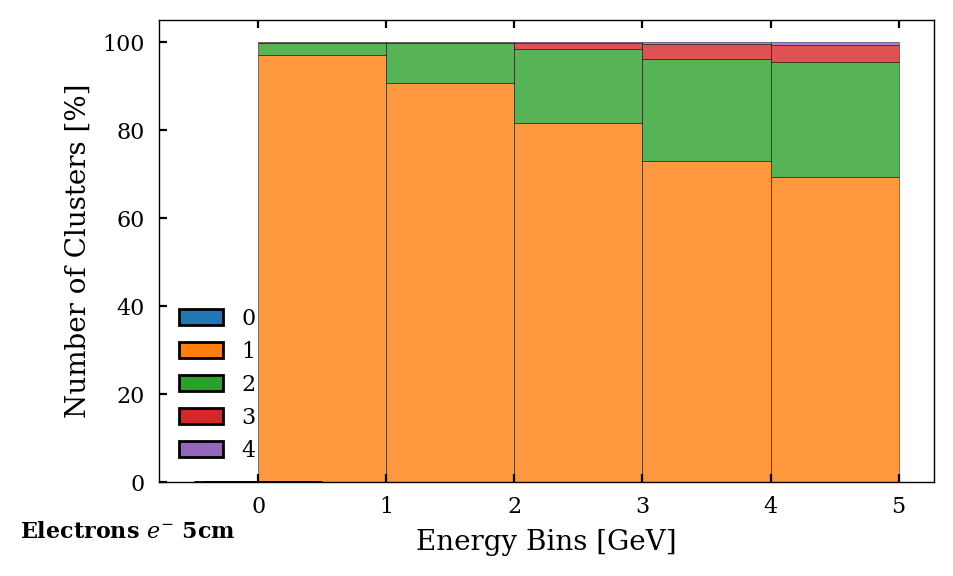

(array([0, 1, 2, 3, 4, 5]), array([6492, 2514,  797,  176,   20,    1]))
[1 2] [518  52]
[1 2 3] [322  73  24]
[1 2 3 4 5] [790 311  72   7   1]
[1 2 3 4] [633 256  60  10]
[1 2 3 4] [244 104  20   3]


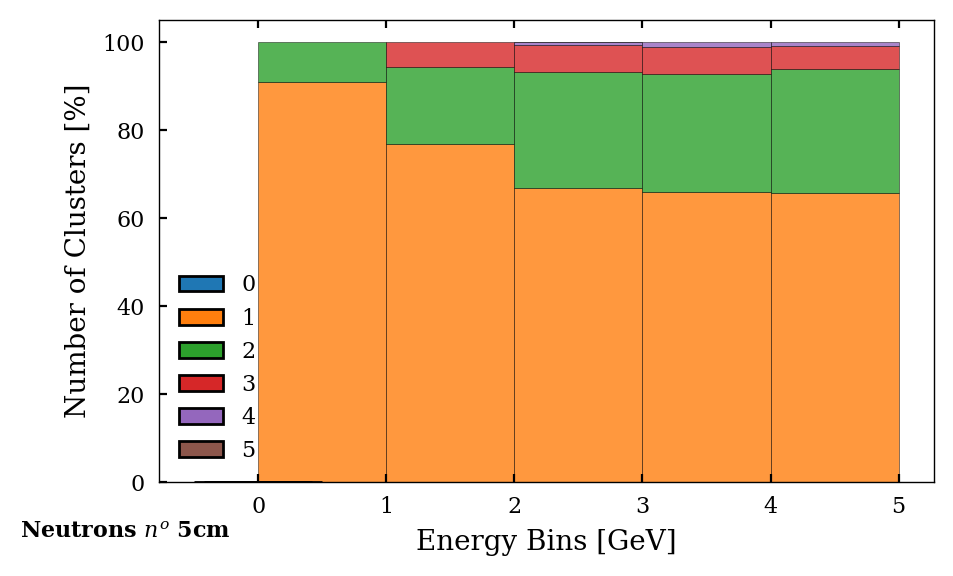

(array([0, 1, 2, 3, 4]), array([5489, 3509,  878,  118,    6]))
[1 2] [361  10]
[1 2 3] [345  33   2]
[1 2 3] [967 220  19]
[1 2 3 4] [1036  324   49    3]
[1 2 3 4] [643 235  38   2]


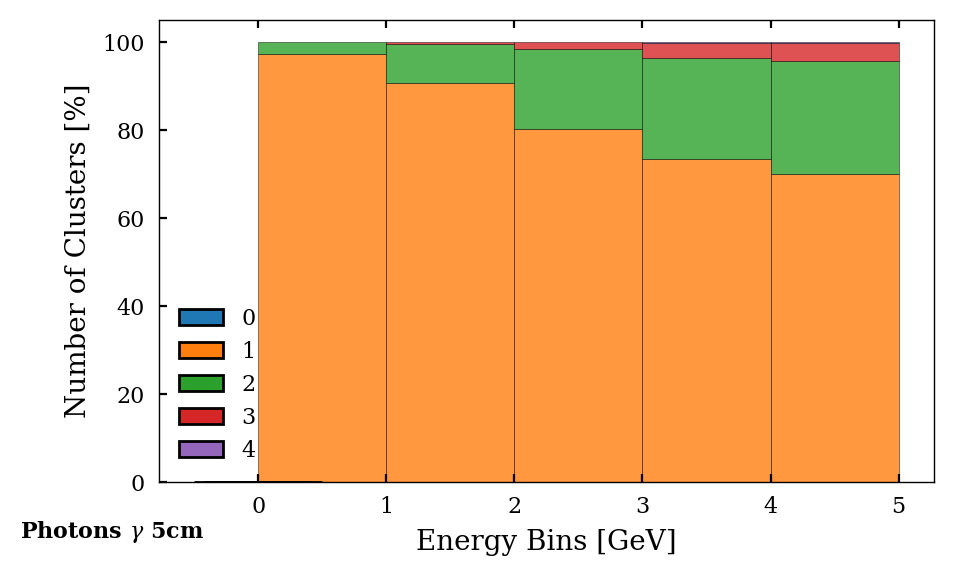

(array([0, 1, 2, 3, 4, 5, 6]), array([4943, 3332, 1299,  324,   90,   11,    1]))
[1 2 3] [491  46   4]
[1 2 3 4 5] [391 133  23   6   4]
[1 2 3 4 5] [1291  502  137   36    2]
[1 2 3 4 5 6] [843 451 120  31   4   1]
[1 2 3 4 5] [308 161  38  17   1]


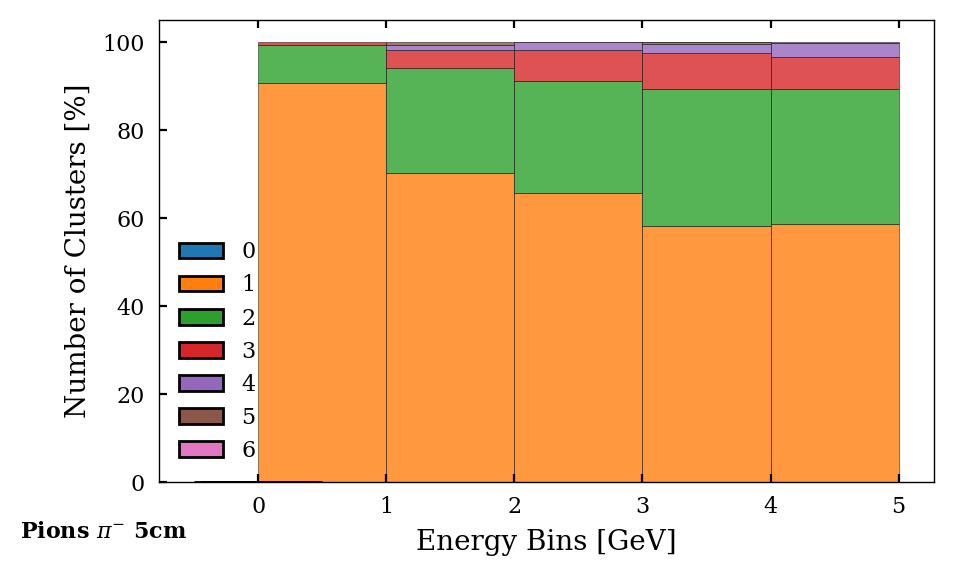

(array([0, 1, 2, 3, 4, 5, 7]), array([5420, 3167, 1063,  275,   63,   11,    1]))
[1 2 3] [378  38   7]
[1 2 3 4 5] [342  99  27   6   1]
[1 2 3 4 5] [1159  438  105   24    5]
[1 2 3 4 5] [947 343  96  22   4]
[1 2 3 4 5 7] [338 144  40  11   1   1]


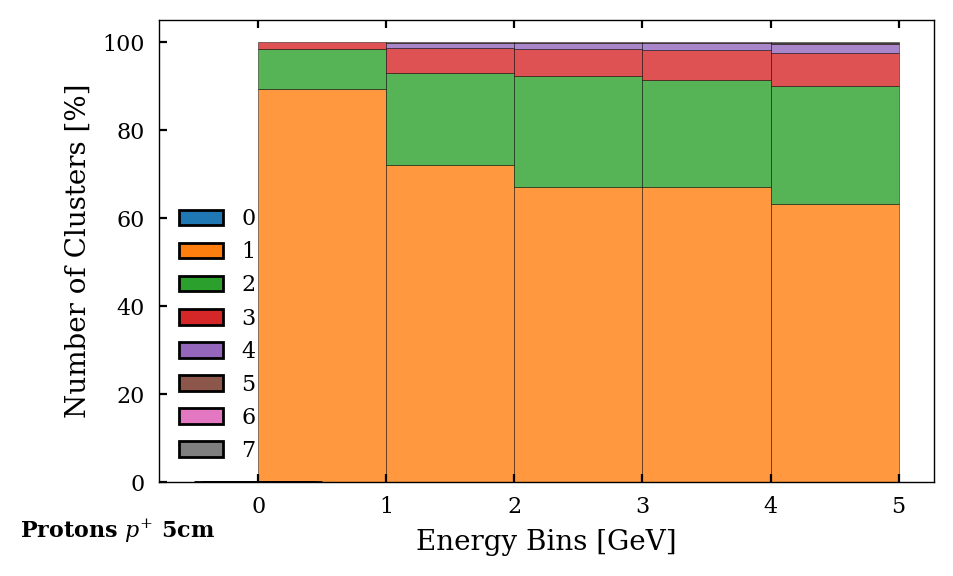

In [22]:
plot_cluster_count(particles_dict_5cm, 5, 'tab10')

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12]), array([  23, 1453, 2052, 2180, 1894, 1296,  691,  250,  121,   34,    4,
          1,    1]))
[1] [18]
[1 2 3 4] [67 19  5  2]
[1 2 3 4] [189 115  38   7]
[1 2 3 4 5] [279 209  78  20   3]
[1 2 3 4 5] [202 199  86  39   6]


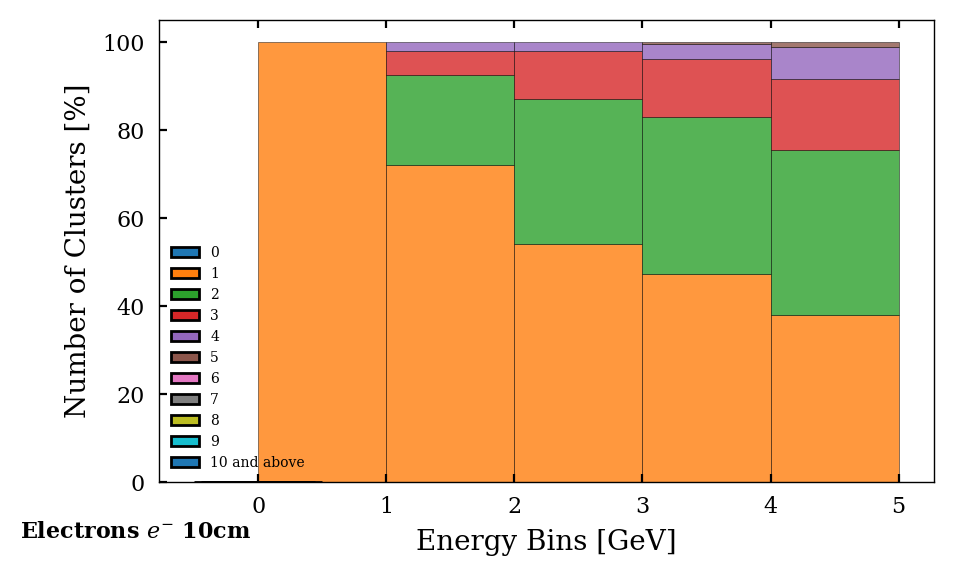

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21]), array([ 262,  847, 1058, 1144, 1119, 1152, 1112,  909,  754,  580,  417,
        260,  169,   92,   51,   32,   22,   10,    7,    1,    1,    1]))
[1 2 3 4 5 6 7 8 9] [215 112  56  17  13   3   1   1   1]
[ 1  2  3  4  5  6  7  8  9 10 13] [64 95 62 35 22 13  8  4  1  2  1]
[ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16] [154 164 144 116  87  60  39  25  22  13   6   2   2   1   1   1]
[ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 20] [148 182 182 167 138  96  88  54  33  27  20  13   2   5   3   6   1]
[ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18] [ 97 153 158 137 124 113  79  68  46  38  24  16   9   8   4   1   2   1]


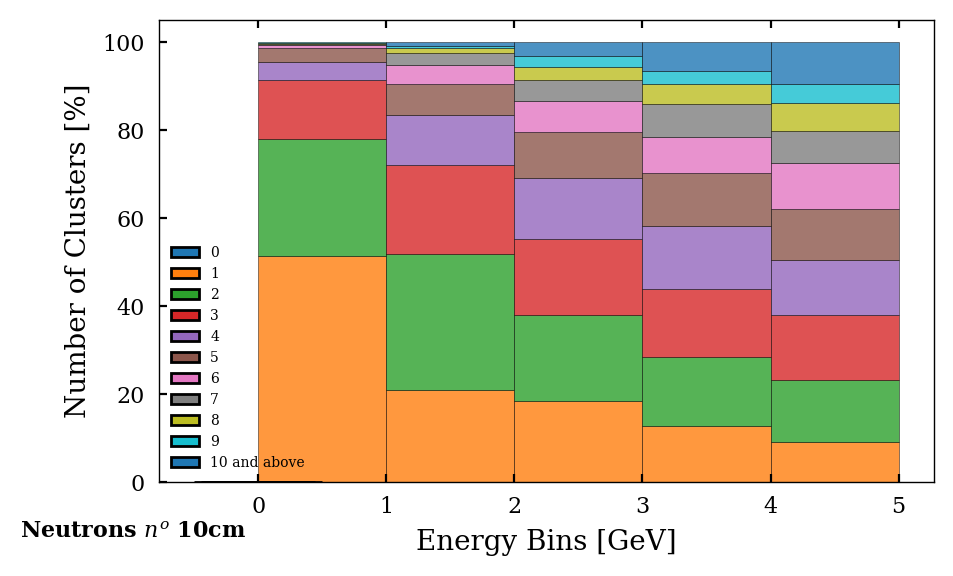

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13]), array([  21, 1338, 2047, 2223, 1899, 1274,  718,  313,  117,   37,   10,
          1,    1,    1]))
[1 2 3] [12  3  1]
[1 2 3 4] [70 25  5  3]
[1 2 3 4 5] [176 105  37   6   1]
[1 2 3 4 5] [260 208  87  20   3]
[1 2 3 4 5 6] [184 163  75  25   5   2]


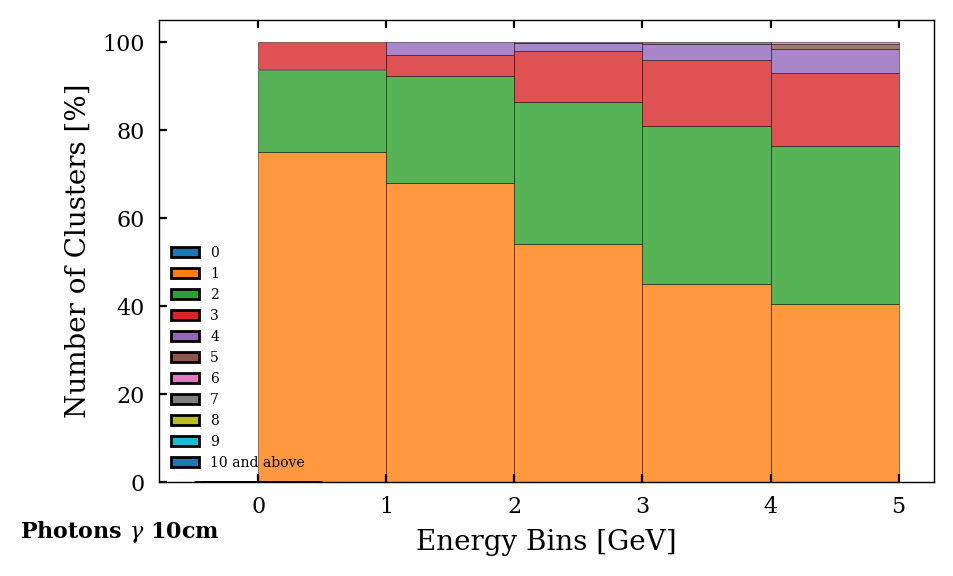

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 29]), array([  81,  888, 1111, 1201, 1245, 1235, 1132,  929,  729,  542,  363,
        216,  153,   88,   42,   27,    9,    2,    4,    1,    1,    1]))
[1 2 3 4 5] [35 20  4  2  2]
[1 2 3 4 5 6 7 8] [44 32 21 17  3  4  2  1]
[ 1  2  3  4  5  6  7  8  9 10 11 13] [160 169 102  67  34  21  17   5   2   2   1   1]
[ 1  2  3  4  5  6  7  8  9 10 11 12 13 16] [226 226 165 133  96  59  29  23   9   9   4   4   2   1]
[ 1  2  3  4  5  6  7  8  9 10 11 12 13 15] [151 176 157 127 119  79  55  39  20  11   6   5   3   3]


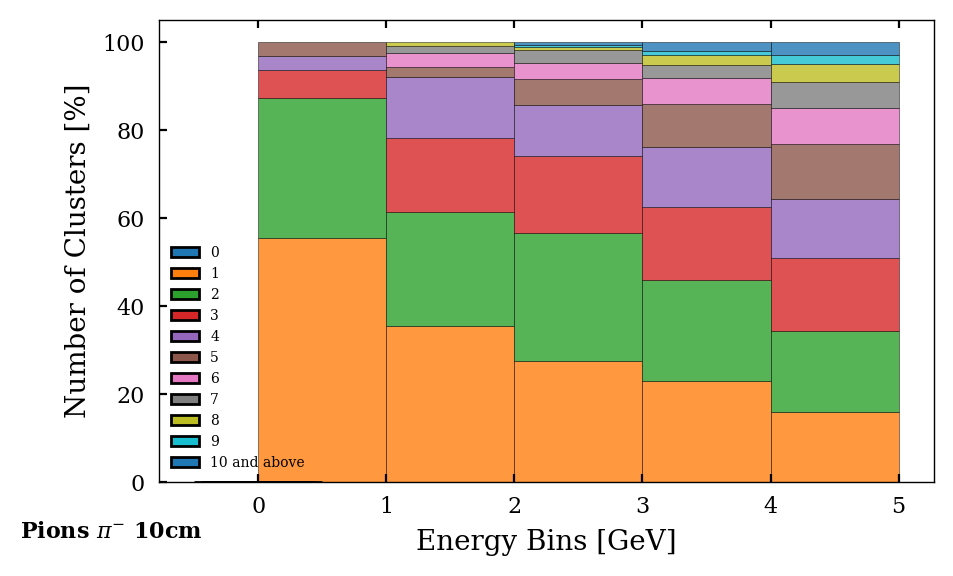

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17]), array([ 331, 1571, 1033, 1123, 1172, 1075, 1023,  805,  651,  453,  333,
        192,  114,   66,   31,   17,    6,    4]))
[1 2 3 4 5] [30 12  6  2  2]
[ 1  2  3  4  5  6  8 10] [24 24 19 14  6  3  2  1]
[ 1  2  3  4  5  6  7  8  9 10 12 13] [200  91  69  46  27  17  14  10   6   4   2   1]
[ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 17] [371 164 124 104  69  51  30  35  14   8  12   3   3   1   1   1]
[ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 16] [289 143 119 114  86  71  57  26  20  27  15   7   5   1   1]


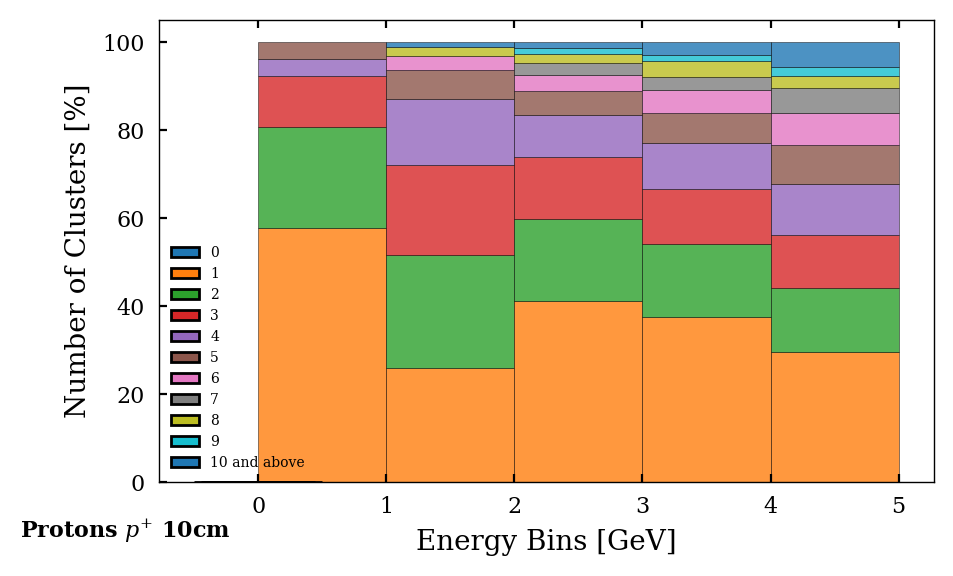

In [23]:
plot_cluster_count(particles_dict_10cm, 10, 'tab10', fs=5)

(array([0, 1, 2, 3, 4, 5, 6, 7]), array([   7, 5987, 3016,  817,  149,   22,    1,    1]))
[1 2 3] [11  2  1]
[1 2 3] [75  9  1]
[1 2 3] [283  39   1]
[1 2 3 4] [488  83   4   1]
[1 2 3 4] [371  93  15   1]


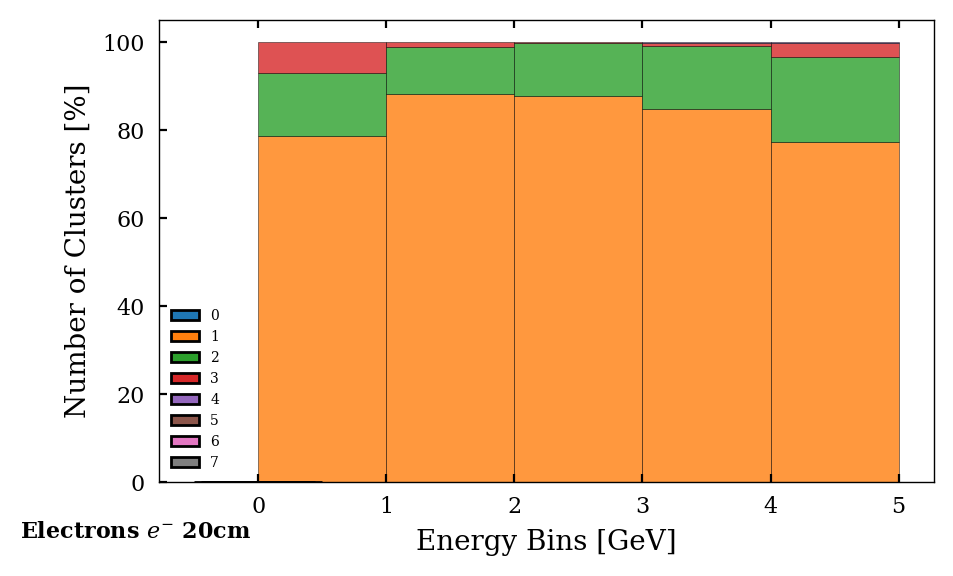

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14]), array([  76, 1282, 1755, 1764, 1612, 1333,  884,  561,  316,  203,  106,
         58,   27,   14,    9]))
[1 2 3 4 5 6] [149  94  34  17   8   1]
[ 1  2  3  4  5  6  7 10 11] [86 79 60 30 19  7  4  1  1]
[ 1  2  3  4  5  6  7  8  9 10] [179 174 143  89  53  33   9   8   3   4]
[ 1  2  3  4  5  6  7  8  9 10 11 12 13 14] [192 199 147 113  94  52  31  13  16   2   1   1   1   1]
[ 1  2  3  4  5  6  7  8  9 10 11 12] [139 176 148 105  70  53  29  11  13   4   2   5]


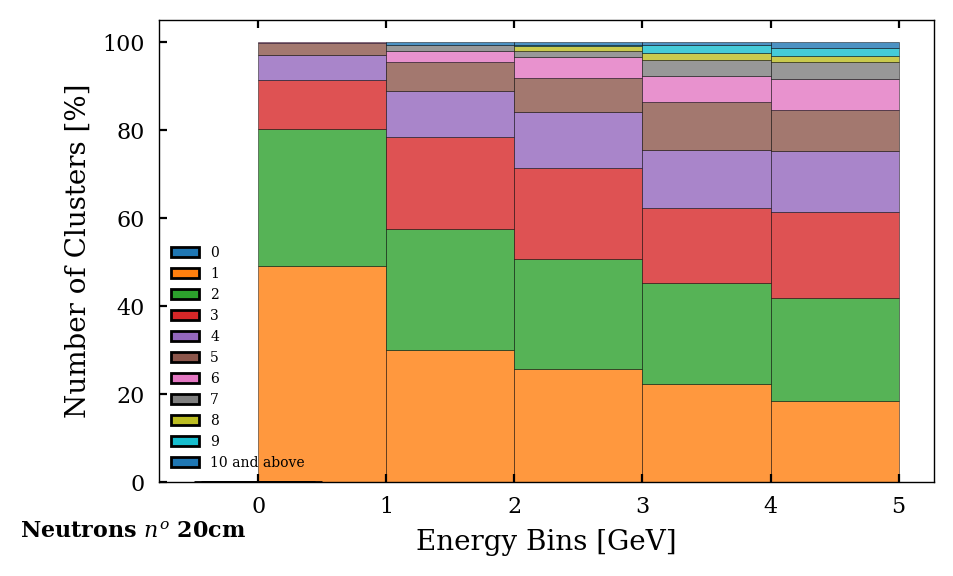

(array([0, 1, 2, 3, 4, 5, 6, 7]), array([   2, 5926, 3096,  808,  138,   25,    4,    1]))
[1] [14]
[1 2] [87  8]
[1 2 3] [269  37   3]
[1 2 3 4] [445 105   6   2]
[1 2 3 4 5] [333  80   8   1   1]


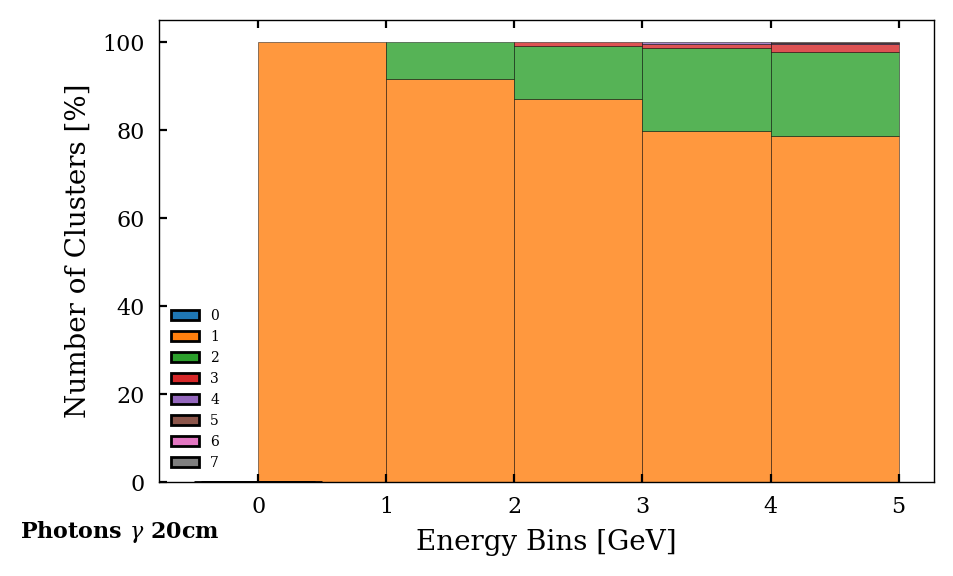

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15]), array([  34, 1849, 2064, 1921, 1514, 1118,  688,  386,  195,  125,   63,
         24,   13,    3,    2,    1]))
[1 2 3] [35 20  6]
[1 2 3 4 5 6 9] [45 30 18  1  4  4  1]
[ 1  2  3  4  5  6  7  8 10] [189 129  60  28  11   5   4   3   1]
[ 1  2  3  4  5  6  7  8  9 12] [306 193 100  65  30  16   3   3   4   1]
[ 1  2  3  4  5  6  7  8  9 10 11] [221 182 138  72  38  24  19   5   4   1   1]


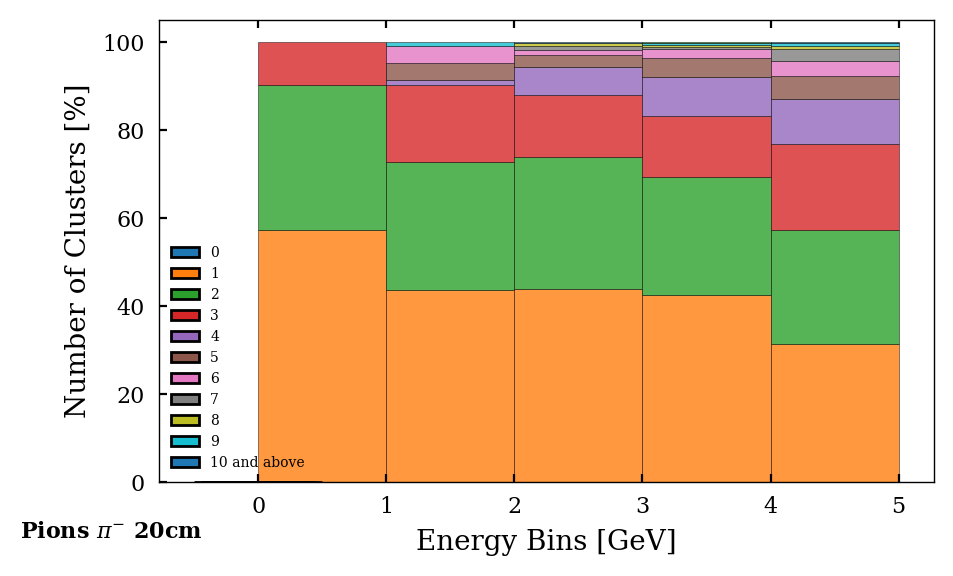

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15]), array([ 306, 2226, 1697, 1761, 1402, 1008,  672,  413,  259,  141,   67,
         33,    5,    6,    1,    3]))
[1 2 3 4] [16  7  5  2]
[1 2 3 4 5 6 8] [23 16 10  9  4  1  1]
[1 2 3 4 5 6 7 8 9] [204  78  45  35  19  10   3   4   1]
[ 1  2  3  4  5  6  7  8  9 10 11] [390 114 102  73  40  19   5   6   1   2   1]
[ 1  2  3  4  5  6  7  8  9 10 11 15] [312 115 103  64  43  33  16  14   9   5   1   1]


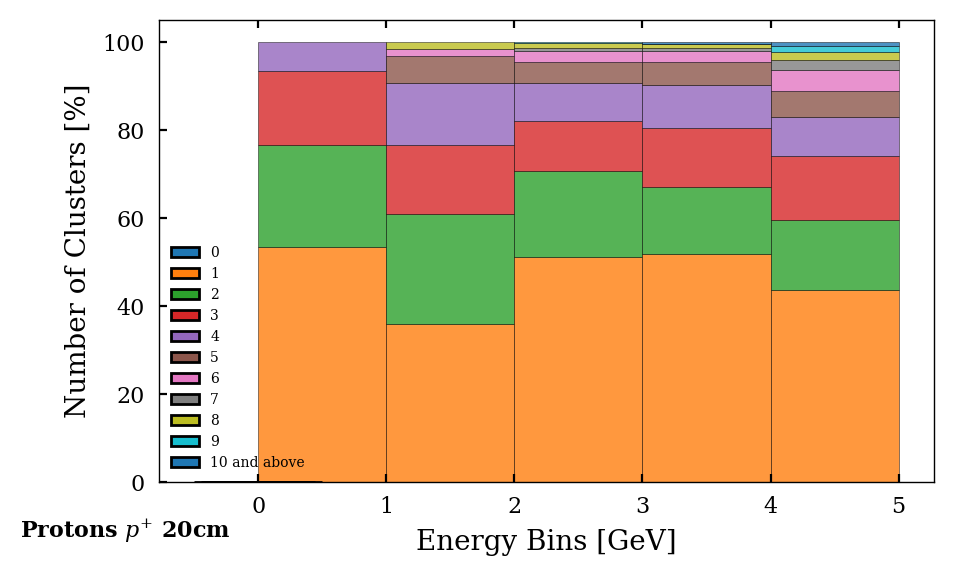

In [24]:
plot_cluster_count(particles_dict_20cm, 20, 'tab10', fs=5)

## Unclassified Hits

In [25]:
def plot_cluster_null(particles_dict=particles_dict_5cm, min_sep=5, figsize=(5, 3), cmap='tab10', max_cluster_count=10, fs=8, ylim=100):

    fig, ax = plt.subplots(figsize=figsize, dpi=200)
    ax.grid(visible=False)
    labels_list = []
    num_null_list = []
    for i, particles in enumerate(particles_name_list):
        # for each particle in the list
        # energy bins
        from matplotlib import cm
    
        cluster_count = particles_dict[particles].get('PFHcalClusters_count')
        
        num_null = list(cluster_count).count(0)
        num_total_part = len(cluster_count)
        ax.bar(i, num_null/num_total_part*100, ec='black', lw=0.2, align='center', width=1, alpha=0.8)

        num_null_list.append(num_null)
        labels_list.append(labels_dict[particles])

    # legend
    ax.bar(0, 0, color='None', ec='None', label='Number of events w/o cluster')

    # labels
    rects = ax.patches
    for rect, label in zip(rects, num_null_list):
        height = rect.get_height()
        ax.text(rect.get_x() + rect.get_width() / 2, height, label, ha="center", va="bottom")

    ax.annotate(text=f'{min_sep}cm samples', xy=(-50, -20), xycoords='axes points', fontsize=8, weight='bold')
    ax.set_ylim(0, ylim)
    ax.set_xticks(range(len(particles_name_list)))
    ax.set_xticklabels(labels_list, fontsize=8)
    ax.set_xlabel('Particles', fontsize=10)
    ax.set_ylabel('% of hits unclassified', fontsize=10)
    ax.legend()

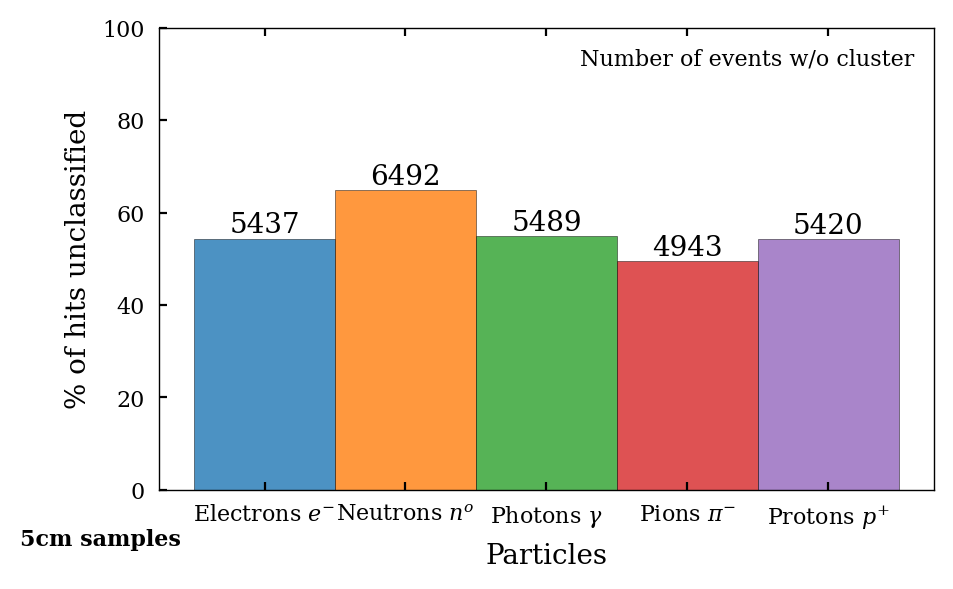

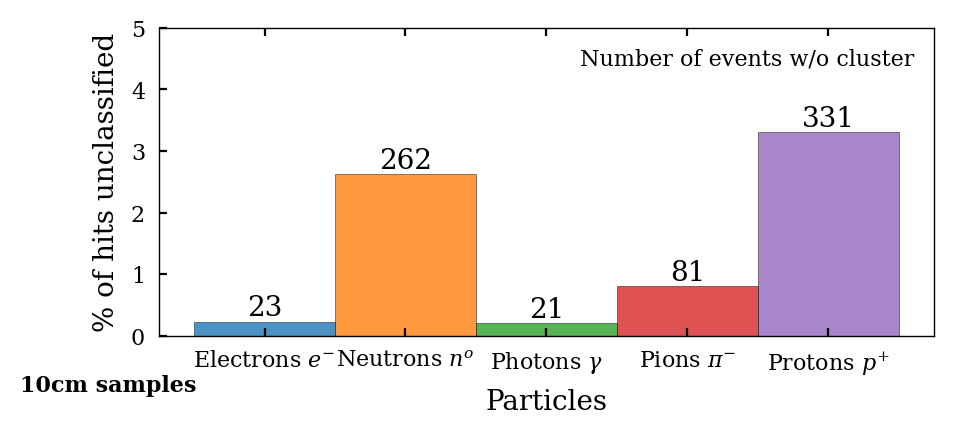

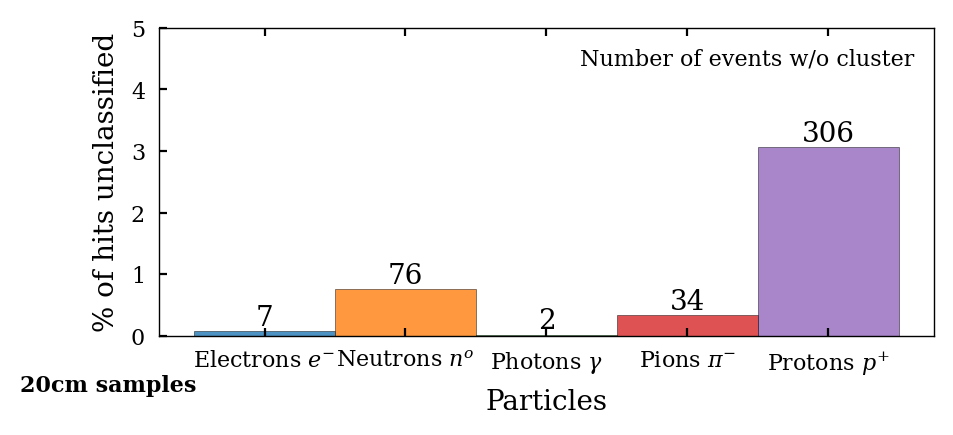

In [26]:
plot_cluster_null(particles_dict_5cm, 5, cmap='tab10', fs=5)
plot_cluster_null(particles_dict_10cm, 10, (5, 2), 'tab10', fs=5, ylim=5)
plot_cluster_null(particles_dict_20cm, 20, (5, 2), 'tab10', fs=5, ylim=5)

## Energy Proportion of Cluster / Calorimeter

In [27]:
list(particles_dict_5cm['neutrons'].propdict.keys())

['EcalTotalEnergy',
 'HcalTotalEnergy',
 'PFEcalClusters_hitIDs',
 'PFEcalClusters_energy',
 'PFEcalClusters_nHits',
 'PFEcalClusters_centroidX',
 'PFEcalClusters_centroidY',
 'PFEcalClusters_centroidZ',
 'PFEcalClusters_rmsX',
 'PFEcalClusters_rmsY',
 'PFEcalClusters_rmsZ',
 'PFEcalClusters_DXDZ',
 'PFEcalClusters_DYDZ',
 'PFEcalClusters_errDXDZ',
 'PFEcalClusters_errDYDZ',
 'PFEcalClusters_hitX_lc',
 'PFEcalClusters_hitX',
 'PFEcalClusters_hitY_lc',
 'PFEcalClusters_hitY',
 'PFEcalClusters_hitZ_lc',
 'PFEcalClusters_hitZ',
 'PFEcalClusters_hitE_lc',
 'PFEcalClusters_hitE',
 'PFHcalClusters_hitIDs',
 'PFHcalClusters_strips_per_layer',
 'PFHcalClusters_strips',
 'PFHcalClusters_energy_lc',
 'PFHcalClusters_energy',
 'PFHcalClusters_seedenergy',
 'PFHcalClusters_nHits_lc',
 'PFHcalClusters_nHits',
 'PFHcalClusters_n2D',
 'PFHcalClusters_layer',
 'PFHcalClusters_strips_even_layer',
 'PFHcalClusters_strips_odd_layer',
 'PFHcalClusters_centroidX_lc',
 'PFHcalClusters_centroidX',
 'PFHcalCl

In [28]:
# good cluster definition
def calc_stats(particles_dict=particles_dict_5cm, good_thres=5):
    for particles in particles_name_list:
        # energy bins
        from matplotlib import cm
    
        # cluster count
        hits_count = {}
        clusters_count = []  # all clusters count
        good_clusters_count = []  # good cluster count
        for clusters_nhits in particles_dict[particles].get('PFHcalClusters_nHits'):
            if np.any(clusters_nhits):
                num_clusters = len(clusters_nhits)
                num_good_clusters = np.sum(clusters_nhits >= good_thres)
                good_clusters_count.append(num_good_clusters)
                clusters_count.append(num_clusters)
                try:
                    hits_count[num_clusters] = np.hstack([hits_count[num_clusters], clusters_nhits])
                except KeyError:
                    hits_count[num_clusters] = []
            else:
                good_clusters_count.append(0)  # no clusters
                clusters_count.append(0)
        # number of clusters
        particles_dict[particles].propdict['PFHcalClusters_hits_count'] = hits_count
        print(list(particles_dict[particles].get('PFHcalClusters_hits_count').keys()))
        # all clusters
        particles_dict[particles].propdict['PFHcalClusters_count'] = np.array(clusters_count)
        print(np.unique(particles_dict[particles].get('PFHcalClusters_count'), return_counts=True))
        # good clusters
        particles_dict[particles].propdict['PFHcalClusters_good_count'] = np.array(good_clusters_count)
        print(np.unique(particles_dict[particles].get('PFHcalClusters_good_count'), return_counts=True))

calc_stats(particles_dict_5cm, good_thres=1)
calc_stats(particles_dict_10cm, good_thres=5)
calc_stats(particles_dict_20cm, good_thres=8)

[1, 2, 3, 4]
(array([0, 1, 2, 3, 4]), array([5437, 3562,  878,  109,   14]))
(array([0, 1, 2, 3, 4]), array([5437, 3562,  878,  109,   14]))
[2, 3, 1, 4, 5]
(array([0, 1, 2, 3, 4, 5]), array([6492, 2514,  797,  176,   20,    1]))
(array([0, 1, 2, 3, 4, 5]), array([6492, 2514,  797,  176,   20,    1]))
[1, 2, 3, 4]
(array([0, 1, 2, 3, 4]), array([5489, 3509,  878,  118,    6]))
(array([0, 1, 2, 3, 4]), array([5489, 3509,  878,  118,    6]))
[1, 3, 2, 4, 5, 6]
(array([0, 1, 2, 3, 4, 5, 6]), array([4943, 3332, 1299,  324,   90,   11,    1]))
(array([0, 1, 2, 3, 4, 5, 6]), array([4943, 3332, 1299,  324,   90,   11,    1]))
[1, 2, 3, 4, 5, 7]
(array([0, 1, 2, 3, 4, 5, 7]), array([5420, 3167, 1063,  275,   63,   11,    1]))
(array([0, 1, 2, 3, 4, 5, 7]), array([5420, 3167, 1063,  275,   63,   11,    1]))
[2, 6, 4, 3, 5, 7, 1, 8, 9, 11, 10, 12]
(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12]), array([  23, 1453, 2052, 2180, 1894, 1296,  691,  250,  121,   34,    4,
          1,   

In [29]:
def plot_cluster_erg(particles_dict=particles_dict_5cm, min_sep=5, figsize=(5, 3), cmap='tab10', max_cluster_count=10, fs=8, ylim=100, text=False):

    fig1, ax1 = plt.subplots(figsize=figsize, dpi=200)
    fig2, ax2 = plt.subplots(figsize=figsize, dpi=200)
    ax1.grid(visible=False)
    ax2.grid(visible=False)
    labels_list = []
    hcal_max_erg_list = []
    for i, particles in enumerate(particles_name_list):
        # for each particle in the list
        # energy bins
        from matplotlib import cm

        hcal_max_erg = particles_dict[particles].get('PFHcalClusters_energy_lc')
        hcal_sum_erg = [np.nansum(_) for _ in particles_dict[particles].get('PFHcalClusters_energy')]
        hcal_tot_erg = particles_dict[particles].get('HcalTotalEnergy')

        avg_frac_max = np.nanmean(hcal_max_erg/hcal_tot_erg)
        std_frac_max = np.nanstd(hcal_max_erg/hcal_tot_erg)

        avg_frac_sum = np.nanmean(hcal_sum_erg/hcal_tot_erg)
        std_frac_sum = np.nanstd(hcal_sum_erg/hcal_tot_erg)
        
        ax1.bar(i, avg_frac_max * 100, yerr=std_frac_max*100, ec='black', lw=0.2, capsize=10, error_kw={'elinewidth':0.5,'capthick':0.5}, align='center', width=1, alpha=0.8)
        ax1.text(i, 1, f'{avg_frac_max * 100:.1f}', ha="center", va="bottom", fontsize=10)
        hcal_max_erg_list.append(f'{np.nanmean(hcal_max_erg):.2f}')
        labels_list.append(labels_dict[particles])

        ax2.bar(i, avg_frac_sum * 100, yerr=std_frac_sum*100, ec='black', lw=0.2, capsize=10, error_kw={'elinewidth':0.5,'capthick':0.5}, align='center', width=1, alpha=0.8)
        ax2.text(i, 1, f'{avg_frac_sum * 100:.1f}', ha="center", va="bottom", fontsize=10)


    # labels
    if text:
         # legend
        ax1.bar(0, 0, color='None', ec='None', label='HCal Energy')
        rects = ax1.patches
        for rect, label in zip(rects, hcal_max_erg_list):
            height = rect.get_height()
            ax1.text(rect.get_x() + rect.get_width() / 2, height, label, ha="center", va="bottom")
        ax1.legend()

    ax1.annotate(text=f'{min_sep}cm samples', xy=(-50, -20), xycoords='axes points', fontsize=8, weight='bold')
    ax1.set_ylim(0, ylim)
    ax1.set_xticks(range(len(particles_name_list)))
    ax1.set_xticklabels(labels_list, fontsize=8)
    ax1.set_xlabel('Particles', fontsize=10)
    ax1.set_ylabel('% of energy in lead clust', fontsize=10)

    ax2.annotate(text=f'{min_sep}cm samples', xy=(-50, -20), xycoords='axes points', fontsize=8, weight='bold')
    ax2.set_ylim(0, ylim)
    ax2.set_xticks(range(len(particles_name_list)))
    ax2.set_xticklabels(labels_list, fontsize=8)
    ax2.set_xlabel('Particles', fontsize=10)
    ax2.set_ylabel('% of energy in ALL clust', fontsize=10)
    

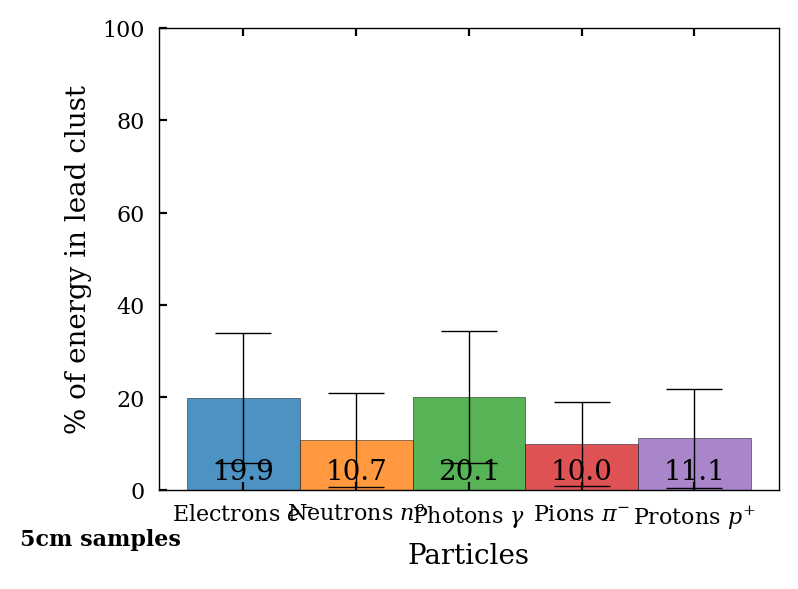

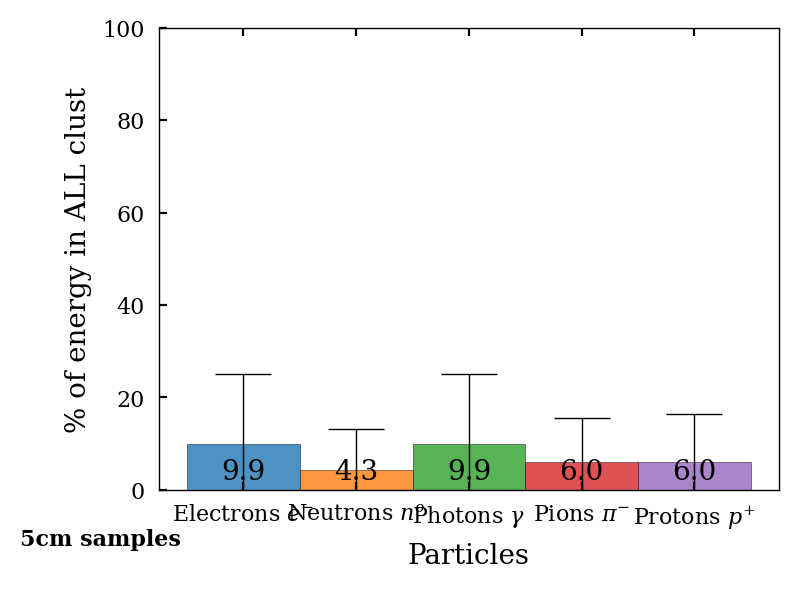

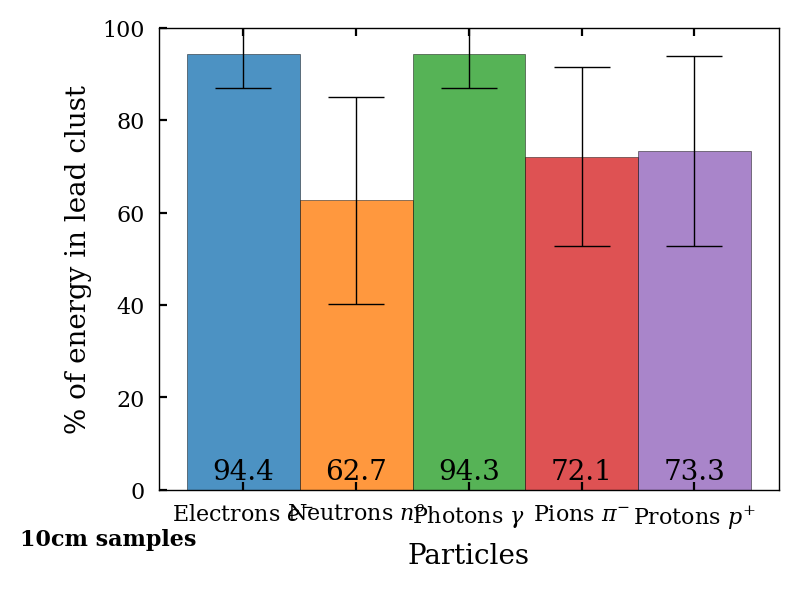

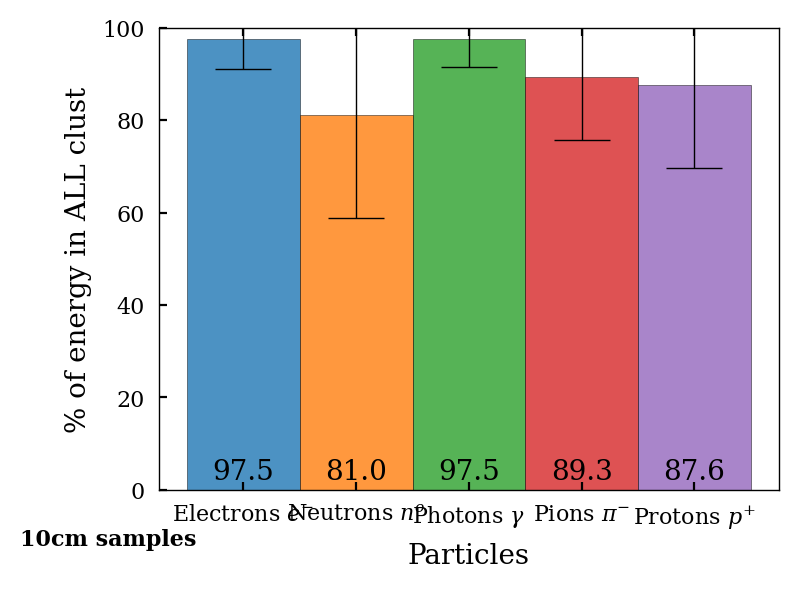

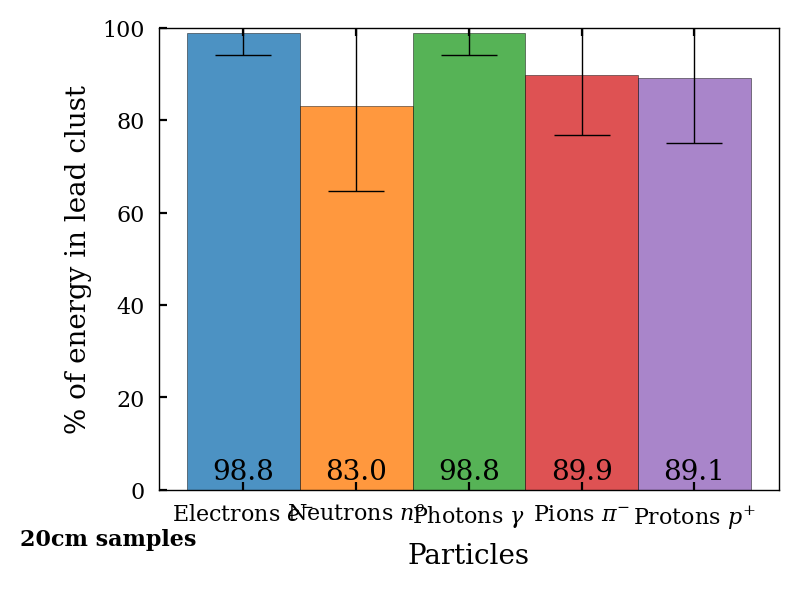

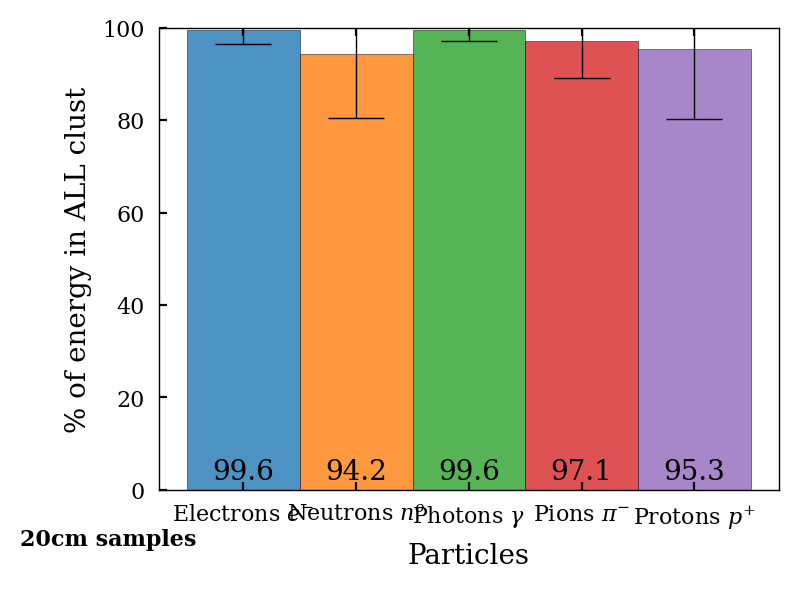

In [30]:
plot_cluster_erg(particles_dict_5cm, 5, (4, 3), 'tab10', fs=5)
plot_cluster_erg(particles_dict_10cm, 10, (4, 3), 'tab10', fs=5)
plot_cluster_erg(particles_dict_20cm, 20, (4, 3), 'tab10', fs=5)

## Spatial Distributions

In [31]:
list(particles_dict_5cm['electrons'].propdict.keys())

['EcalTotalEnergy',
 'HcalTotalEnergy',
 'PFEcalClusters_hitIDs',
 'PFEcalClusters_energy',
 'PFEcalClusters_nHits',
 'PFEcalClusters_centroidX',
 'PFEcalClusters_centroidY',
 'PFEcalClusters_centroidZ',
 'PFEcalClusters_rmsX',
 'PFEcalClusters_rmsY',
 'PFEcalClusters_rmsZ',
 'PFEcalClusters_DXDZ',
 'PFEcalClusters_DYDZ',
 'PFEcalClusters_errDXDZ',
 'PFEcalClusters_errDYDZ',
 'PFEcalClusters_hitX_lc',
 'PFEcalClusters_hitX',
 'PFEcalClusters_hitY_lc',
 'PFEcalClusters_hitY',
 'PFEcalClusters_hitZ_lc',
 'PFEcalClusters_hitZ',
 'PFEcalClusters_hitE_lc',
 'PFEcalClusters_hitE',
 'PFHcalClusters_hitIDs',
 'PFHcalClusters_strips_per_layer',
 'PFHcalClusters_strips',
 'PFHcalClusters_energy_lc',
 'PFHcalClusters_energy',
 'PFHcalClusters_seedenergy',
 'PFHcalClusters_nHits_lc',
 'PFHcalClusters_nHits',
 'PFHcalClusters_n2D',
 'PFHcalClusters_layer',
 'PFHcalClusters_strips_even_layer',
 'PFHcalClusters_strips_odd_layer',
 'PFHcalClusters_centroidX_lc',
 'PFHcalClusters_centroidX',
 'PFHcalCl

In [32]:
# global variables
ECALZ_MIN = 247.9
ECALZ_MAX = 749.1
ECALW = 520

BHCALZ_MIN = 879
SHCALZ_MIN = 240
SHCALZ_MAX = 800
SHCALX_MIN = 500
SHCALX_MAX = 1500

# the style used for the confidence range plots
# 0: area
# 1: error bars
style = 1

def plot_ecal_box(ax, label=False):
    box_label = 'ECal' if label else ''
    ax.add_patch(plt.Rectangle((ECALZ_MIN, -ECALW/2), ECALZ_MAX - ECALZ_MIN, ECALW, fc=(0, 0, 0, 0), ec='red', label=box_label))
    
def plot_hcal_box(ax, label=False):
    box_label = 'HCal' if label else ''
    ax.add_patch(plt.Rectangle((SHCALZ_MIN, SHCALX_MIN), SHCALZ_MAX - SHCALZ_MIN, SHCALX_MAX - SHCALX_MIN, fc=(0, 0, 0, 0), ec='red', label=box_label))
    ax.add_patch(plt.Rectangle((SHCALZ_MIN, -SHCALX_MAX), SHCALZ_MAX - SHCALZ_MIN, SHCALX_MAX - SHCALX_MIN, fc=(0, 0, 0, 0), ec='red', label=box_label))
    ax.axvline(x=BHCALZ_MIN, lw=1, ls='--', color='red', label=box_label)

# plot the cluster distribution
def plot_cluster_dist(particles_dict=particles_dict_5cm, min_sep=5, spec_part=None, ipart=None, xory='x', # particle parameters
                      factor=10, length=50, extend=False, xlim=3000, ylim=1000, # line parameters
                      plot_track=False, plot_ecal=False, plot_hcal=True, plot_energy=False, angle_label=True, # plotting booleans
                      cmap='tab20', track_color='black', ecal_color='slateblue', hcal_color='orange'):  # color parameters
    from matplotlib.patches import Polygon
    from matplotlib import cm
    # for each particle
    for particles_name in particles_name_list:
        if spec_part and particles_name not in spec_part:
            continue
        i = ipart
        # get parameters
        particles = particles_dict[particles_name]
        if xory == 'x':
            track_Px = particles.get('PFCandidates_trackPx')
            track_posX = particles.get('PFCandidates_posEcalX')
            ecal_clusterX = particles.get('PFEcalClusters_centroidX')
            ecal_clusterEX = particles.get('PFEcalClusters_rmsX') * ecal_clusterX
            hcal_clusterX = particles.get('PFHcalClusters_centroidX')
            hcal_clusterEX = particles.get('PFHcalClusters_rmsX')
            hcal_clusterDXDZ = particles.get('PFHcalClusters_DXDZ')
            hcal_hitsX = particles.get('PFHcalClusters_hitX')
        else:
            track_Px = particles.get('PFCandidates_trackPy')
            track_posX = particles.get('PFCandidates_posEcalY')
            ecal_clusterX = particles.get('PFEcalClusters_centroidY')
            ecal_clusterEX = particles.get('PFEcalClusters_rmsY') * ecal_clusterX
            hcal_clusterX = particles.get('PFHcalClusters_centroidY')
            hcal_clusterEX = particles.get('PFHcalClusters_rmsY')
            hcal_clusterDXDZ = particles.get('PFHcalClusters_DYDZ')
            hcal_hitsX = particles.get('PFHcalClusters_hitY')
            
        cluster_count = particles.get('PFHcalClusters_count')
        track_Pz = particles.get('PFCandidates_trackPz')
        ecal_clusterZ = particles.get('PFEcalClusters_centroidZ')
        ecal_clusterEZ = particles.get('PFEcalClusters_rmsZ') * ecal_clusterX
        ecal_clusterDXDZ = particles.get('PFEcalClusters_DXDZ')
        hcal_clusterZ = particles.get('PFHcalClusters_centroidZ')
        hcal_clusterEZ = particles.get('PFHcalClusters_rmsZ')
        hcal_hitsZ = particles.get('PFHcalClusters_hitZ')
        
        # get the index of max number of clusters
        if not i:
            i = np.argmax(cluster_count)

        print(cluster_count[i])
        
        # setting up plot
        fig, ax = plt.subplots(figsize=(5, 5), dpi=200)
        full_cmap = cm.get_cmap(cmap)
        color_list = [full_cmap(i)[:3] for i in range(full_cmap.N)]*10

        """Track Momentum"""
        if plot_track:
            # add triangle
            Pz = track_Pz[i]/factor
            Px = track_Px[i]/factor
            xy = [[ECALZ_MIN, track_posX[i]], [ECALZ_MIN+Pz, track_posX[i]], [ECALZ_MIN+Pz, track_posX[i]+Px]]
            momentum = Polygon(xy=xy, fc='None', ec=track_color, ls='--', label='Track')
            ax.add_patch(momentum)
            # add annotation
            track_angle = np.rad2deg(np.arctan(Px/Pz))
            ax.text(ECALZ_MIN+Pz/2, ECALW/2+20, fr'Track {track_angle:.2f} $\deg$', color=track_color, ha='center')
            # extend
            if extend:
                ax.axline(xy1=[ECALZ_MIN, track_posX[i]], xy2=[ECALZ_MIN + Pz * 10, track_posX[i] + Px * 10], lw=1, ls='--', alpha=0.5, color=track_color)
        
        """Ecal Box"""
        if plot_ecal:
            ecal_z = ecal_clusterZ[i]
            ecal_x = ecal_clusterX[i]
            ecal_ez = ecal_clusterEZ[i]
            ecal_ex = ecal_clusterEX[i]
            plotting.error_bar(fig, ax, x=ecal_z, y=ecal_x, xerr=[[ecal_ez], [ecal_ez]], yerr=[[ecal_ex], [ecal_ex]], color=ecal_color, fmt='--', label='ECal Cluster')
            # the angle
            ecal_tan = ecal_clusterDXDZ[i]
            ecal_angle = np.rad2deg(np.arctan(ecal_tan))
            ax.plot([ecal_z+ecal_ez, ecal_z-ecal_ez], [ecal_x+ecal_ez*ecal_tan, ecal_x-ecal_ez*ecal_tan], color=ecal_color, lw=1, ls='--', alpha=0.8)
            if angle_label:
                ax.text(ecal_z, -ECALW/2-80, fr'ECal {ecal_angle:.2f} $\deg$', color=ecal_color, ha='center')
            # extend
            if extend:
                ax.axline(xy1=[ecal_z, ecal_x], xy2=[ecal_z + length * 10, ecal_x + length * 10 * ecal_tan], lw=1, ls='--', alpha=0.5, color=ecal_color)
        
        """Hcal Box"""
        if plot_hcal:
            hcal_z = hcal_clusterZ[i]
            hcal_x = hcal_clusterX[i]
            hcal_ez = hcal_clusterEZ[i]
            hcal_ex = hcal_clusterEX[i]
            hcal_tan = hcal_clusterDXDZ[i]

            hcal_hx = hcal_hitsX[i]
            hcal_hz = hcal_hitsZ[i]
            
            # plot the hits
            markers = ['.', 'o', 'v', '^', '<', '>', '8', 's', 'p', 'h', 'H', 'D', 'd', 'P'] * 10
            i = 0
            for hcal_hx, hcal_hz in zip(hcal_hx, hcal_hz):
                ax.scatter(x=hcal_hz, y=hcal_hx, s=5, c=color_list[i], alpha=0.8, lw=1, marker=markers[i])
                i += 1
            
            # check for multiple clusters
            if np.isscalar(hcal_z):
                hcal_z = [hcal_z]
                hcal_x = [hcal_x]
                hcal_ez = [hcal_ez]
                hcal_ex = [hcal_ex]
                hcal_tan = [hcal_tan]

            i = 0
            for hcal_z, hcal_x, hcal_ez, hcal_ex, hcal_tan in zip(hcal_z, hcal_x, hcal_ez, hcal_ex, hcal_tan):
                [hcal_z, hcal_x, hcal_ez, hcal_ex, hcal_tan] = [0 if not _ else _ for _ in [hcal_z, hcal_x, hcal_ez, hcal_ex, hcal_tan]]
                ax.errorbar(x=hcal_z, y=hcal_x, xerr=[[hcal_ez], [hcal_ez]], yerr=[[hcal_ex], [hcal_ex]], color=color_list[i], elinewidth=1, fmt='-', label='HCal Cluster')
                # the angle
                hcal_angle = np.rad2deg(np.arctan(hcal_tan))
                if abs(hcal_angle) > 5:
                    ax.plot([hcal_z+hcal_ez, hcal_z-hcal_ez], [hcal_x+hcal_tan*hcal_ez, hcal_x-hcal_tan*hcal_ez], color=color_list[i], lw=1, ls='--', alpha=0.8)
                    if angle_label:
                        ax.text(hcal_z, -ylim, f'{hcal_angle:.2f}', color=color_list[i], ha='center')
                    # extend
                    if extend:
                        ax.axline(xy1=[hcal_z, hcal_x], xy2=[hcal_z + length * 10, hcal_x + length * 10 * hcal_tan], lw=1, ls='--', alpha=0.5, color=color_list[i])
                i += 1
    
        """Energy"""
        if plot_energy:
            measure_ecal_energy = particles.get("PFCandidates_ecalEnergy")[i]
            measure_hcal_energy = particles.get("PFCandidates_hcalEnergy")[i]
            recon_ecal_energy = particles.get("PFCandidates_ecalEnergy_o1corr")[i]
            recon_hcal_energy = particles.get("PFCandidates_hcalEnergy_o1corr")[i]
            truth_ecal_energy = particles.get("PFTruthEcal_energy")[i]
            truth_hcal_energy = particles.get("PFTruthHcal_energy")[i]
            energy_text_x = 1490
            # ax.text(energy_text_x, -450, f'Ecal {measure_ecal_energy:.2f} MeV', ha='right')
            # ax.text(energy_text_x, -550, f'Hcal {measure_hcal_energy:.2f} MeV', ha='right')
            ax.text(energy_text_x, -650, f'Ecal Recon {recon_ecal_energy:.2f} MeV', ha='right')
            ax.text(energy_text_x, -750, f'Hcal Recon {recon_hcal_energy:.2f} MeV', ha='right')
            ax.text(energy_text_x, -850, f'Ecal Truth {truth_ecal_energy:.2f} MeV', ha='right')
            ax.text(energy_text_x, -950, f'Hcal Truth {truth_hcal_energy:.2f} MeV', ha='right')

        # axis
        ax.set_xlabel('Detector z')
        ax.set_ylabel('Detector x' if xory=='x' else 'Detector y')
        ax.set_xlim(200, xlim)
        ax.set_ylim(-ylim, ylim)
            
        # boxes
        plot_ecal_box(ax, 0)
        plot_hcal_box(ax, 0)
        ax.annotate(text=f'{min_sep}cm', xy=(-50, -20), xycoords='axes points', fontsize=8, weight='bold')
        ax.annotate(text=labels_dict[particles_name], xy=(-20, -20), xycoords='axes points', fontsize=8, weight='bold')
        # plt.legend(fontsize=10)
        plt.show()

### Figures

For each particle type, the event with the most clusters is plotted first, followed by ten more randomly selected events:

### Photons

13


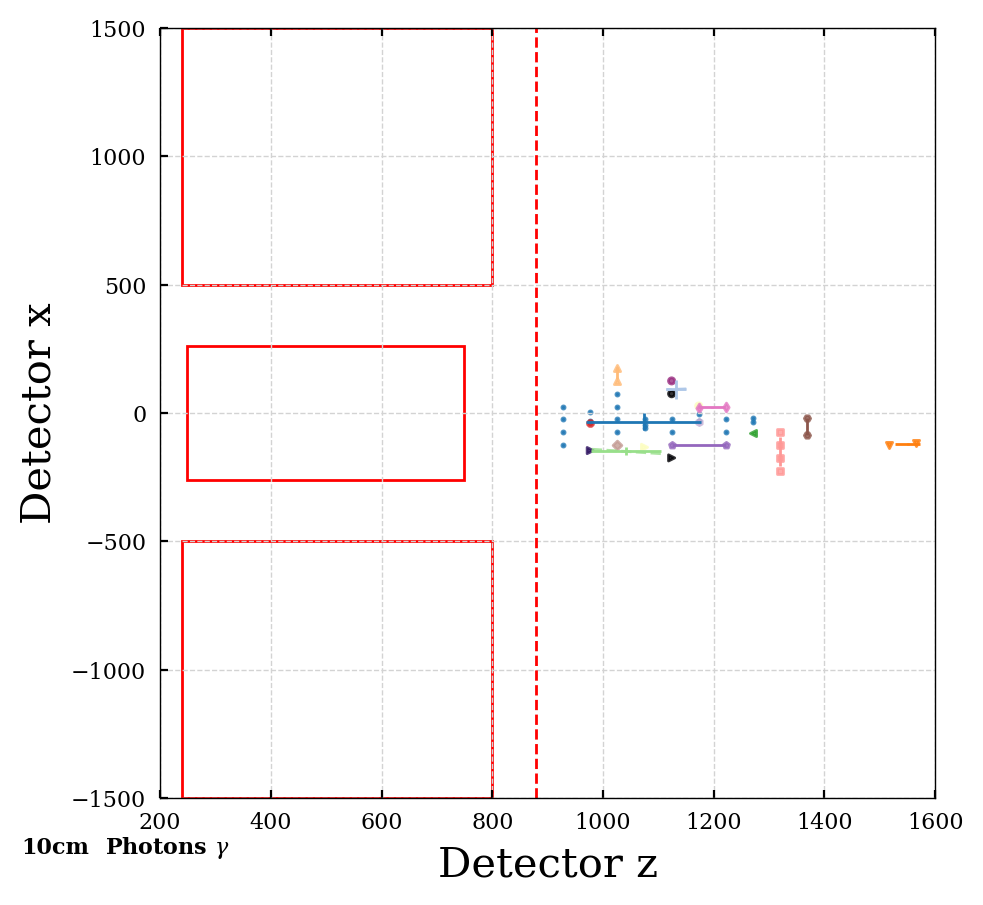

2


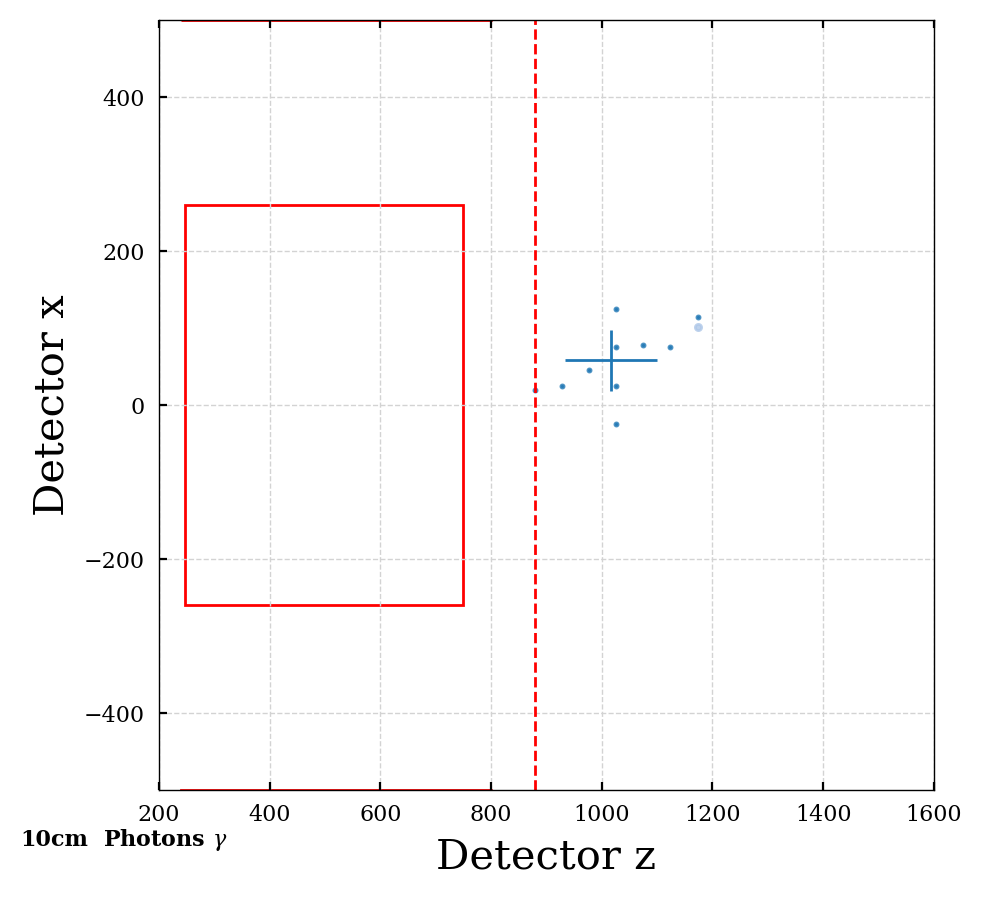

2


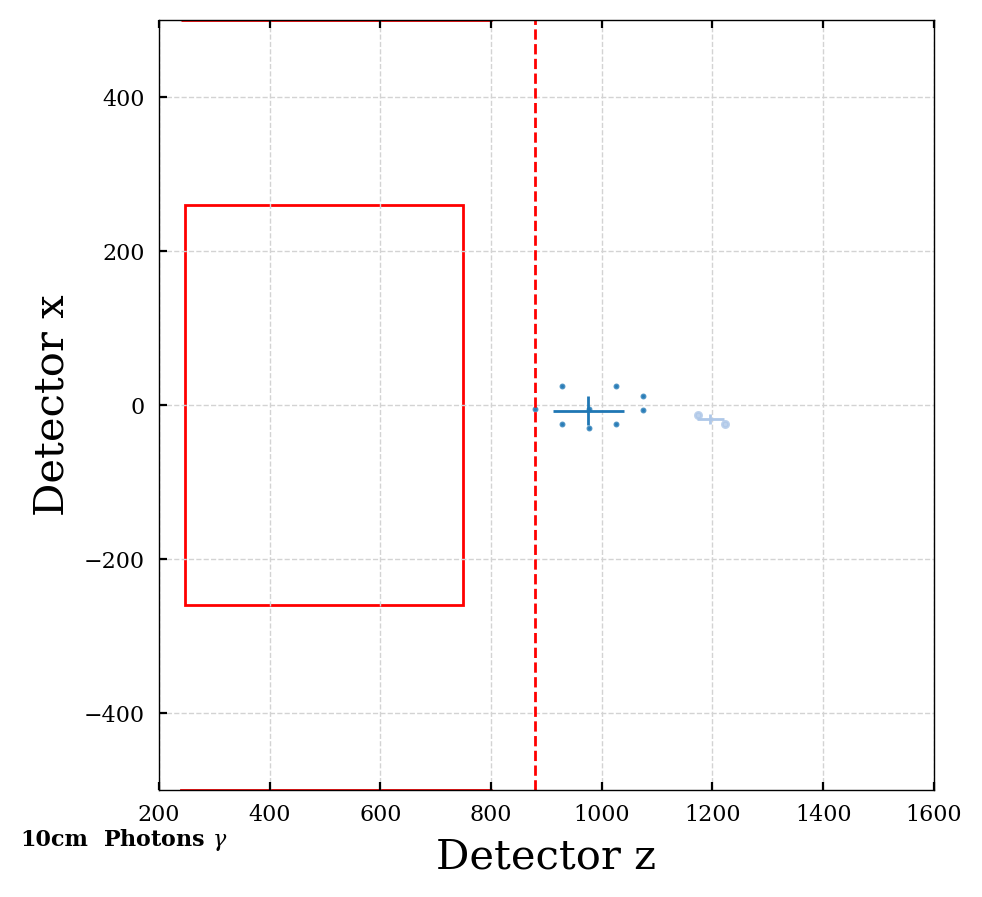

3


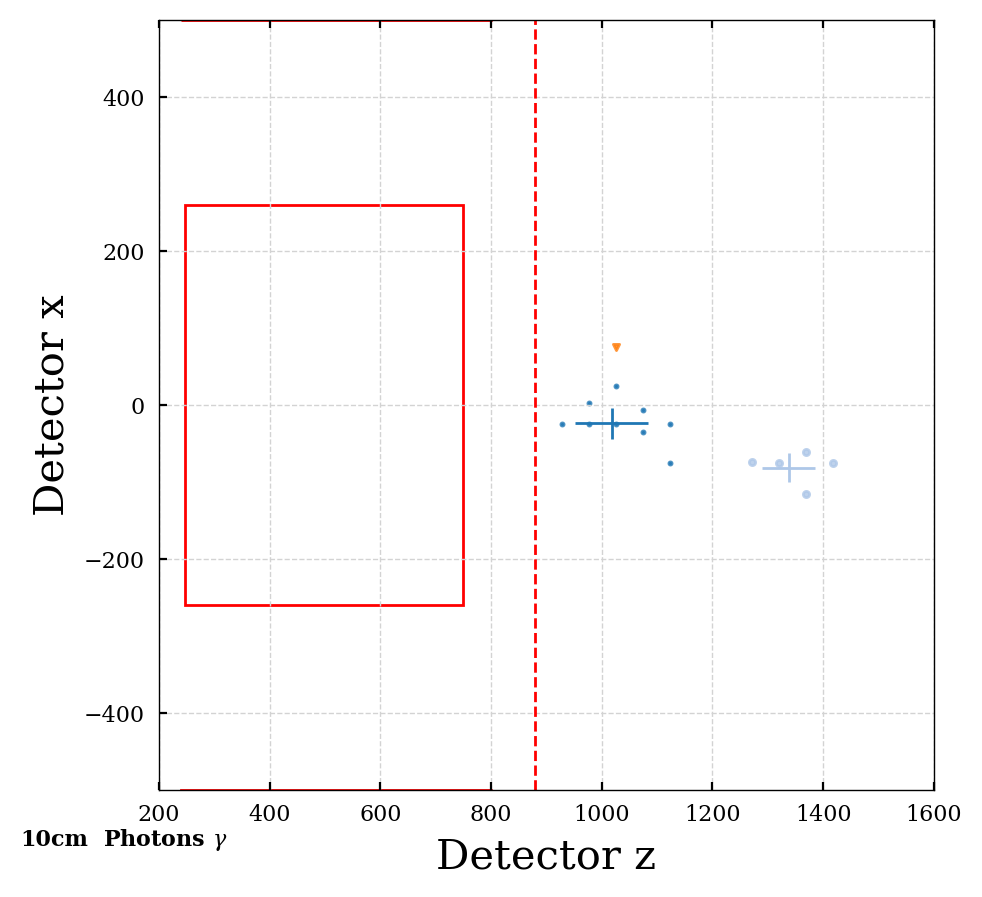

6


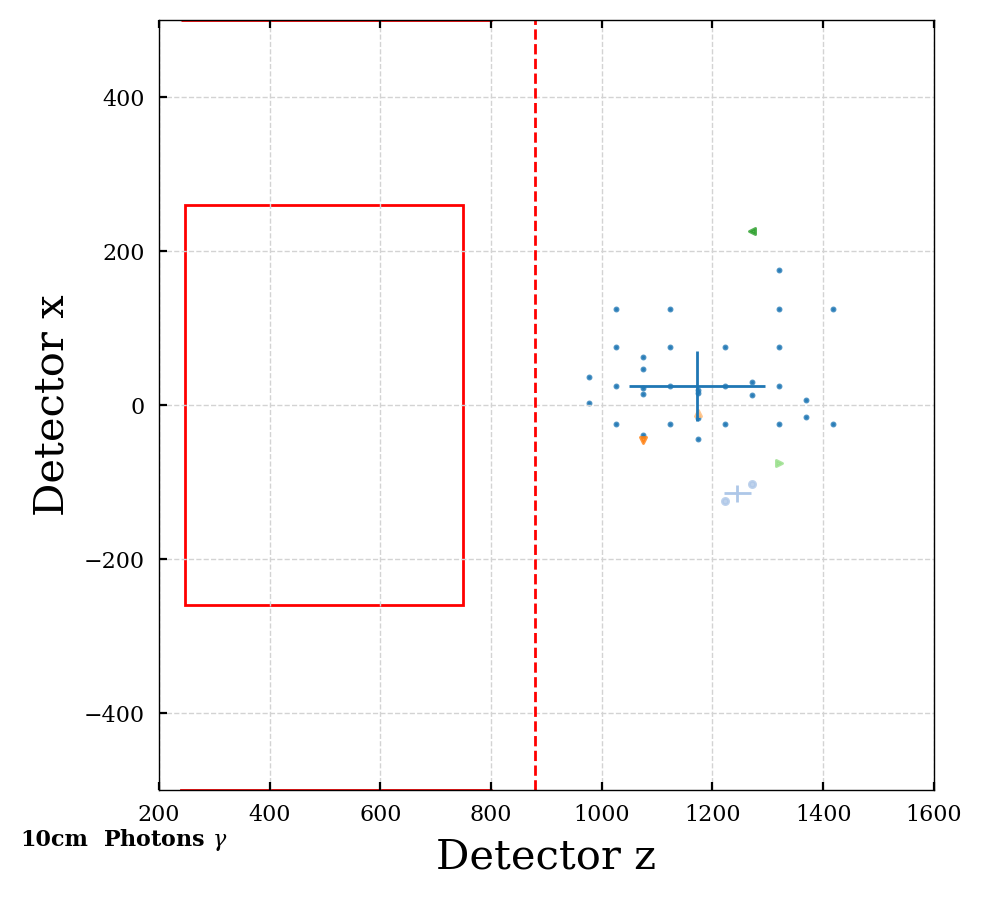

5


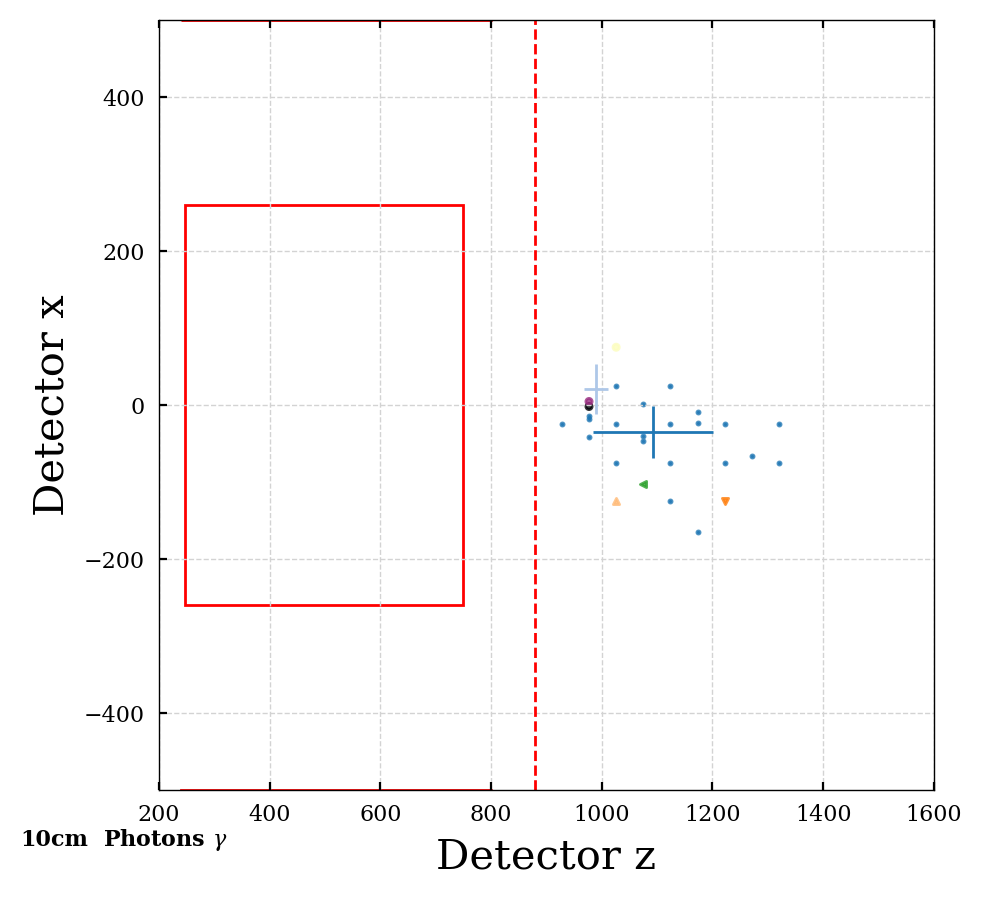

6


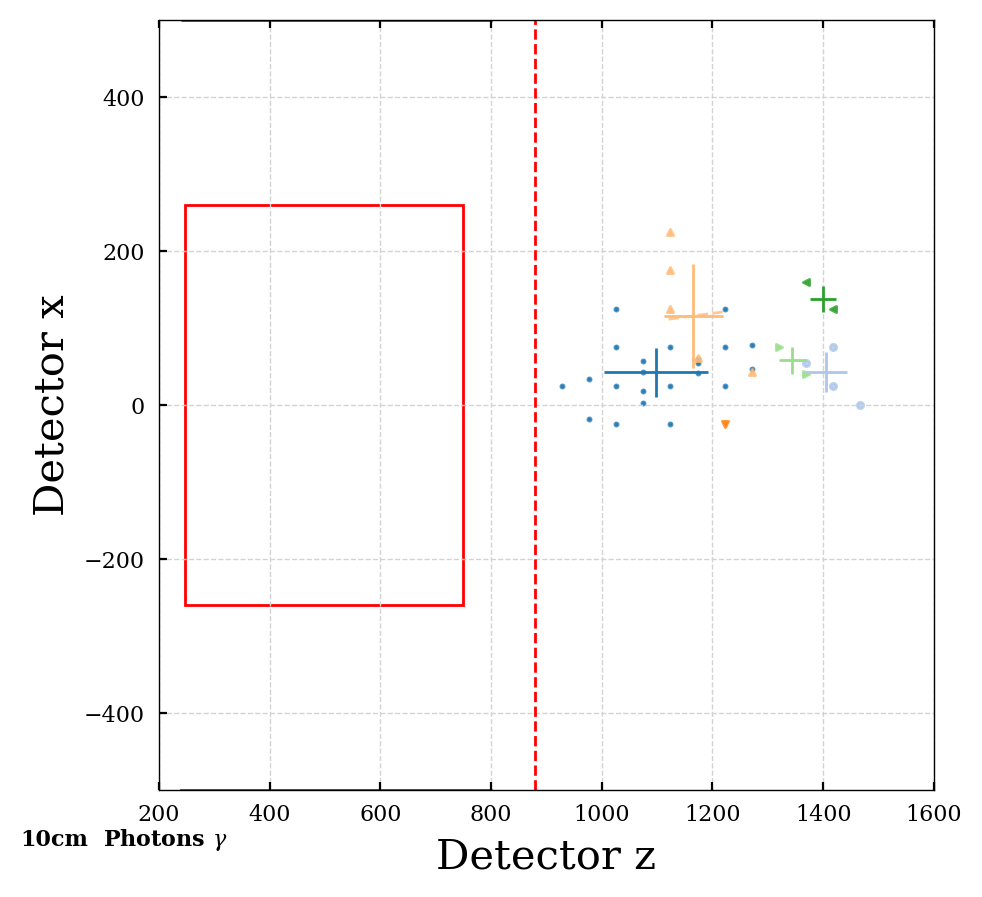

5


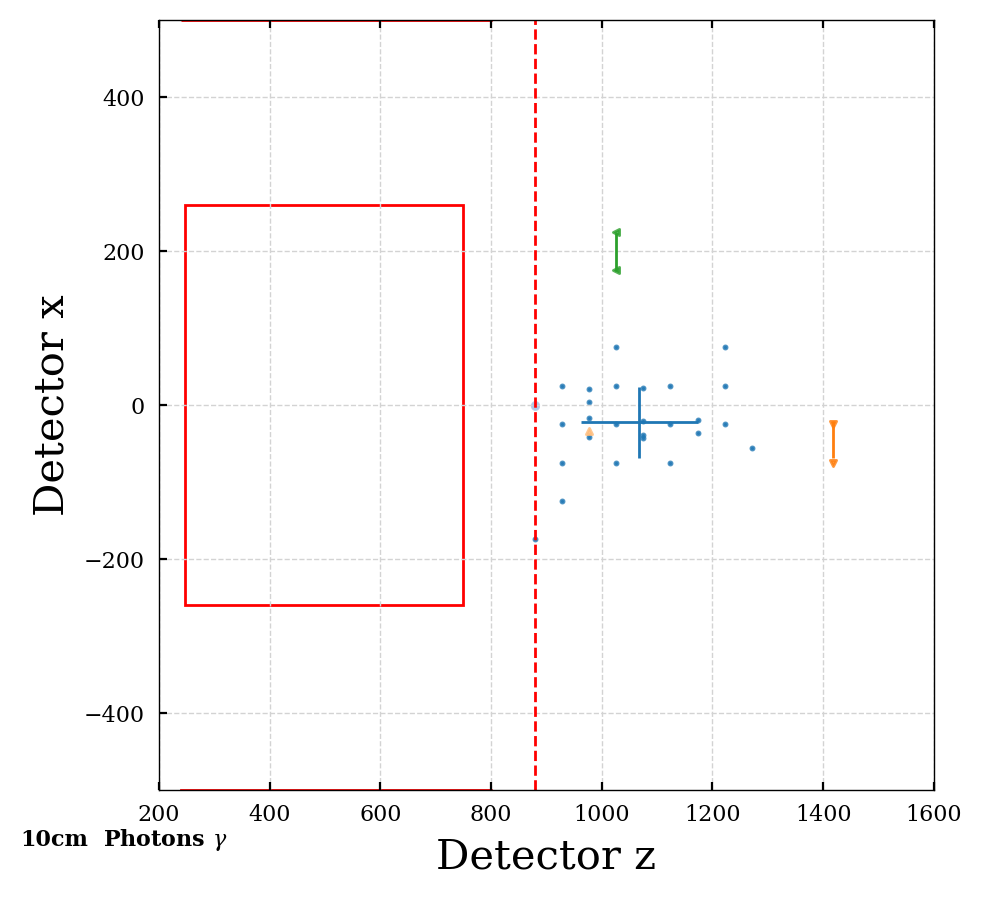

3


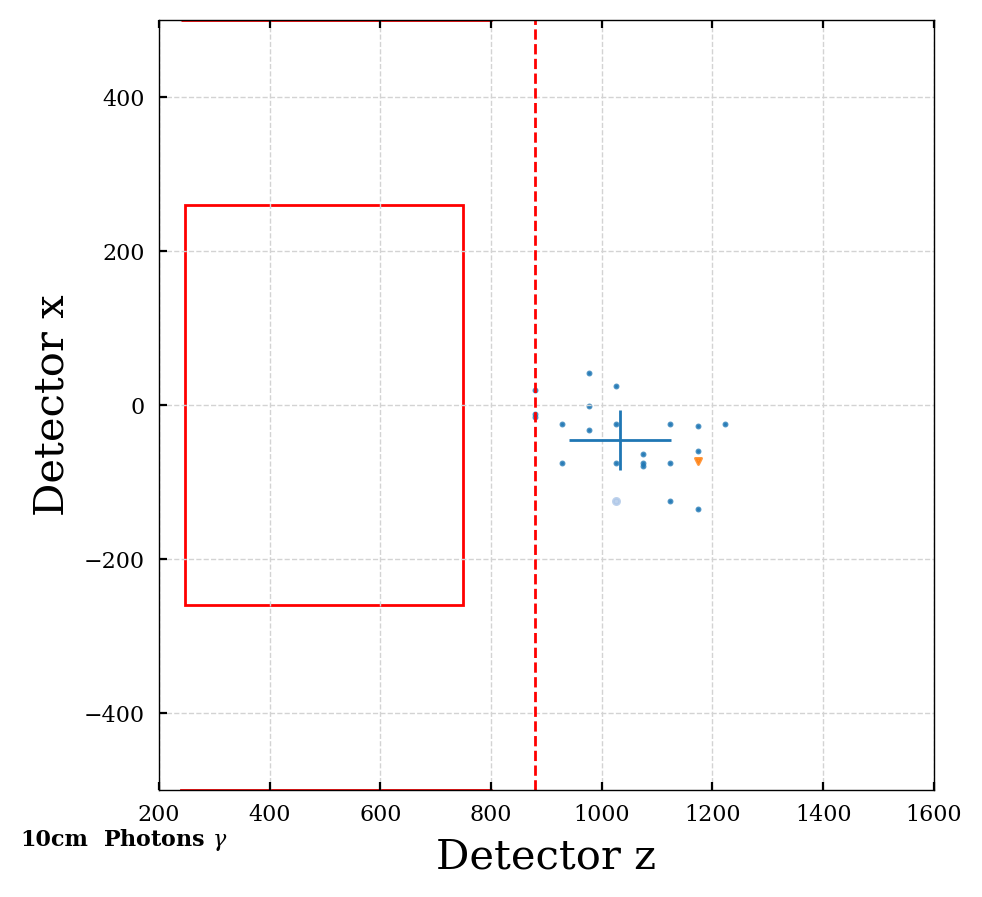

1


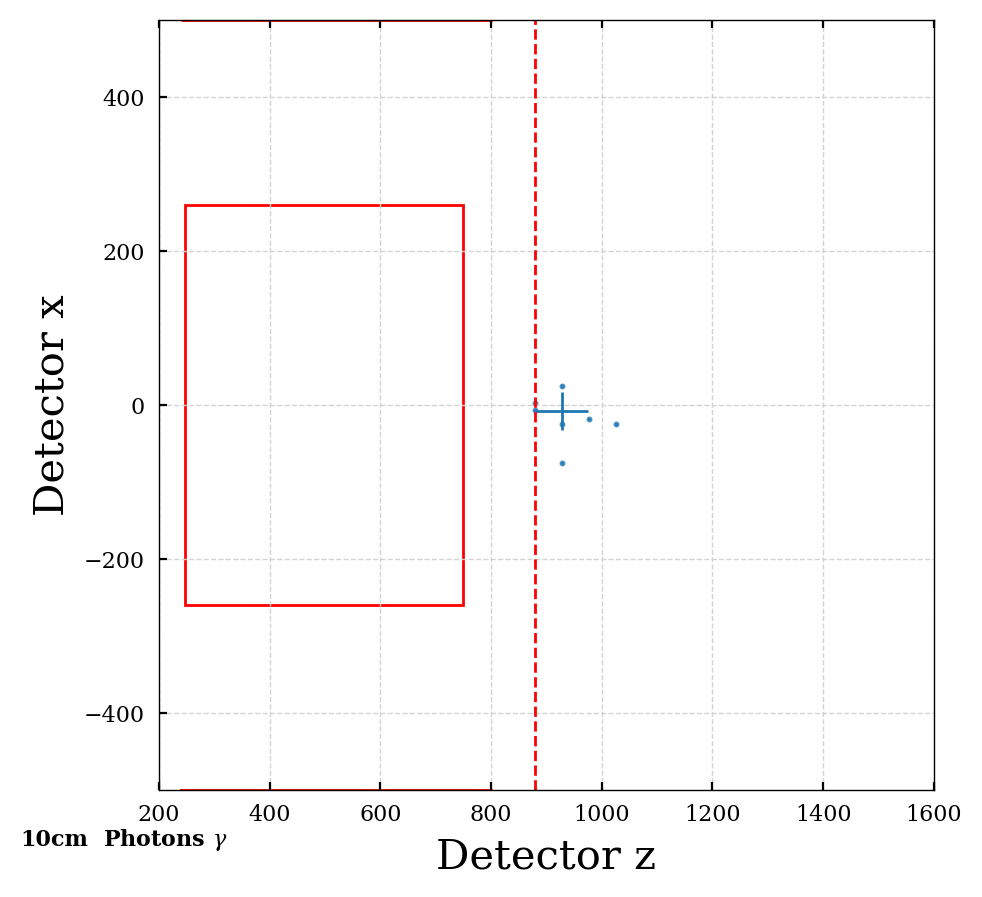

6


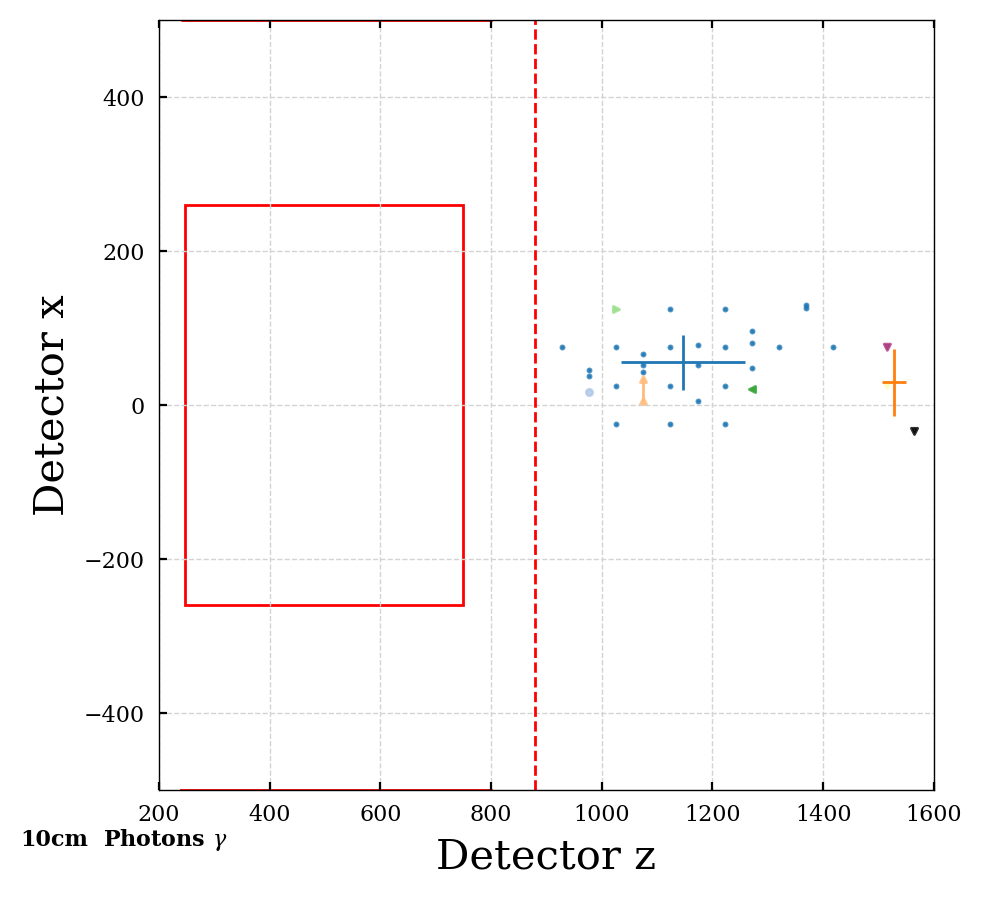

In [33]:
plot_cluster_dist(particles_dict_10cm, 10, spec_part='photons', ipart=None, xlim=1600, ylim=1500, angle_label=False)
# randomly select events
for ipart in np.random.randint(0, high=1e4, size=10, dtype=int):
    plot_cluster_dist(particles_dict_10cm, 10, spec_part='photons', ipart=ipart, xlim=1600, ylim=500, angle_label=False)

7


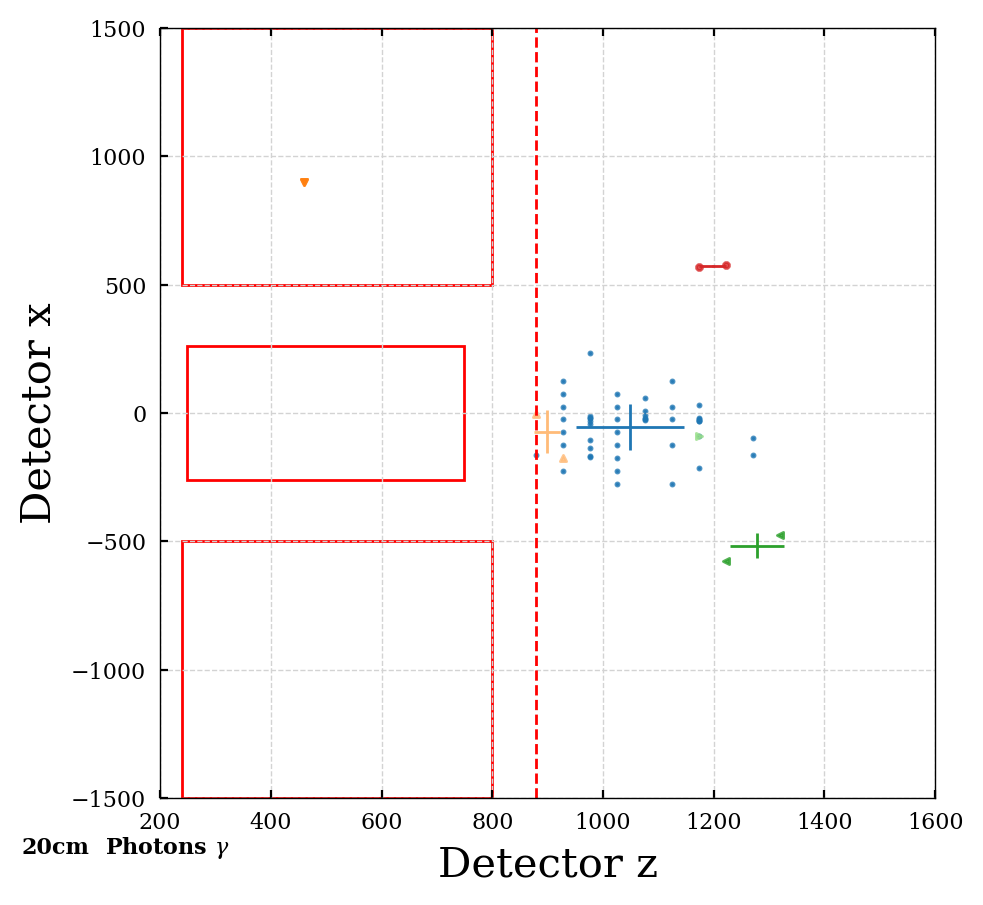

1


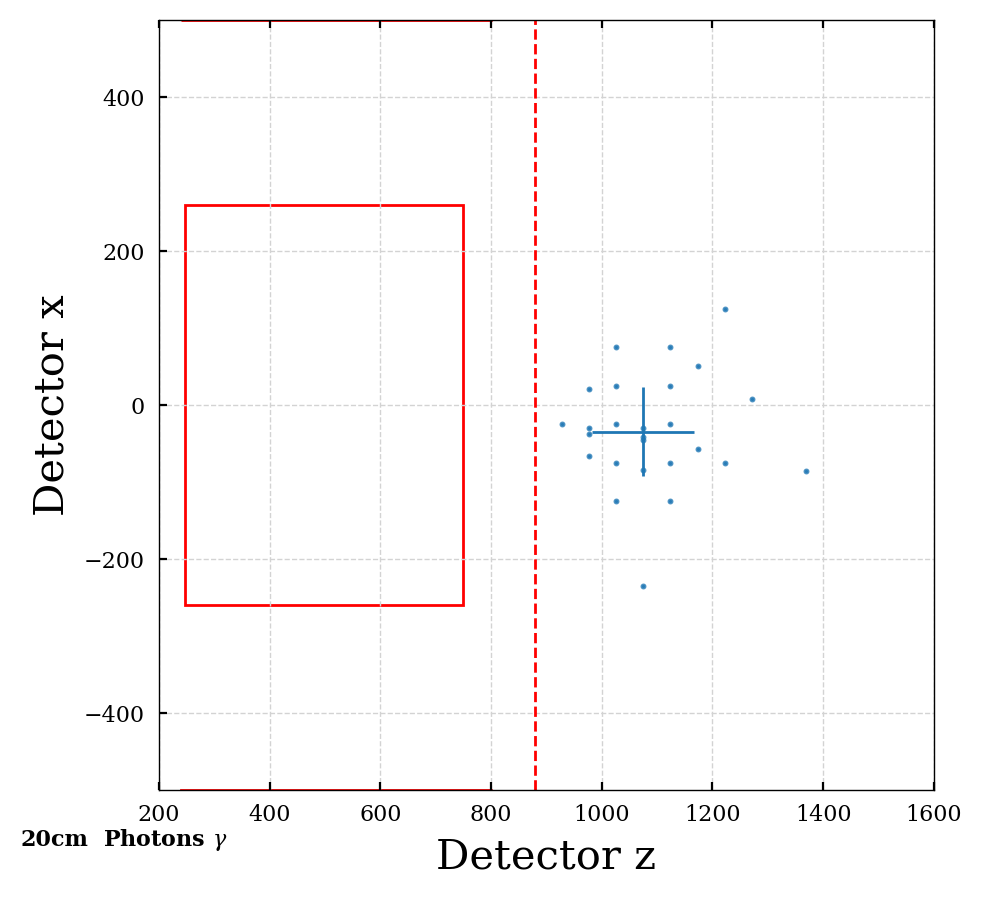

2


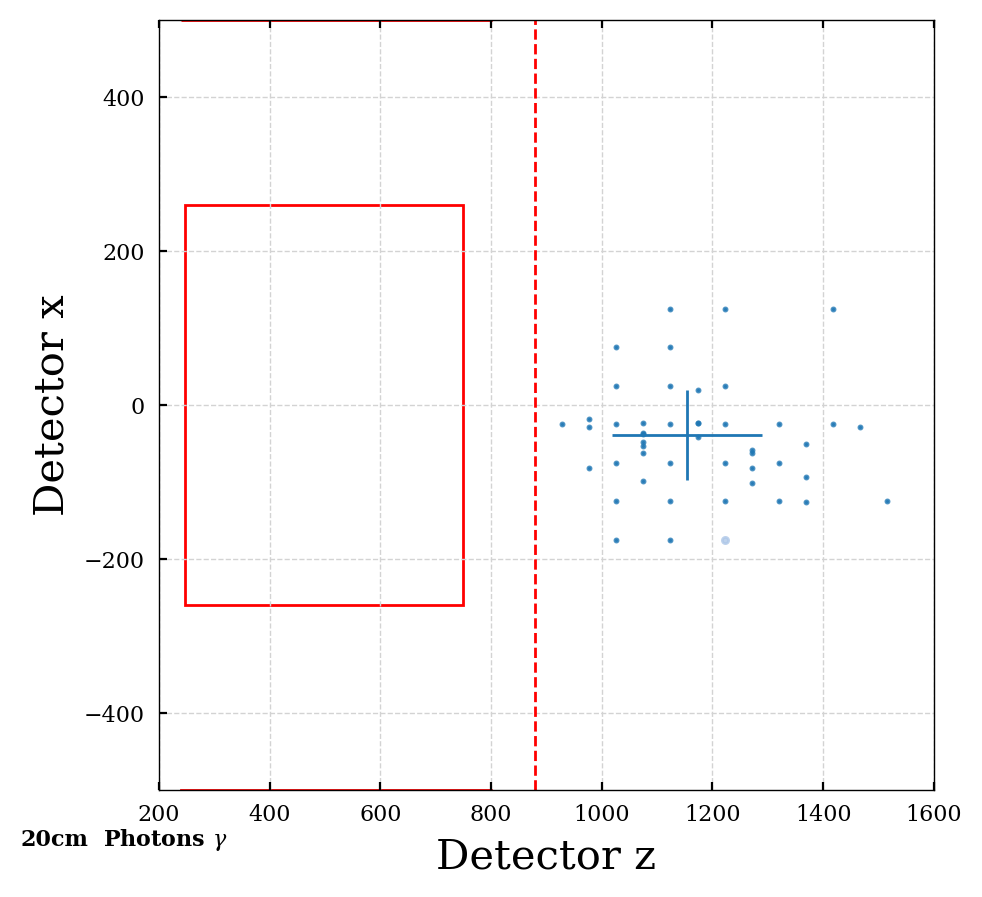

2


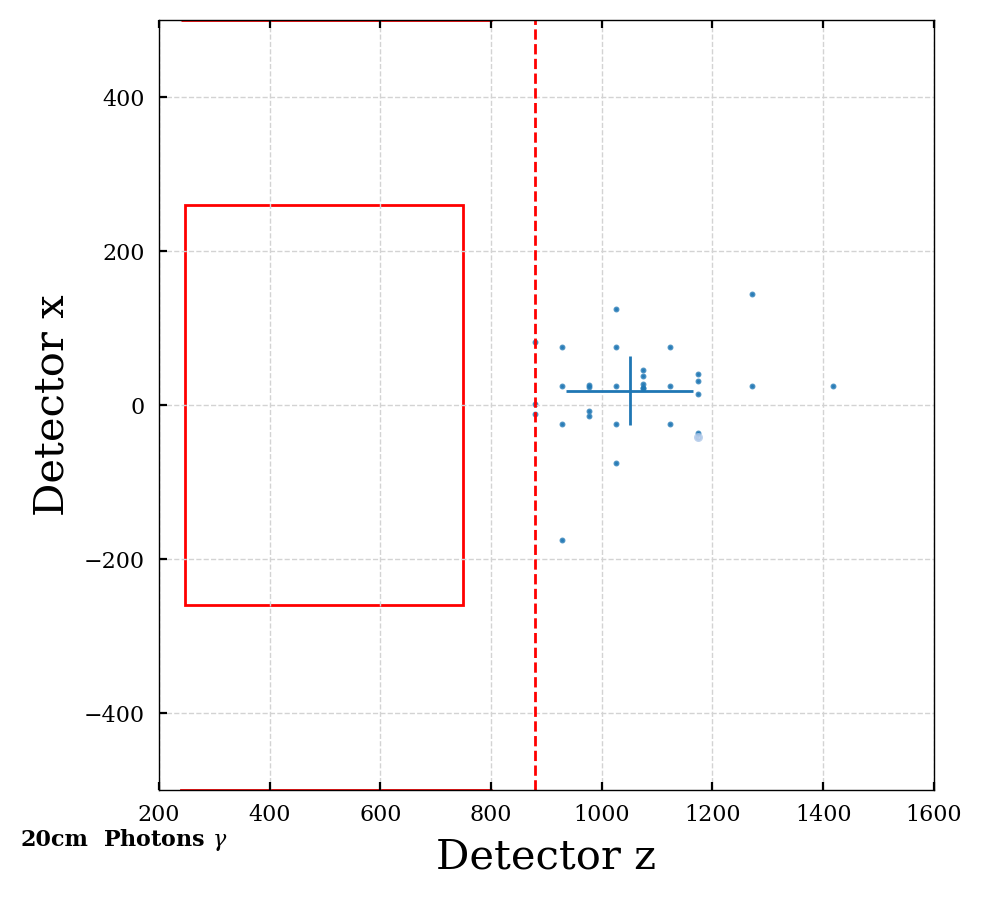

1


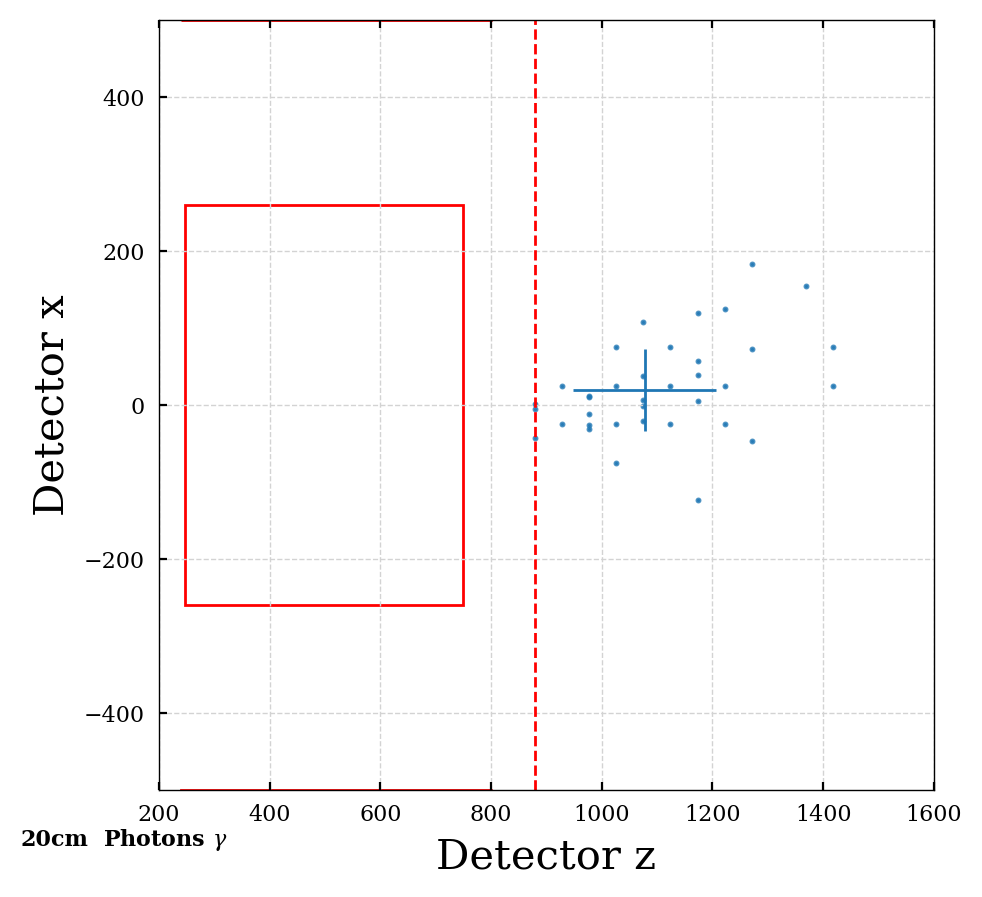

2


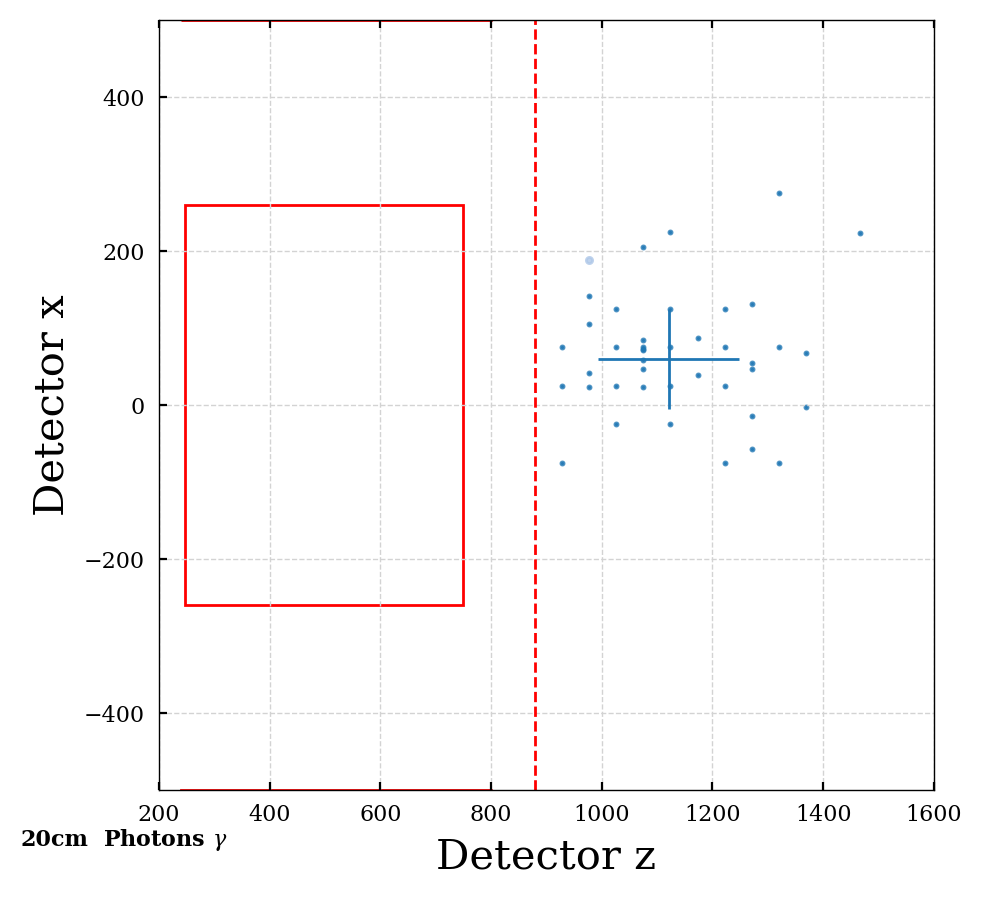

2


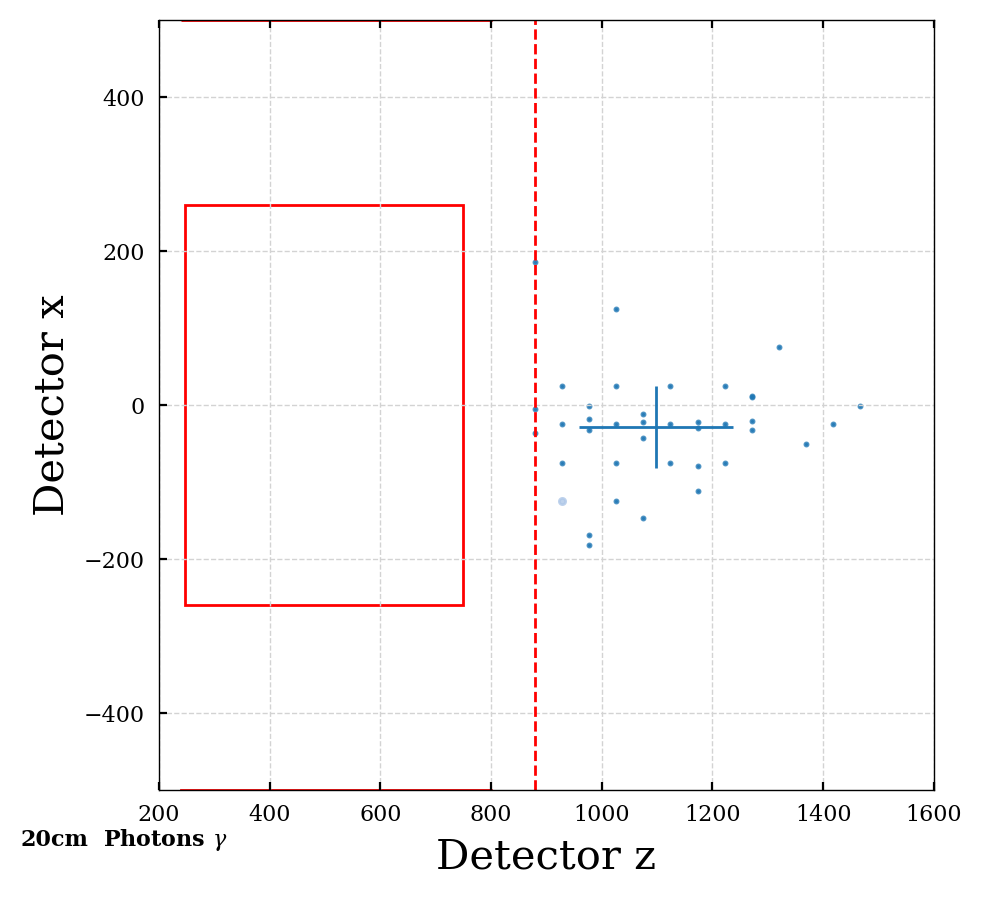

1


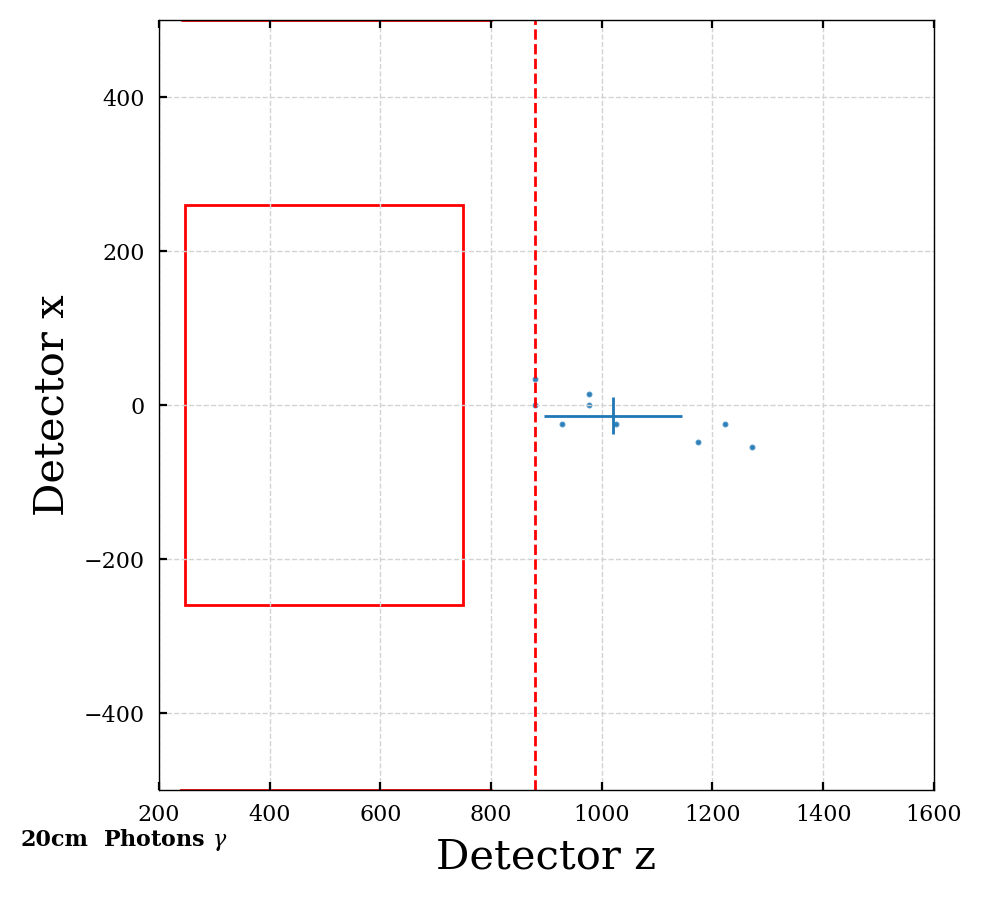

1


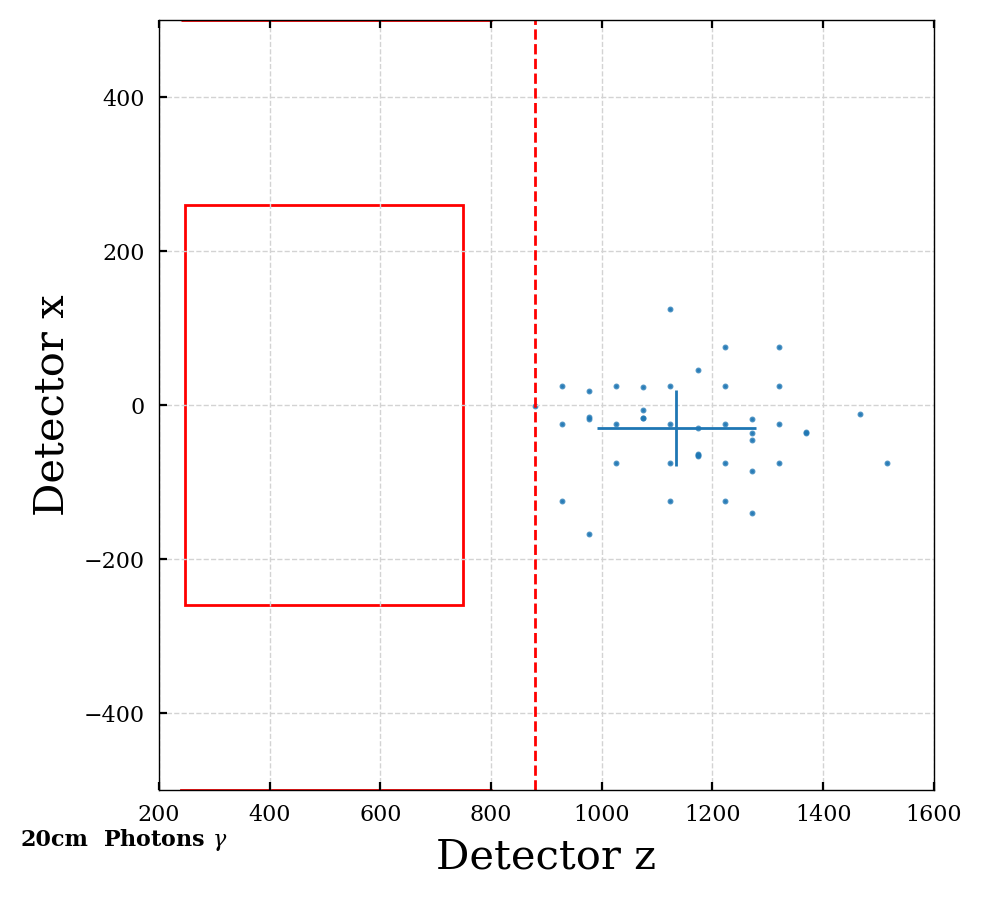

2


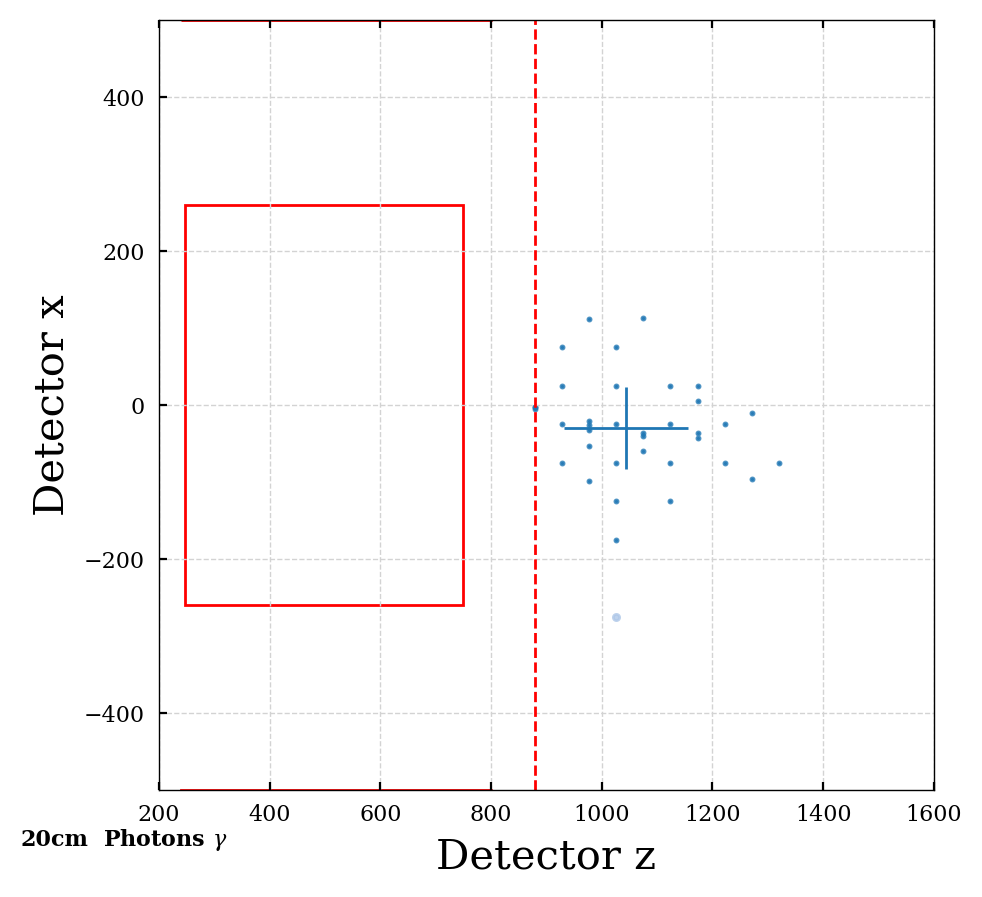

1


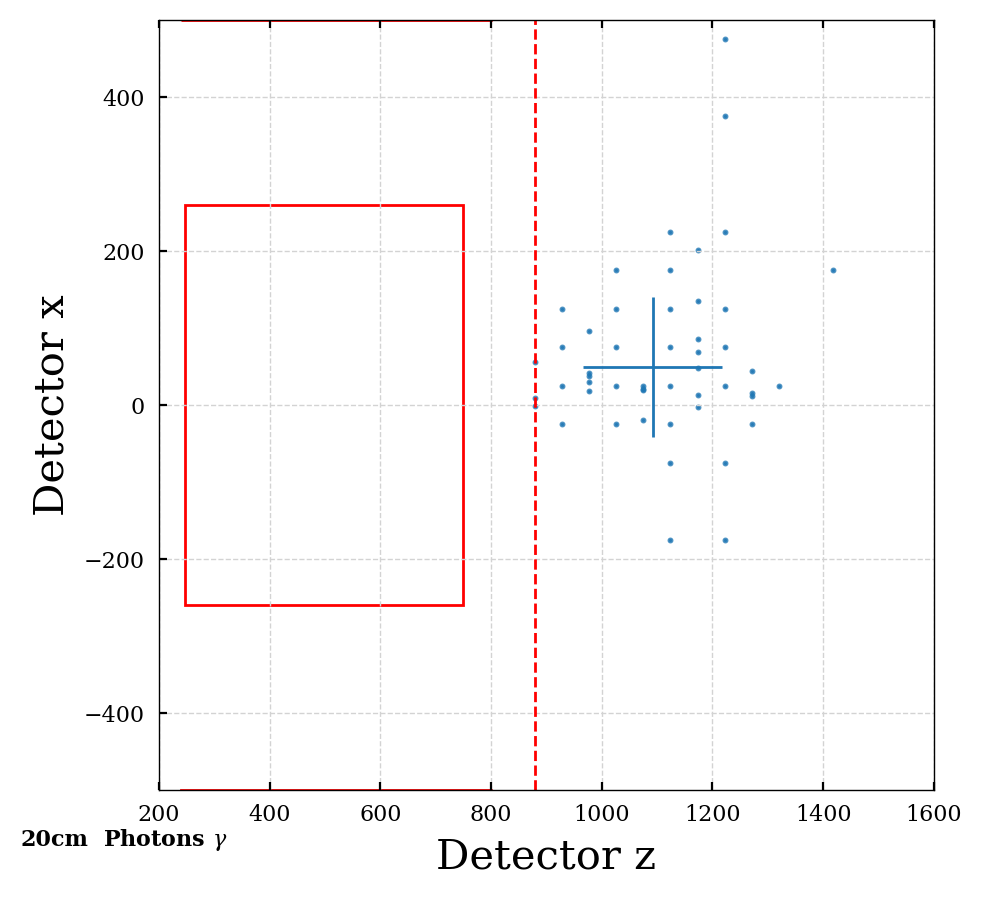

In [34]:
plot_cluster_dist(particles_dict_20cm, 20, spec_part='photons', ipart=None, xlim=1600, ylim=1500, angle_label=False)
# randomly select events
for ipart in np.random.randint(0, high=1e4, size=10, dtype=int):
    plot_cluster_dist(particles_dict_20cm, 20, spec_part='photons', ipart=ipart, xlim=1600, ylim=500, angle_label=False)

### Electrons

12


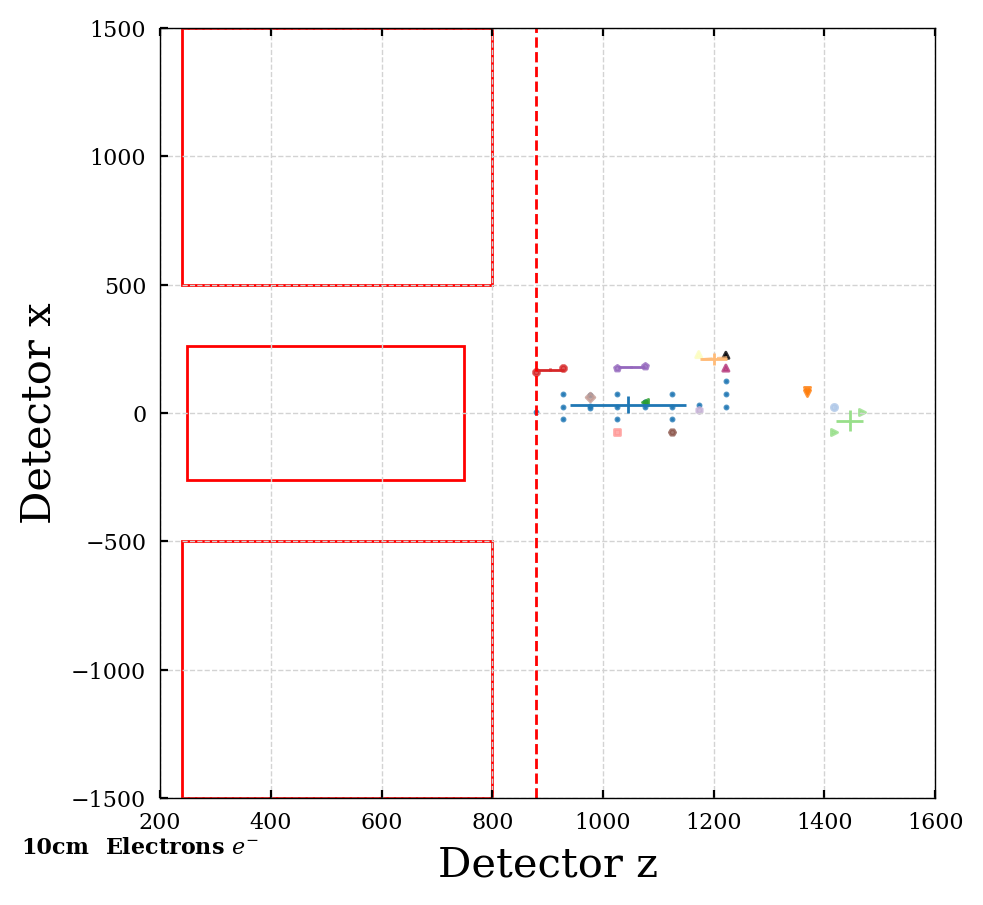

2


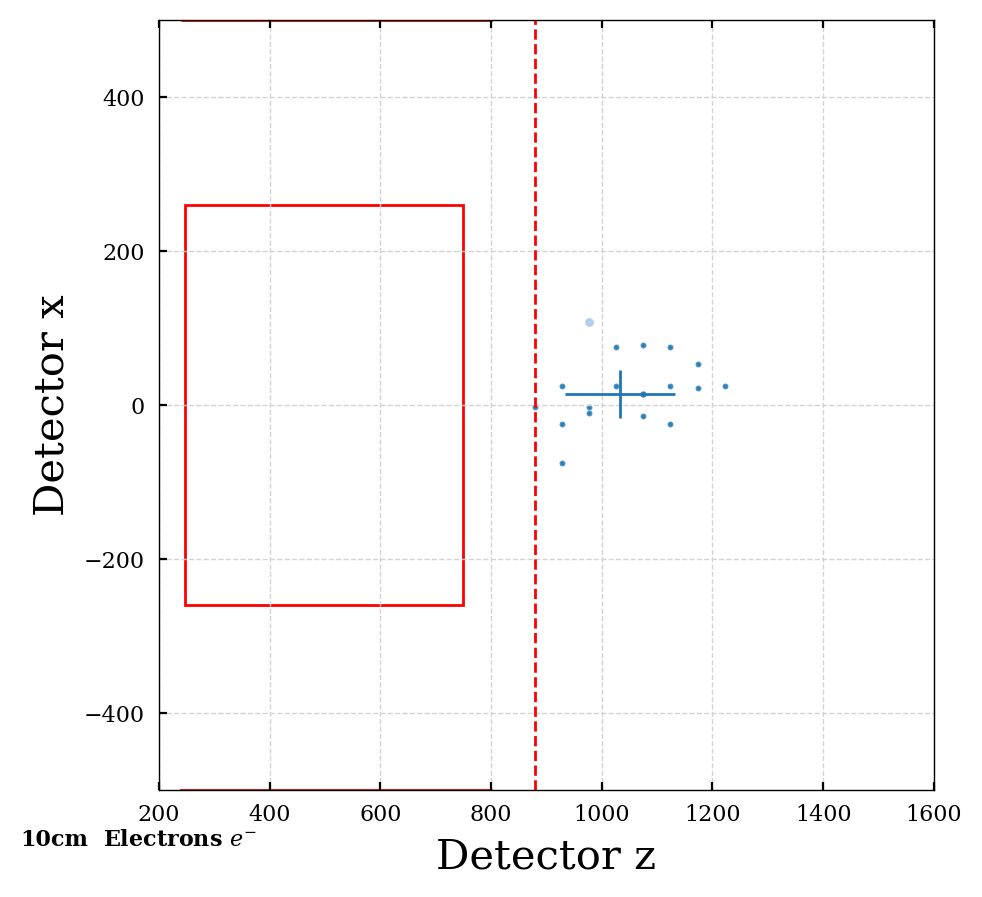

1


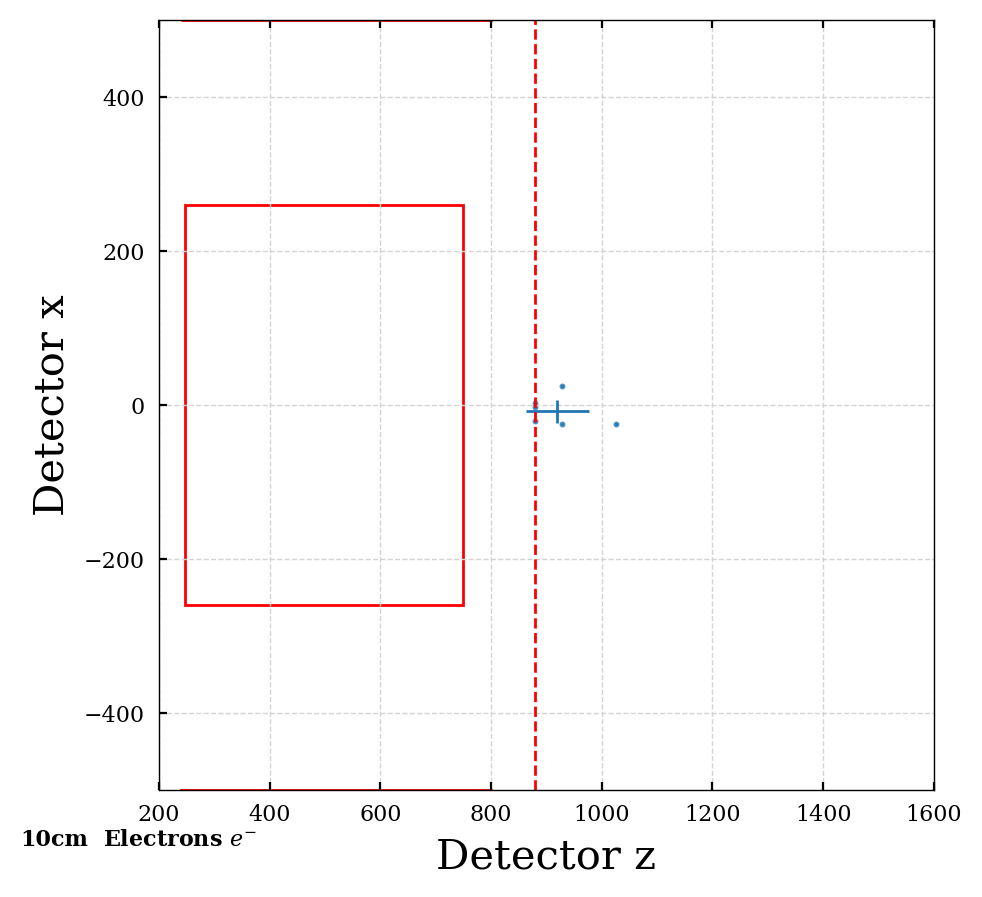

5


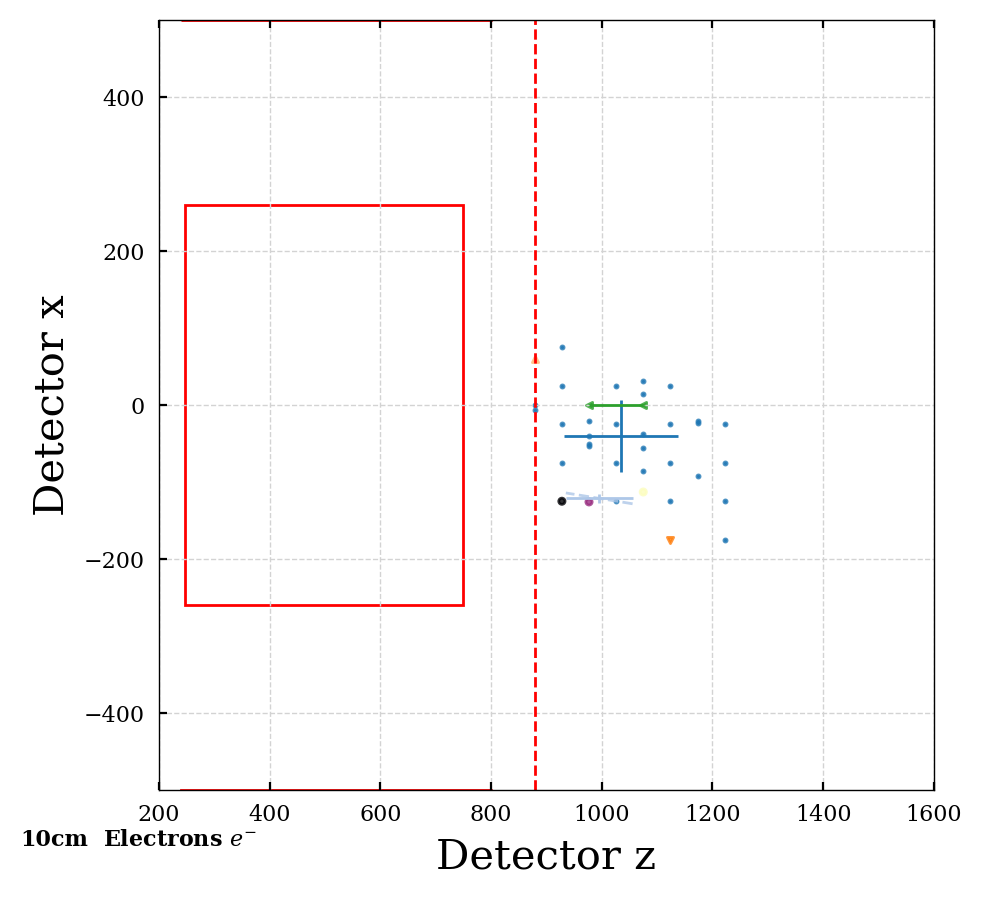

2


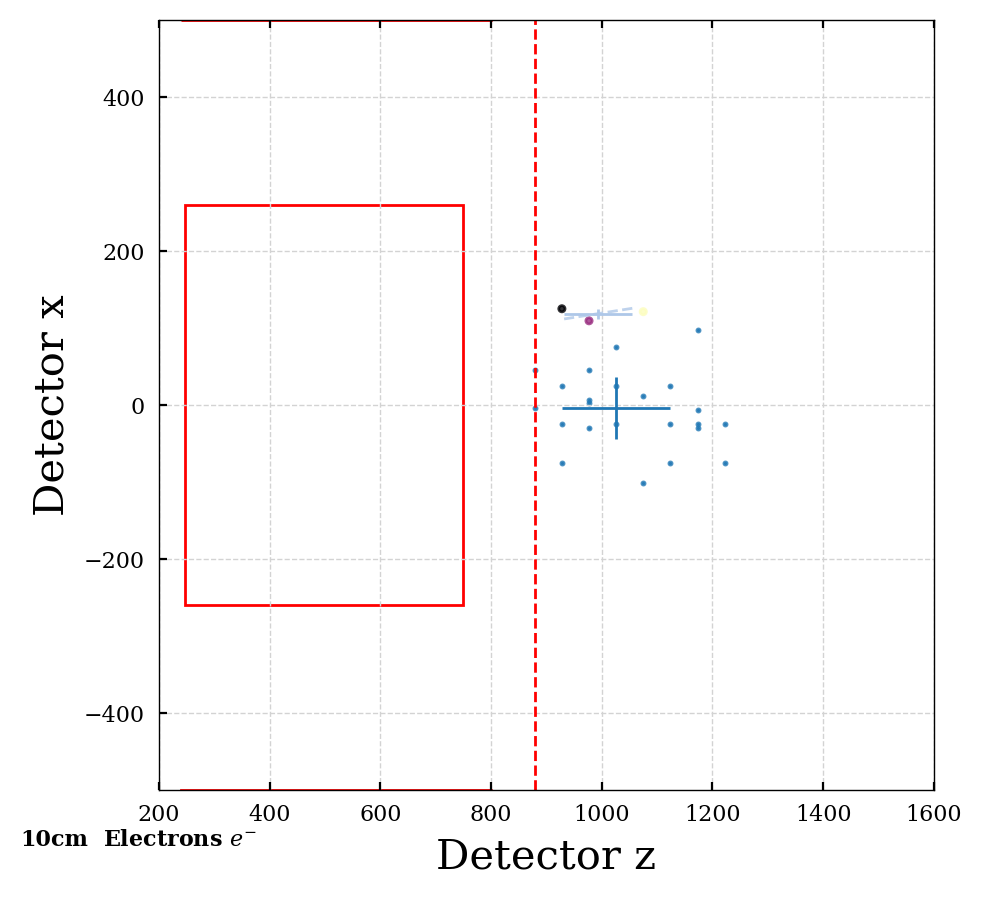

3


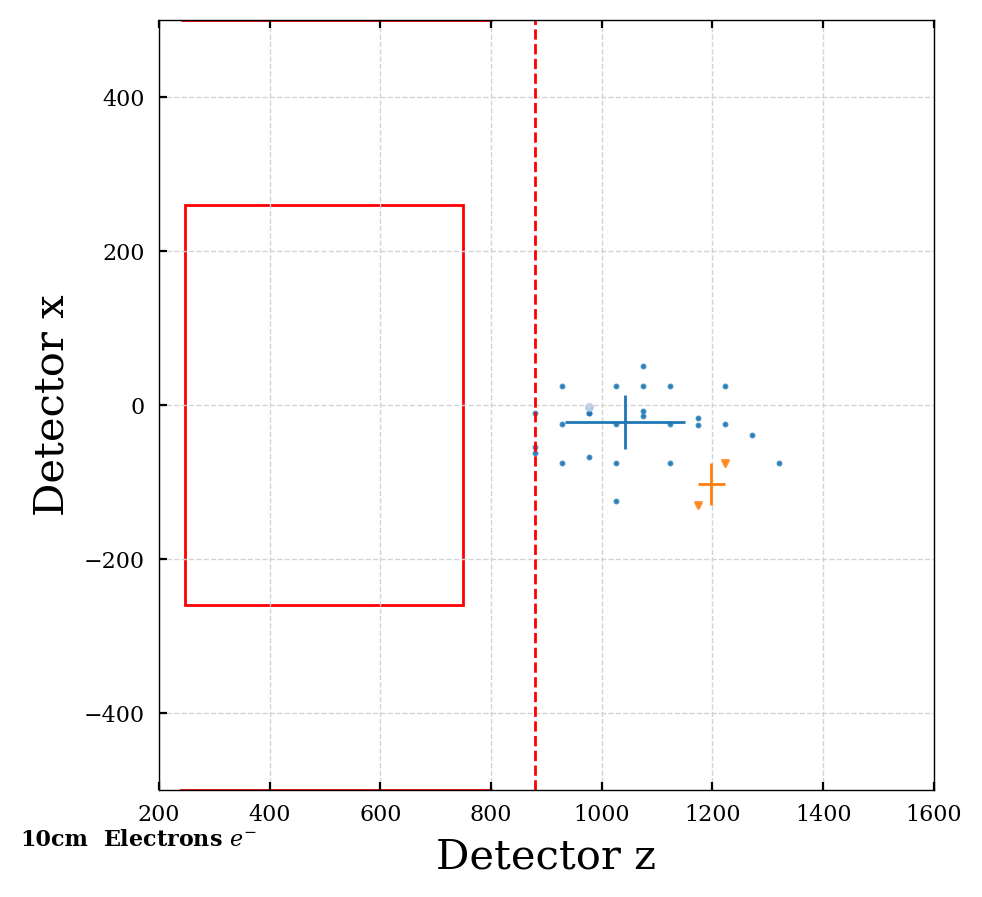

2


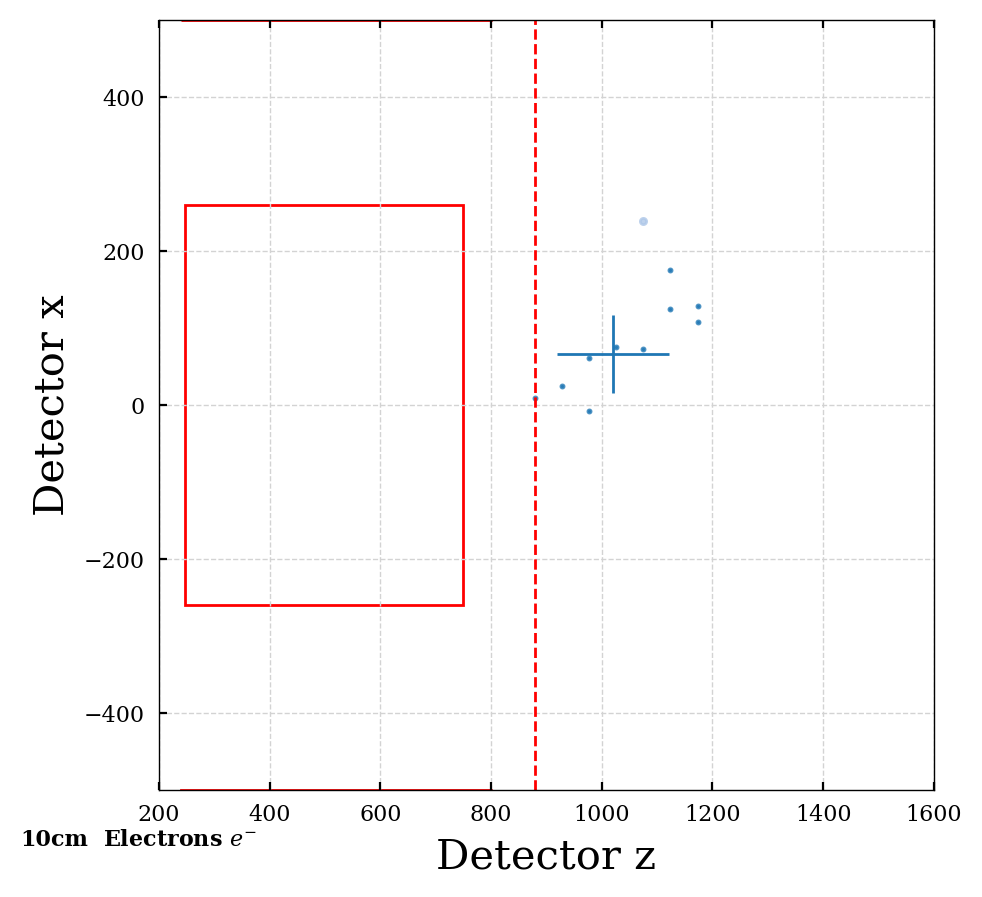

2


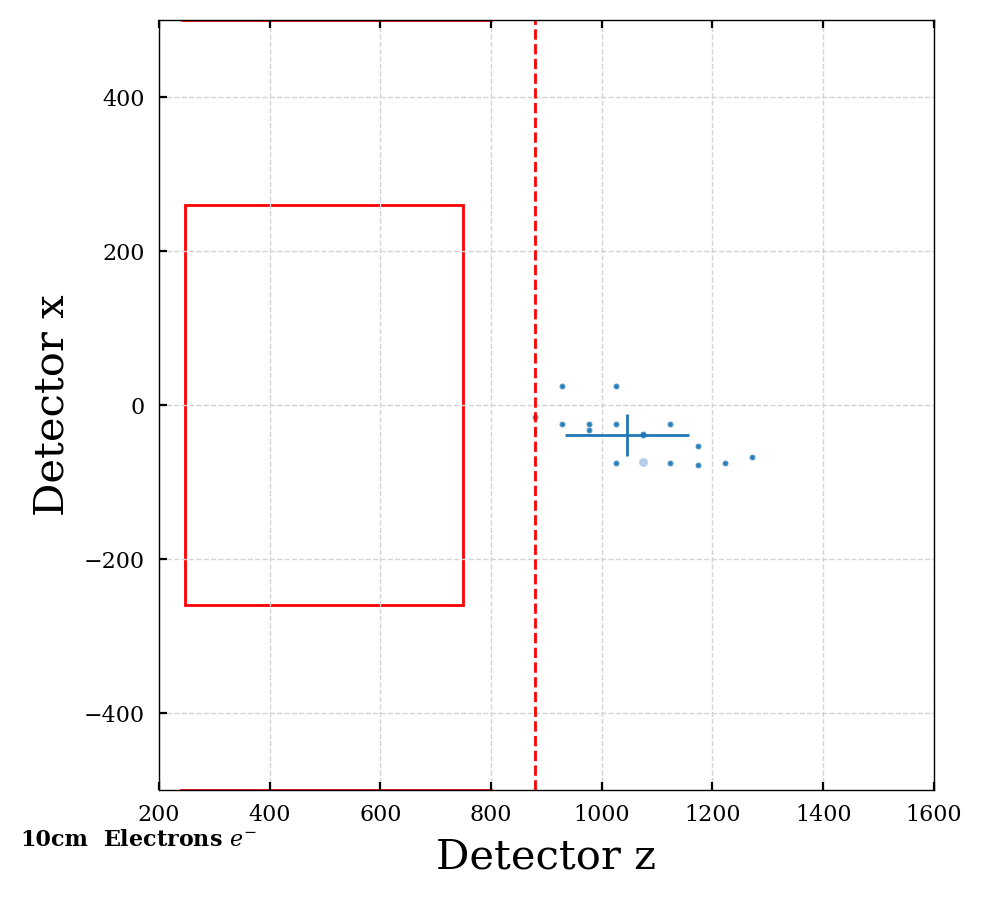

1


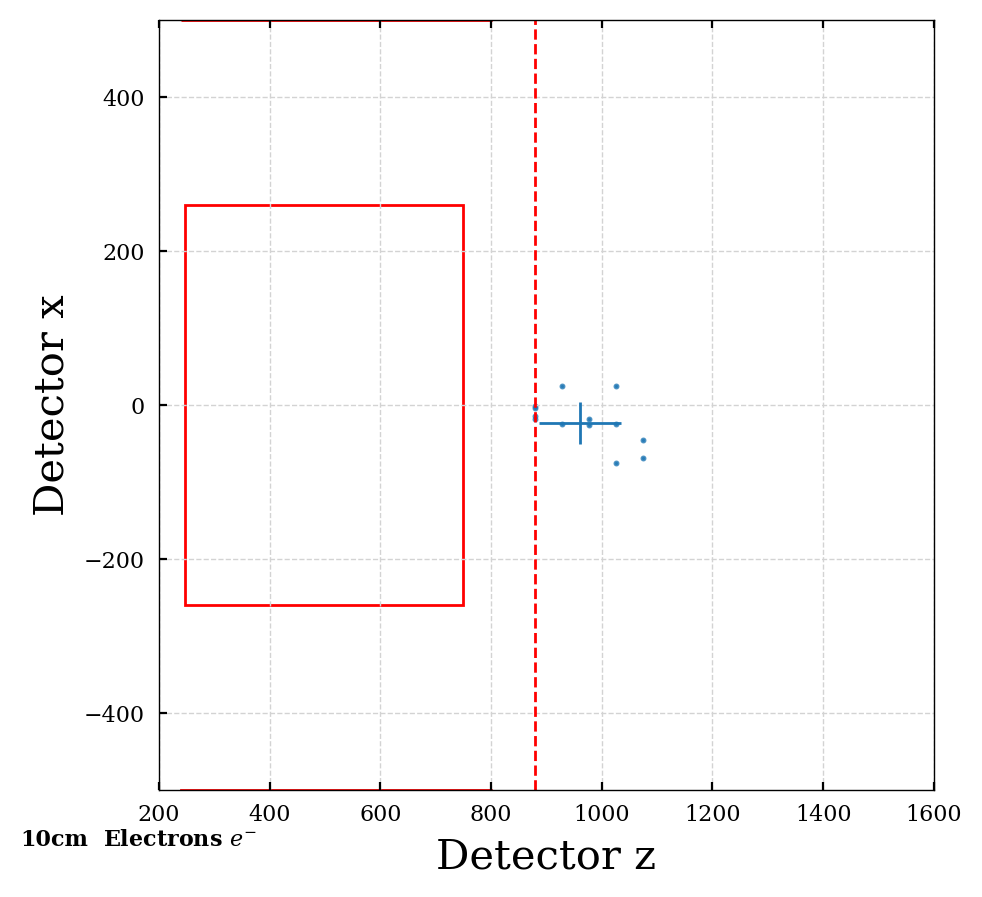

3


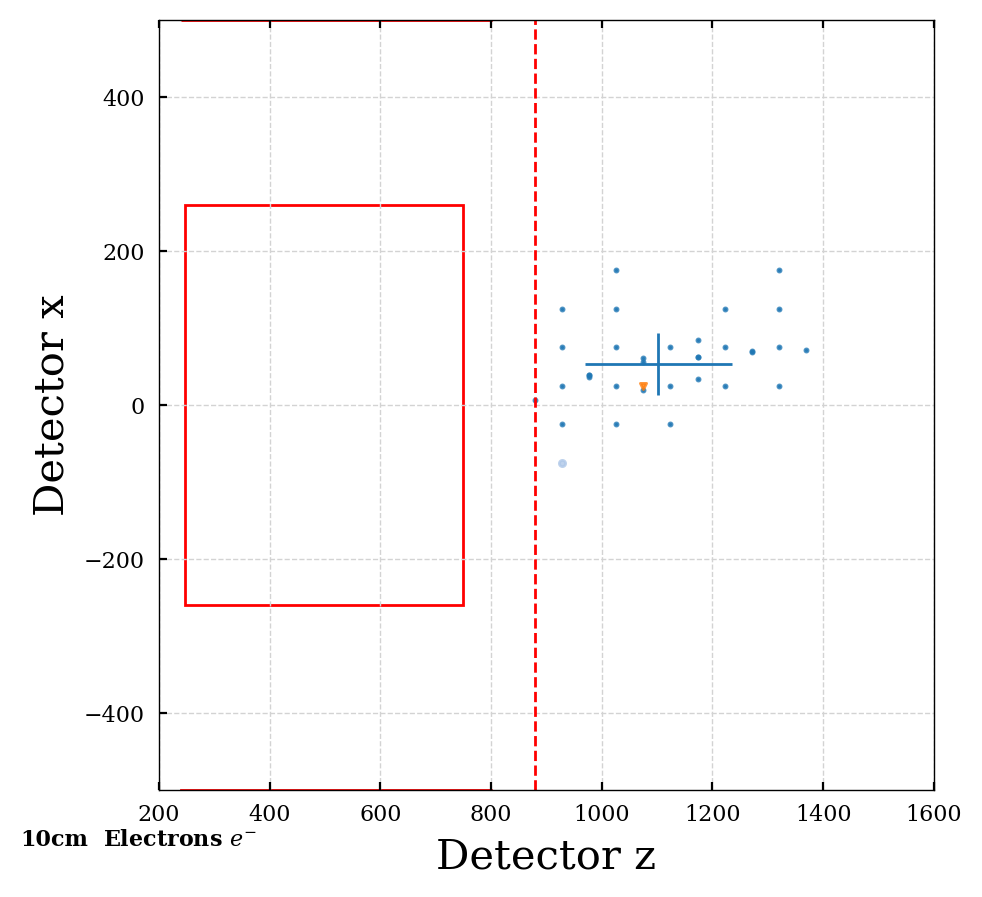

3


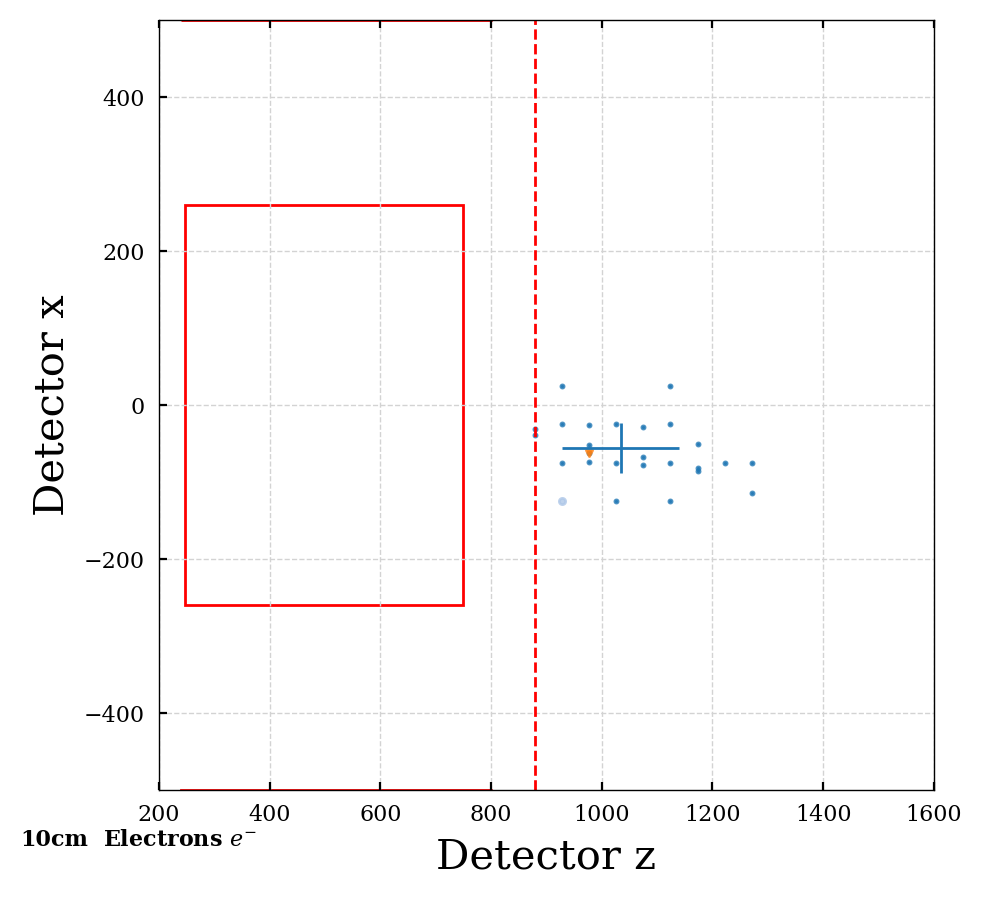

In [35]:
plot_cluster_dist(particles_dict_10cm, 10, spec_part='electrons', ipart=None, xlim=1600, ylim=1500, angle_label=False)
# randomly select events
for ipart in np.random.randint(0, high=1e4, size=10, dtype=int):
    plot_cluster_dist(particles_dict_10cm, 10, spec_part='electrons', ipart=ipart, xlim=1600, ylim=500, angle_label=False)

7


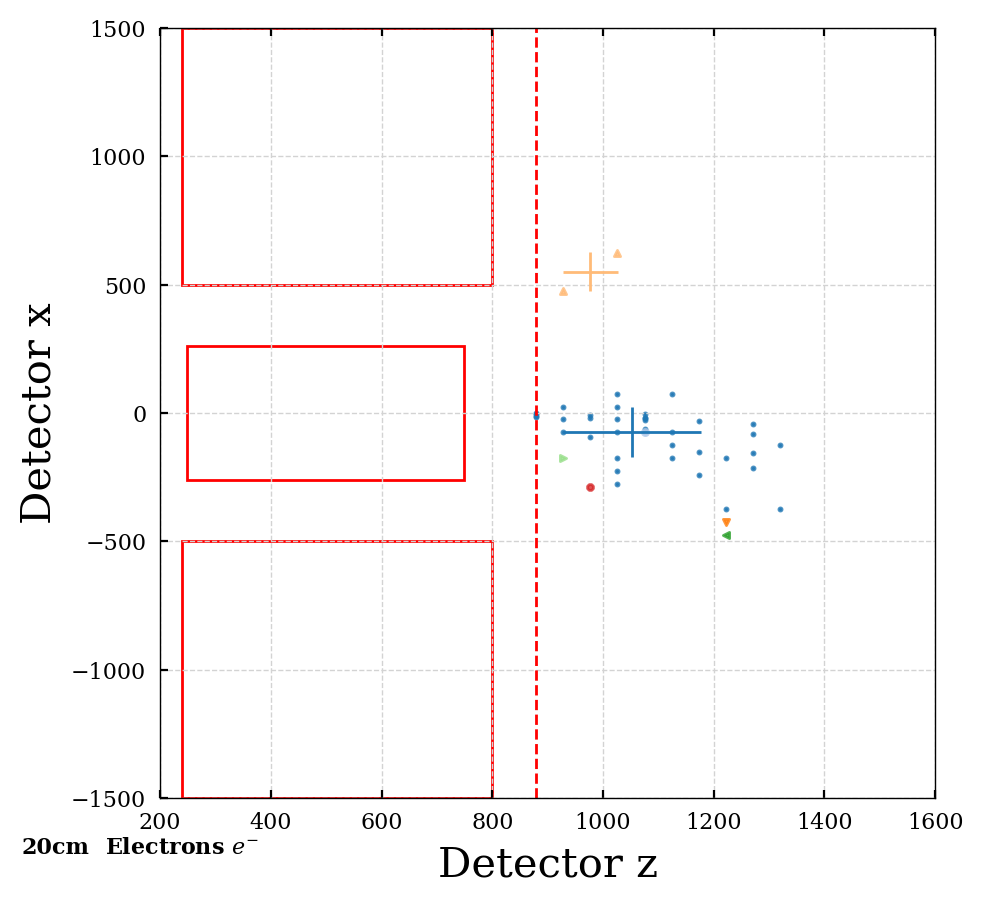

1


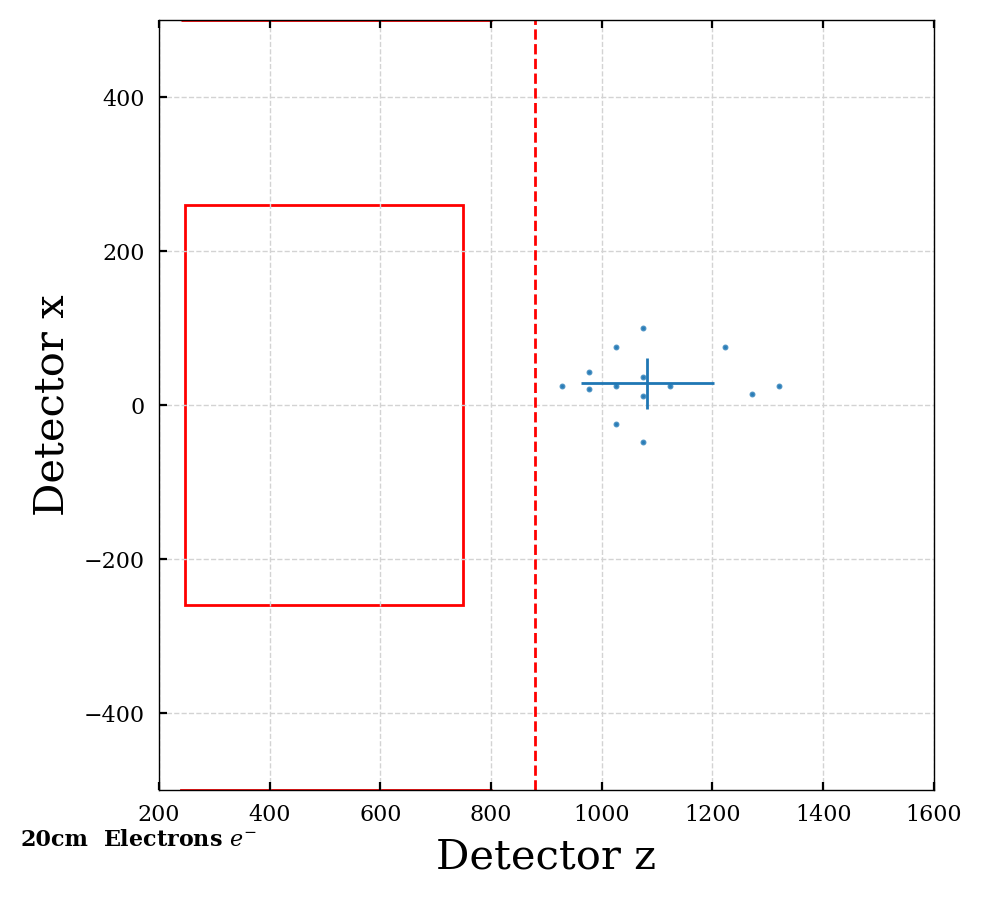

1


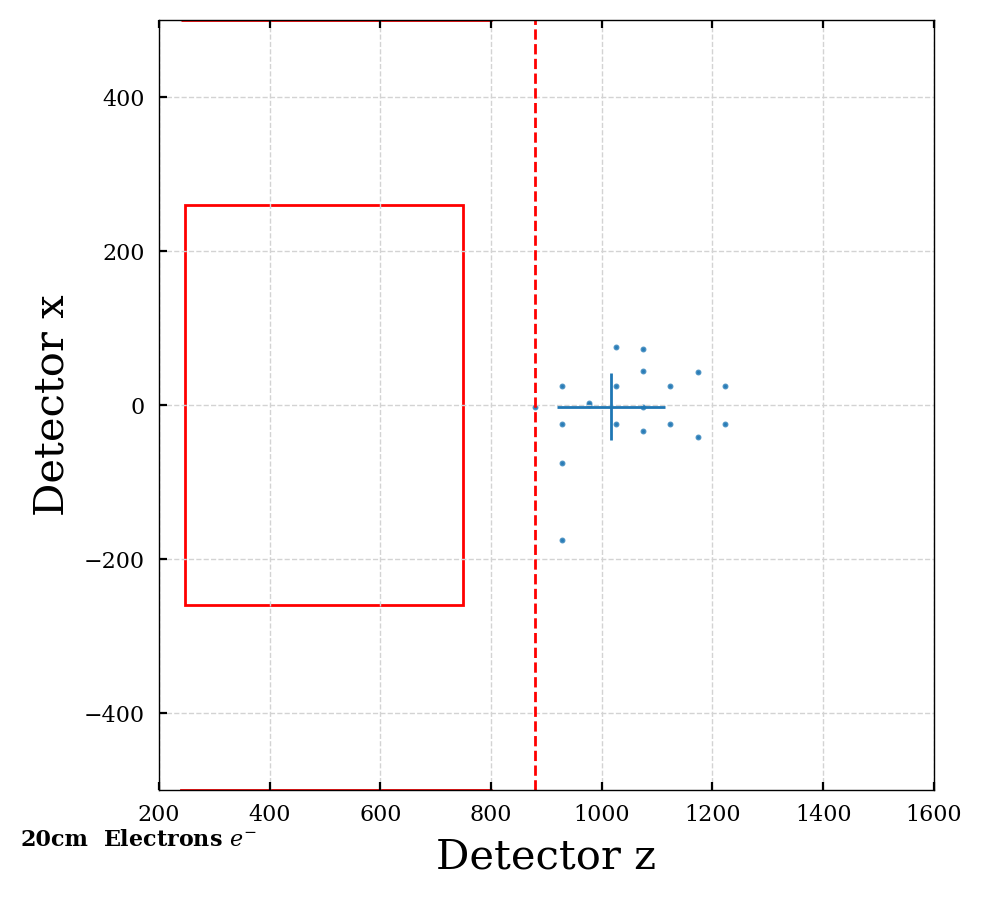

2


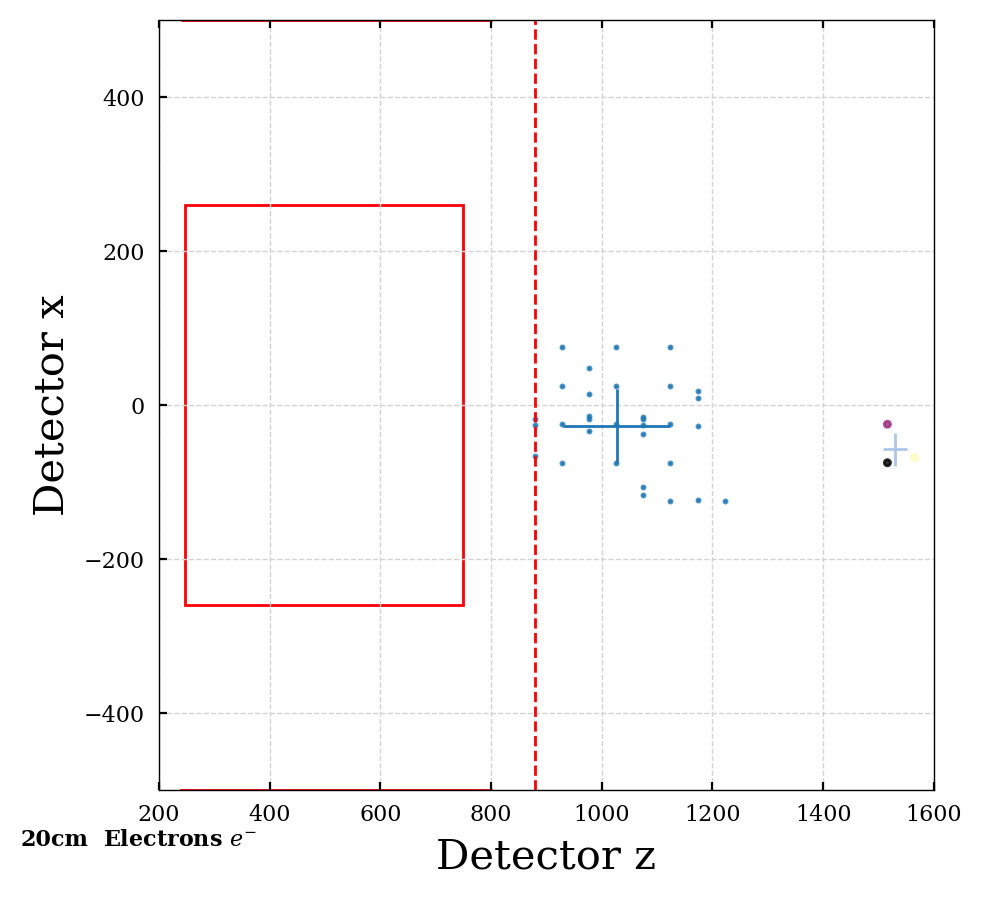

3


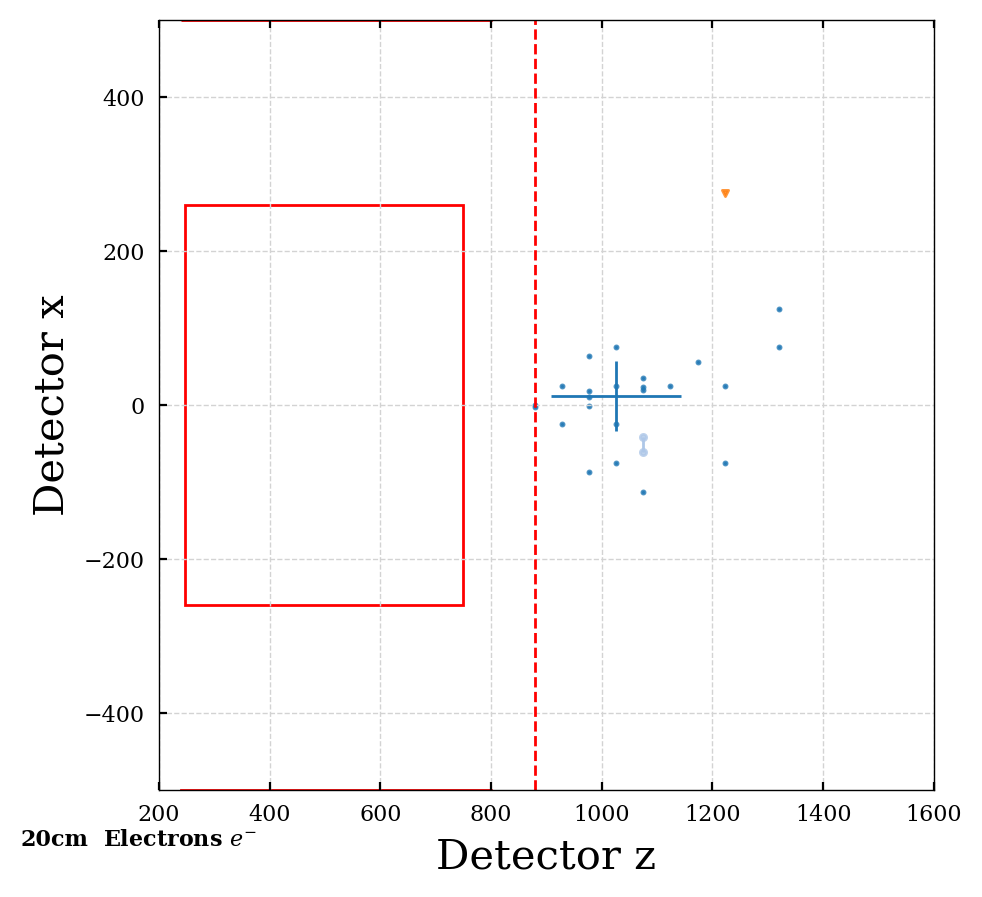

2


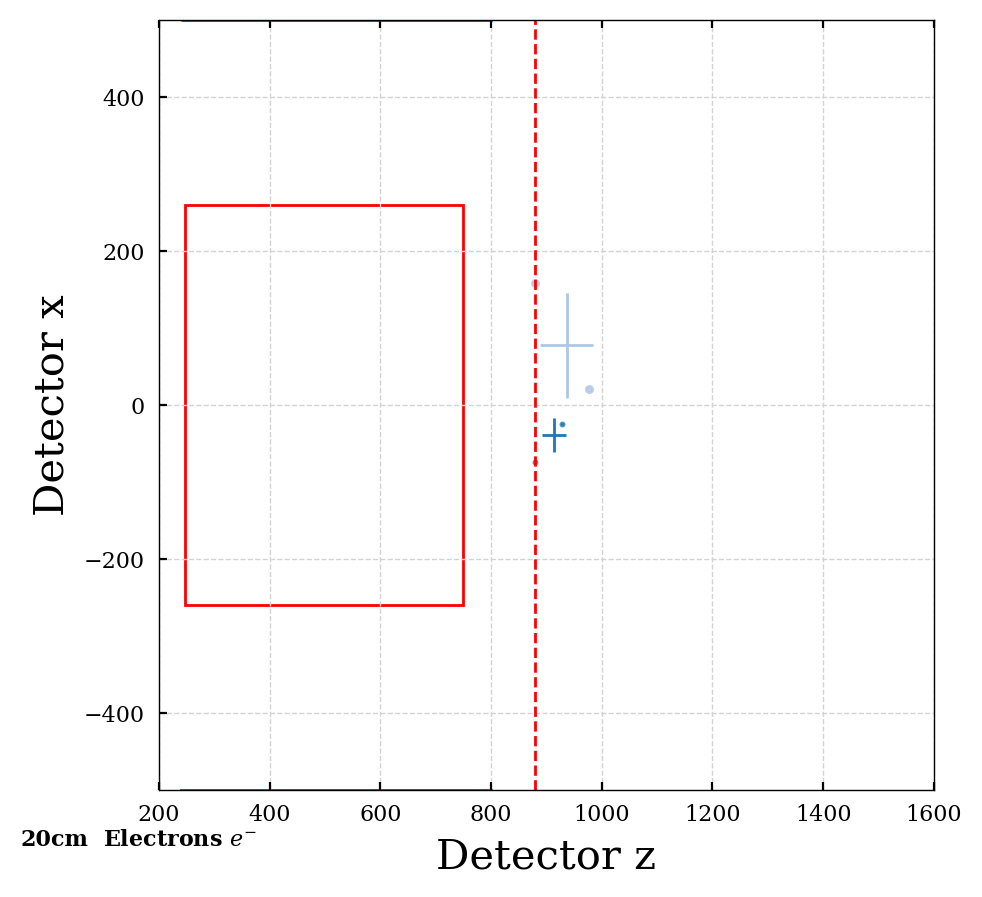

2


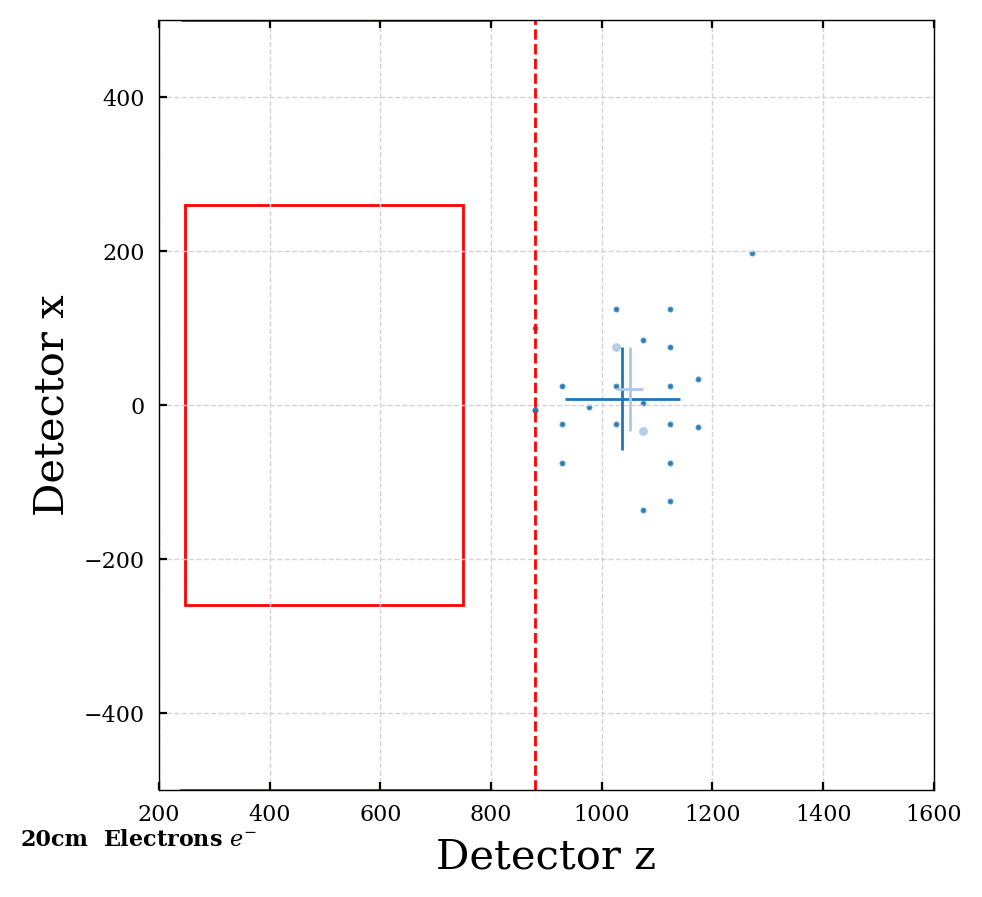

2


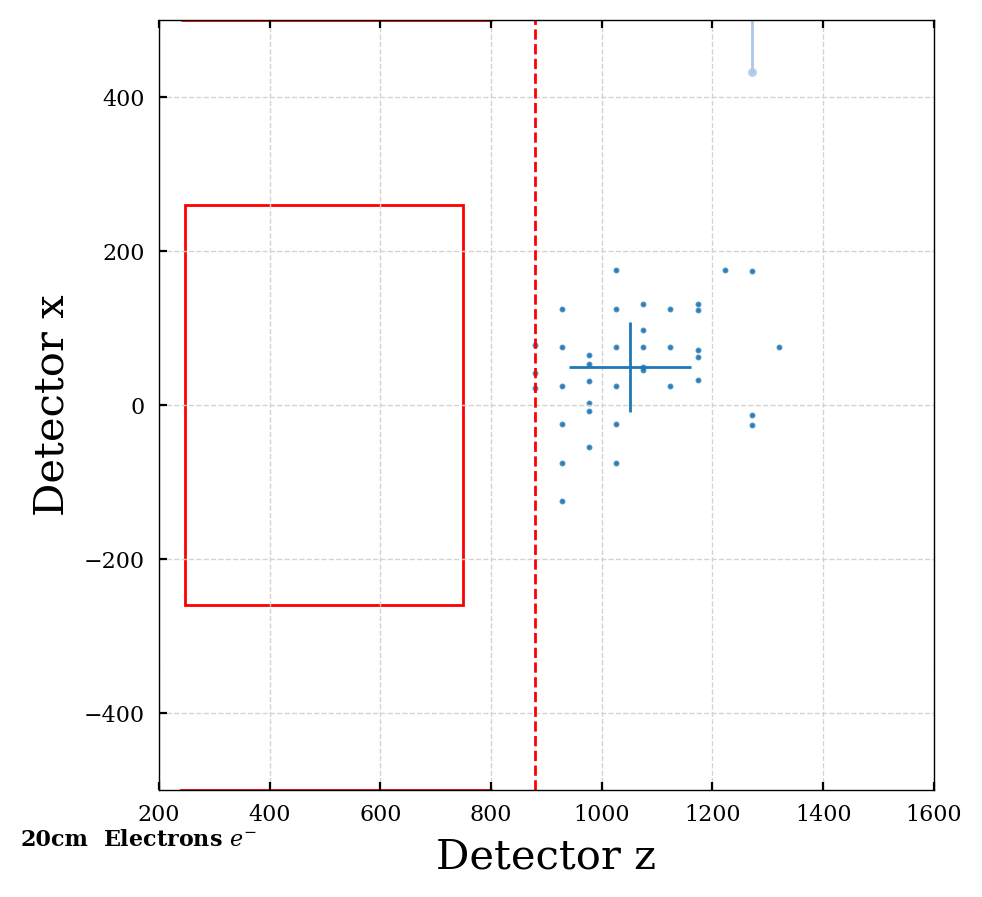

1


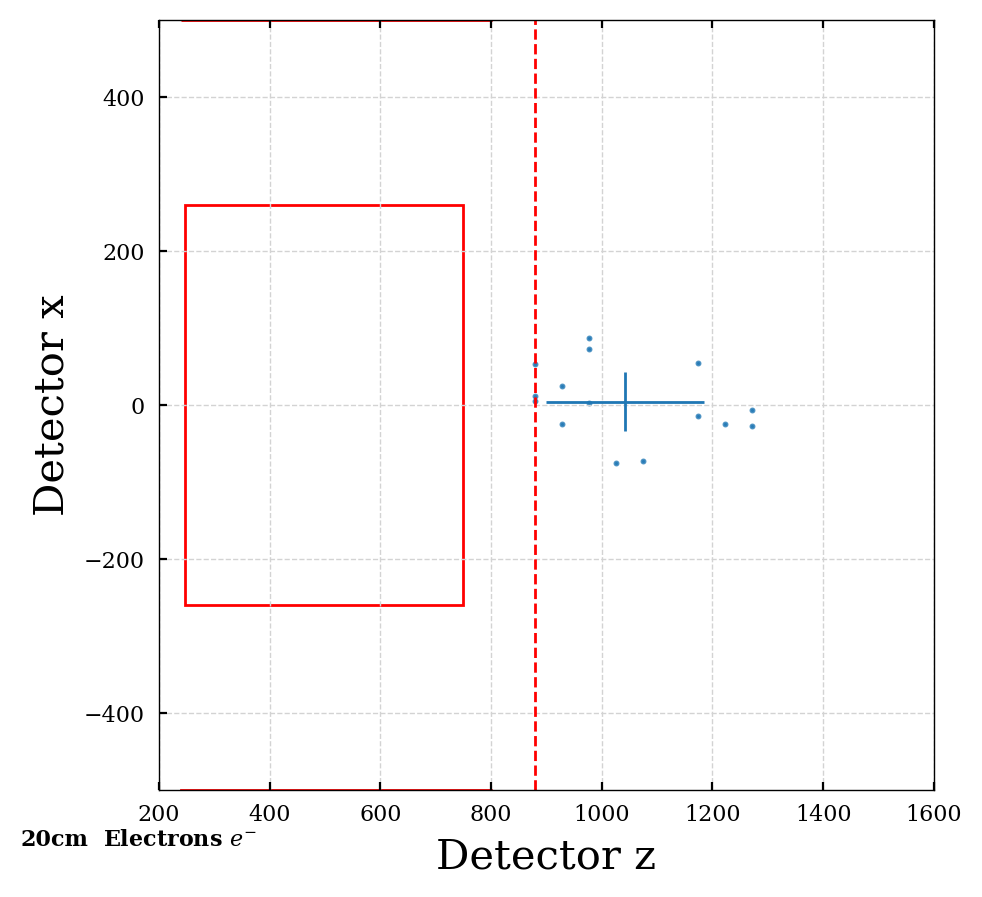

2


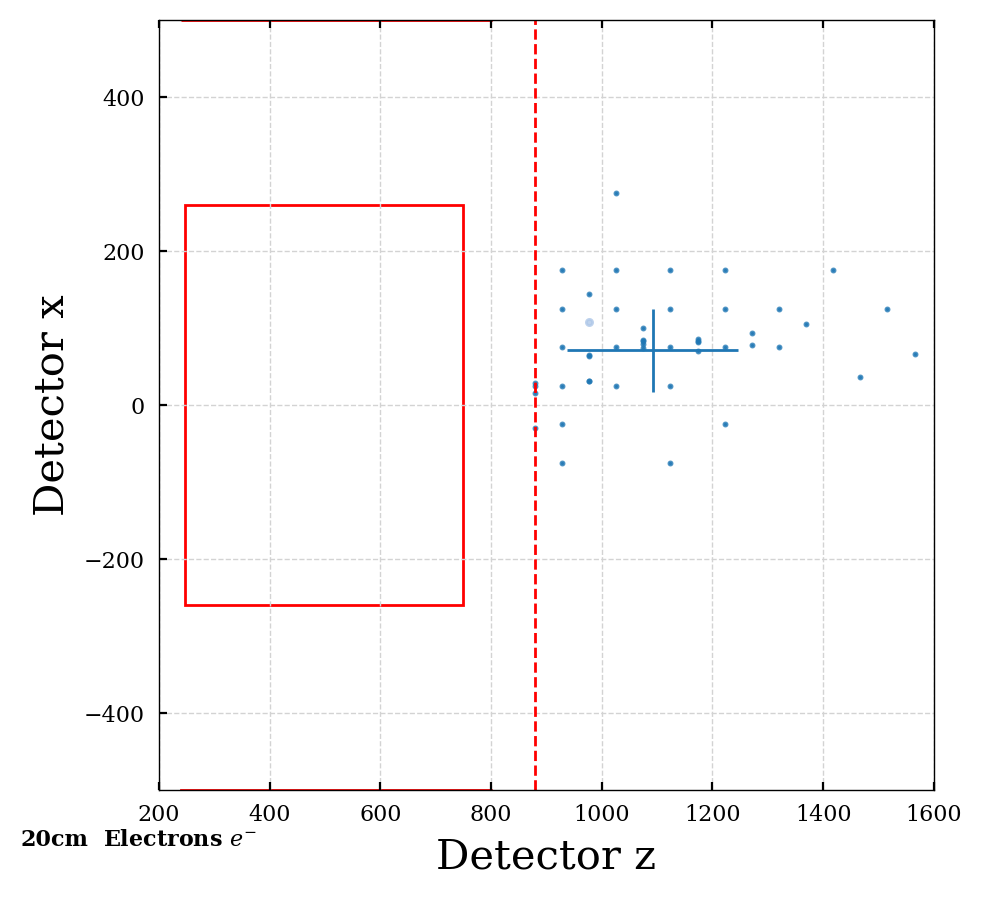

2


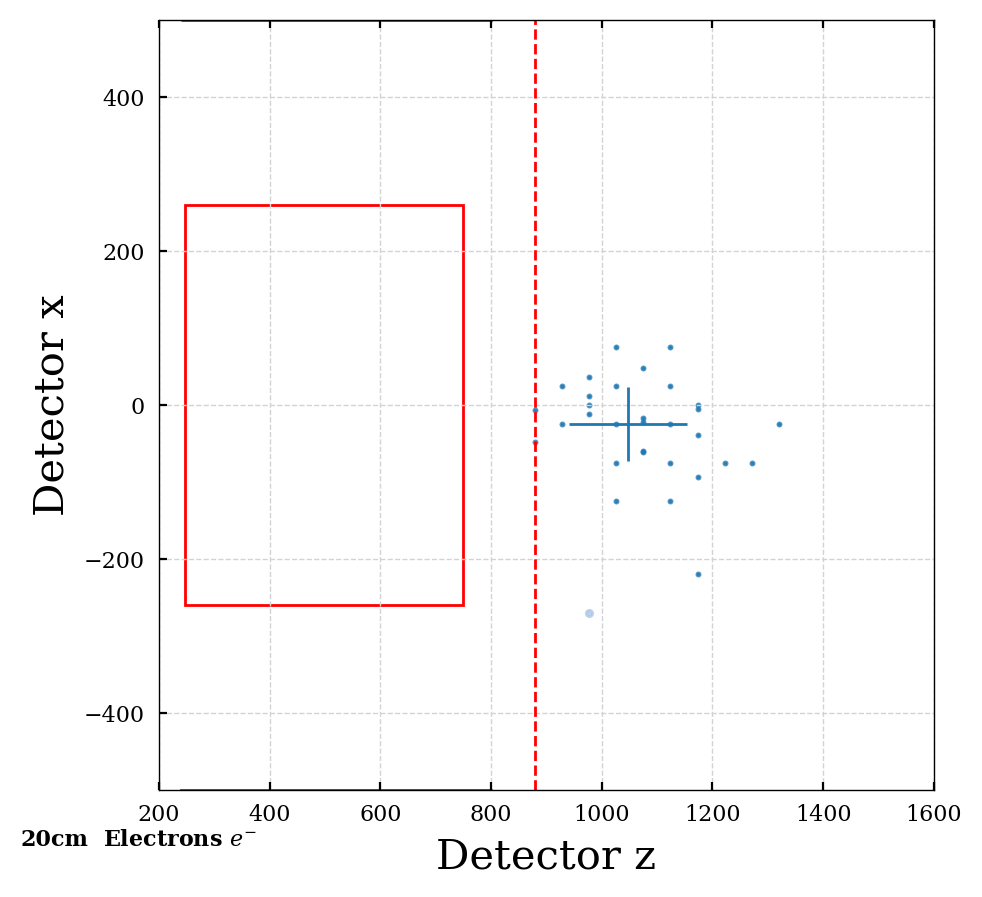

In [36]:
plot_cluster_dist(particles_dict_20cm, 20, spec_part='electrons', ipart=None, xlim=1600, ylim=1500, angle_label=False)
# randomly select events
for ipart in np.random.randint(0, high=1e4, size=10, dtype=int):
    plot_cluster_dist(particles_dict_20cm, 20, spec_part='electrons', ipart=ipart, xlim=1600, ylim=500, angle_label=False)

### Pions

29


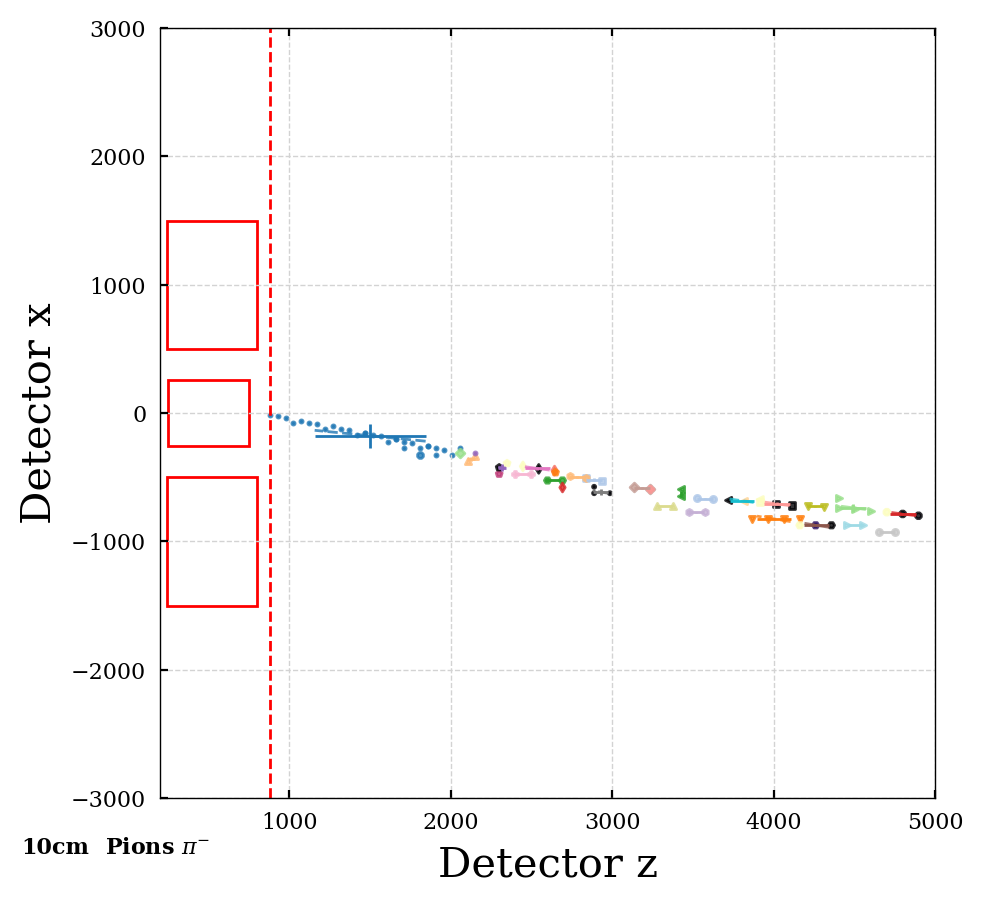

8


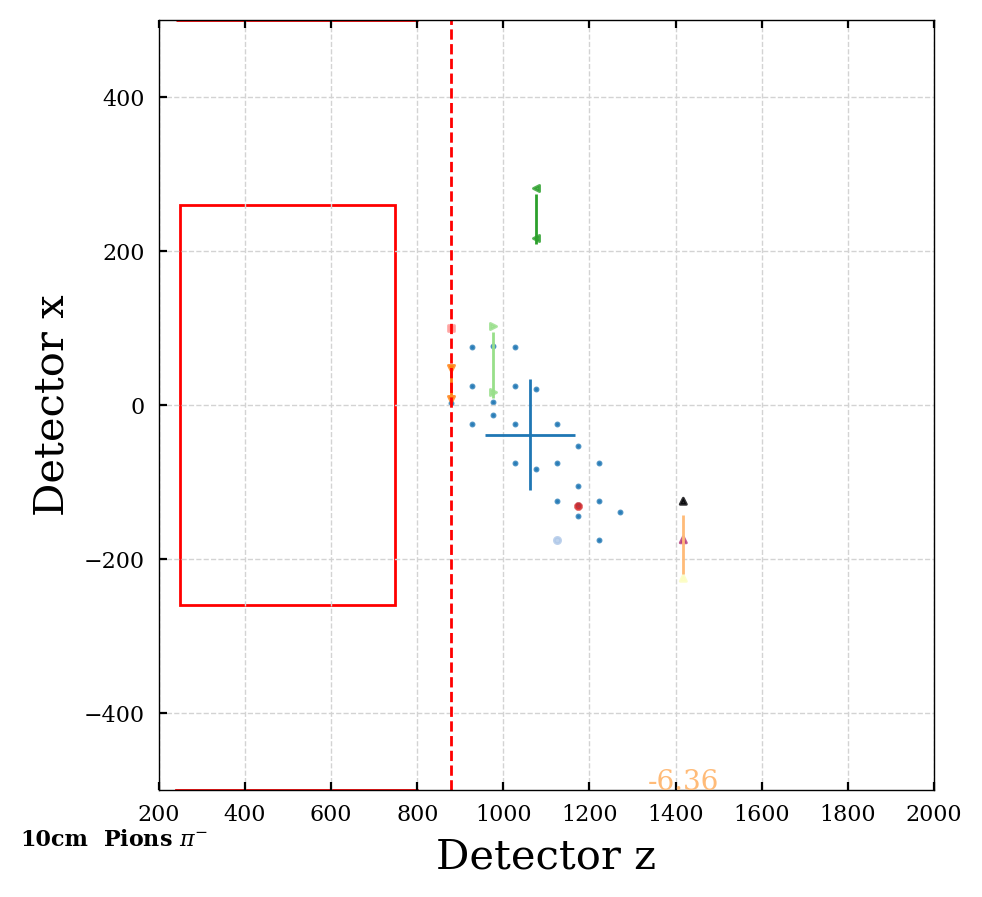

10


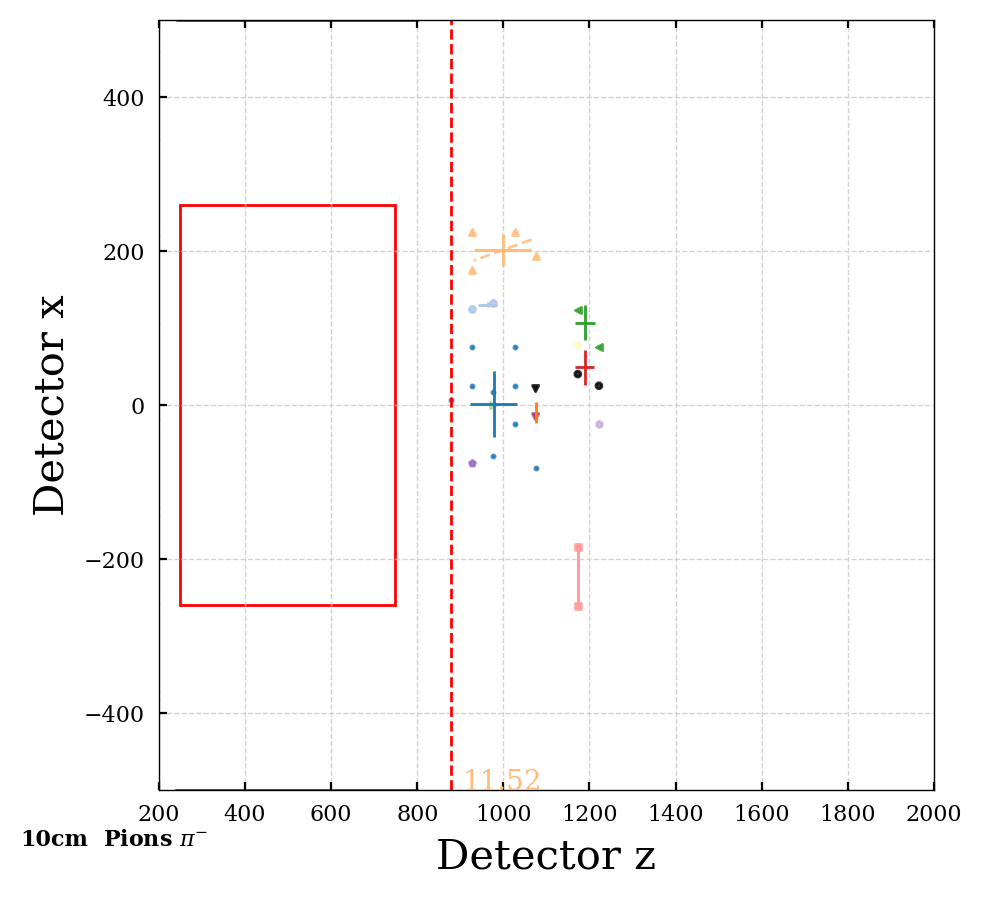

8


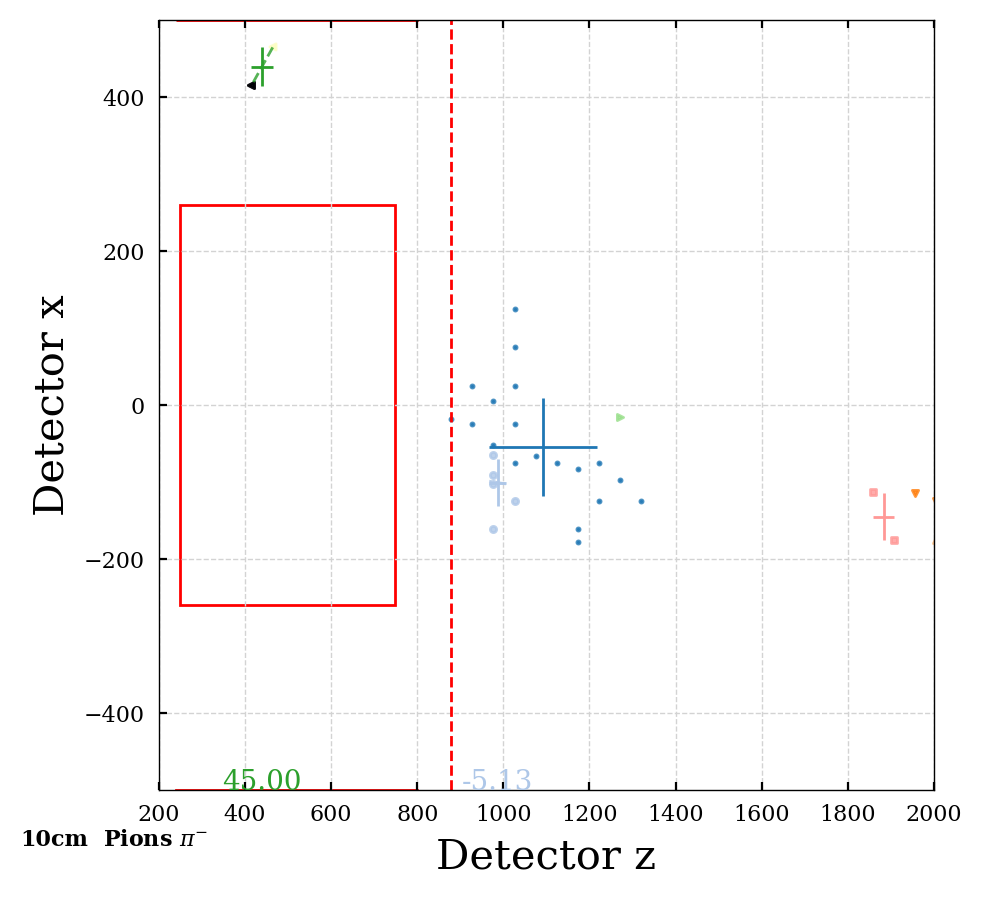

13


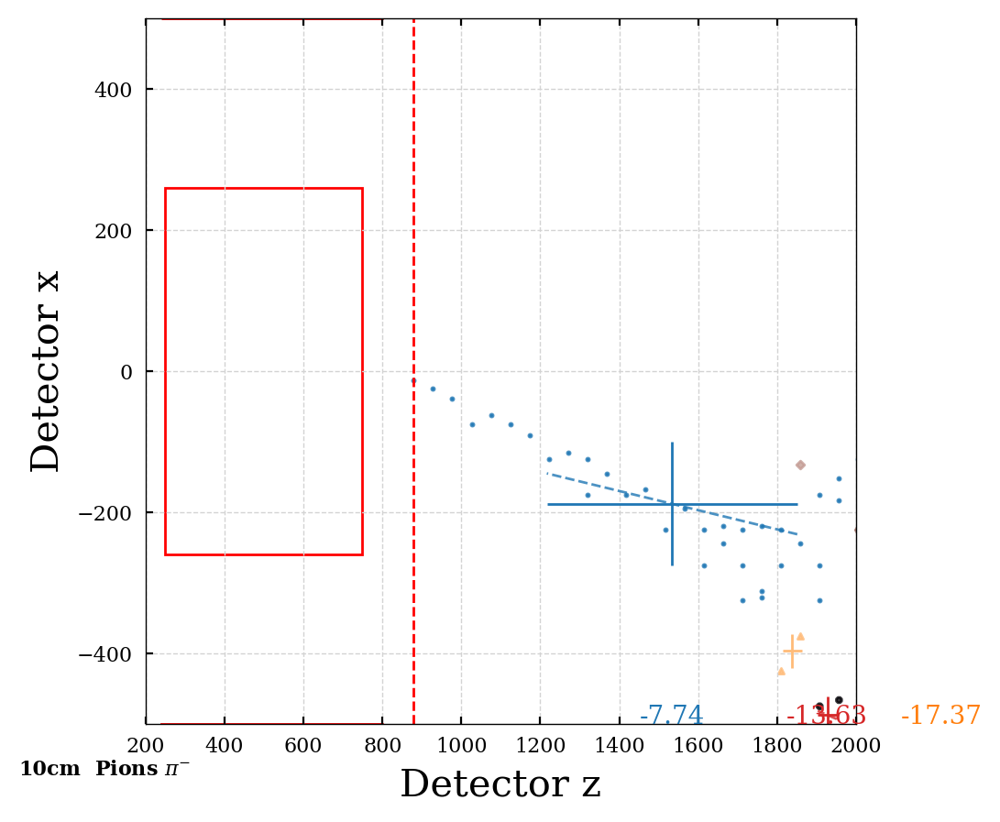

1


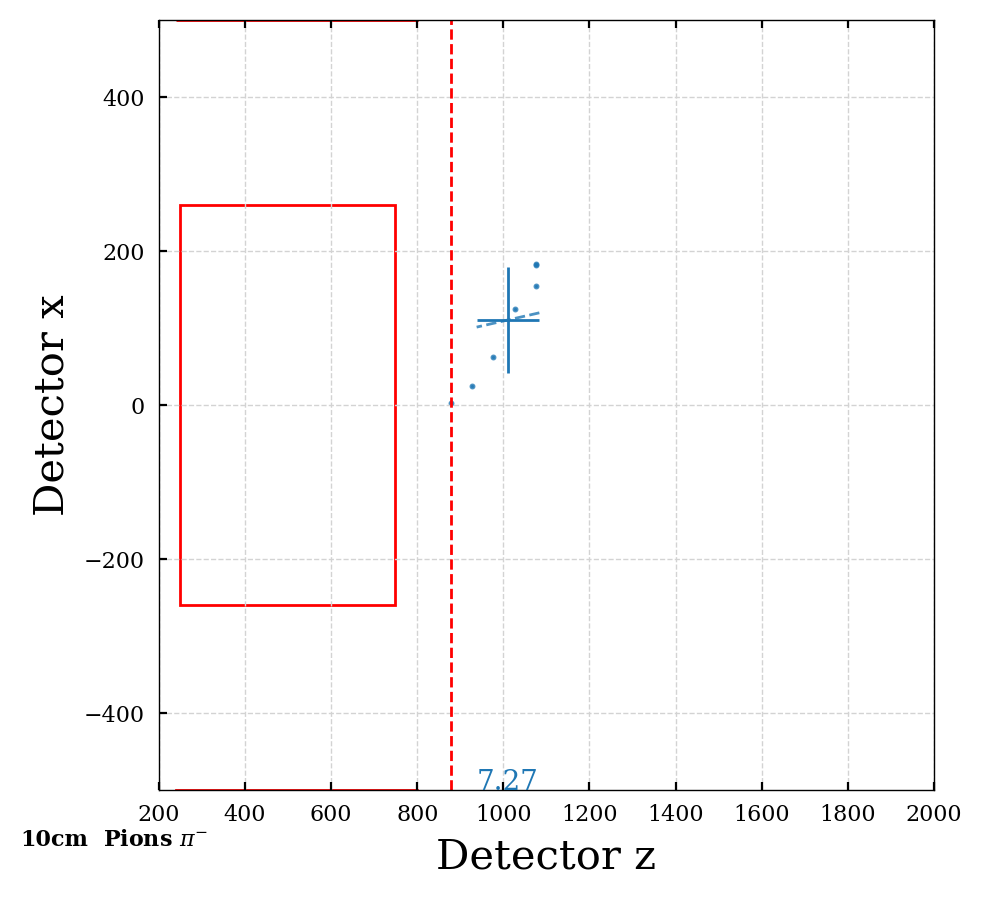

1


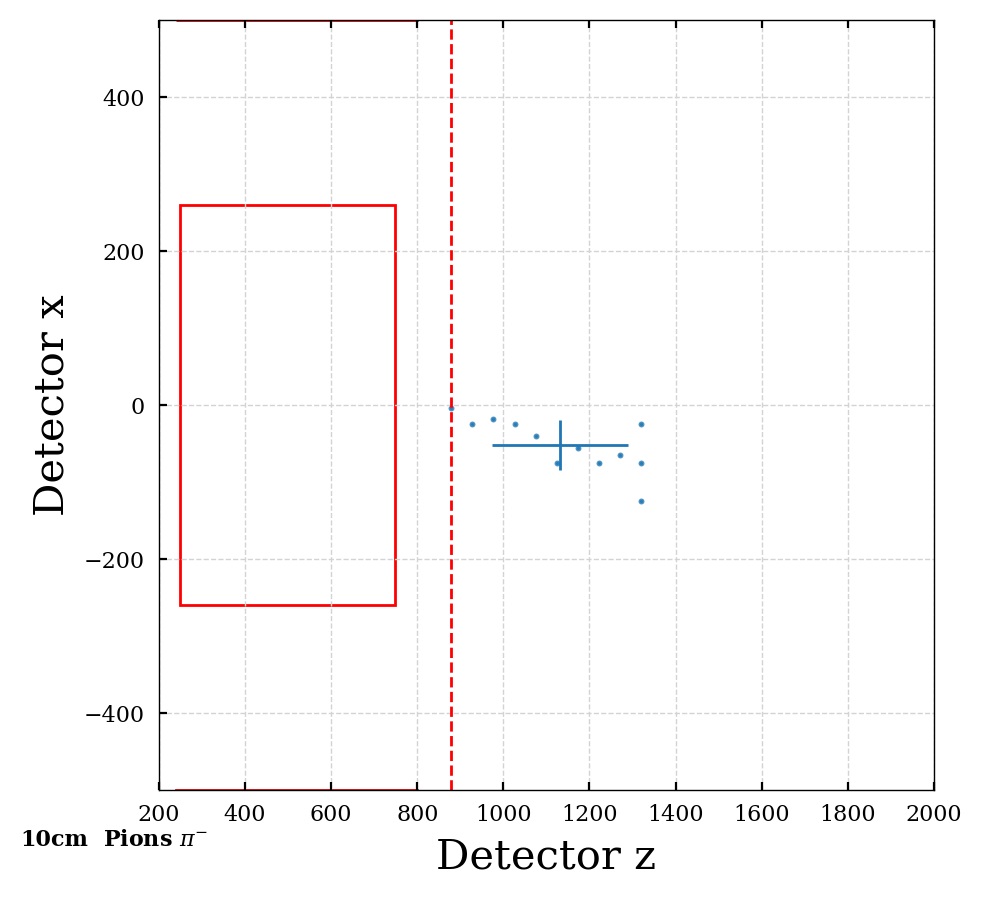

2


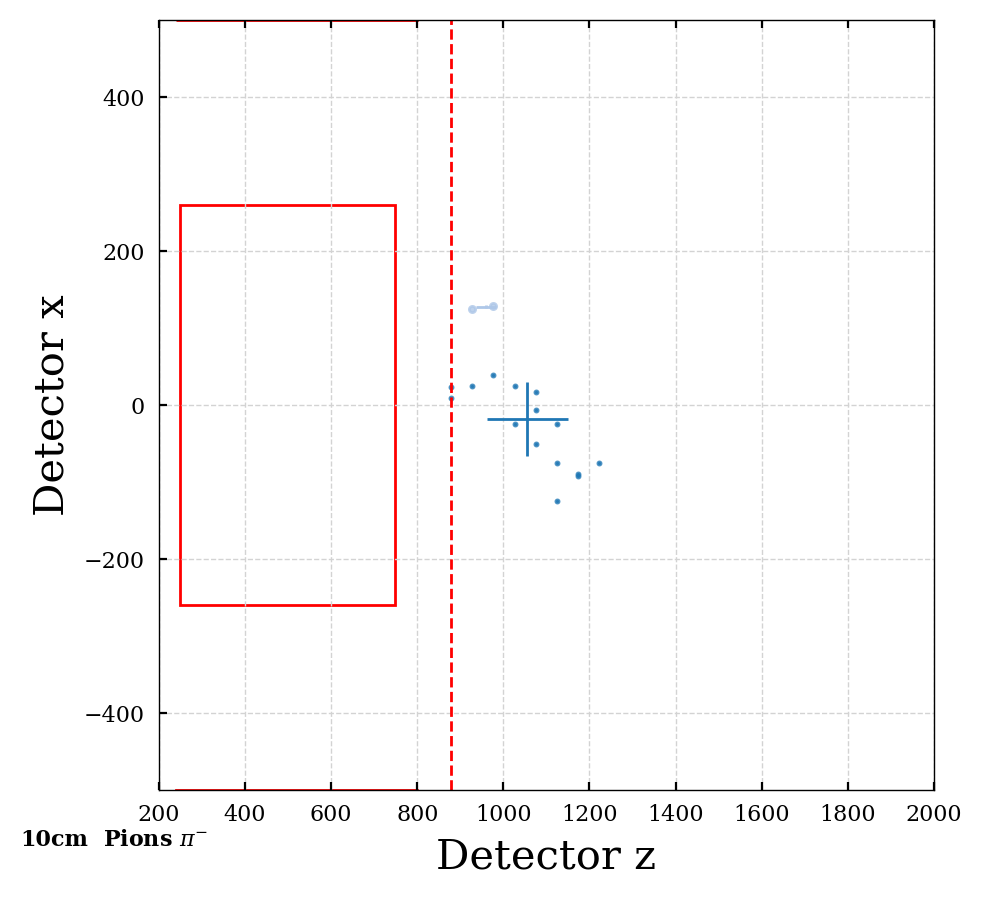

1


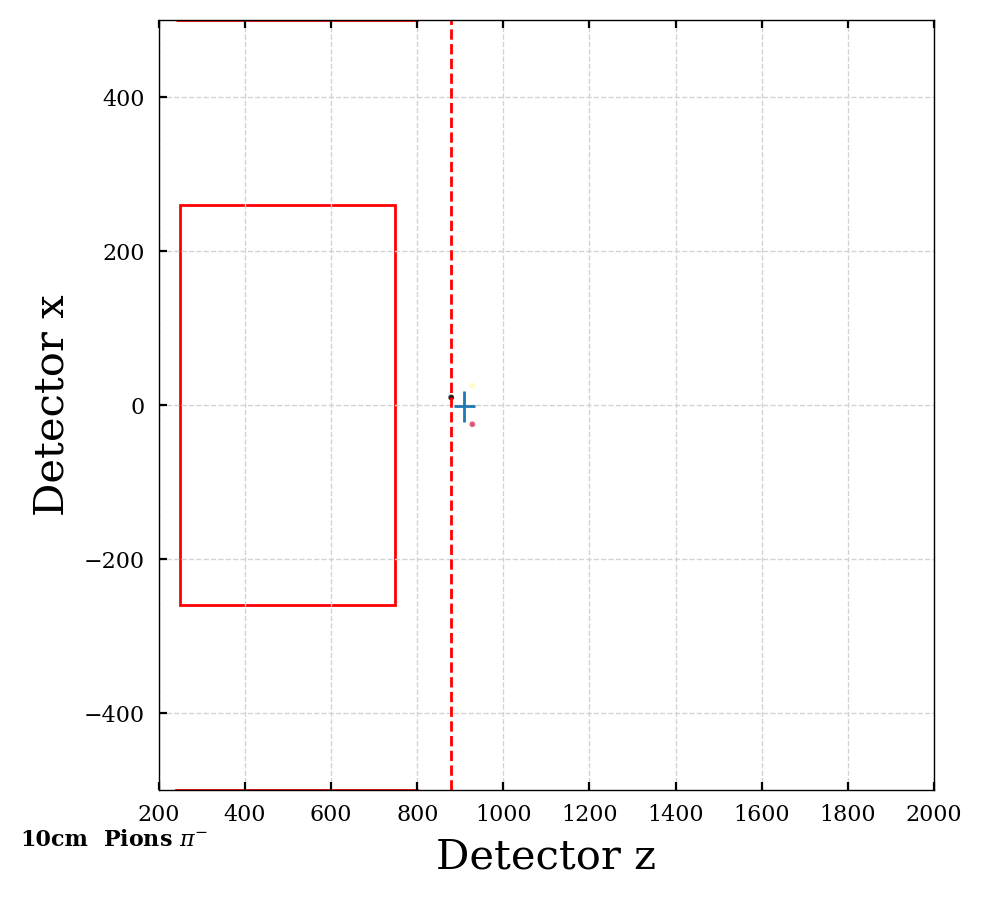

1


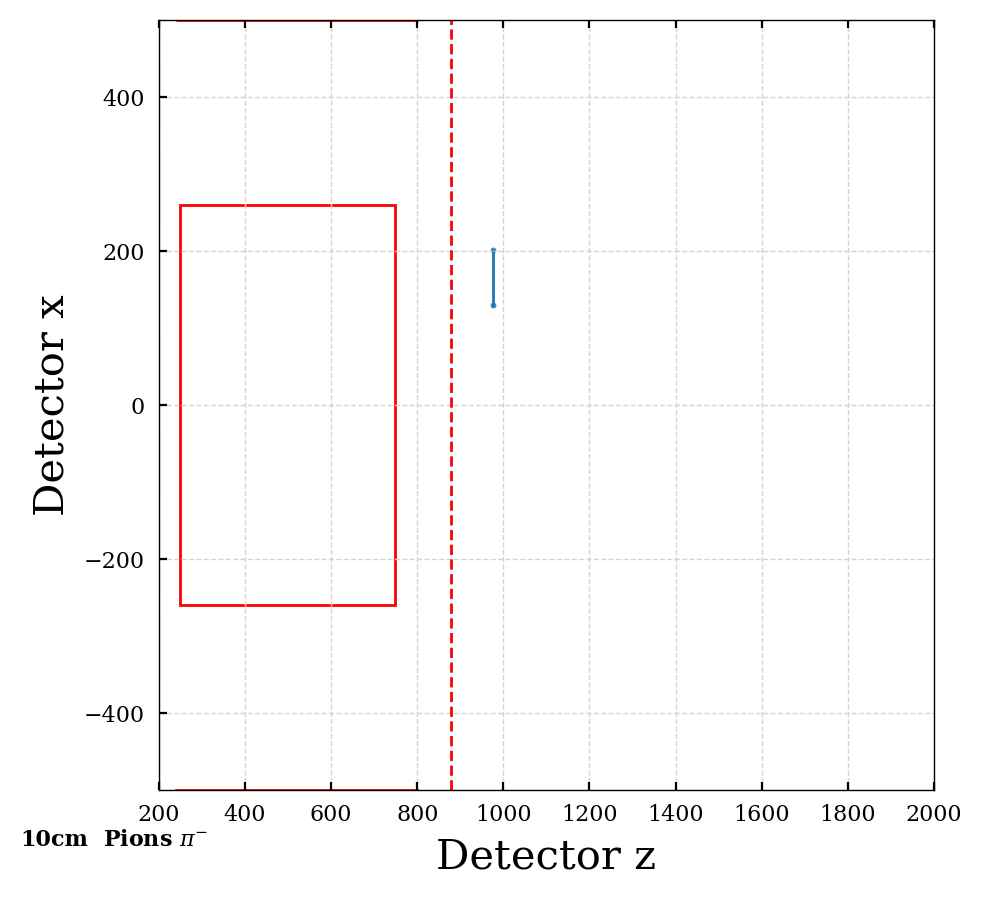

7


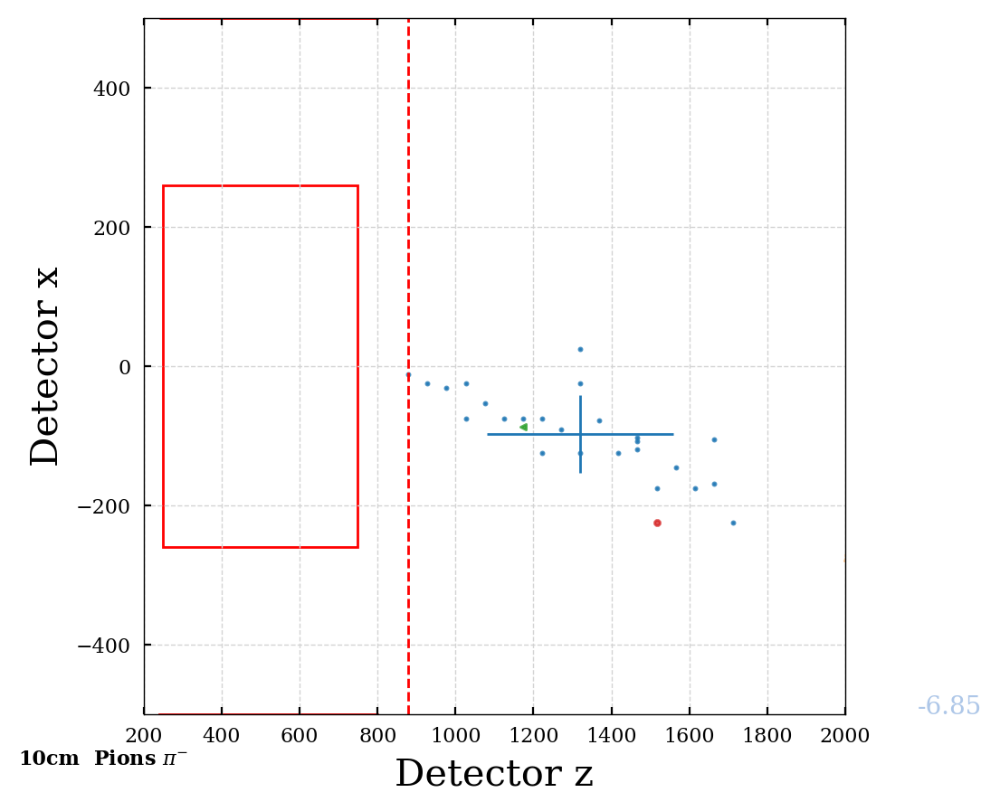

In [37]:
plot_cluster_dist(particles_dict_10cm, 10, spec_part='pions', ipart=None, xlim=5000, ylim=3000, angle_label=False, xory='x')
# randomly select events
for ipart in np.random.randint(0, high=1e4, size=10, dtype=int):
    plot_cluster_dist(particles_dict_10cm, 10, spec_part='pions', ipart=ipart, xlim=2000, ylim=500, angle_label=True, xory='x')

29


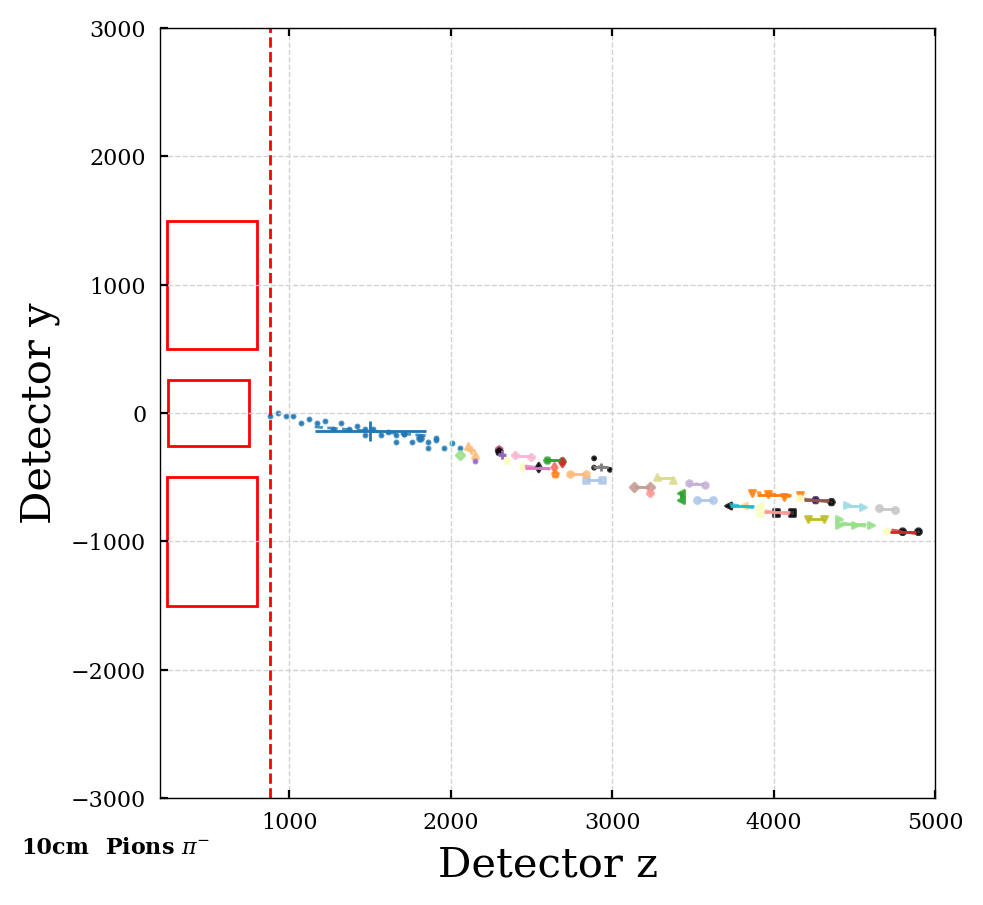

4


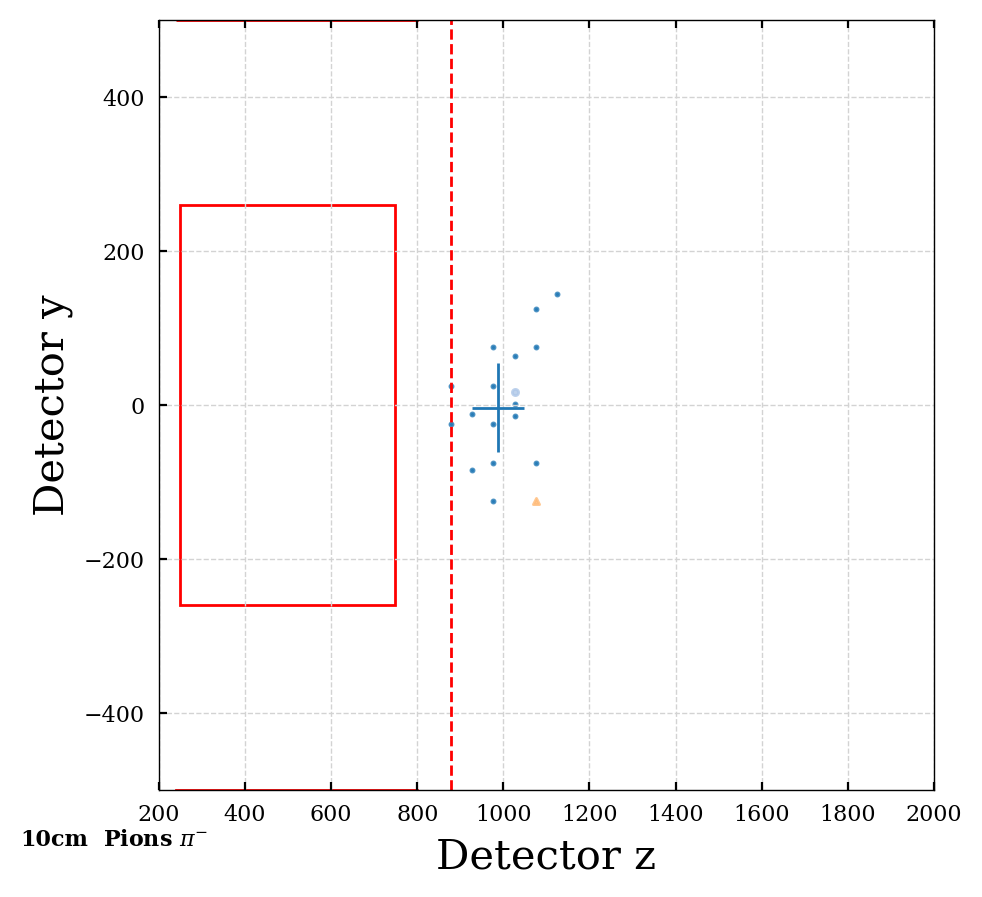

4


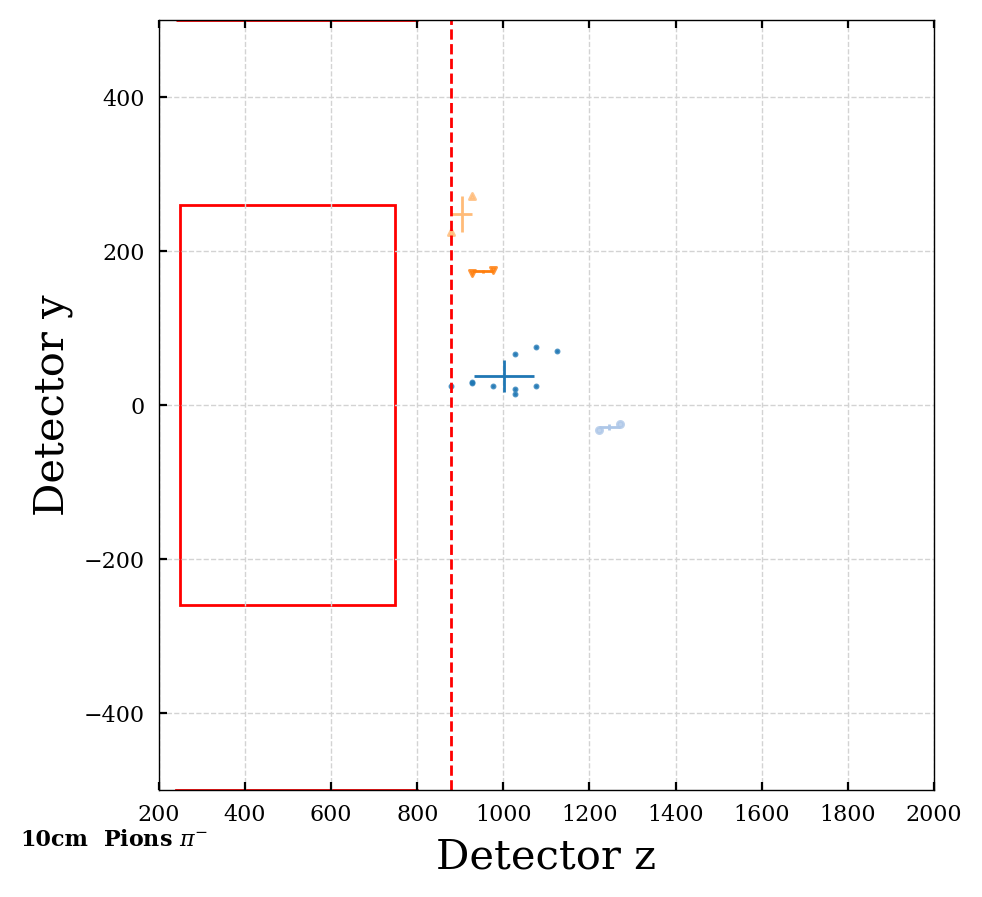

14


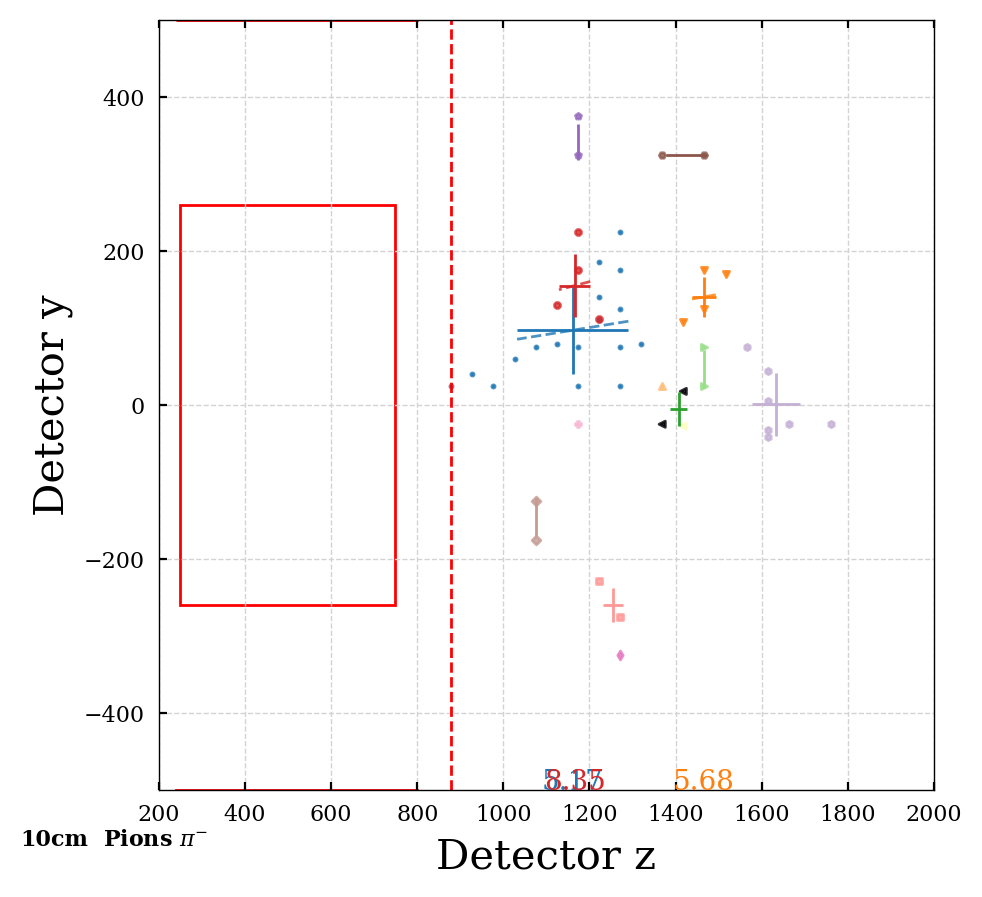

3


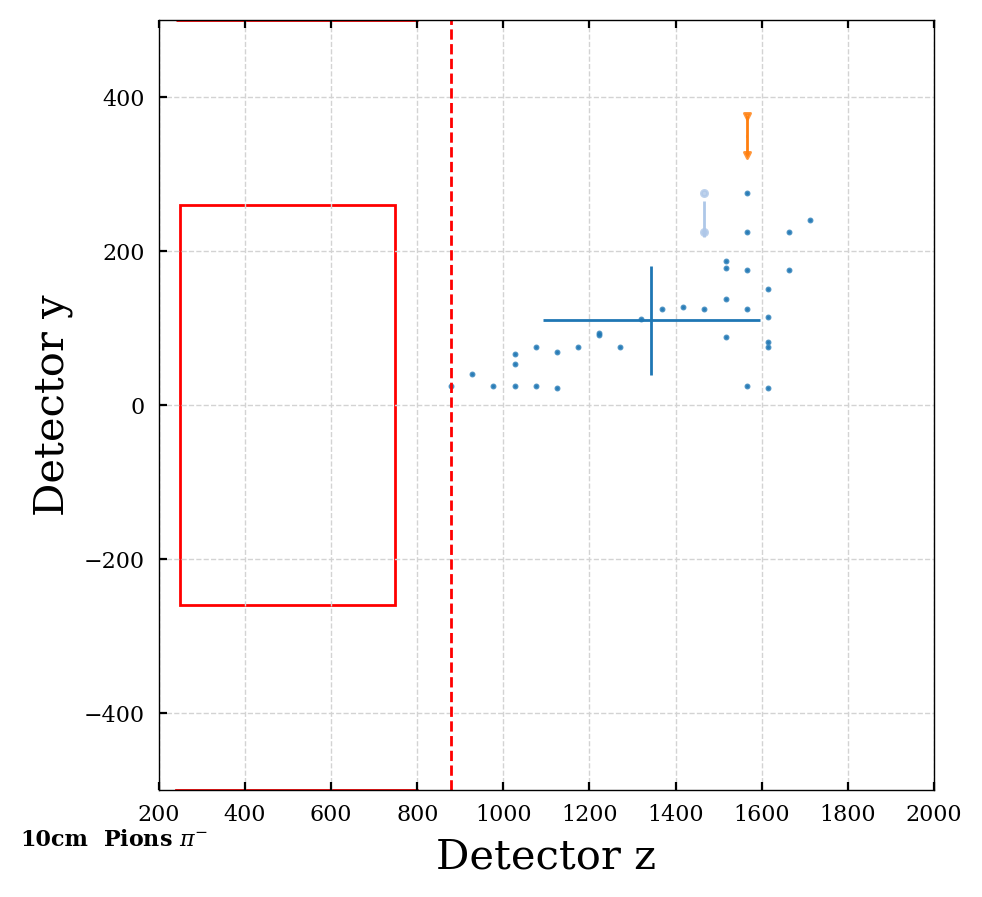

4


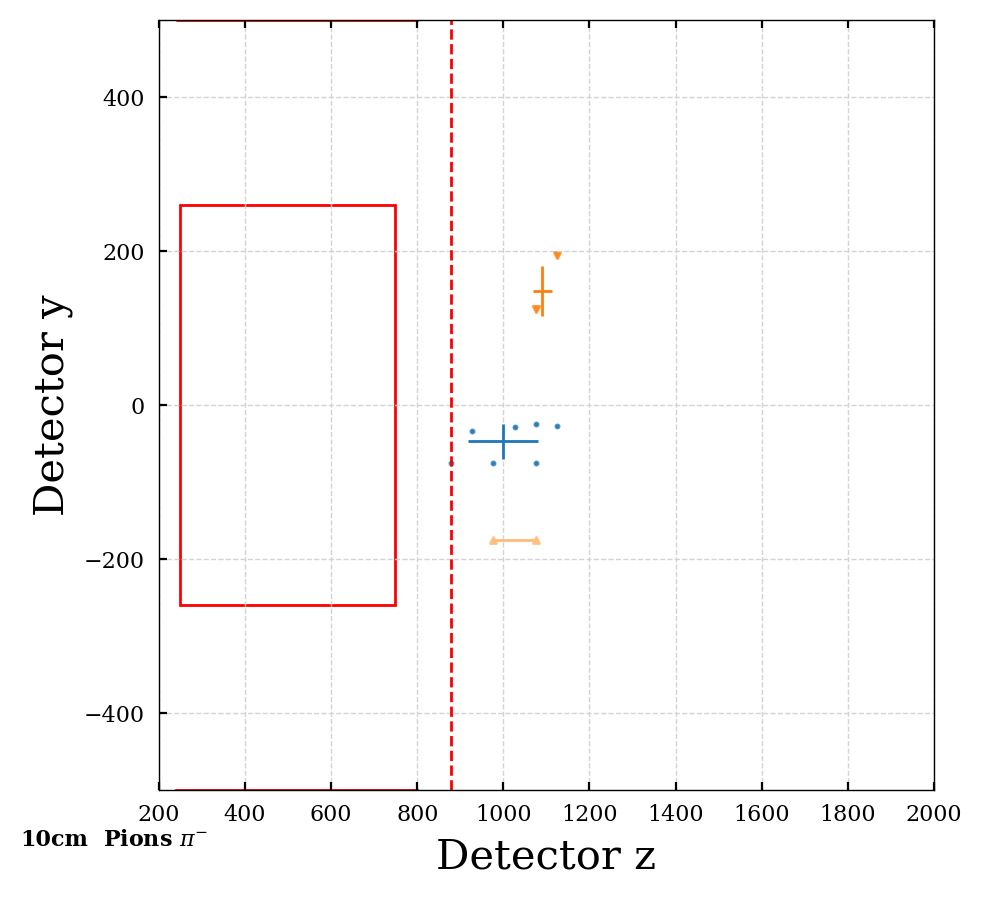

7


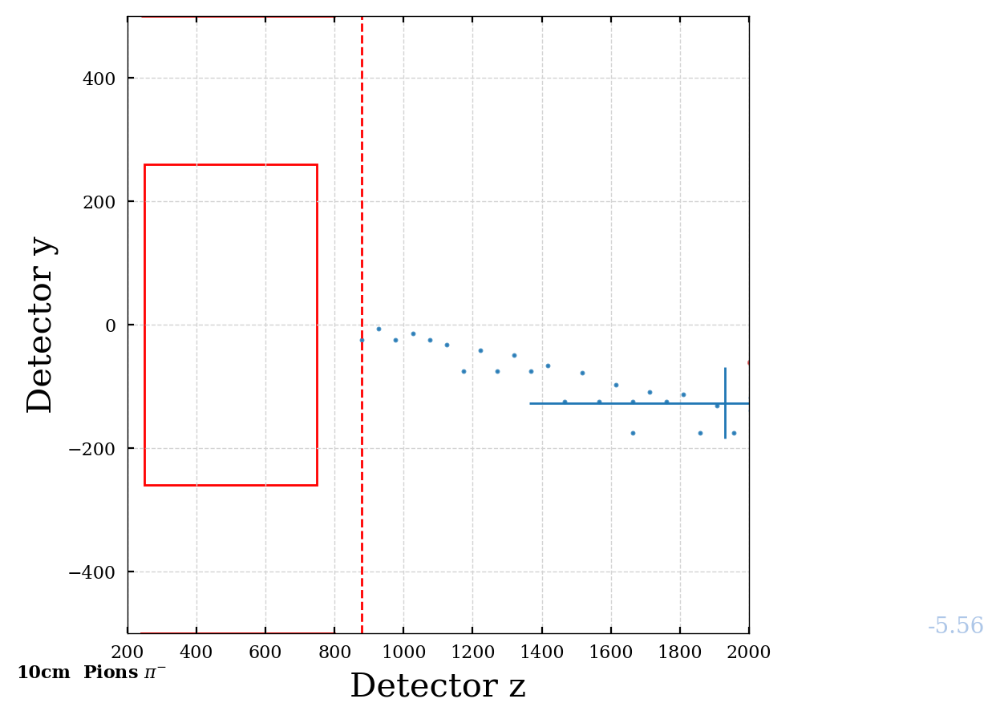

7


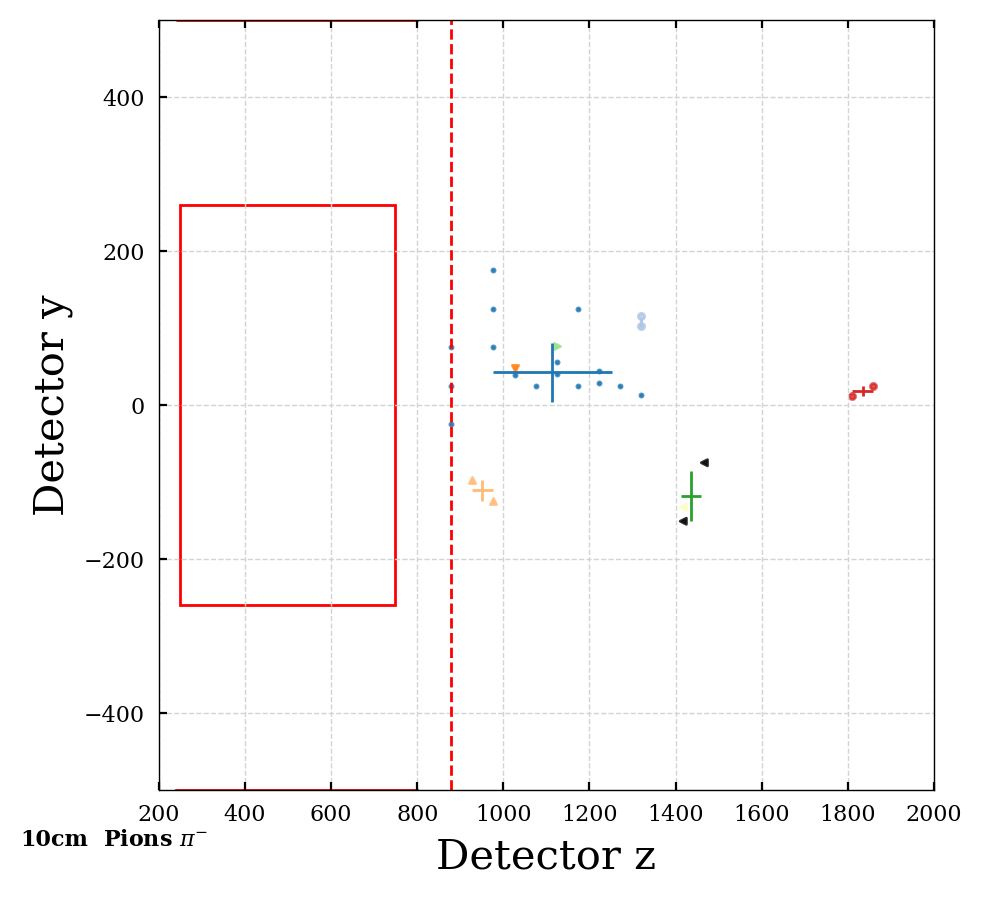

4


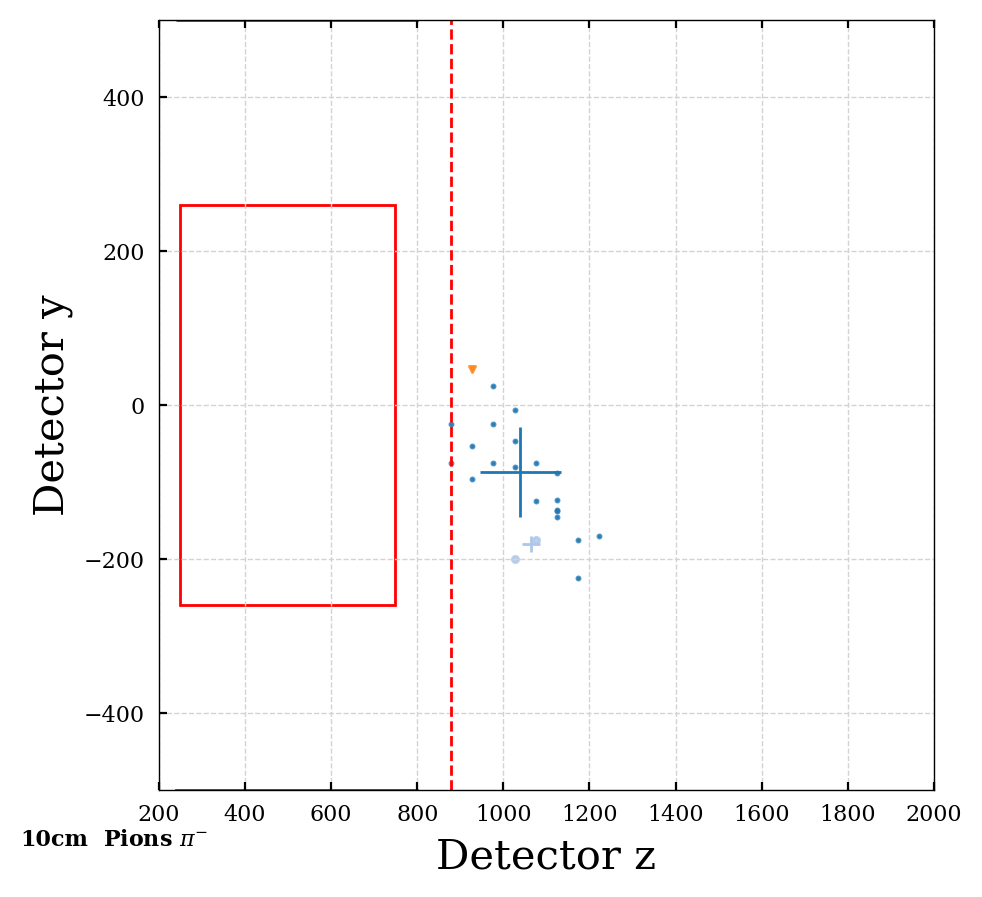

2


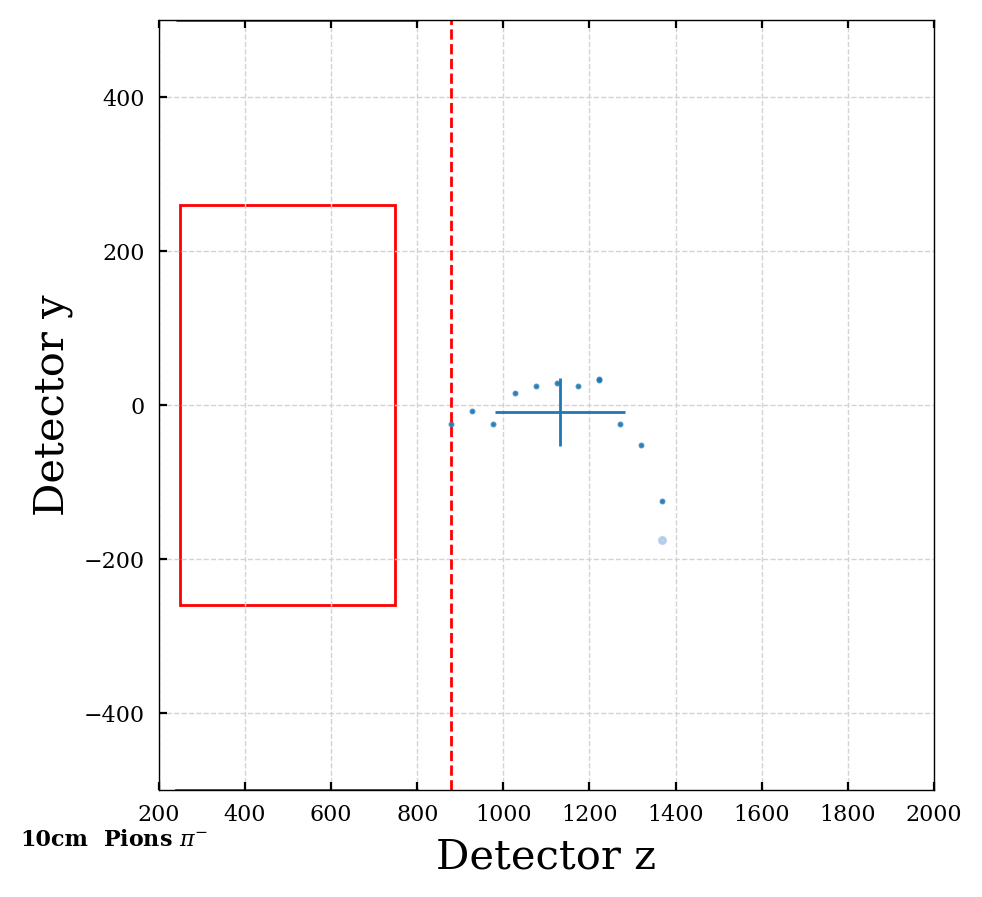

6


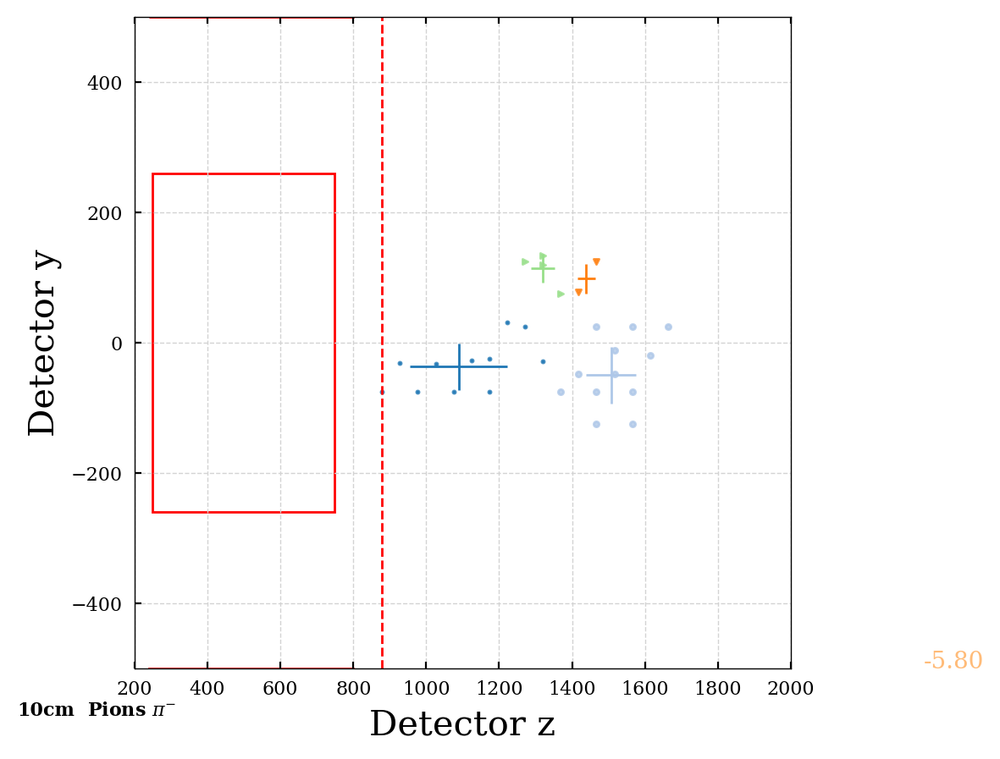

In [38]:
plot_cluster_dist(particles_dict_10cm, 10, spec_part='pions', ipart=None, xlim=5000, ylim=3000, angle_label=False, xory='y')
# randomly select events
for ipart in np.random.randint(0, high=1e4, size=10, dtype=int):
    plot_cluster_dist(particles_dict_10cm, 10, spec_part='pions', ipart=ipart, xlim=2000, ylim=500, angle_label=True, xory='y')

15


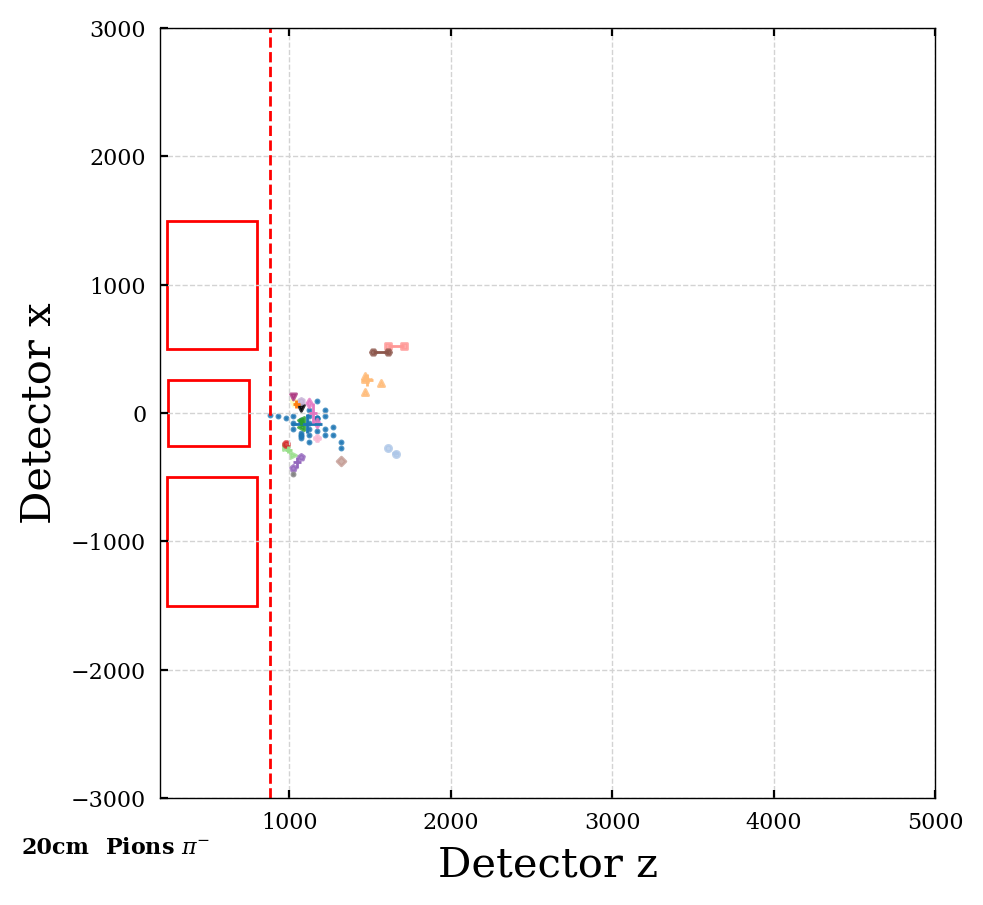

4


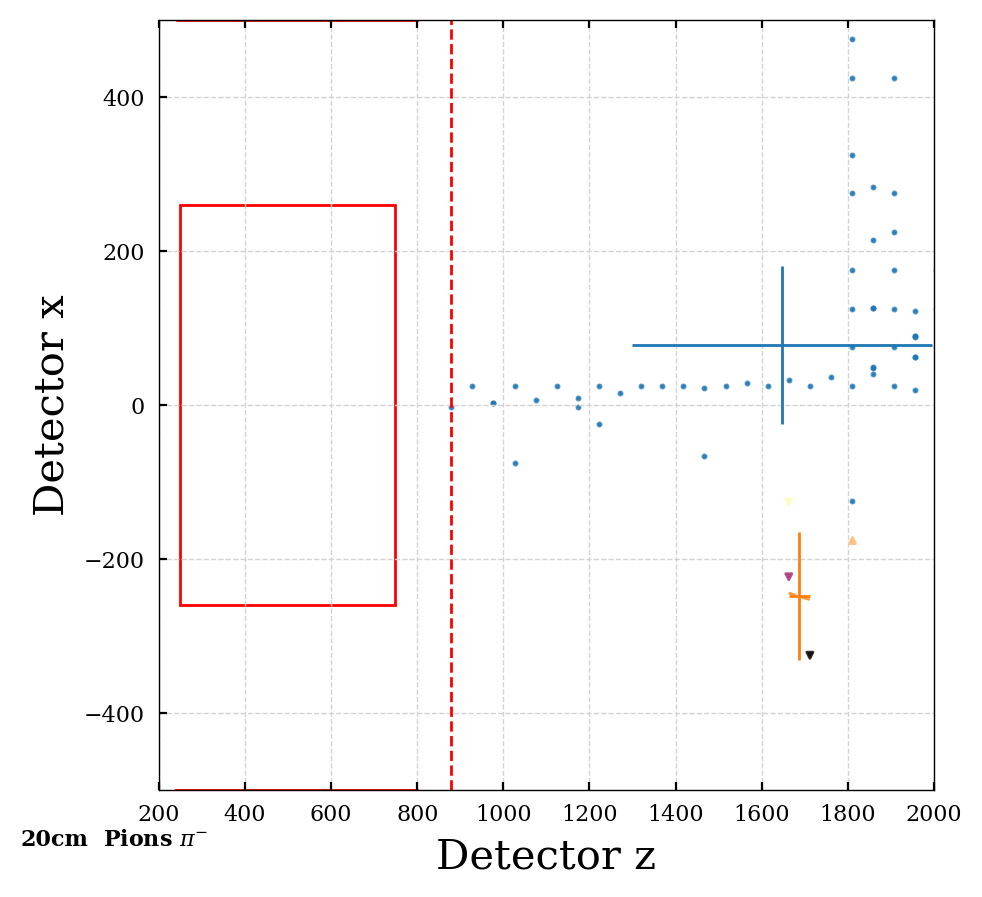

1


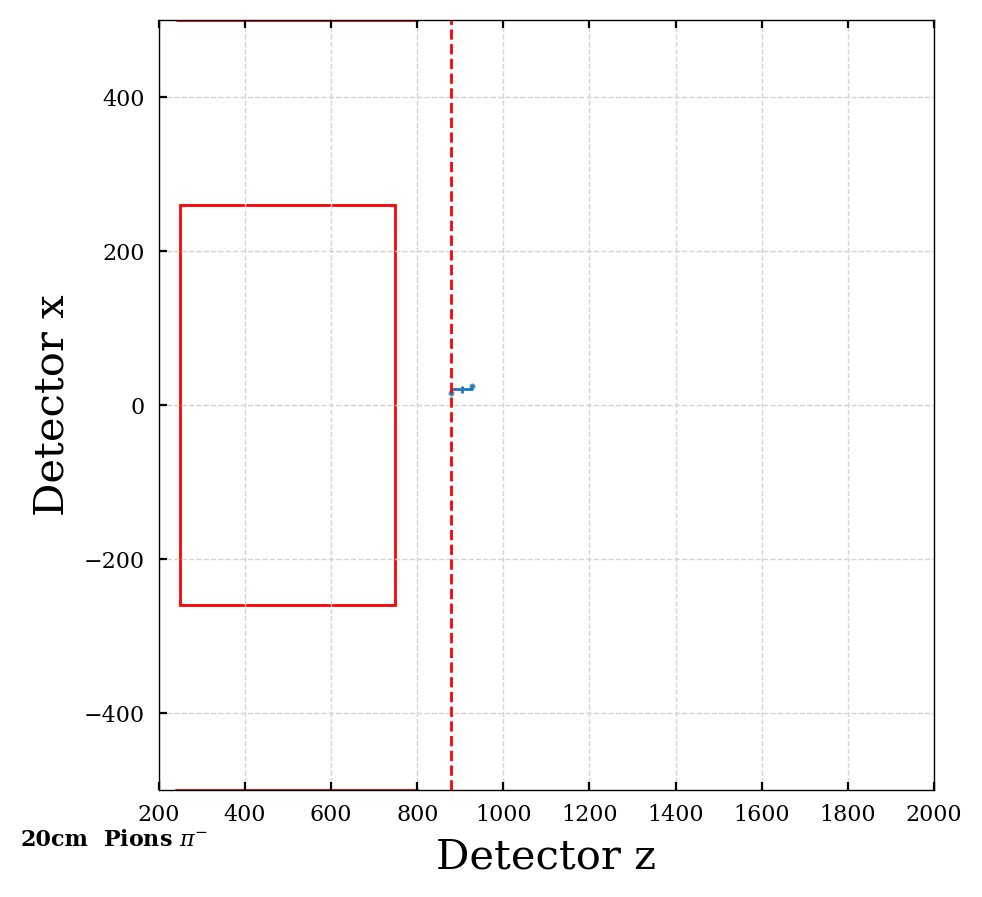

3


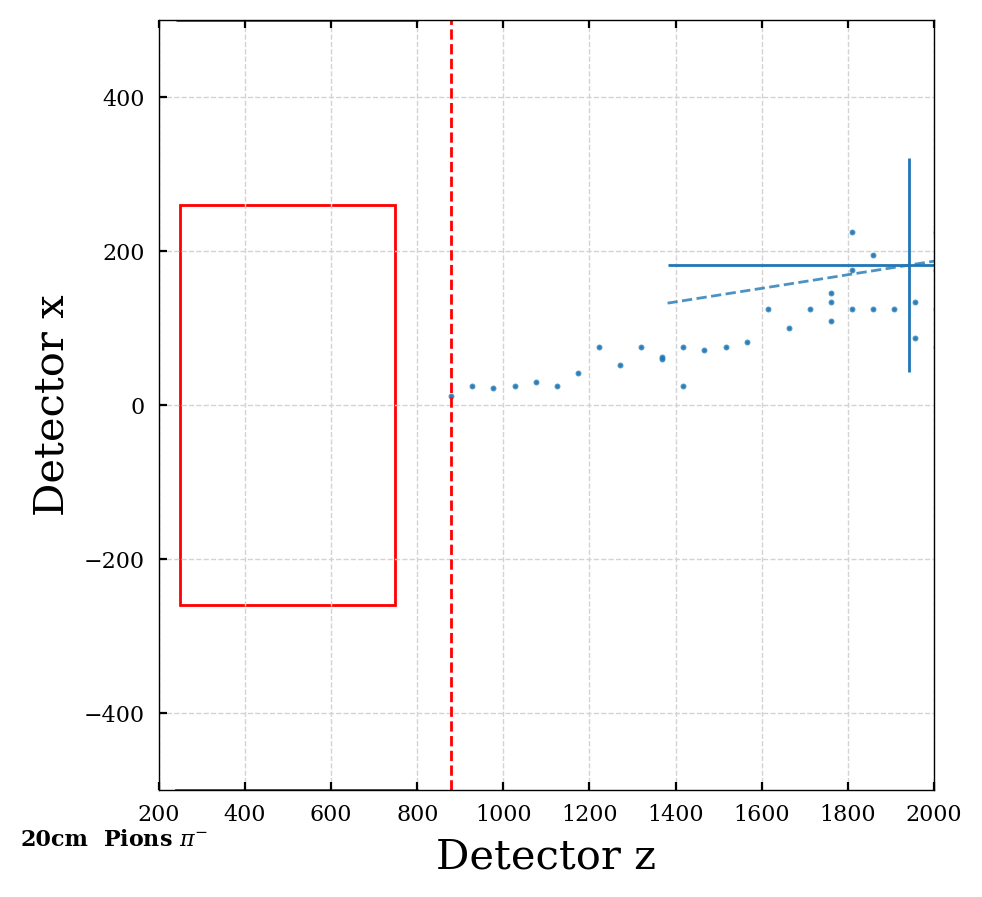

2


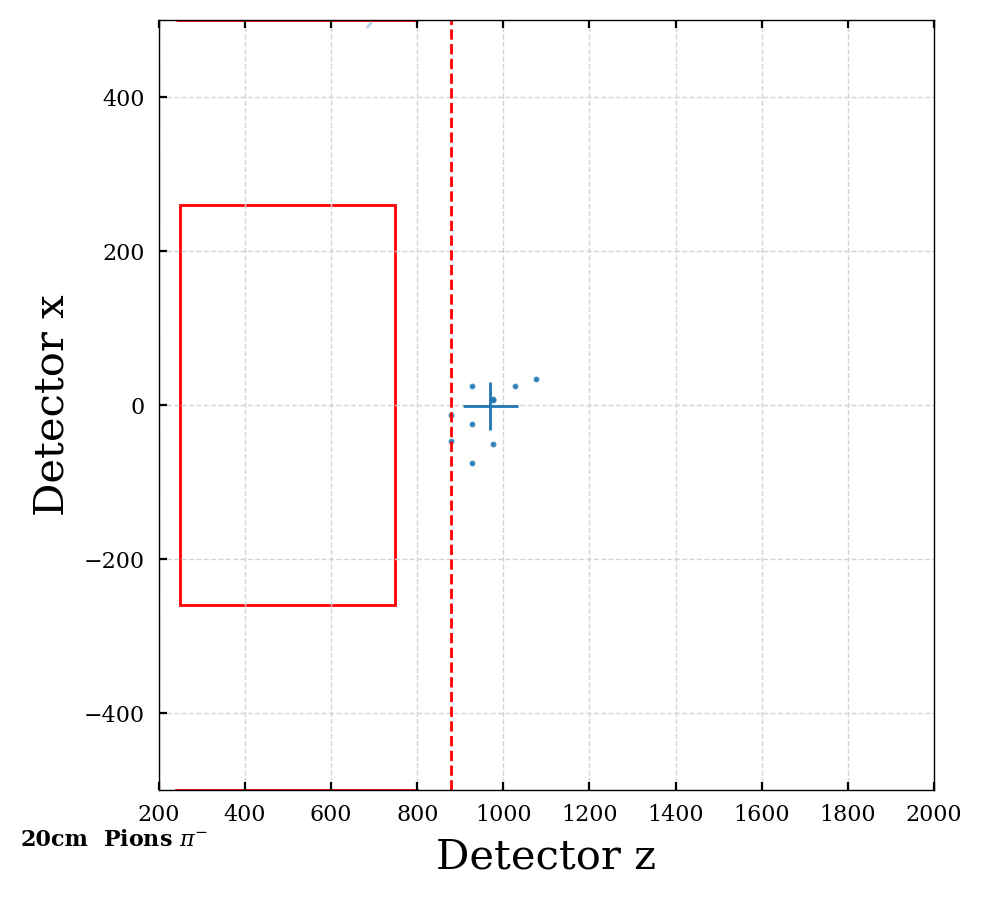

5


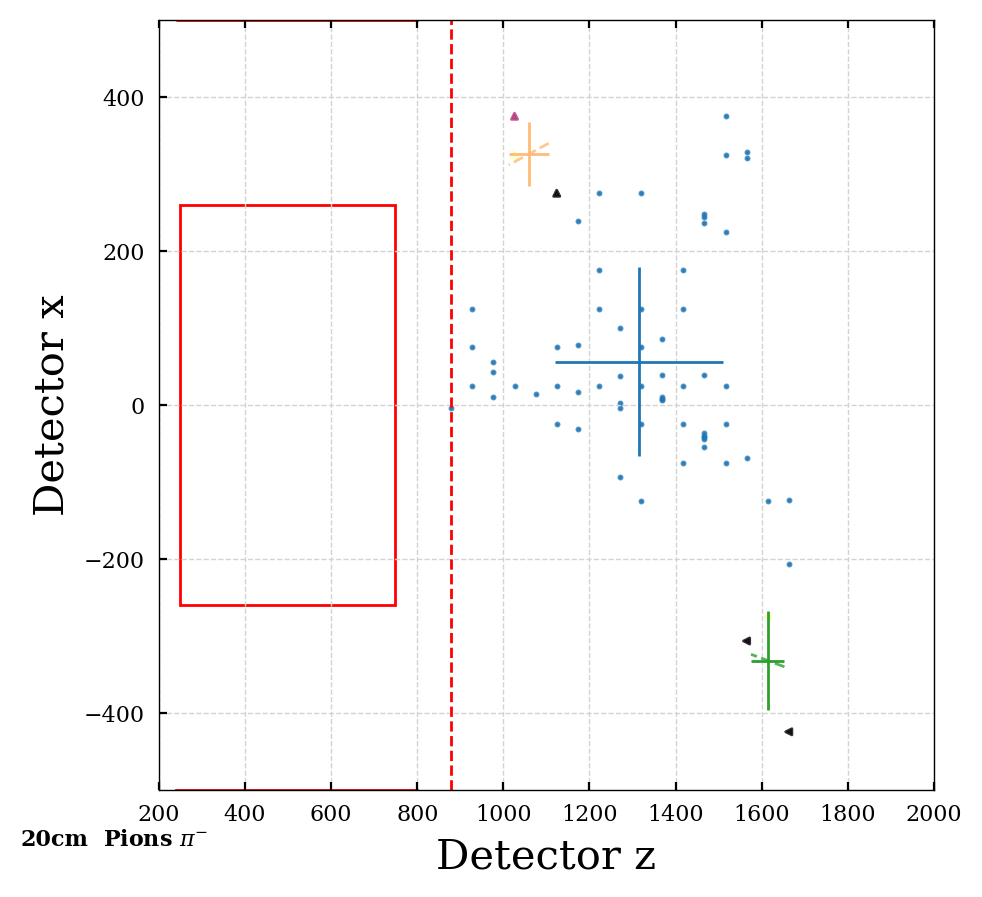

2


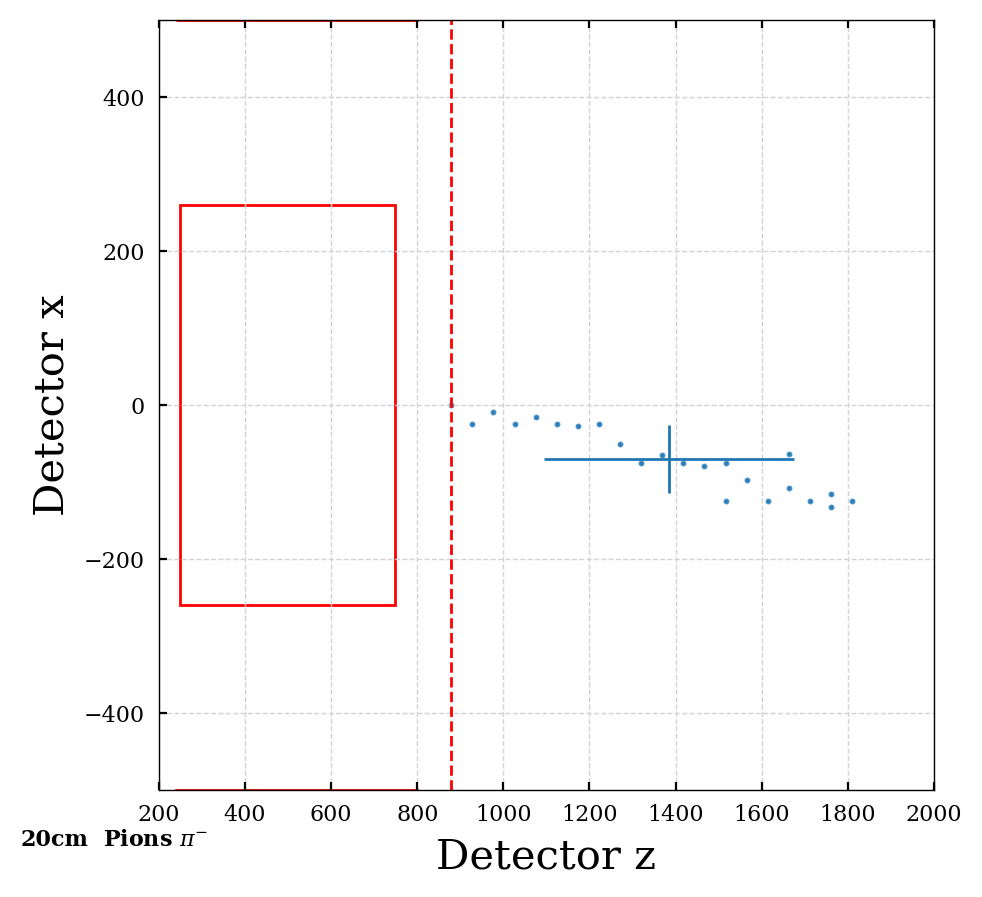

5


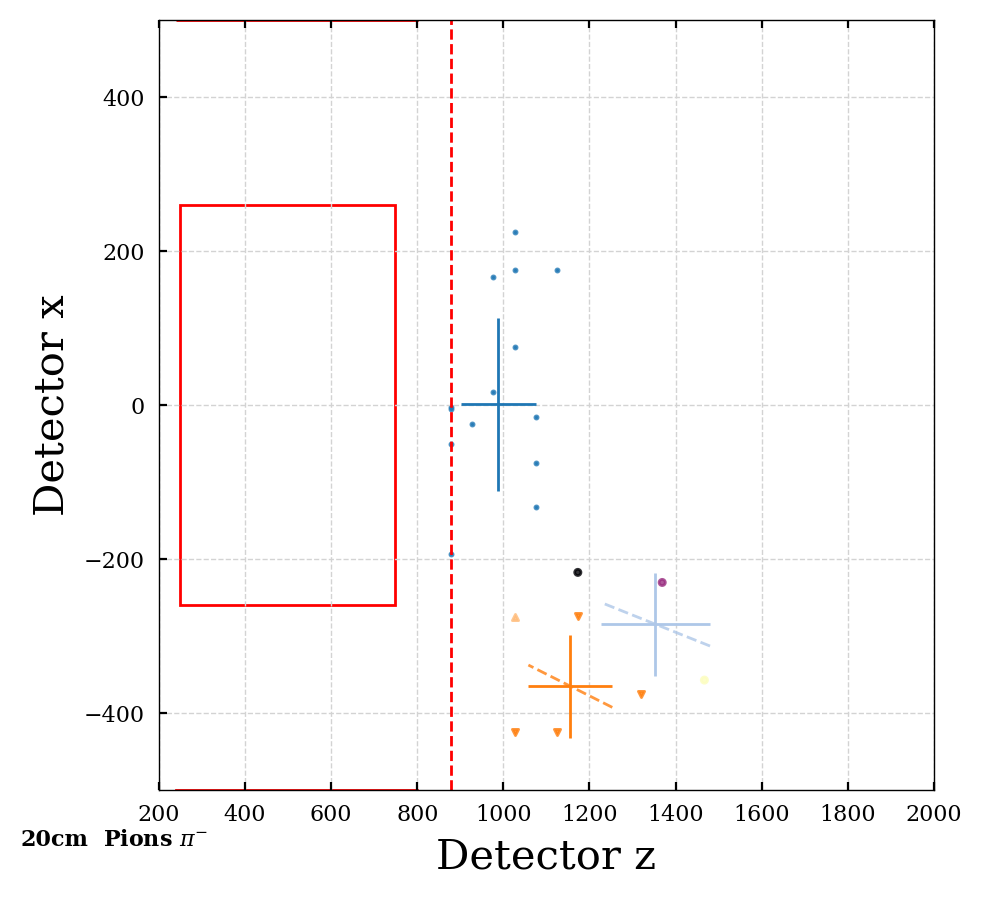

5


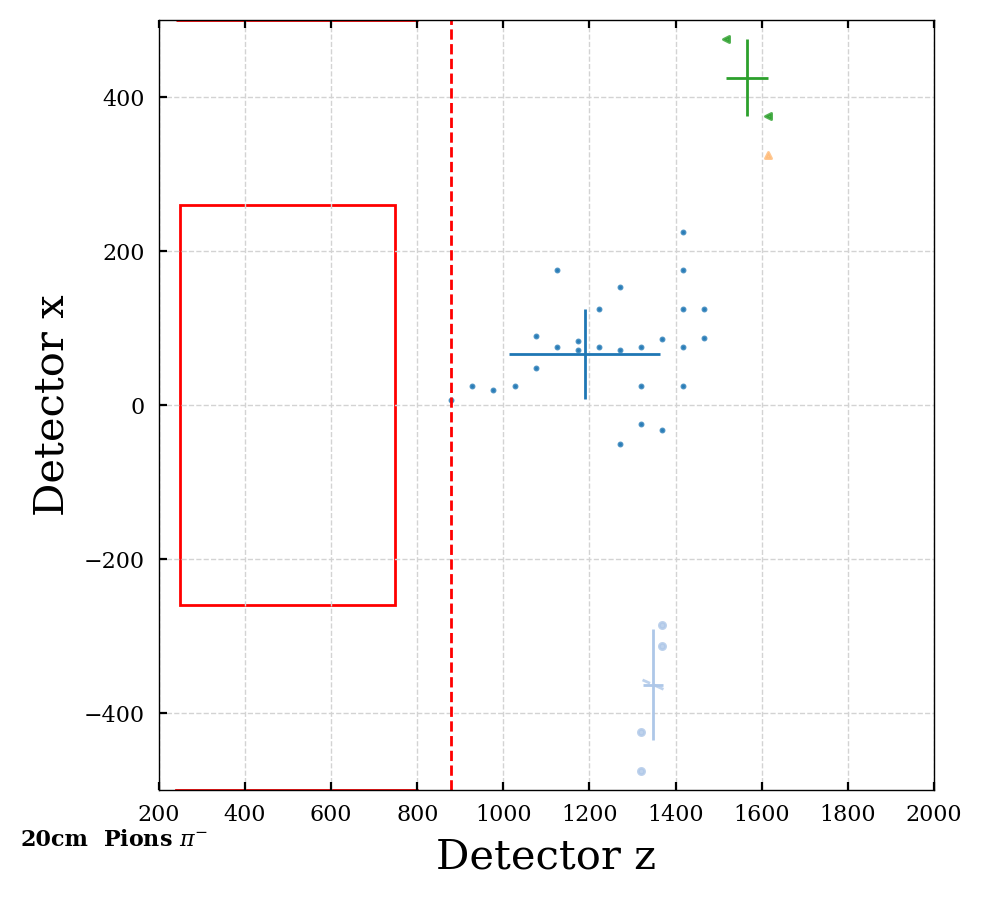

8


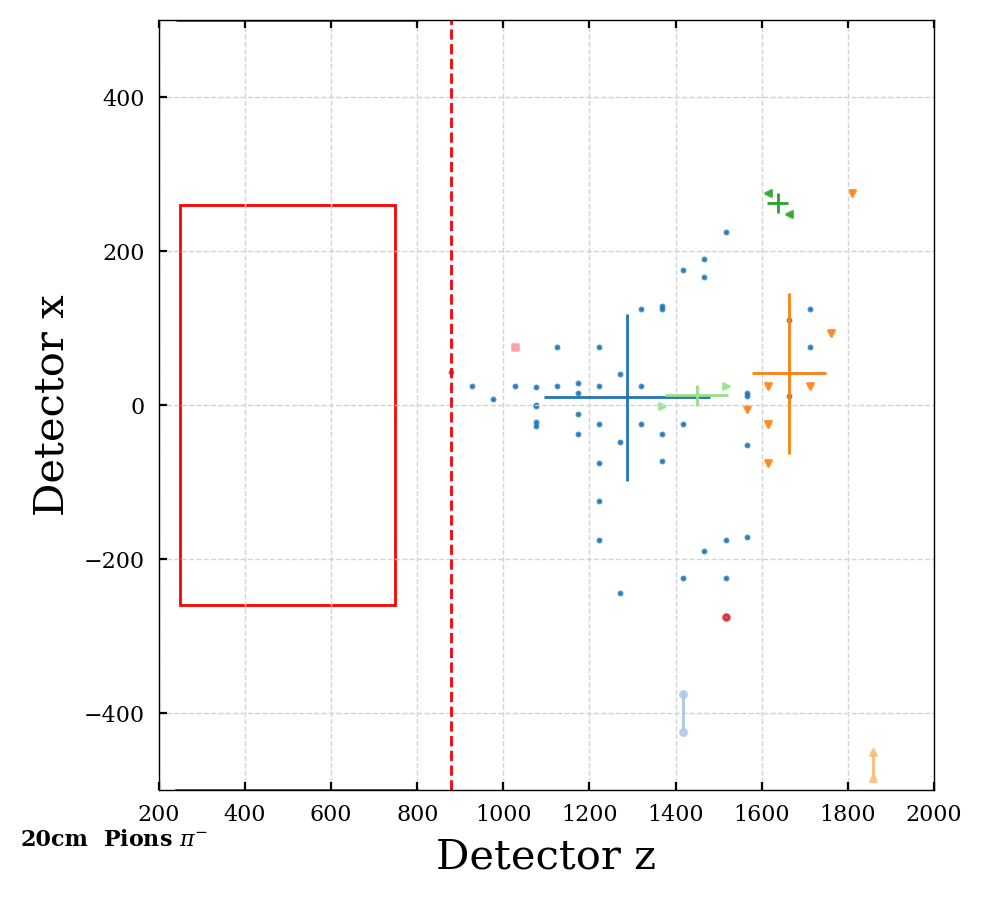

7


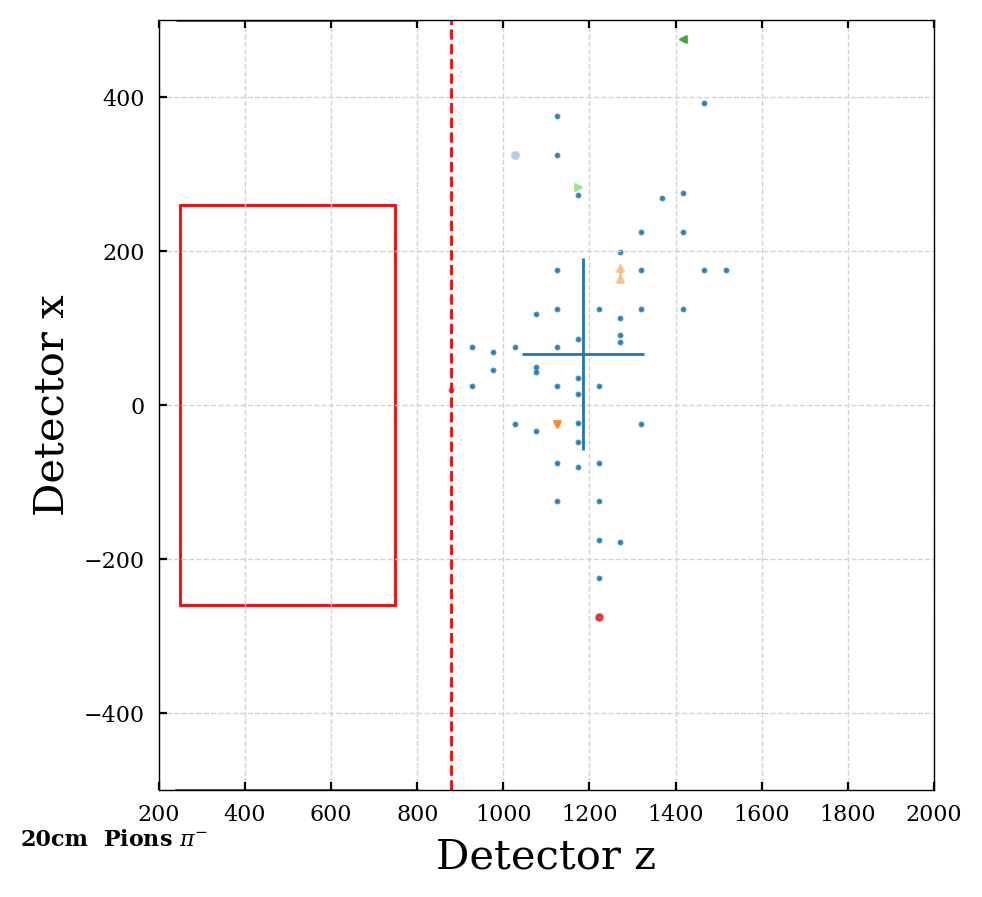

In [39]:
plot_cluster_dist(particles_dict_20cm, 20, spec_part='pions', ipart=None, xlim=5000, ylim=3000, angle_label=False)
# randomly select events
for ipart in np.random.randint(0, high=1e4, size=10, dtype=int):
    plot_cluster_dist(particles_dict_20cm, 20, spec_part='pions', ipart=ipart, xlim=2000, ylim=500, angle_label=False)

### Neutrons

21


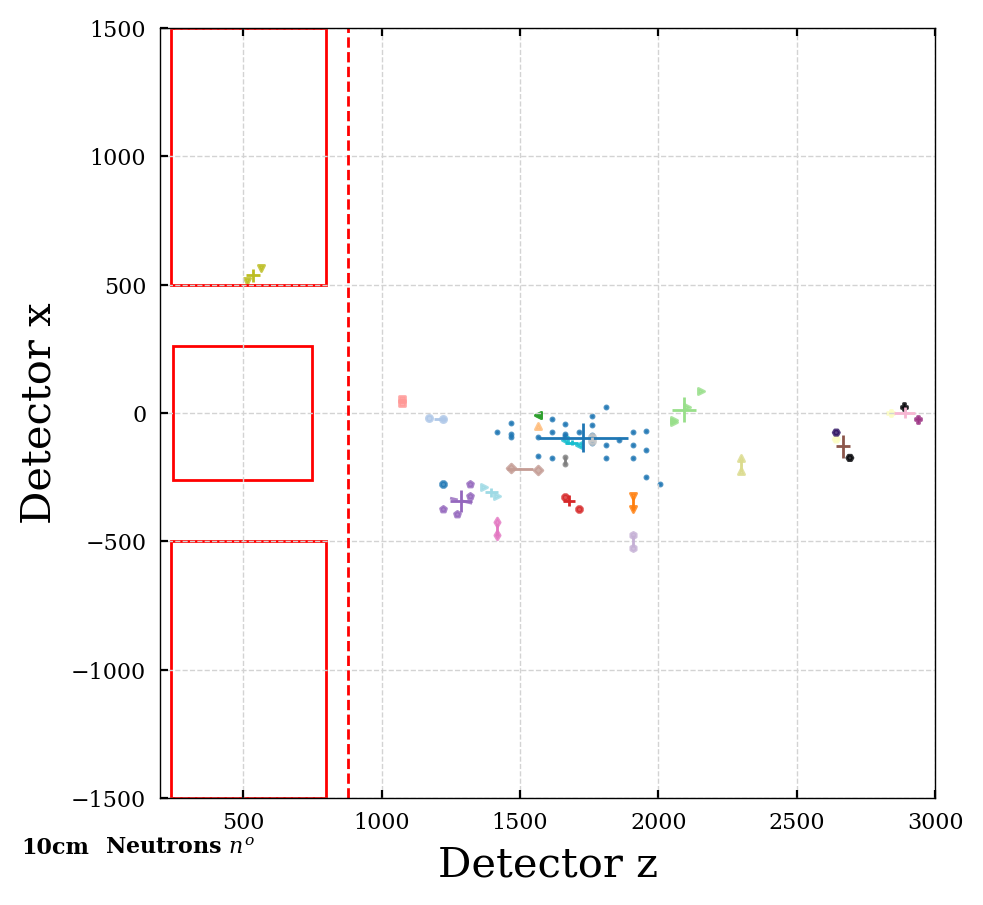

0


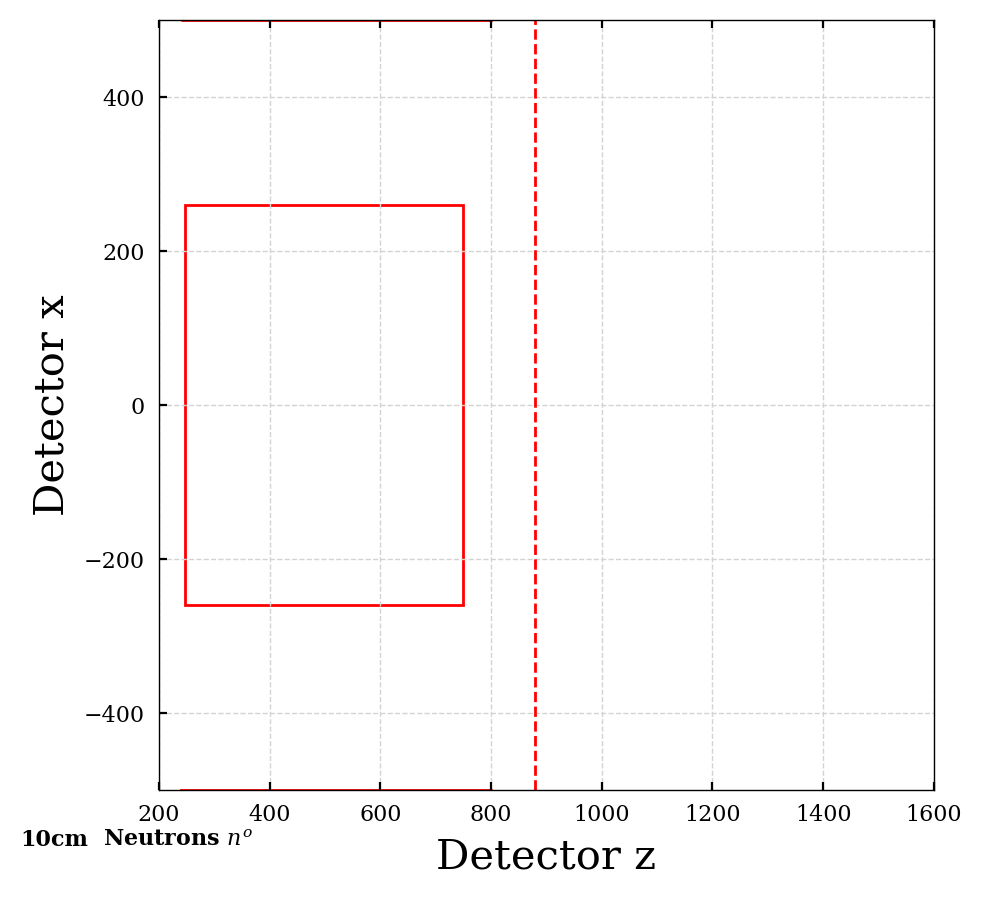

8


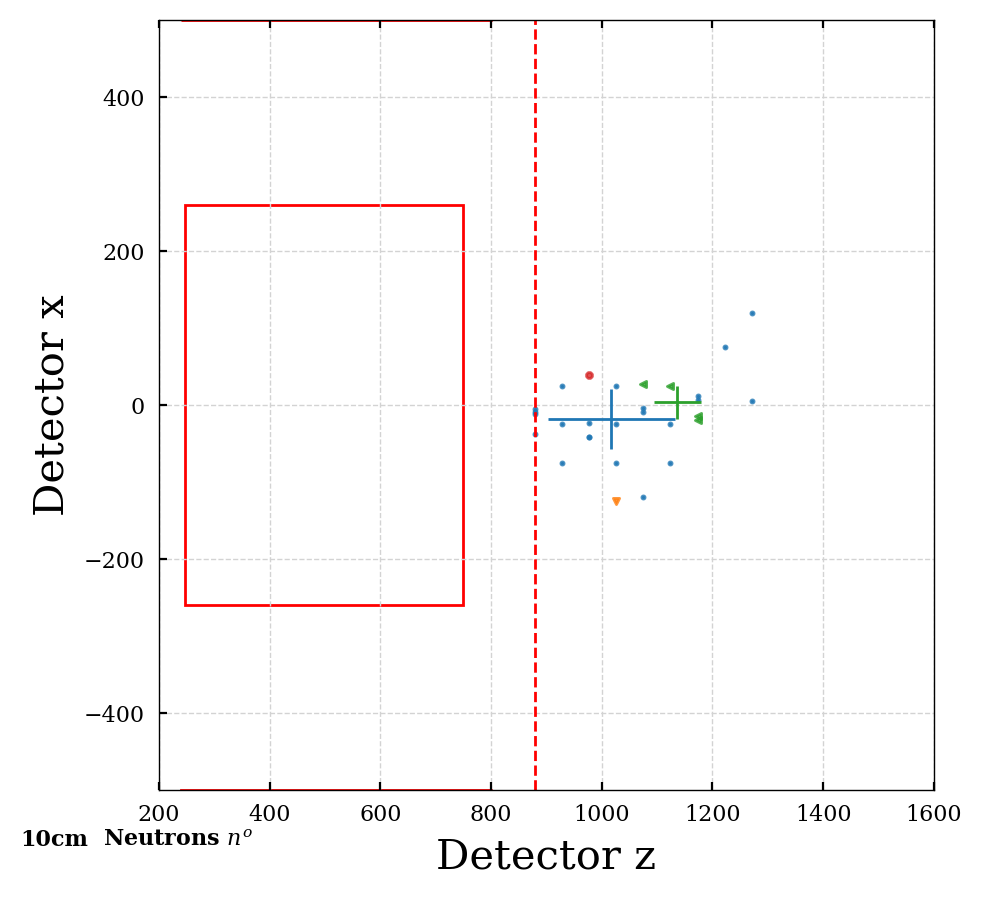

6


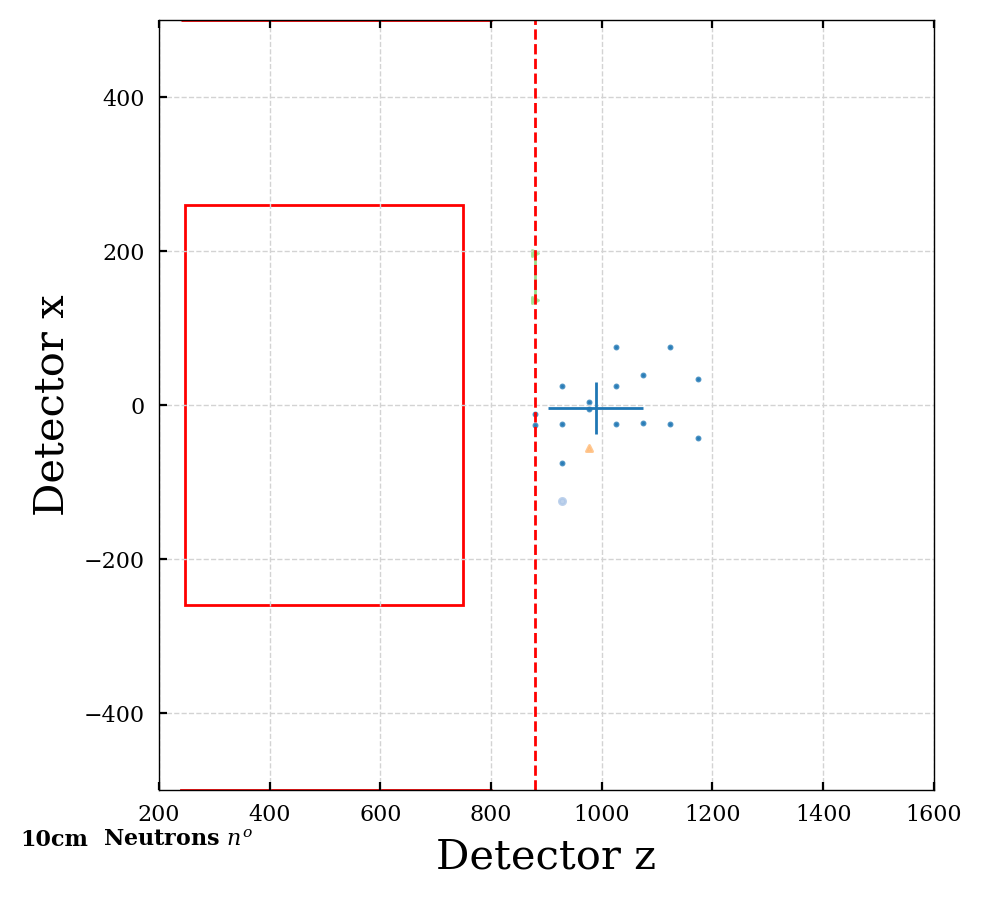

8


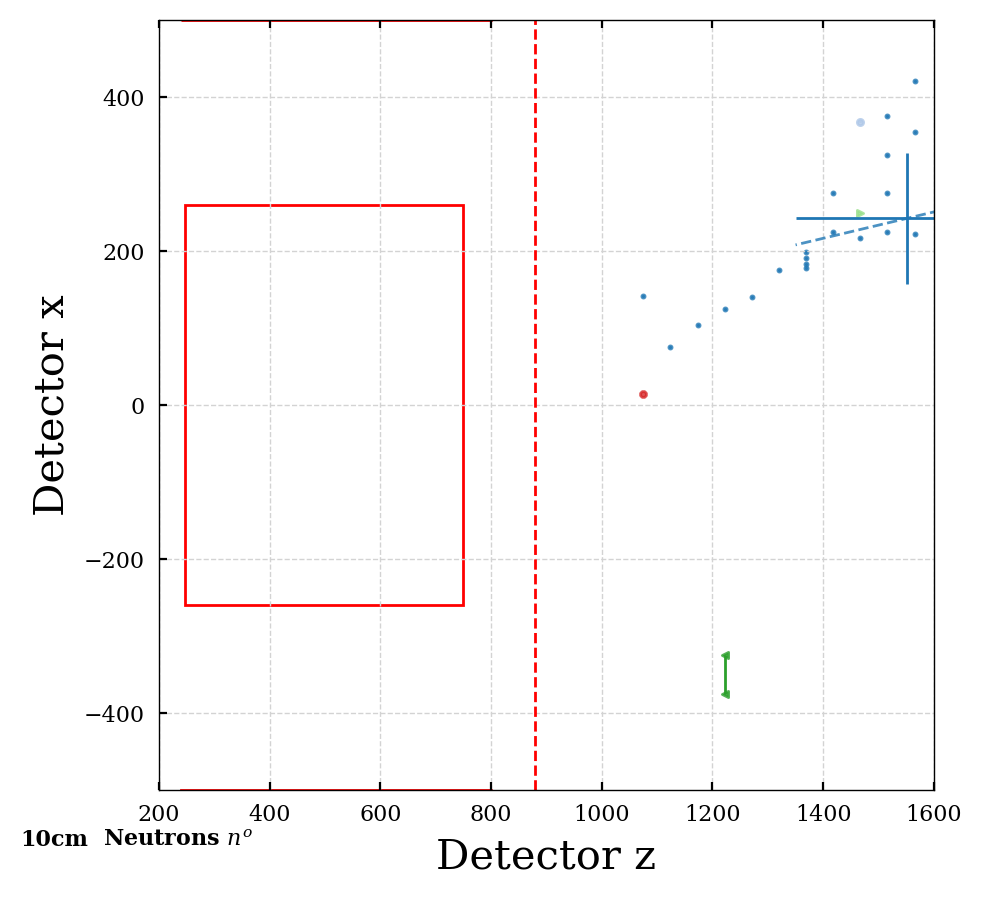

10


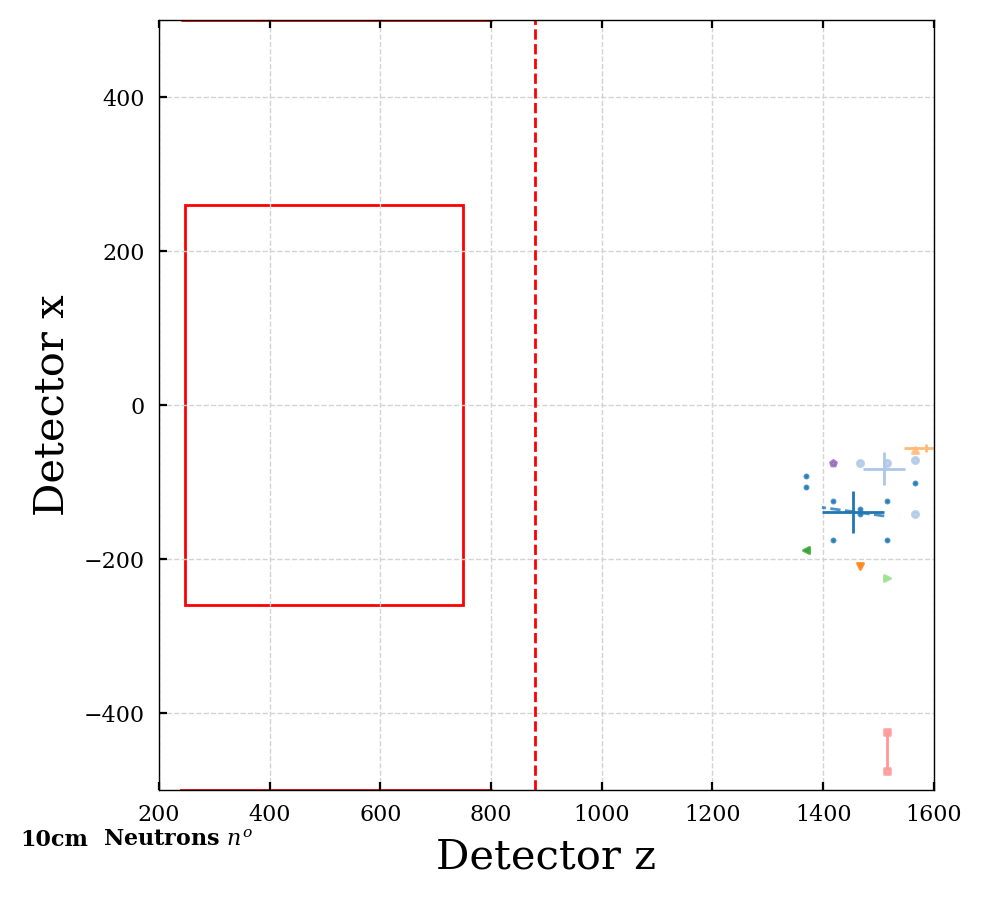

4


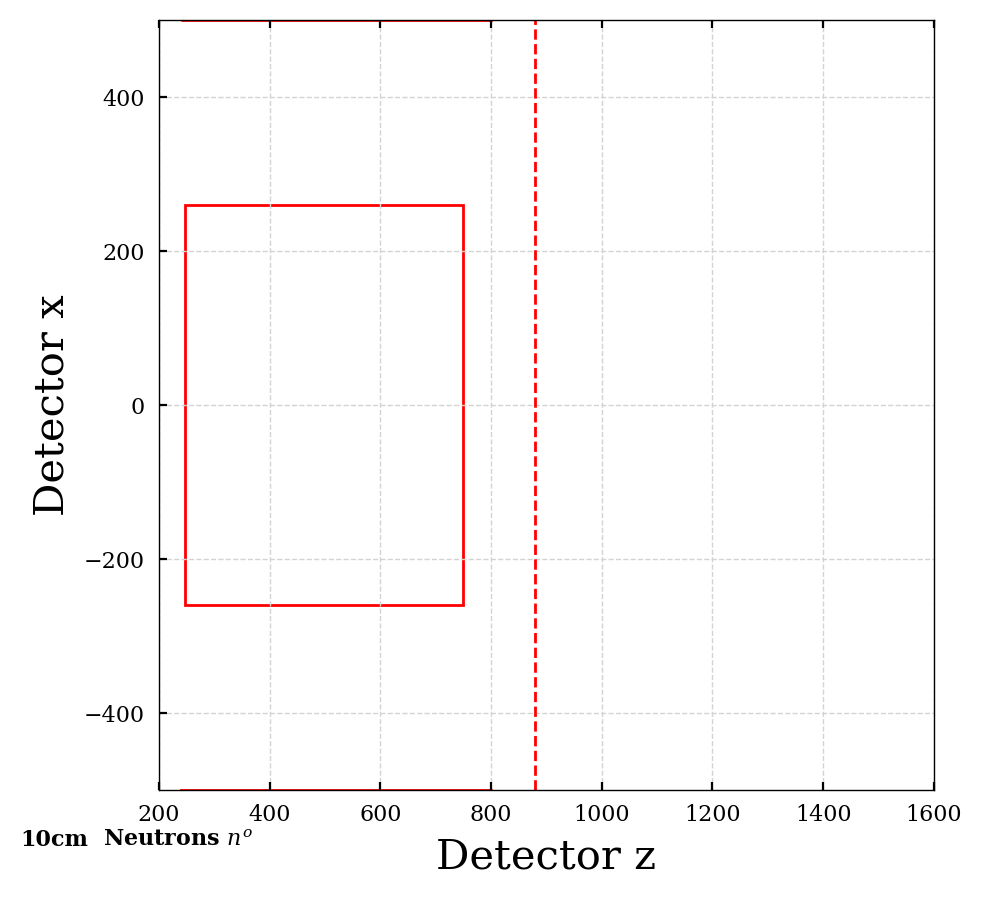

2


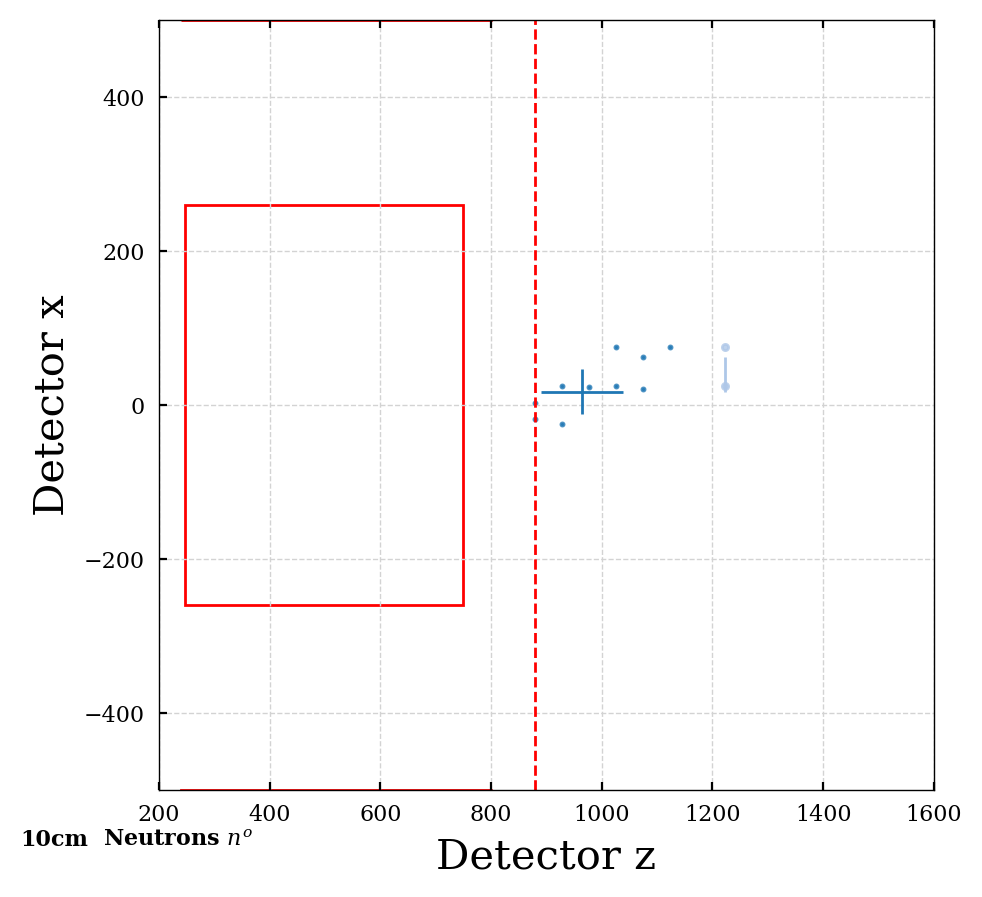

7


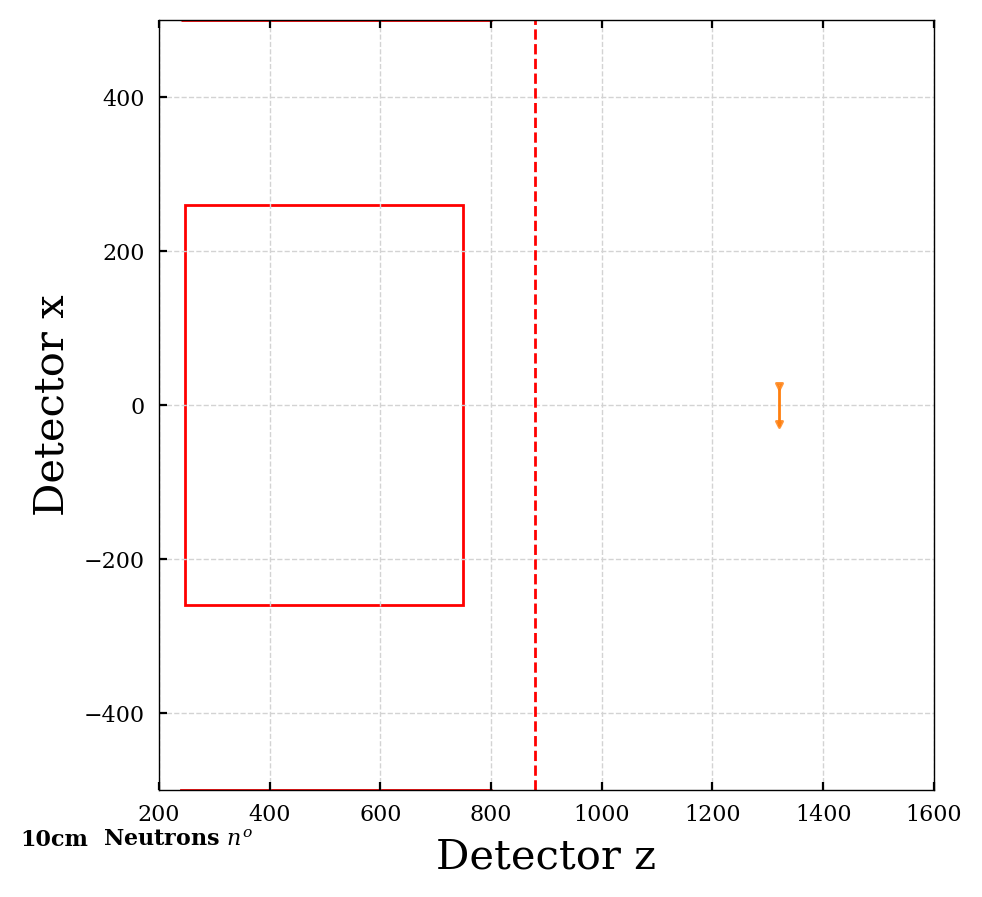

7


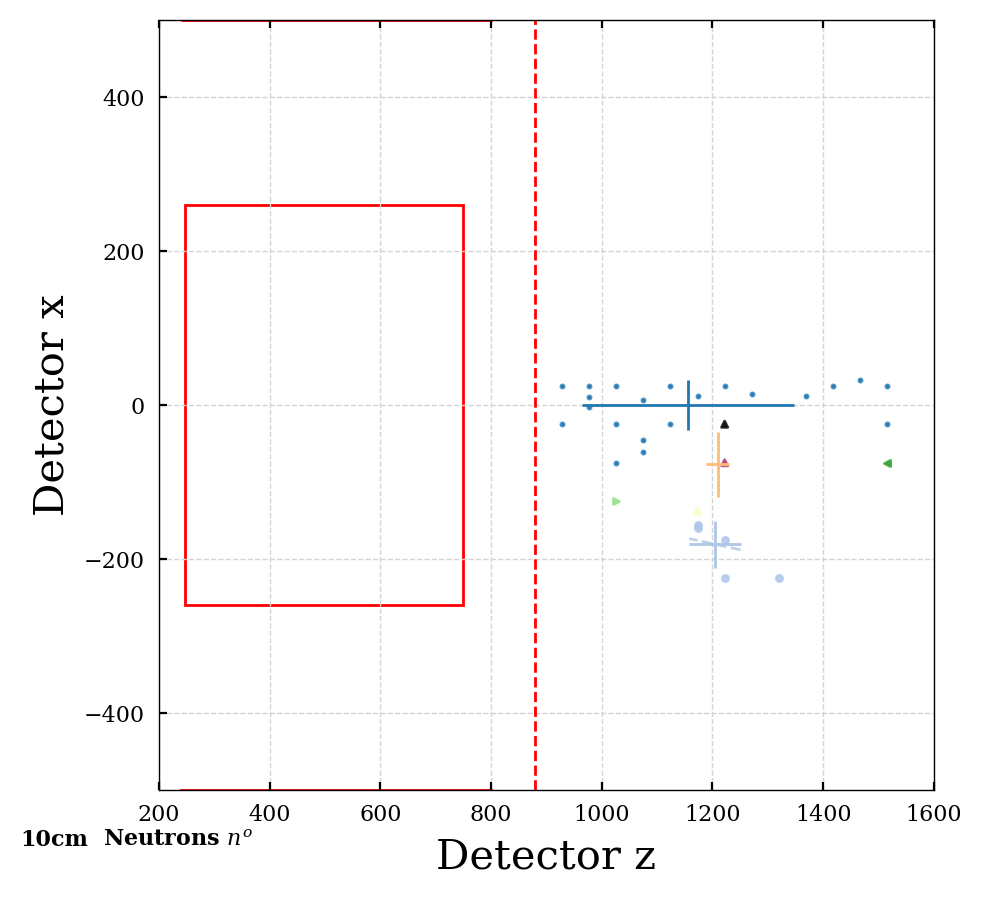

10


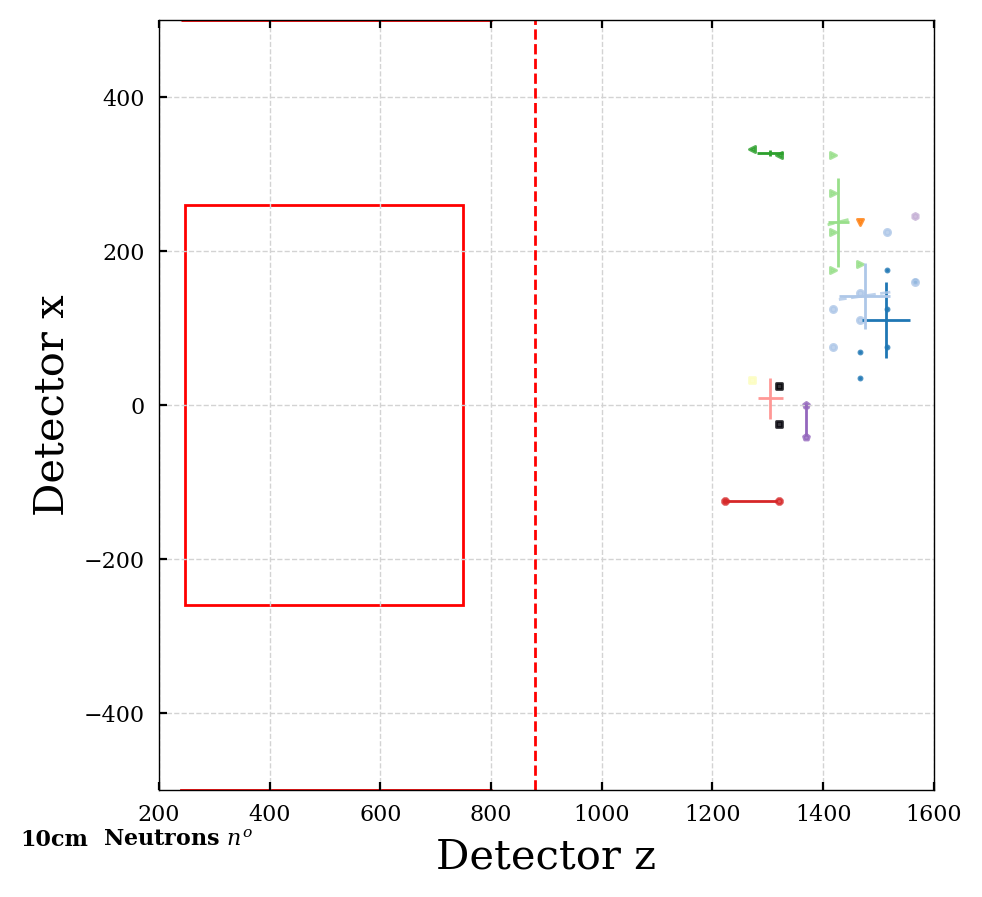

In [40]:
plot_cluster_dist(particles_dict_10cm, 10, spec_part='neutrons', ipart=None, xlim=3000, ylim=1500, angle_label=False)
# randomly select events
for ipart in np.random.randint(0, high=1e4, size=10, dtype=int):
    plot_cluster_dist(particles_dict_10cm, 10, spec_part='neutrons', ipart=ipart, xlim=1600, ylim=500, angle_label=False)

14


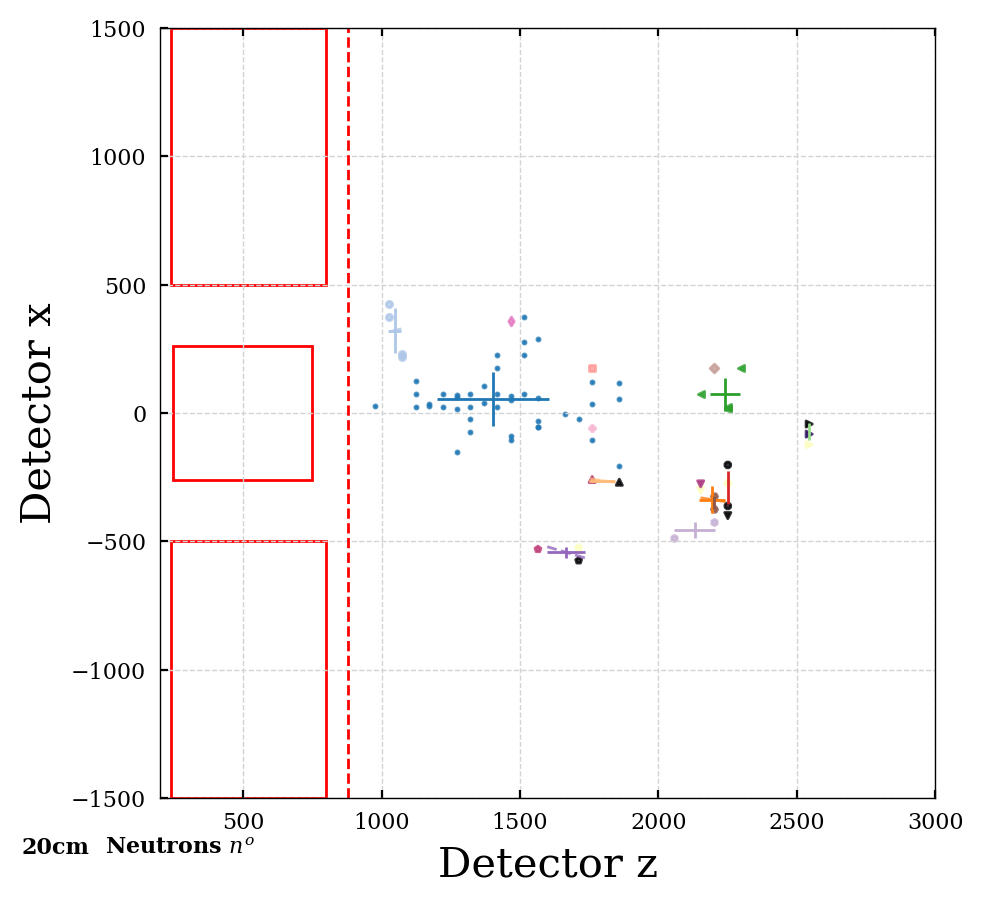

5


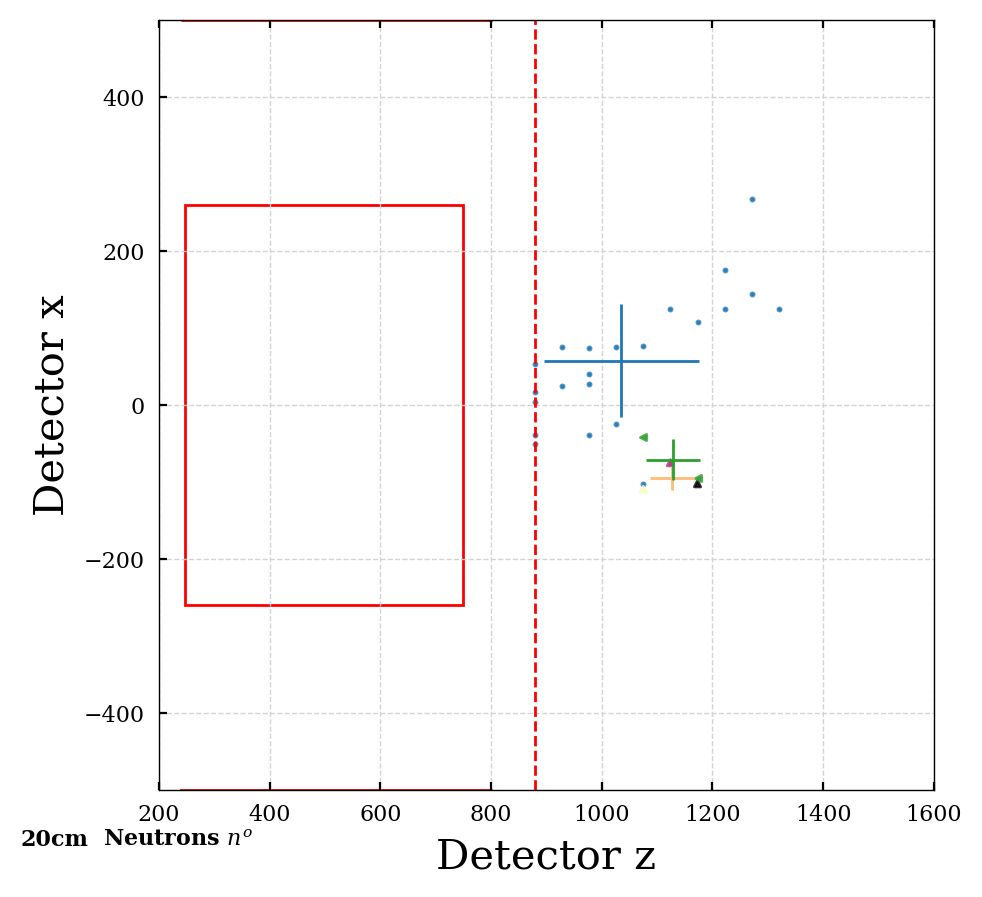

3


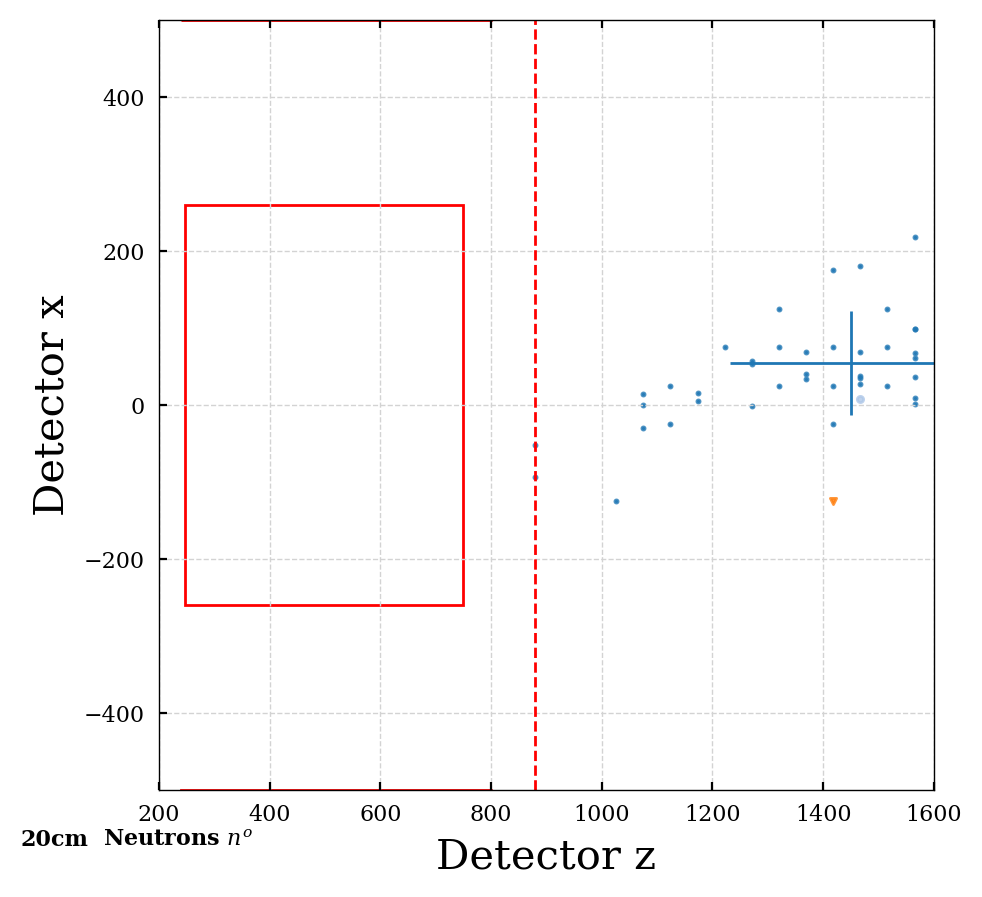

3


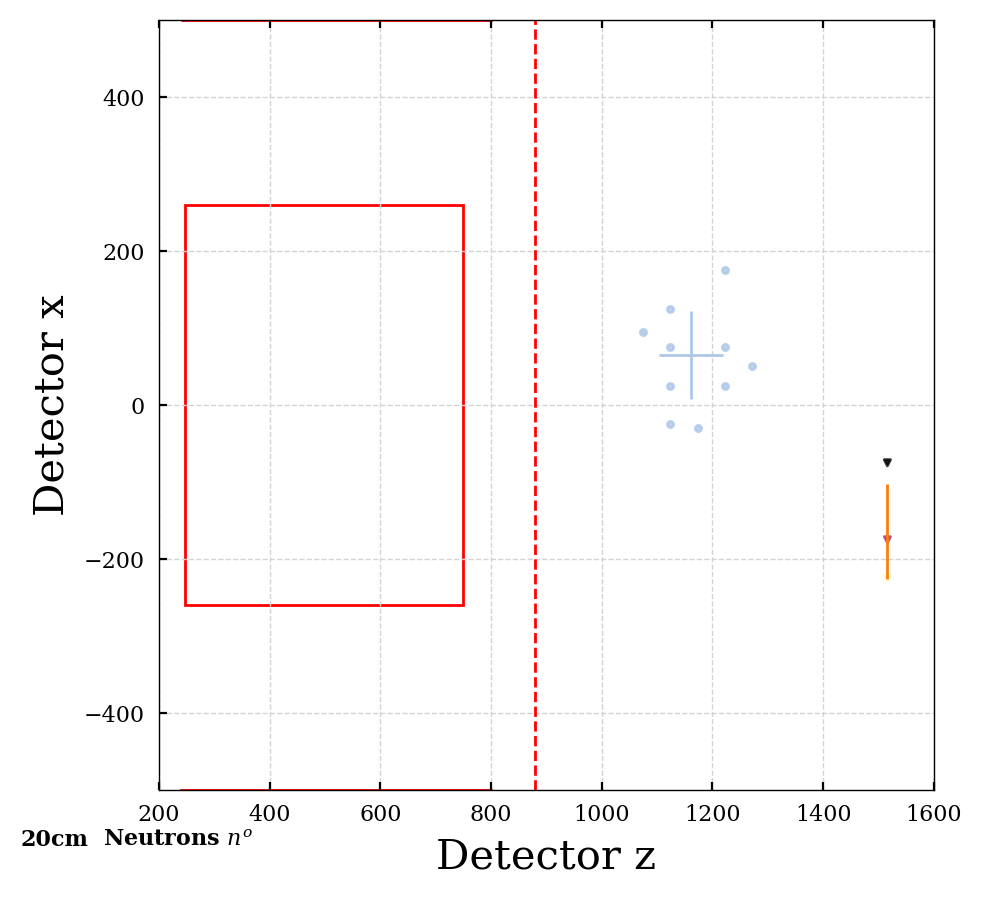

4


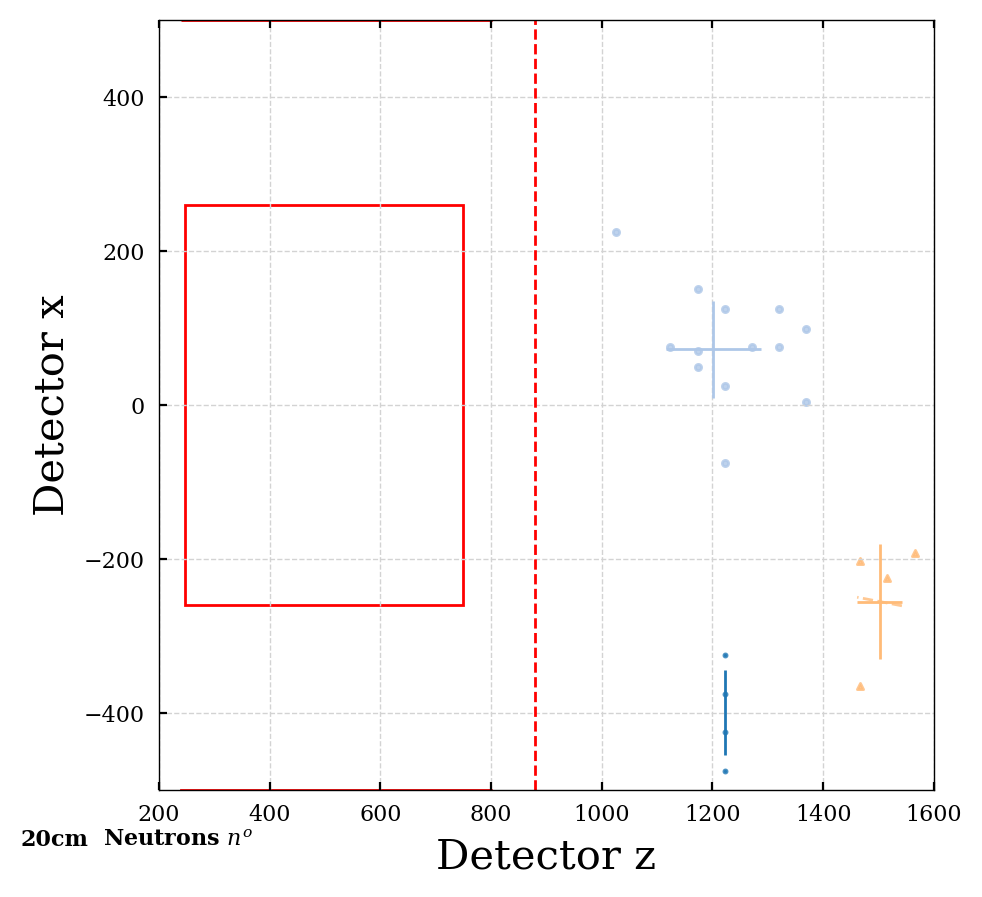

6


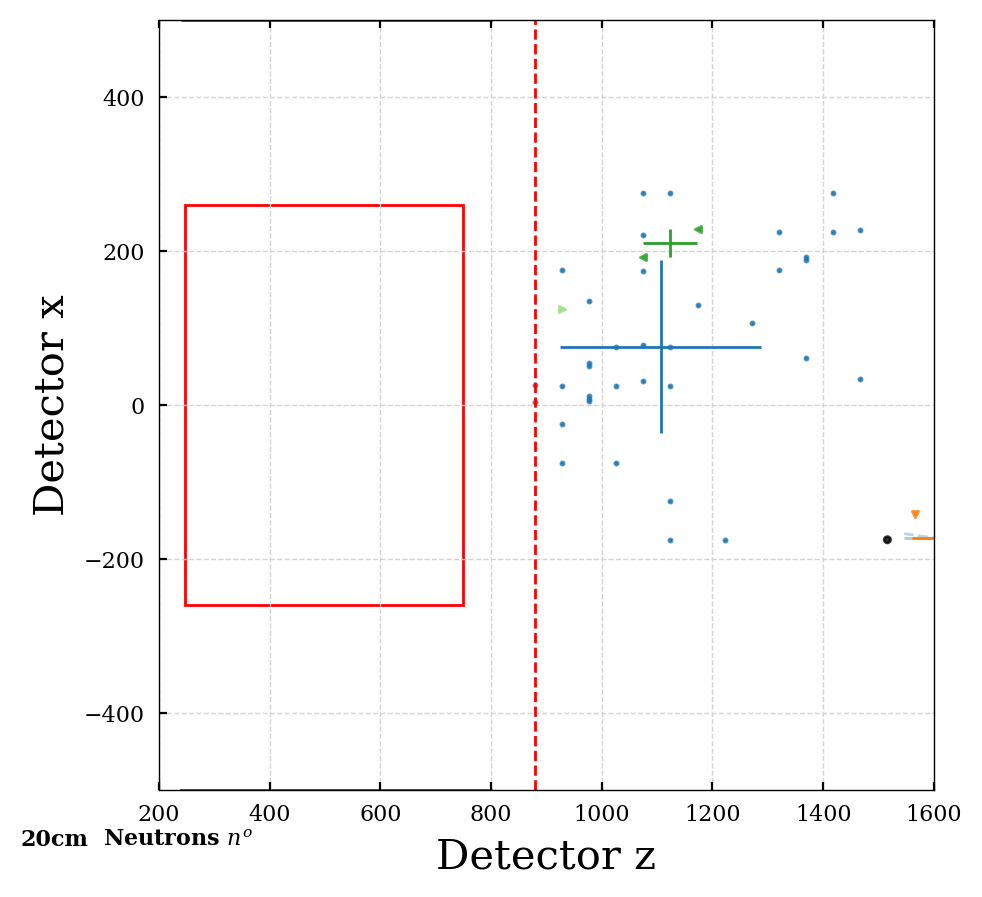

7


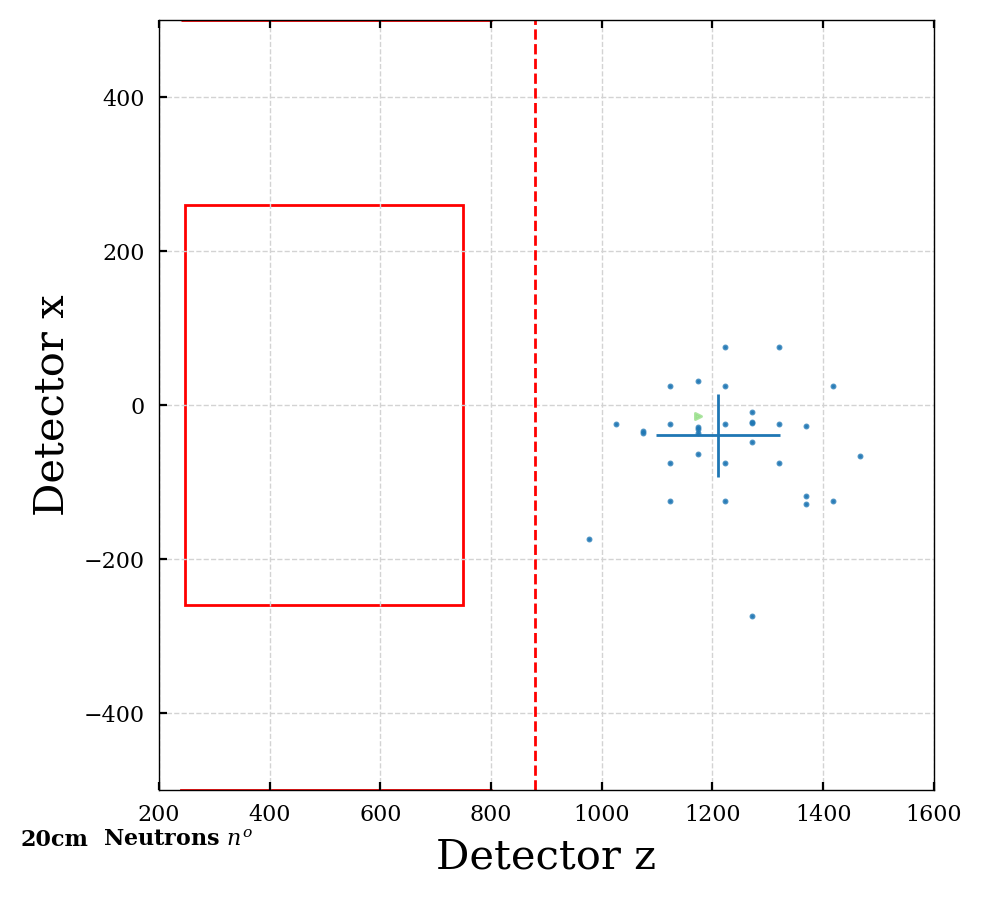

1


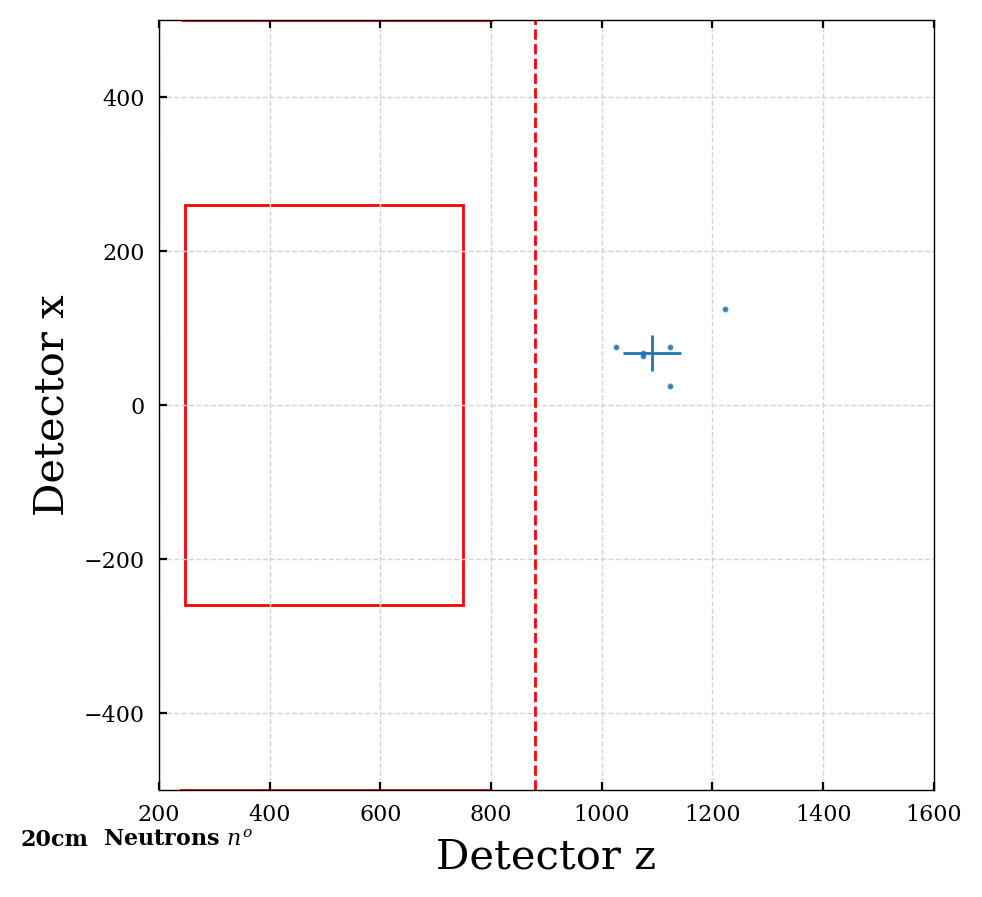

4


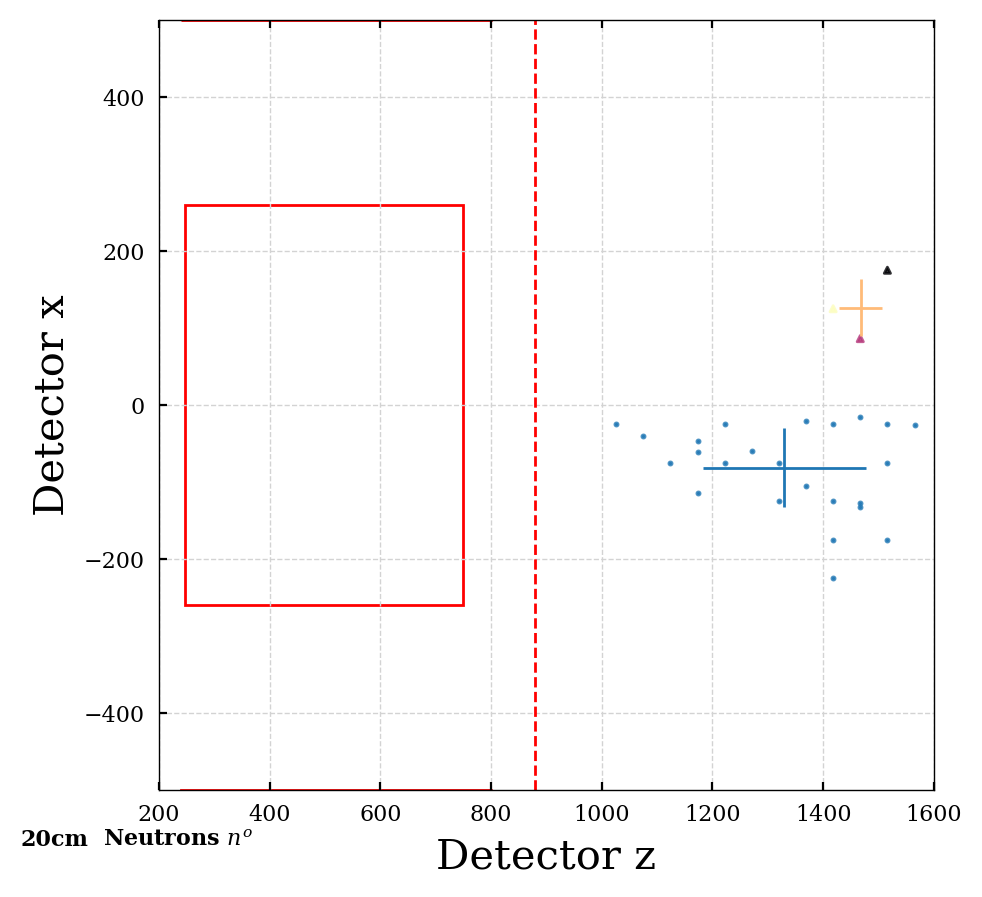

6


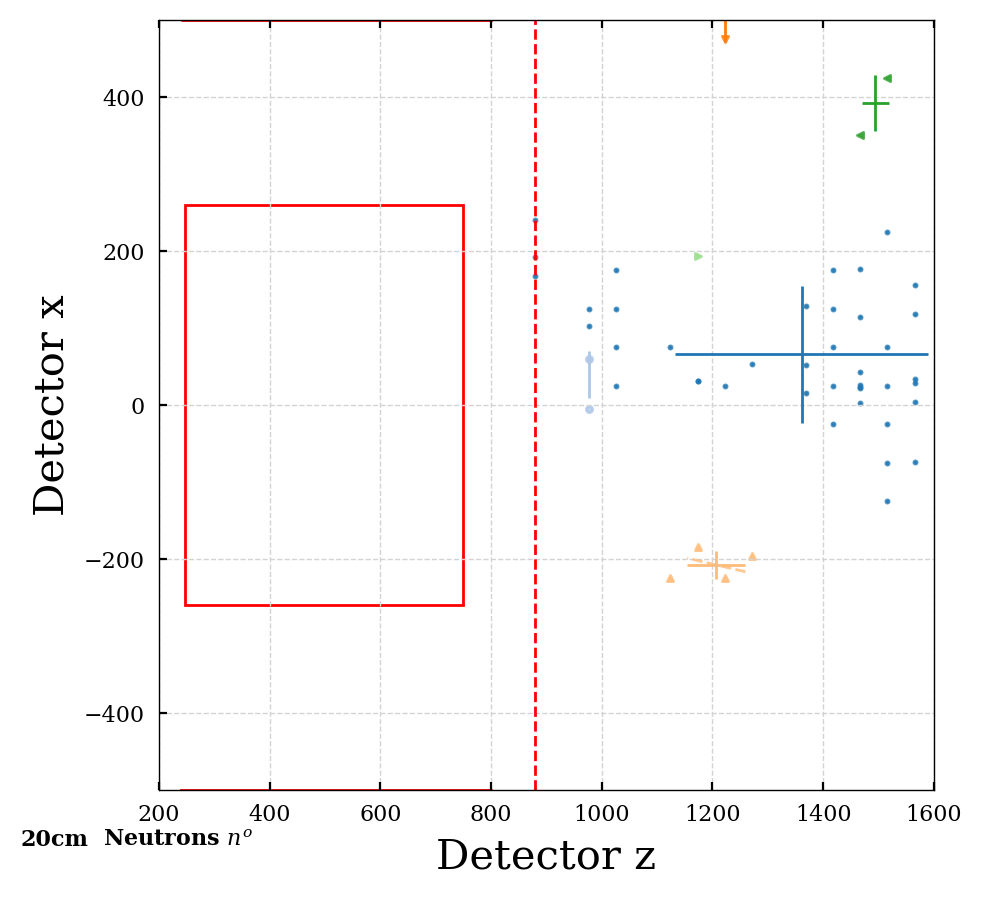

12


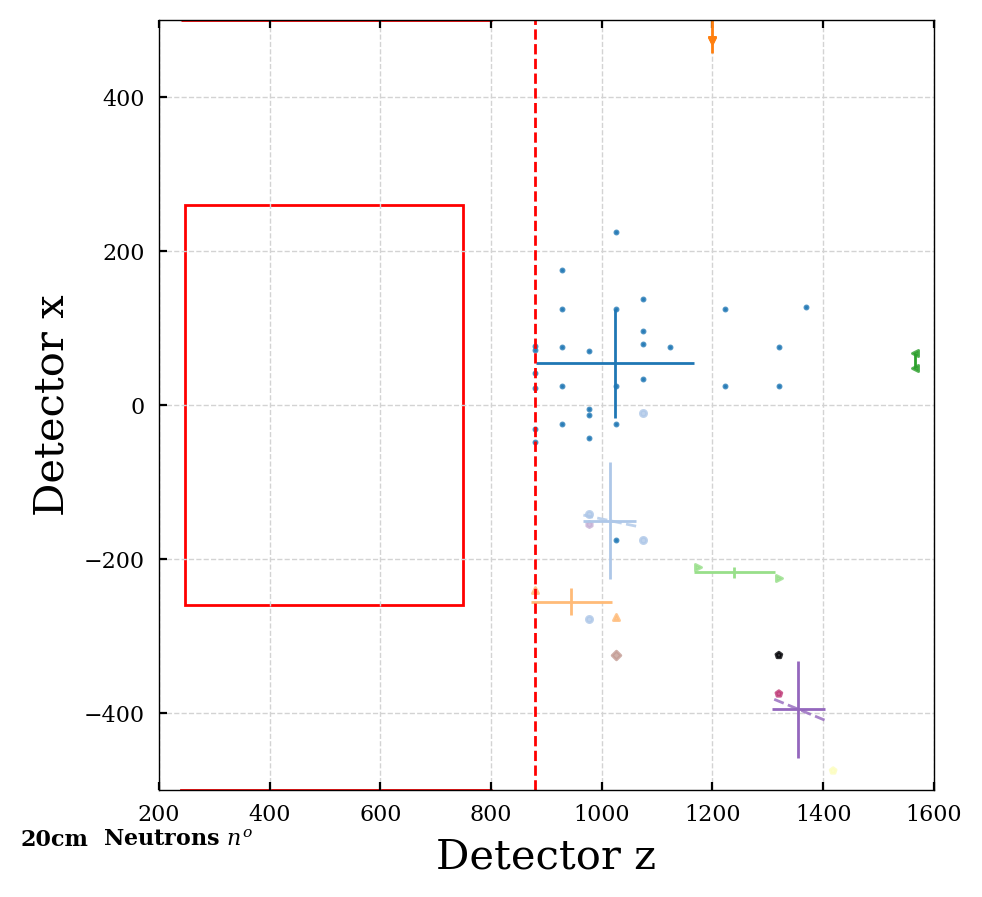

In [41]:
plot_cluster_dist(particles_dict_20cm, 20, spec_part='neutrons', ipart=None, xlim=3000, ylim=1500, angle_label=False)
# randomly select events
for ipart in np.random.randint(0, high=1e4, size=10, dtype=int):
    plot_cluster_dist(particles_dict_20cm, 20, spec_part='neutrons', ipart=ipart, xlim=1600, ylim=500, angle_label=False)

### Protons

17


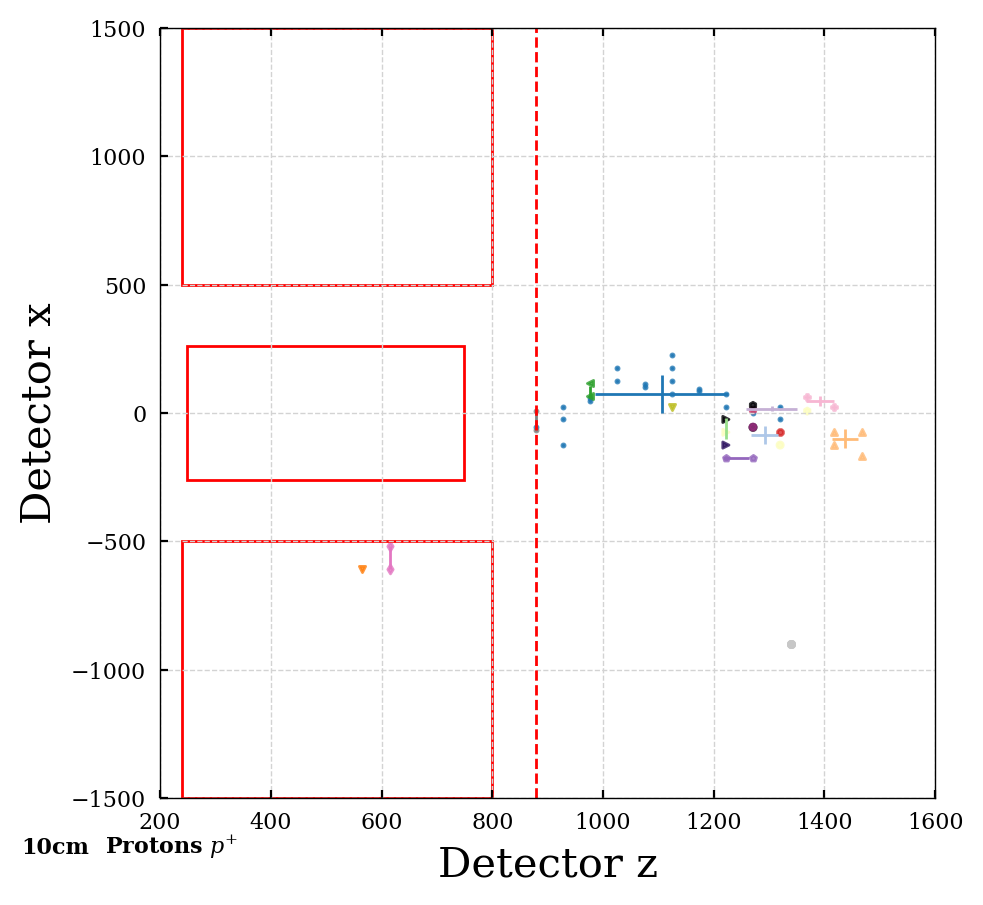

3


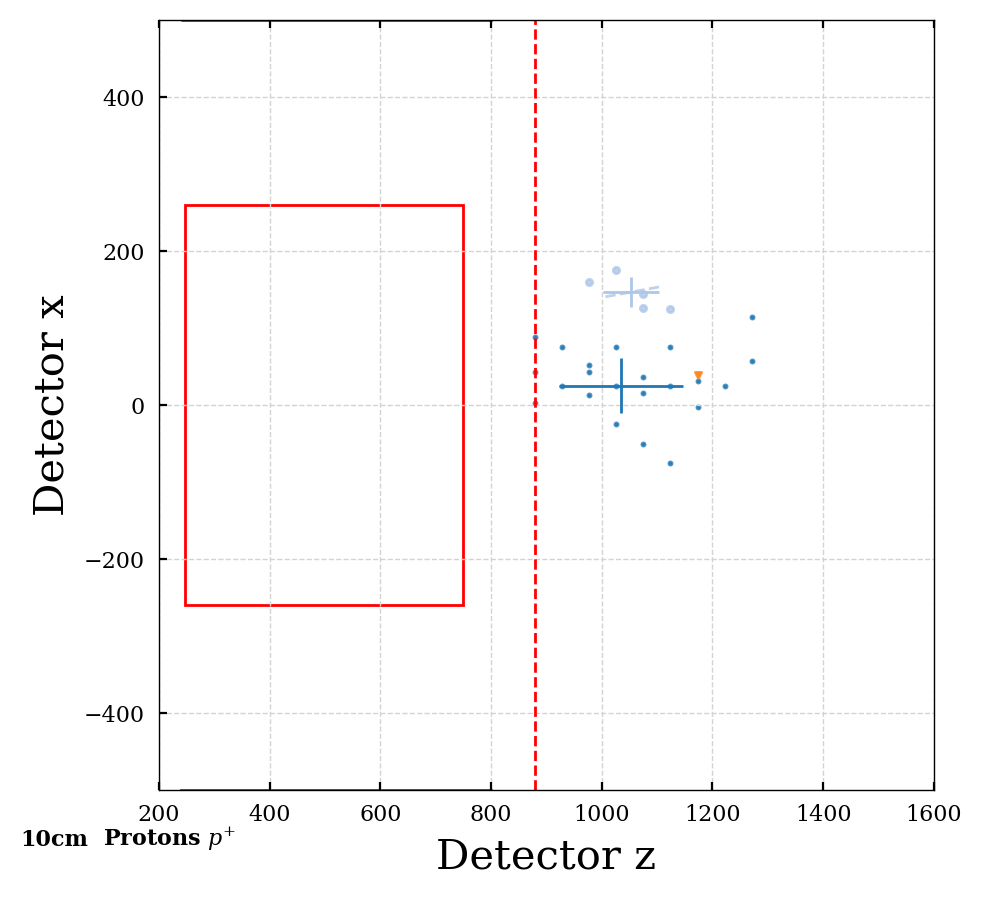

6


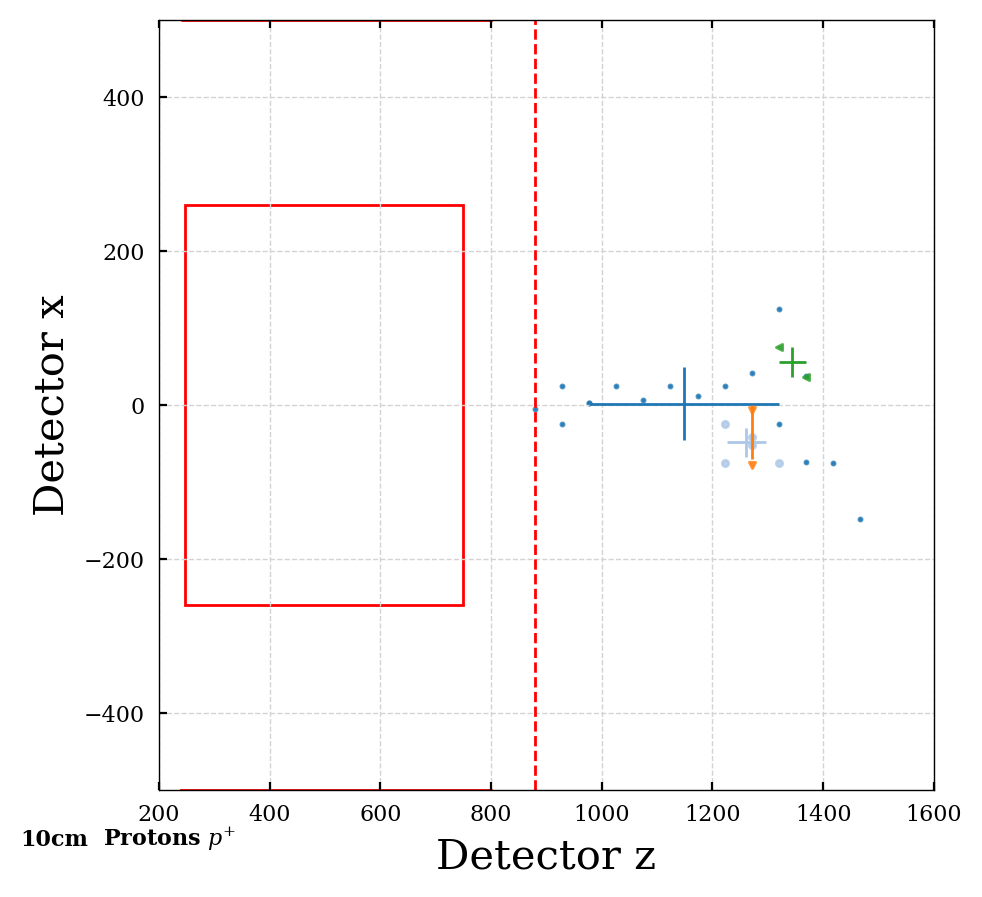

9


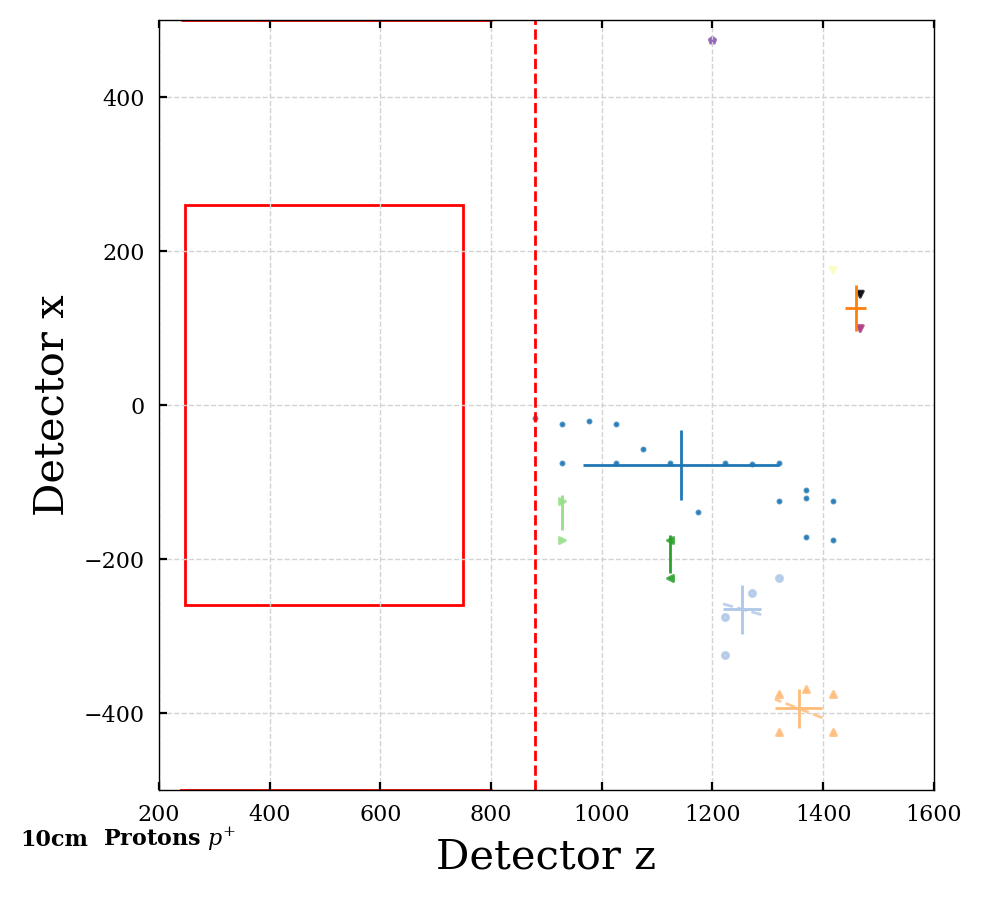

9


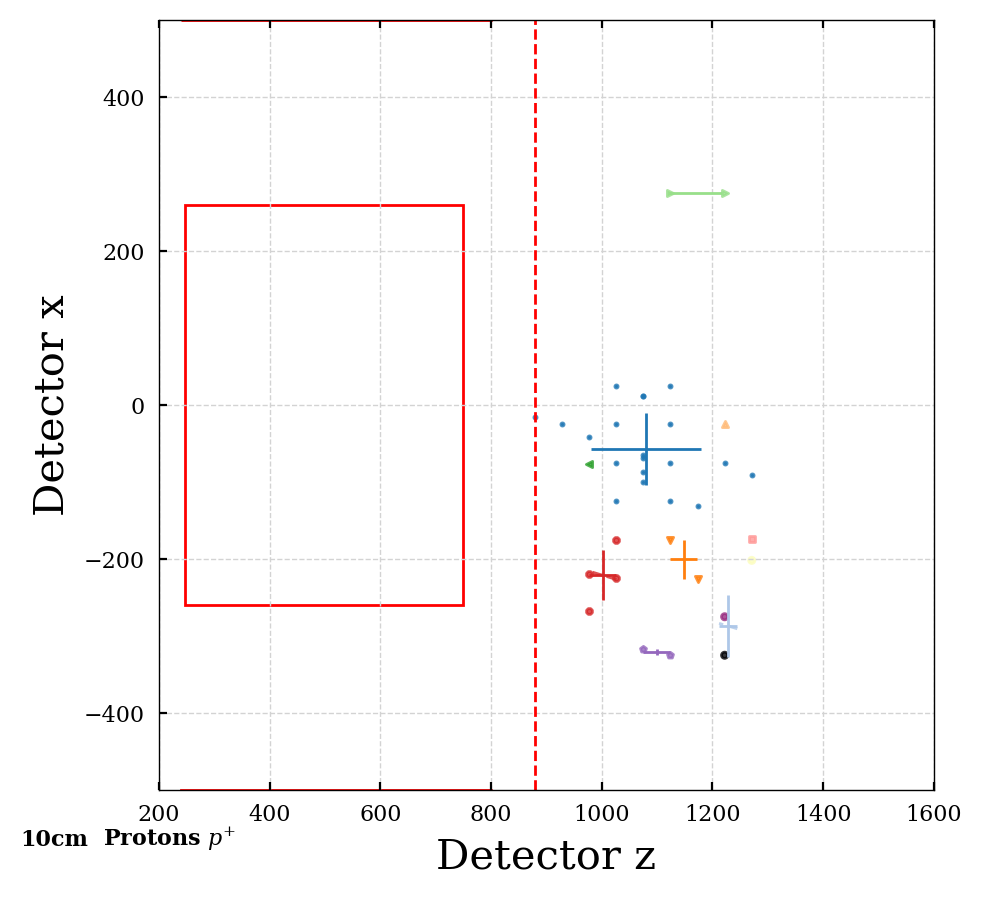

7


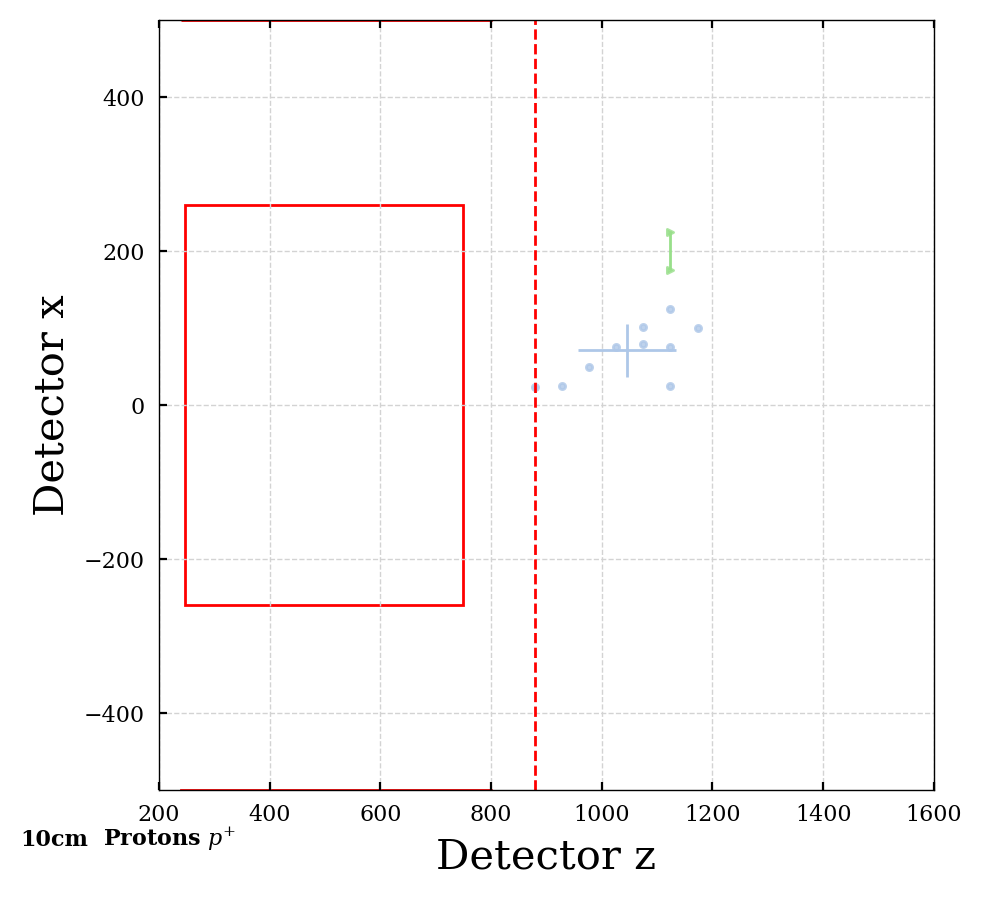

1


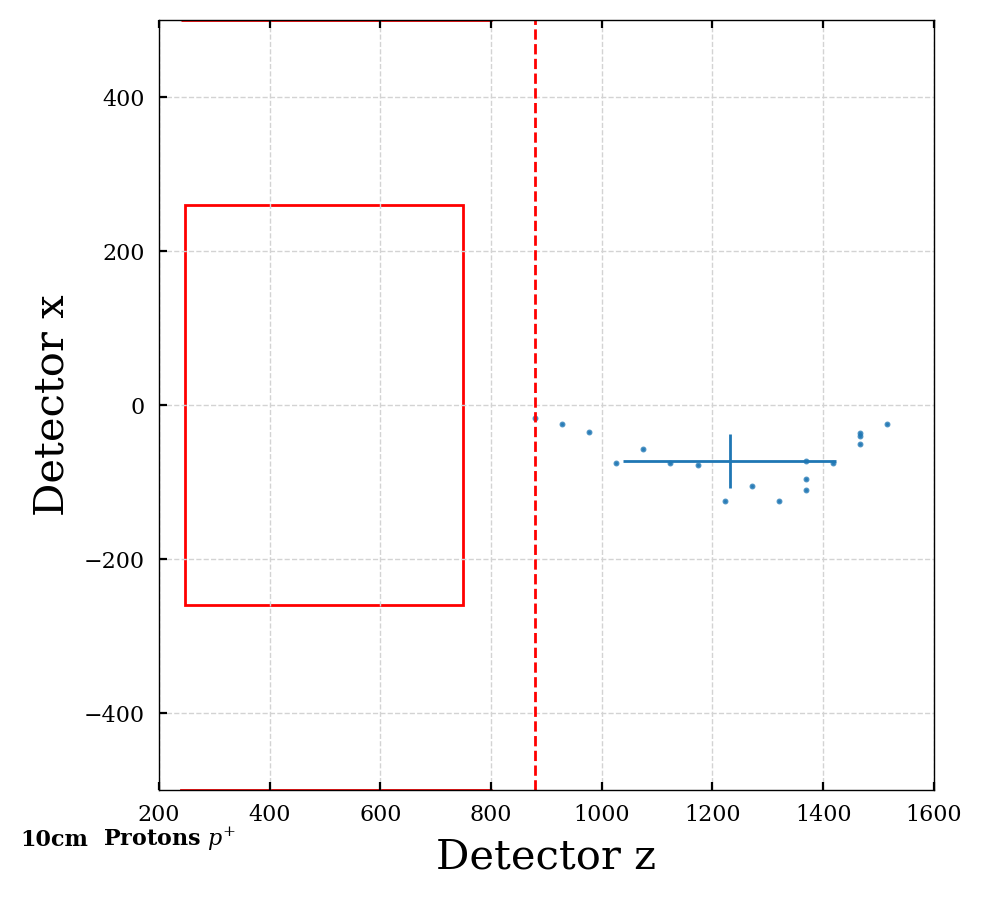

7


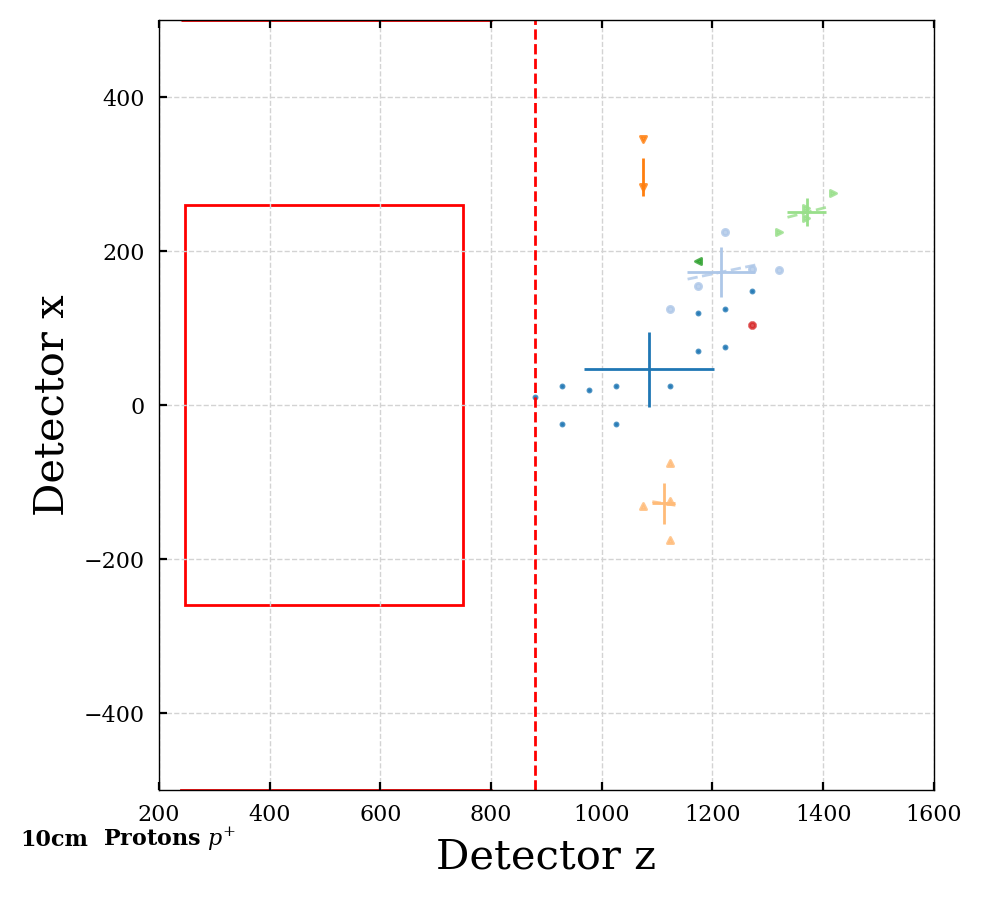

6


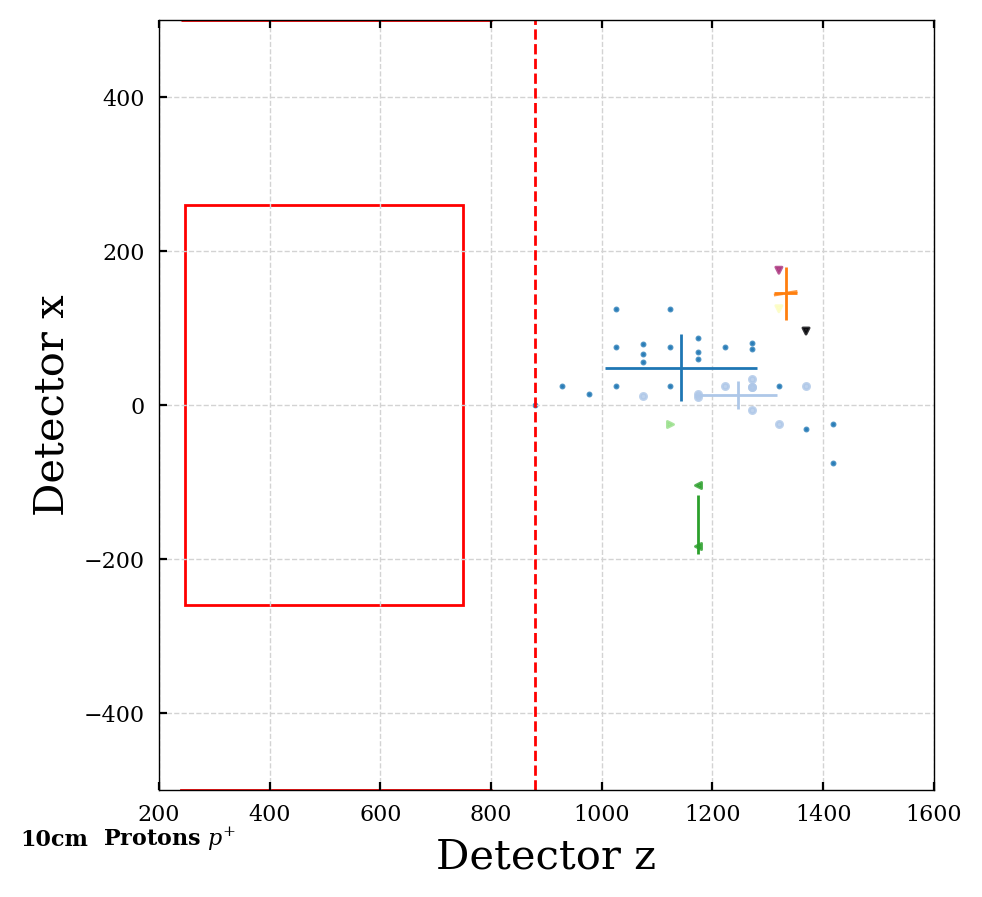

5


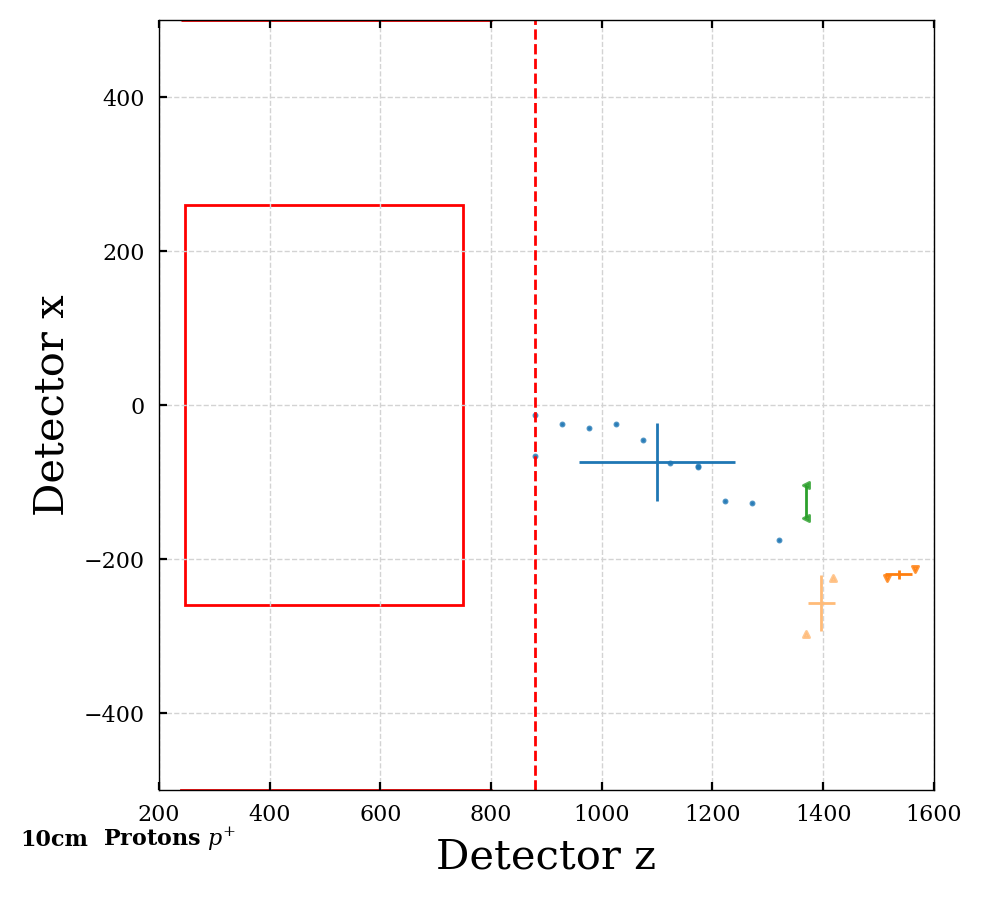

8


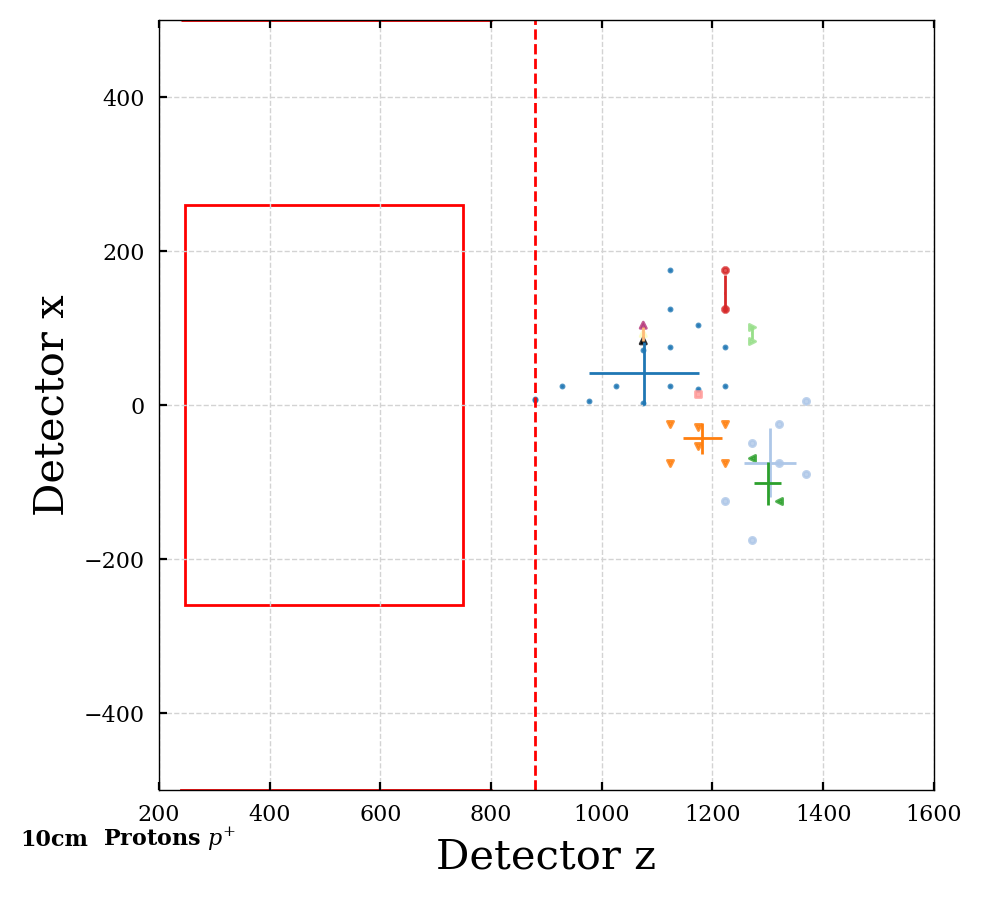

In [42]:
plot_cluster_dist(particles_dict_10cm, 10, spec_part='protons', ipart=None, xlim=1600, ylim=1500, angle_label=False)
# randomly select events
for ipart in np.random.randint(0, high=1e4, size=10, dtype=int):
    plot_cluster_dist(particles_dict_10cm, 10, spec_part='protons', ipart=ipart, xlim=1600, ylim=500, angle_label=False)

15


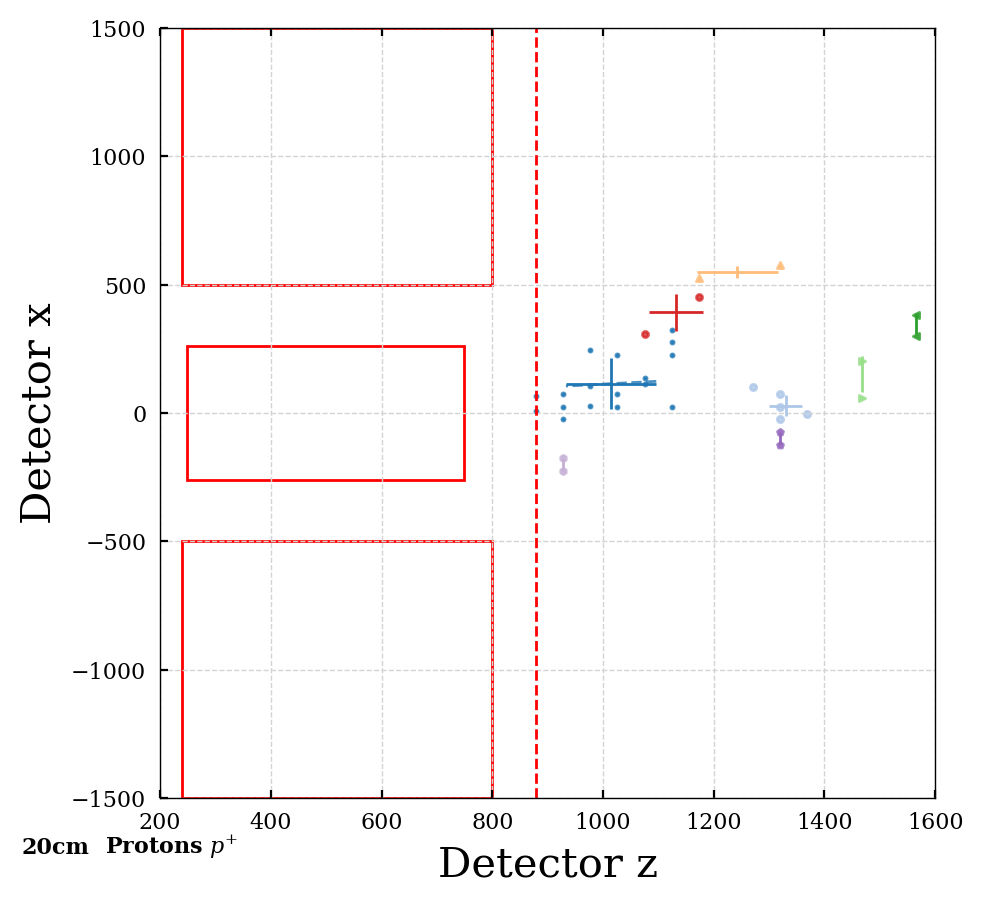

5


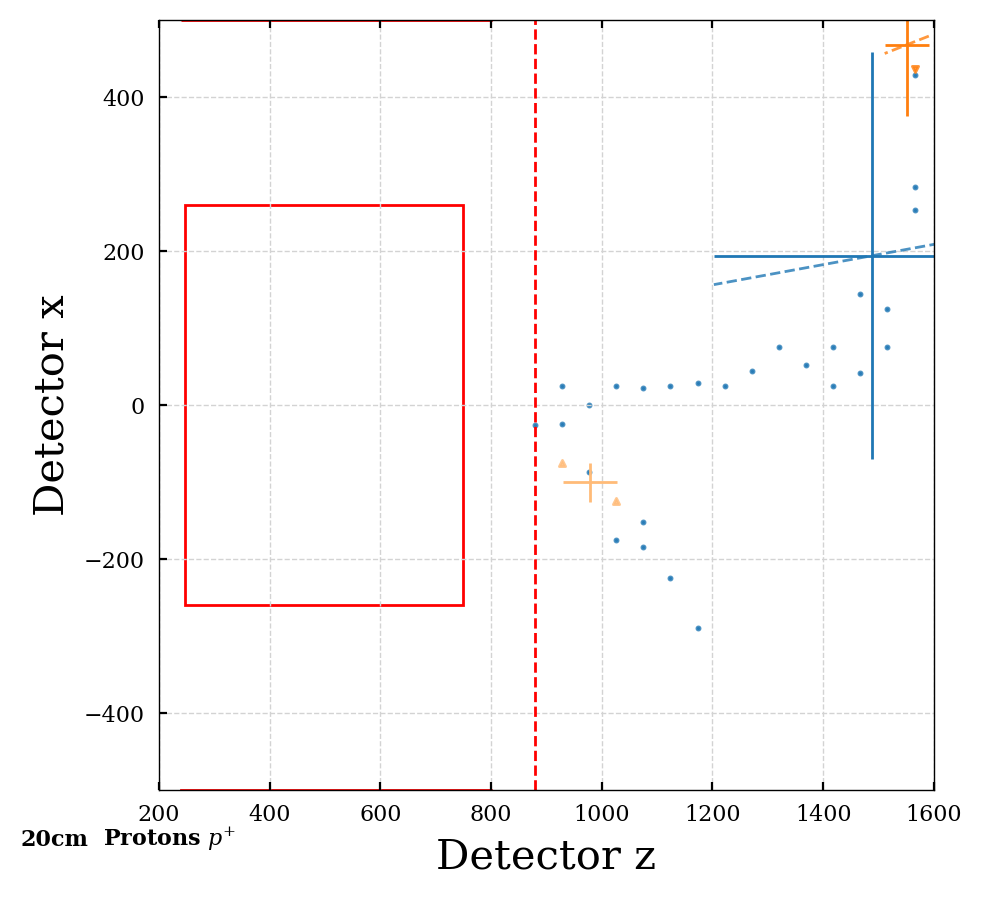

4


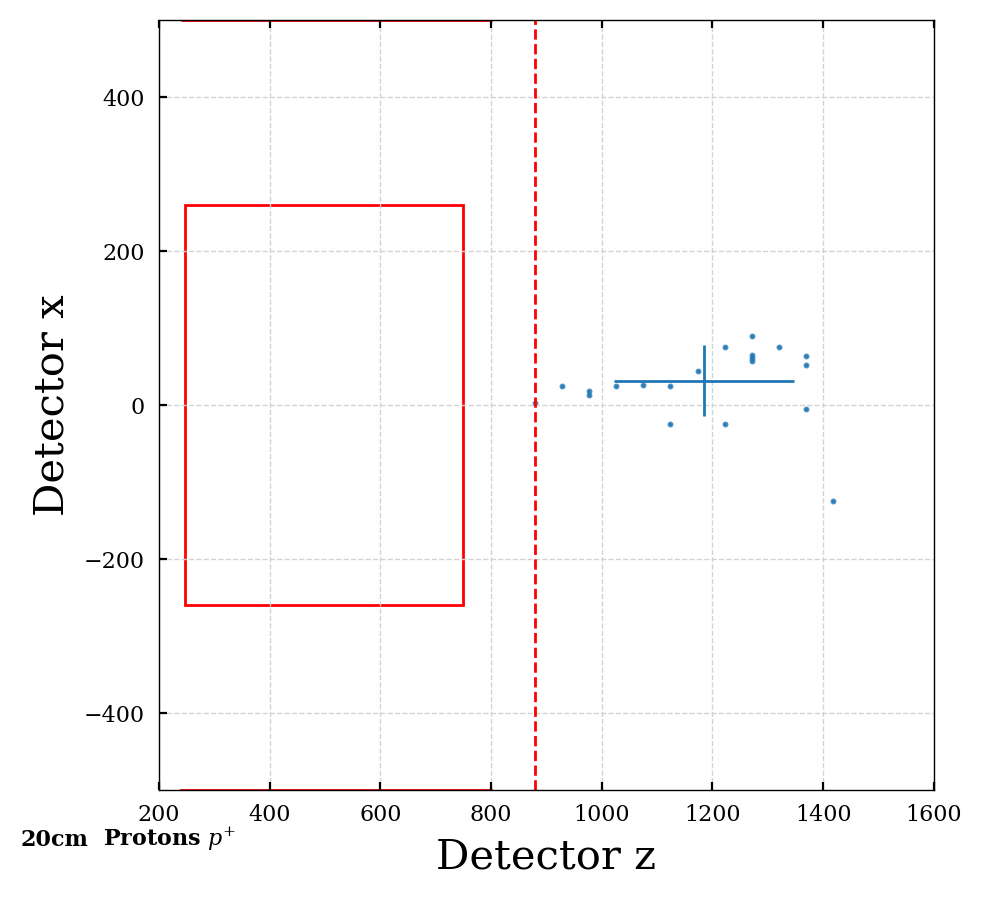

5


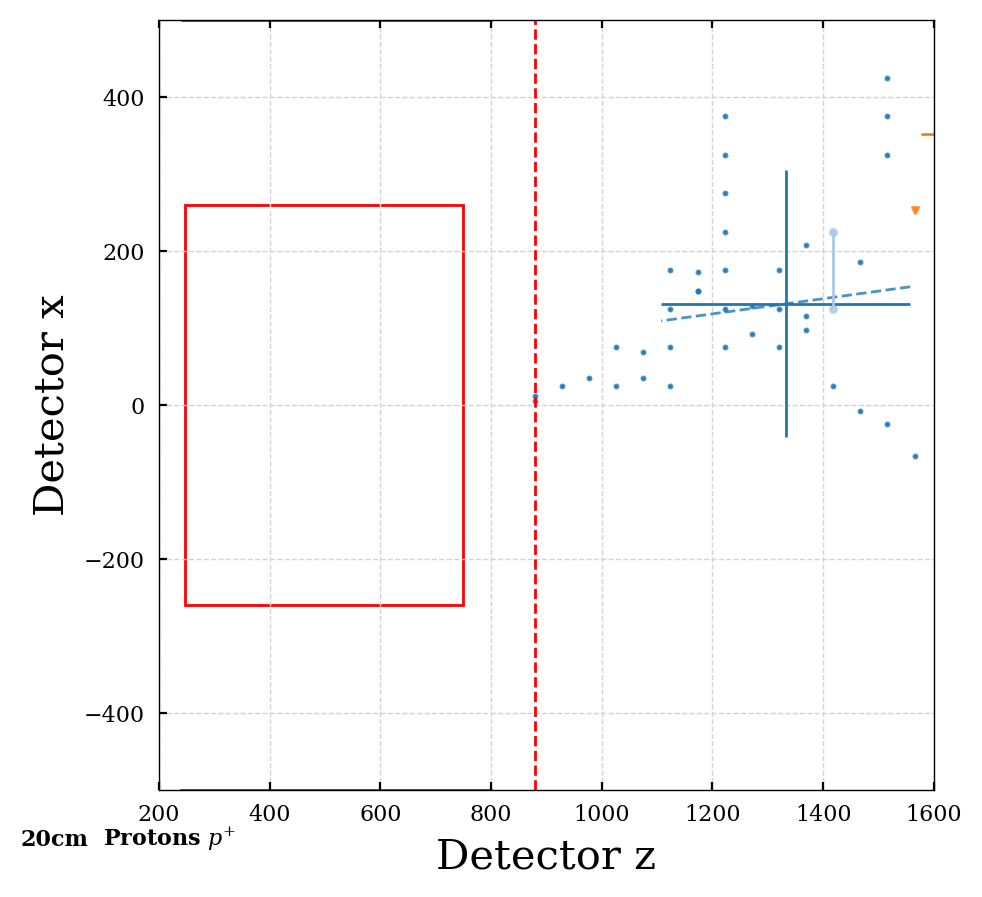

4


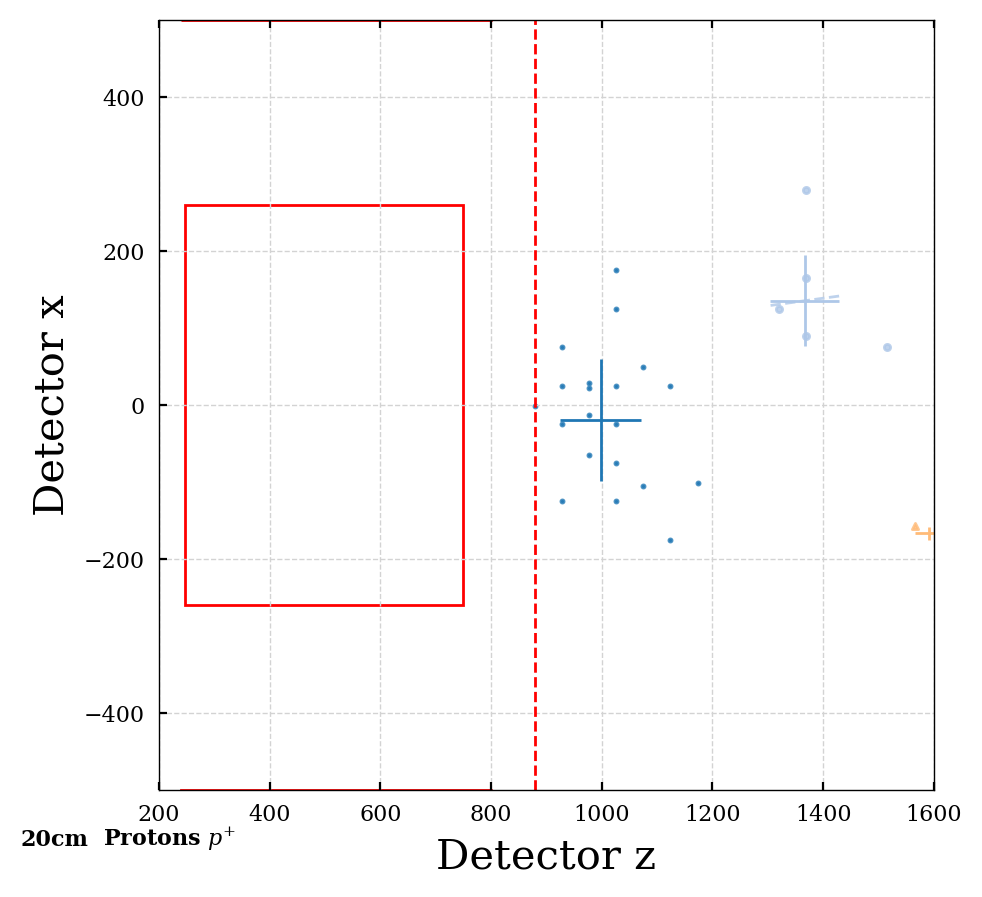

7


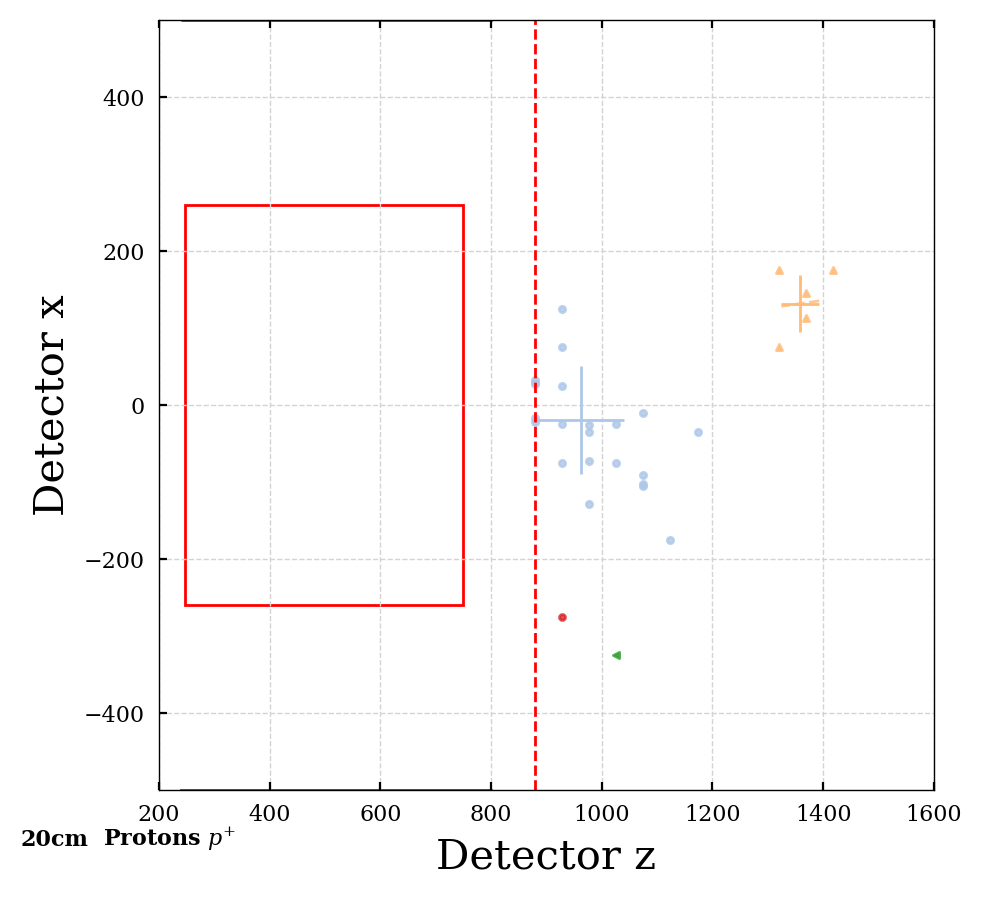

5


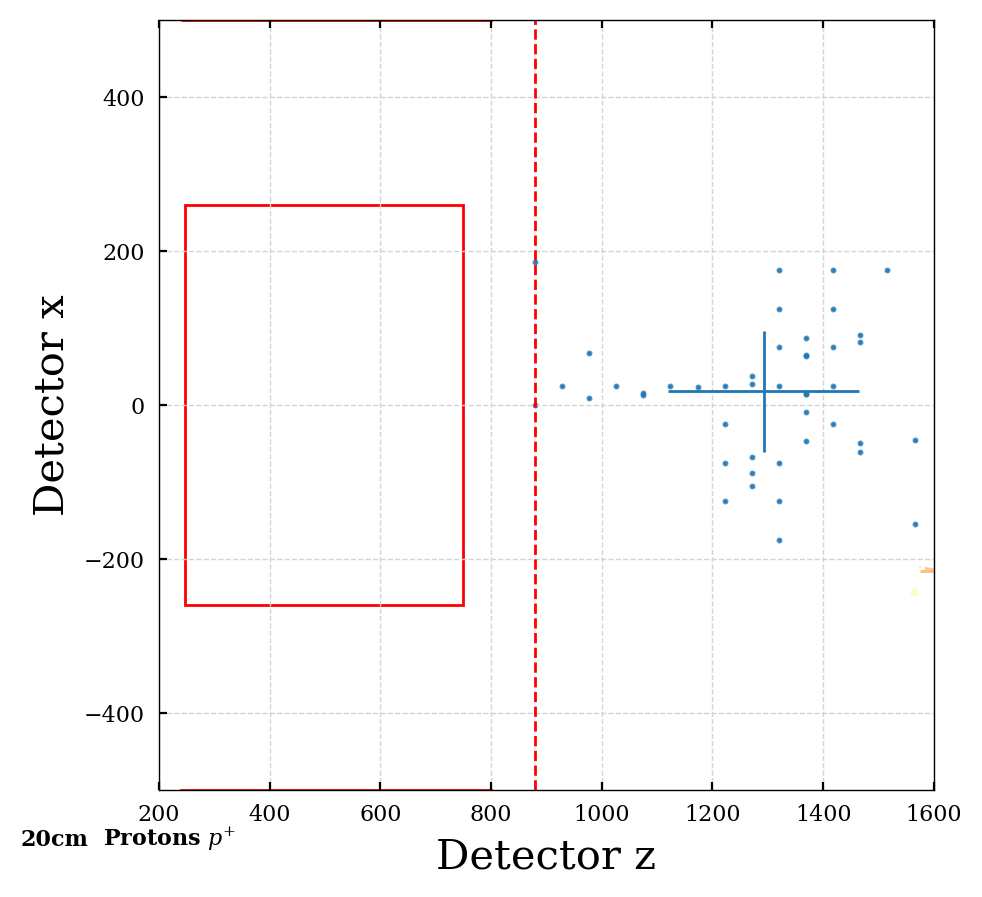

1


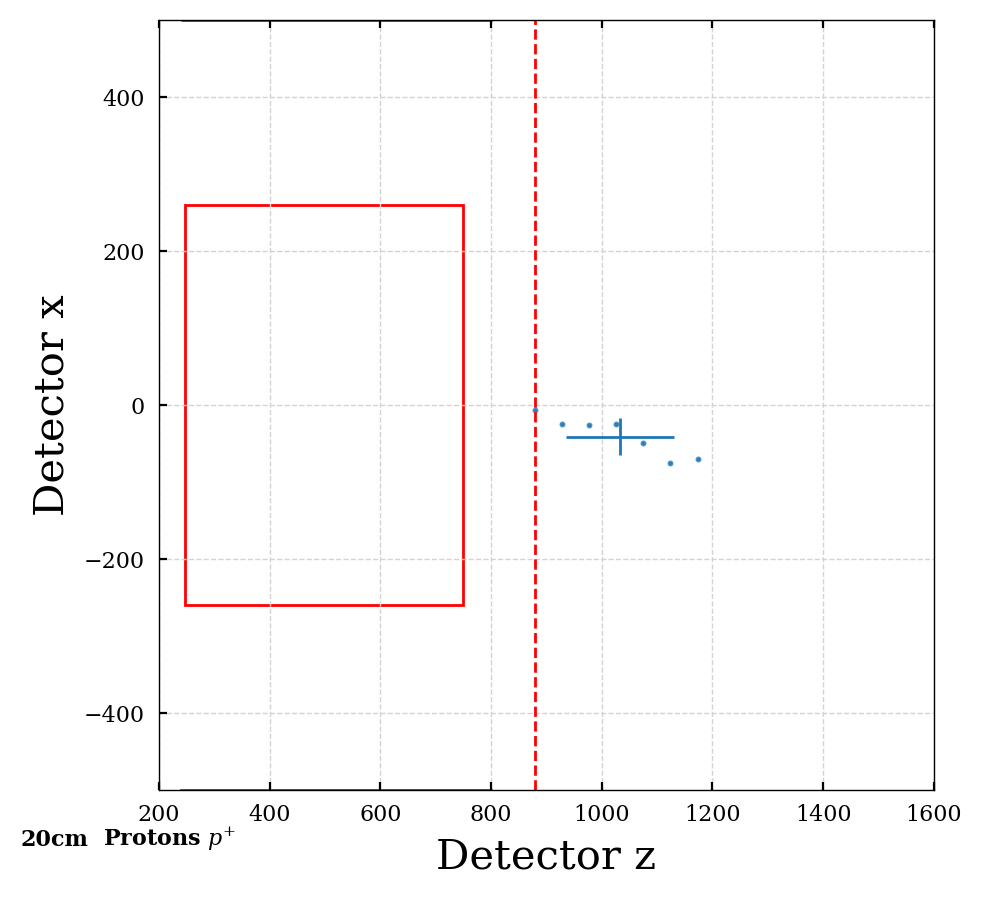

6


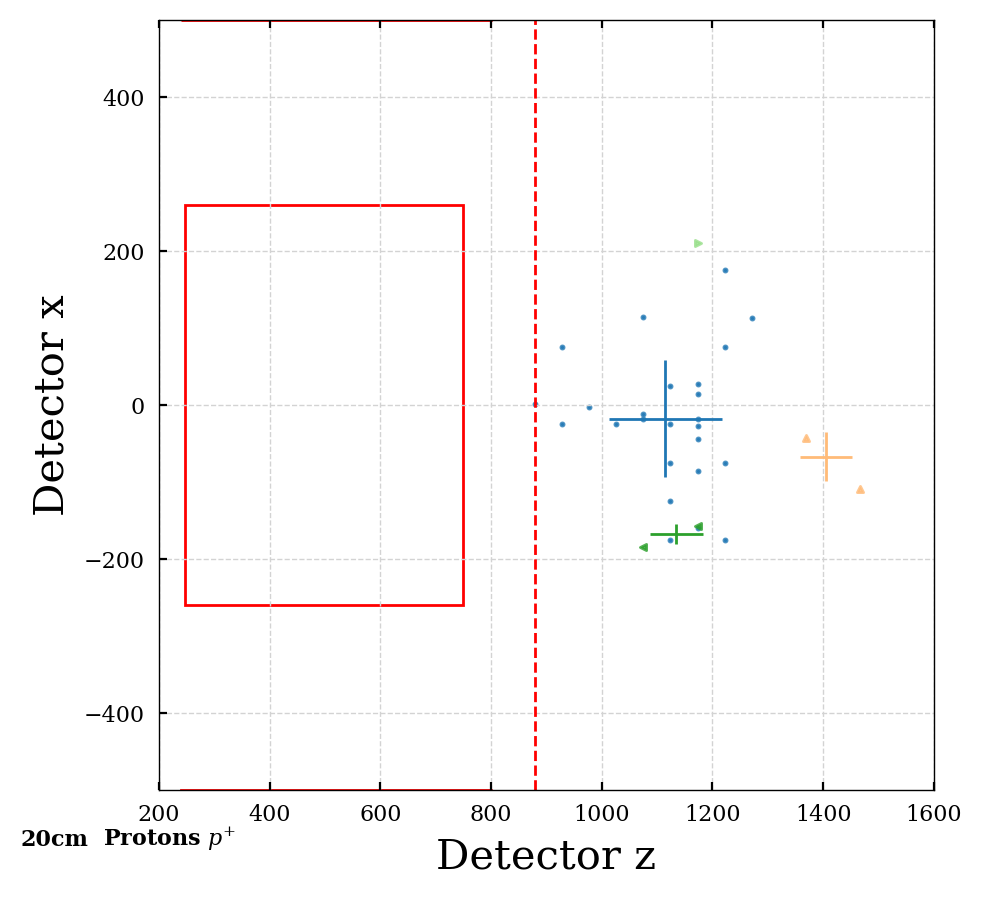

1


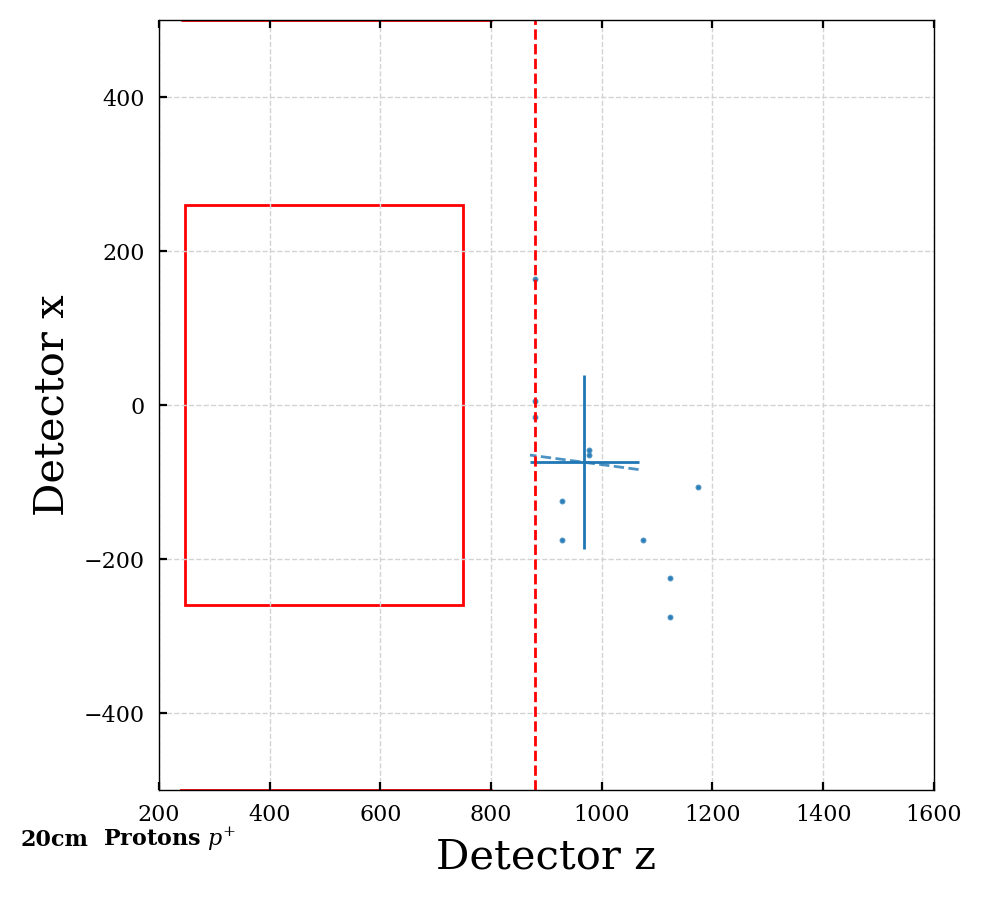

6


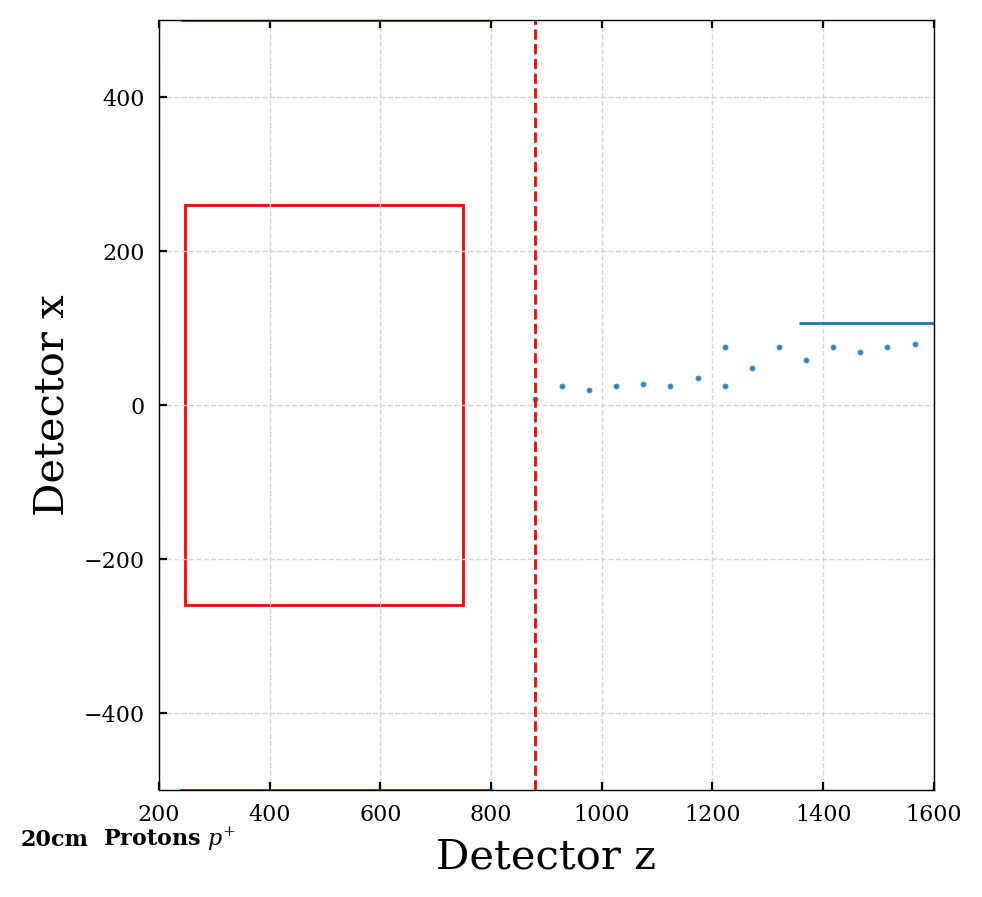

In [43]:
plot_cluster_dist(particles_dict_20cm, 20, spec_part='protons', ipart=None, xlim=1600, ylim=1500, angle_label=False)
# randomly select events
for ipart in np.random.randint(0, high=1e4, size=10, dtype=int):
    plot_cluster_dist(particles_dict_20cm, 20, spec_part='protons', ipart=ipart, xlim=1600, ylim=500, angle_label=False)